# Emulators: First example

This example illustrates Bayesian inference on a time series, using [Adaptive Covariance MCMC](http://pints.readthedocs.io/en/latest/mcmc_samplers/adaptive_covariance_mcmc.html) with emulator neural networks .

It follows on from [Sampling: First example](../sampling/first-example.ipynb)

Like in the sampling example, I start by importing pints:

In [1]:
import pints

C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\plagl\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passi

Next, I create a model class using the "Logistic" toy model included in pints:

In [2]:
import pints.toy as toy
model = toy.LogisticModel()

In order to generate some test data, I choose an arbitrary set of "true" parameters:

In [3]:
true_parameters = [0.015, 500]

And a number of time points at which to sample the time series:

In [4]:
import numpy as np
times = np.linspace(0, 1000, 400)

Using these parameters and time points, I generate an example dataset:

In [5]:
org_values = model.simulate(true_parameters, times)
range_values = max(org_values) - min(org_values)

And make it more realistic by adding gaussian noise:

In [6]:
noise = 0.05 * range_values
print("The noise is:", noise)
values = org_values + np.random.normal(0, noise, org_values.shape)

The noise is: 24.898095903089327


Using matplotlib, I look at the noisy time series I just simulated:

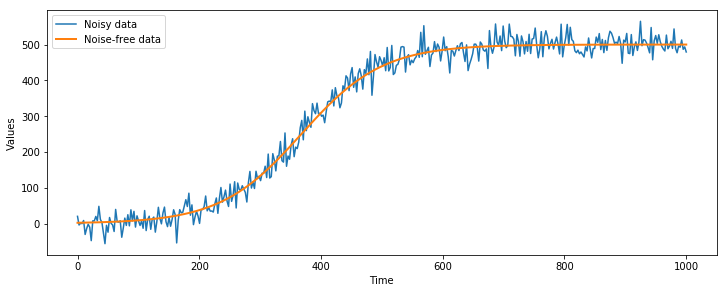

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,4.5))
plt.xlabel('Time')
plt.ylabel('Values')
plt.plot(times, values, label='Noisy data')
plt.plot(times, org_values, lw=2, label='Noise-free data')
plt.legend()
plt.show()

Now, I have enough data (a model, a list of times, and a list of values) to formulate a PINTS problem:

In [8]:
problem = pints.SingleOutputProblem(model, times, values)

I now have some toy data, and a model that can be used for forward simulations. To make it into a probabilistic problem, a _noise model_ needs to be added. This can be done using the `GaussianLogLikelihood` function, which assumes independently distributed Gaussian noise over the data, and can calculate log-likelihoods:

In [9]:
#log_likelihood = pints.GaussianLogLikelihood(problem)
log_likelihood = pints.GaussianKnownSigmaLogLikelihood(problem, noise)

This `log_likelihood` represents the _conditional probability_ $p(y|\theta)$, given a set of parameters $\theta$ and a series of $y=$ `values`, it can calculate the probability of finding those values if the real parameters are $\theta$.

This can be used in a Bayesian inference scheme to find the quantity of interest:

$p(\theta|y) = \frac{p(\theta)p(y|\theta)}{p(y)} \propto p(\theta)p(y|\theta)$

To solve this, a _prior_ is defined, indicating an initial guess about what the parameters should be. 
Similarly as using a _log-likelihood_ (the natural logarithm of a likelihood), this is defined by using a _log-prior_. Hence, the above equation simplifies to:

$\log p(\theta|y) \propto \log p(\theta) + \log p(y|\theta)$

In this example, it is assumed that we don't know too much about the prior except lower and upper bounds for each variable: We assume the first model parameter is somewhere on the interval $[0.01, 0.02]$, the second model parameter on $[400, 600]$, and the standard deviation of the noise is somewhere on $[1, 100]$.

In [10]:
# Create bounds for our parameters and get prior
bounds = pints.RectangularBoundaries([0.01, 400], [0.02, 600])
log_prior = pints.UniformLogPrior(bounds)

With this prior, the numerator of Bayes' rule can be defined -- the unnormalised log posterior, $\log \left[ p(y|\theta) p(\theta) \right]$, which is the natural logarithm of the likelihood times the prior:

In [11]:
# Create a posterior log-likelihood (log(likelihood * prior))
log_posterior = pints.LogPosterior(log_likelihood, log_prior)

Finally we create a list of guesses to use as initial positions. We'll run three MCMC chains so we create three initial positions:

In [12]:
xs = [
    np.array(true_parameters) * 0.9,
    np.array(true_parameters) * 1.05,
    np.array(true_parameters) * 1.15,
]

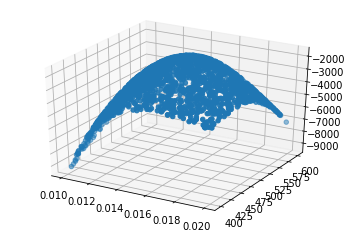

In [13]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

input_parameters = log_prior.sample(2000)
x = [p[0] for p in input_parameters]
y = [p[1] for p in input_parameters]

likelihoods = np.apply_along_axis(log_likelihood, 1, input_parameters)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, list(likelihoods))
plt.show()

In [14]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(input_parameters, likelihoods, test_size=0.3, random_state=0)
emu = pints.MultiLayerNN(problem, X_train, y_train, input_scaler=MinMaxScaler(), output_scaler=StandardScaler())
emu.set_parameters(layers=12, neurons=64, hidden_activation='relu', activation='linear', learning_rate=0.0001)
hist = emu.fit(epochs=250, batch_size=32, X_val=X_valid, y_val=y_valid, verbose=0)
emu.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                192       
_________________________________________________________________
dense_2 (Dense)              (None, 128)               8320      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_4 (Dense)              (None, 512)               131584    
_________________________________________________________________
dense_5 (Dense)              (None, 1024)              525312    
_________________________________________________________________
dense_6 (Dense)              (None, 2048)              2099200   
_________________________________________________________________
dense_7 (Dense)              (None, 1024)              2098176   
__________

In [15]:
emu([0.015, 500])

array([[-1951.7605]], dtype=float32)

In [16]:
log_likelihood([0.015, 500])

-1855.2114087316252

dict_keys(['val_loss', 'val_mean_absolute_error', 'loss', 'mean_absolute_error', 'rescaled_mae', 'rescaled_mse', 'val_rescaled_mae', 'val_rescaled_mse'])


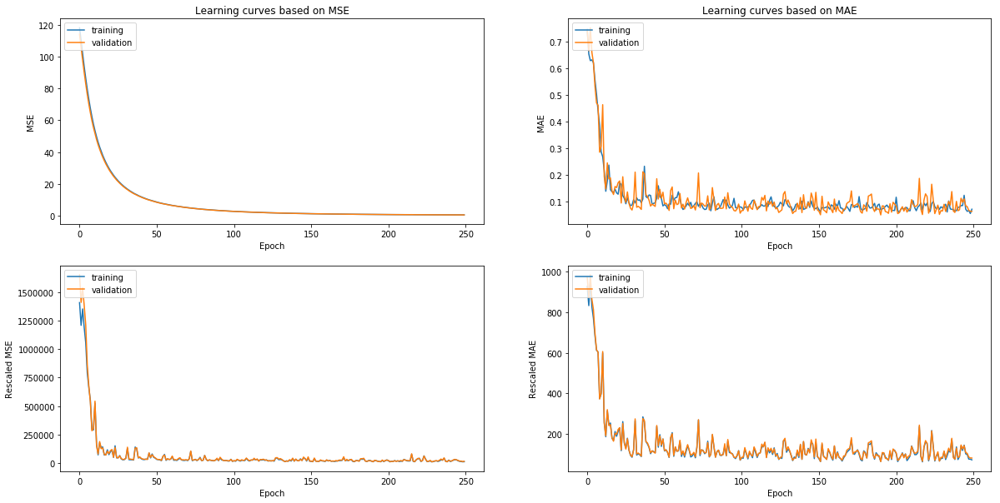

In [17]:
# summarize history for loss
print(hist.history.keys())
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20,10))                 
ax1.title.set_text('Learning curves based on MSE')
ax2.title.set_text('Learning curves based on MAE')

ax1.plot(hist.history['loss'])
ax1.plot(hist.history['val_loss'])
ax1.set_ylabel('MSE')
ax1.set_xlabel('Epoch')
ax1.legend(['training', 'validation'], loc='upper left')

ax2.plot(hist.history['mean_absolute_error'])
ax2.plot(hist.history['val_mean_absolute_error'])
ax2.set_ylabel('MAE')
ax2.set_xlabel('Epoch')
ax2.legend(['training', 'validation'], loc='upper left')

ax3.plot(hist.history['rescaled_mse'])
ax3.plot(hist.history['val_rescaled_mse'])
ax3.set_ylabel('Rescaled MSE')
ax3.set_xlabel('Epoch')
ax3.legend(['training', 'validation'], loc='upper left')

ax4.plot(hist.history['rescaled_mae'])
ax4.plot(hist.history['val_rescaled_mae'])
ax4.set_ylabel('Rescaled MAE')
ax4.set_xlabel('Epoch')
ax4.legend(['training', 'validation'], loc='upper left')

plt.show()

In [18]:
val_mse = hist.history["val_loss"]
print("Minimum MSE during validation:", min(val_mse))
idx_mse = list(val_mse).index(min(val_mse))
print("Best epoch based on validation MSE:", idx_mse)
print("\n")

rescaled_val_mse = hist.history["val_rescaled_mse"]
print("Minimum rescaled MSE during validation:", min(rescaled_val_mse))
idx_res_mse = list(rescaled_val_mse).index(min(rescaled_val_mse))
print("Best epoch based on rescaled validation MSE:", idx_res_mse)
print("\n")

val_mae = hist.history["val_mean_absolute_error"]
print("Minimum MAE during validation:", min(val_mae))
idx_mae = list(val_mae).index(min(val_mae))
print("Best epoch based on validation MAE:", idx_mae)
print("\n")

rescaled_val_mae = hist.history["val_rescaled_mae"]
print("Minimum rescaled MAE during validation:", min(rescaled_val_mae))
idx_res_mae = list(rescaled_val_mae).index(min(rescaled_val_mae))
print("Best epoch based on rescaled validation MAE:", idx_res_mae)
print("\n")

print(val_mse[-1])
print(rescaled_val_mse[-1])
print(val_mae[-1])
print(rescaled_val_mae[-1])

Minimum MSE during validation: 0.5122073245048523
Best epoch based on validation MSE: 249


Minimum rescaled MSE during validation: 10931.437957297983
Best epoch based on rescaled validation MSE: 228


Minimum MAE during validation: 0.049906543294588726
Best epoch based on validation MAE: 190


Minimum rescaled MAE during validation: 65.14471007724973
Best epoch based on rescaled validation MAE: 190


0.5122073245048523
15270.24227089321
0.06340850914518038
82.7692952564814


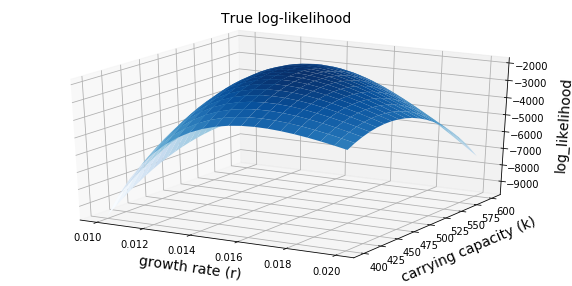

In [19]:
test_splits = 20 # number of splits along each axis
r_grid, k_grid, test_data = pints.generate_grid(bounds.lower(), bounds.upper(), test_splits)
model_prediction = pints.predict_grid(log_likelihood, test_data)

plt.figure(figsize = (10, 5))
ax = pints.plot.surface(r_grid, k_grid, model_prediction, title = "True log-likelihood",
                     x_label = "growth rate (r)",
                     y_label = "carrying capacity (k)")

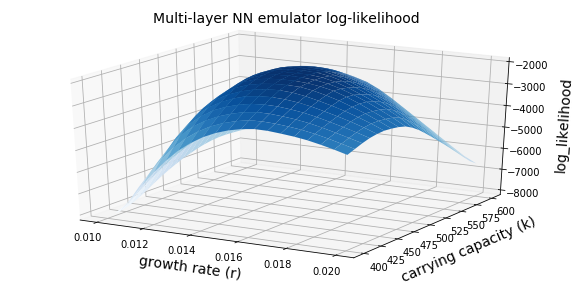

In [20]:
emu_prediction = pints.predict_grid(emu, test_data)

plt.figure(figsize = (10, 5))
ax = pints.plot.surface(r_grid, k_grid, emu_prediction, title = "Multi-layer NN emulator log-likelihood",
                        x_label = "growth rate (r)",
                        y_label = "carrying capacity (k)")

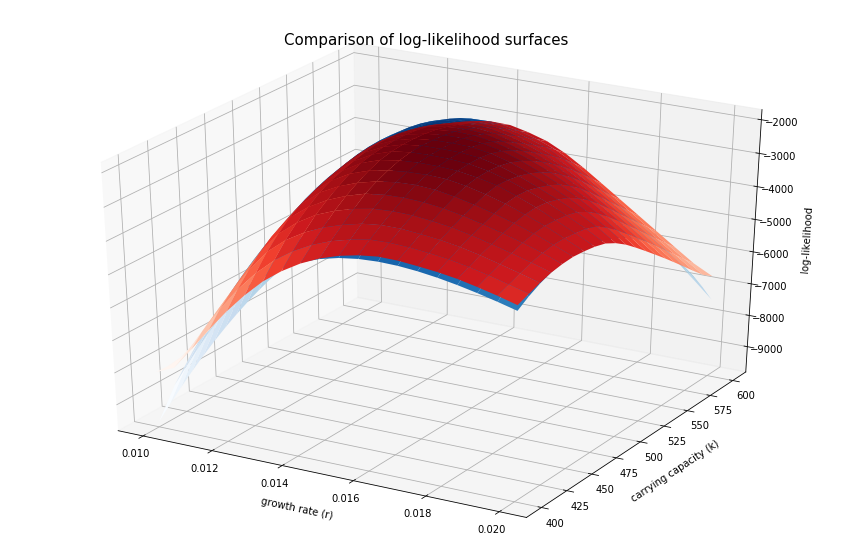

In [21]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

figsize=(20,10)
angle=(25, 300)
alpha=1.0
fontsize=10
labelpad=10

title = "Comparison of log-likelihood surfaces"
x_label = "growth rate (r)"
y_label = "carrying capacity (k)"
z_label = "log-likelihood"


fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection='3d')
ax.plot_surface(r_grid, k_grid, model_prediction, cmap='Blues', edgecolor='none', alpha=alpha)
ax.plot_surface(r_grid, k_grid, emu_prediction, cmap='Reds', edgecolor='none', alpha=alpha)
#ax.view_init(60, 35)
#ax.view_init(*angle)
#ax.set_title('surface')

plt.title(title, fontsize=fontsize*1.5)
ax.set_xlabel(x_label, fontsize=fontsize, labelpad=labelpad)
ax.set_ylabel(y_label, fontsize=fontsize, labelpad=labelpad)
ax.set_zlabel(z_label, fontsize=fontsize, labelpad=labelpad)
plt.show()

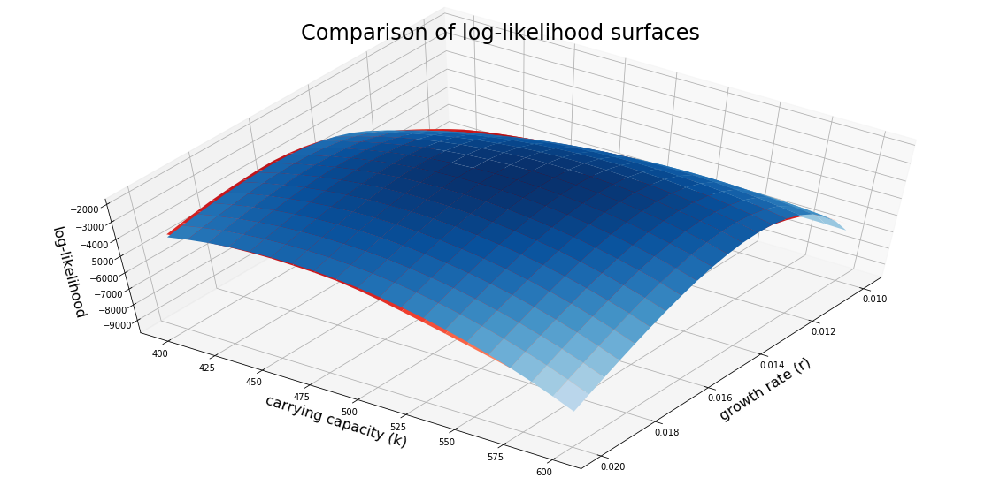

In [22]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

angle=(25, 300)
alpha=1.0
fontsize=16
labelpad=10

title = "Comparison of log-likelihood surfaces"
x_label = "growth rate (r)"
y_label = "carrying capacity (k)"
z_label = "log-likelihood"


fig = plt.figure(figsize=(20,10))
ax = plt.axes(projection='3d')
ax.plot_surface(r_grid, k_grid, model_prediction, cmap='Blues', edgecolor='none', alpha=alpha)
ax.plot_surface(r_grid, k_grid, emu_prediction, cmap='Reds', edgecolor='none', alpha=alpha)
ax.view_init(60, 35)
#ax.view_init(*angle)
#ax.set_title('surface')

plt.title(title, fontsize=fontsize*1.5)
ax.set_xlabel(x_label, fontsize=fontsize, labelpad=labelpad)
ax.set_ylabel(y_label, fontsize=fontsize, labelpad=labelpad)
ax.set_zlabel(z_label, fontsize=fontsize, labelpad=labelpad)
plt.show()

In [23]:
print(model_prediction.shape)
mape = np.mean(np.abs((model_prediction - emu_prediction) / model_prediction))
mape

(20, 20)


0.024524807488061157

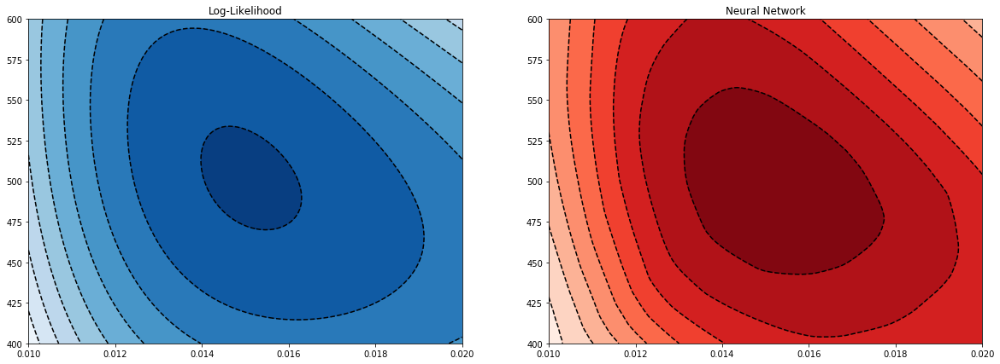

In [24]:
# Create grid
test_splits = 100 # number of splits along each axis
xx, yy, test_data = pints.generate_grid(bounds.lower(), bounds.upper(), test_splits)
xmin, xmax = np.min(xx), np.max(xx)
ymin, ymax = np.min(yy), np.max(yy)
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

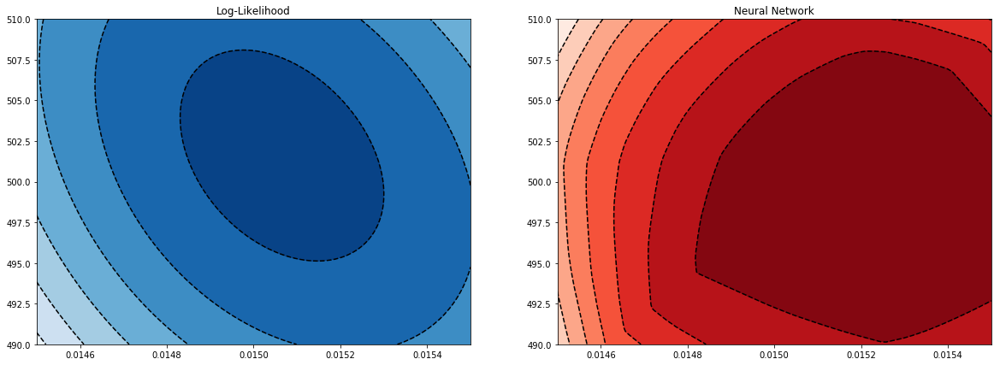

In [25]:
# Create grid
test_splits = 100 # number of splits along each axis
xx, yy, test_data = pints.generate_grid([0.0145, 490], [0.0155, 510], test_splits)
xmin, xmax = np.min(xx), np.max(xx)
ymin, ymax = np.min(yy), np.max(yy)
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

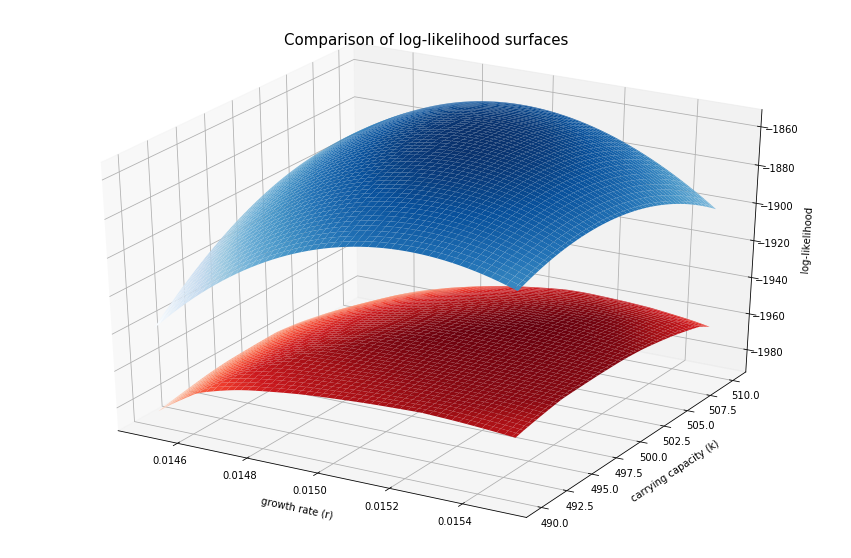

In [26]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

figsize=(20,10)
angle=(25, 300)
alpha=1.0
fontsize=10
labelpad=10

title = "Comparison of log-likelihood surfaces"
x_label = "growth rate (r)"
y_label = "carrying capacity (k)"
z_label = "log-likelihood"


fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection='3d')
ax.plot_surface(xx, yy, ll, cmap='Blues', edgecolor='none', alpha=alpha)
ax.plot_surface(xx, yy, np.array(ll_emu), cmap='Reds', edgecolor='none', alpha=alpha)
#ax.view_init(60, 35)
#ax.view_init(*angle)
#ax.set_title('surface')

plt.title(title, fontsize=fontsize*1.5)
ax.set_xlabel(x_label, fontsize=fontsize, labelpad=labelpad)
ax.set_ylabel(y_label, fontsize=fontsize, labelpad=labelpad)
ax.set_zlabel(z_label, fontsize=fontsize, labelpad=labelpad)
plt.show()

In [27]:
log_posterior_emu = pints.LogPosterior(emu, log_prior)
xs = [
    np.array(true_parameters) * 0.9,
    np.array(true_parameters) * 1.05,
    np.array(true_parameters) * 1.15,
]

In [28]:
#chains_emu = pints.mcmc_sample(log_posterior_emu, 3, xs)
# Create mcmc routine
mcmc = pints.MCMCController(log_posterior, 3, xs)

# Add stopping criterion
mcmc.set_max_iterations(10000)

# Disable logging mode
mcmc.set_log_to_screen(False)

# Run!
print('Running...')
chains = mcmc.run()
print('Done!')

Running...
[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]
[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]
[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]
[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+0

 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]

[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]



 [1.85248046e-06 1.08692493e-02]]


[[ 6.79198366e-09 -1.85009462e-06]
 [-1.85009462e-06  3.77244772e-03]]


[[7.16679045e-09 2.03617731e-06]
 [2.03617731e-06 2.35141108e-02]]


[[7.54940464e-09 1.18397473e-06]
 [1.18397473e-06 1.00335002e-02]]


[[ 6.17628506e-09 -1.70672924e-06]
 [-1.70672924e-06  3.57205415e-03]]


[[6.89117571e-09 6.14879406e-07]
 [6.14879406e-07 2.53950271e-02]]


[[8.16881698e-09 6.68351432e-07]
 [6.68351432e-07 9.25563293e-03]]


[[ 5.62049306e-09 -1.50729137e-06]
 [-1.50729137e-06  4.25079496e-03]]


[[ 6.83051955e-09 -8.94016677e-07]
 [-8.94016677e-07  2.68614748e-02]]


[[ 8.14042477e-09 -1.96052321e-07]
 [-1.96052321e-07  9.35173712e-03]]


[[ 5.11999071e-09 -1.33546543e-06]
 [-1.33546543e-06  4.69248378e-03]]


[[ 7.80277255e-09 -4.49733328e-06]
 [-4.49733328e-06  3.30336420e-02]]


[[ 7.89707171e-09 -1.61082836e-06]
 [-1.61082836e-06  1.28309849e-02]]


[[ 4.70554882e-09 -1.18596496e-06]
 [-1.18596496e-06  4.30352864e-03]]


[[ 7.15832164e-09 -4.30431696e-

 [1.07663350e-03 1.86763348e+02]]


[[ 2.59681980e-08 -1.78537167e-03]
 [-1.78537167e-03  1.80348113e+02]]


[[2.92409072e-09 3.23529745e-05]
 [3.23529745e-05 2.16142502e+01]]


[[8.86232144e-09 1.00501753e-03]
 [1.00501753e-03 1.82255413e+02]]


[[ 2.47163659e-08 -1.71119177e-03]
 [-1.71119177e-03  1.74500660e+02]]


[[3.00819011e-09 2.78179138e-06]
 [2.78179138e-06 2.37833126e+01]]


[[8.44172484e-09 9.38989123e-04]
 [9.38989123e-04 1.77472209e+02]]


[[ 2.35248522e-08 -1.63929802e-03]
 [-1.63929802e-03  1.68626484e+02]]


[[ 3.06384726e-09 -2.23288773e-05]
 [-2.23288773e-05  2.54998792e+01]]


[[8.34957650e-09 8.55376316e-04]
 [8.55376316e-04 1.71830582e+02]]


[[ 2.23910467e-08 -1.56974743e-03]
 [-1.56974743e-03  1.62764089e+02]]


[[ 3.09524570e-09 -4.35395596e-05]
 [-4.35395596e-05  2.68256589e+01]]


[[8.22806431e-09 7.79933556e-04]
 [7.79933556e-04 1.66149091e+02]]


[[ 2.13123976e-08 -1.50257237e-03]
 [-1.50257237e-03  1.56945514e+02]]


[[ 3.10603271e-09 -6.13431501e-05]
 [-6



[[ 4.12430540e-08 -8.41212942e-04]
 [-8.41212942e-04  2.95164101e+01]]


[[ 1.22198251e-08 -7.05944005e-05]
 [-7.05944005e-05  7.93167068e+00]]


[[ 5.90012727e-09 -1.15183091e-04]
 [-1.15183091e-04  5.07604060e+00]]


[[ 3.96244564e-08 -8.08305771e-04]
 [-8.08305771e-04  2.83655370e+01]]


[[ 1.22990957e-08 -6.51851477e-05]
 [-6.51851477e-05  7.63318861e+00]]


[[ 5.71259778e-09 -1.11968788e-04]
 [-1.11968788e-04  4.91571108e+00]]


[[ 3.80735008e-08 -7.76765627e-04]
 [-7.76765627e-04  2.72621829e+01]]


[[ 1.23323557e-08 -6.02040158e-05]
 [-6.02040158e-05  7.34622945e+00]]


[[ 5.52955918e-09 -1.08789328e-04]
 [-1.08789328e-04  4.75912607e+00]]


[[ 3.65871856e-08 -7.46532495e-04]
 [-7.46532495e-04  2.62042846e+01]]


[[ 1.29515803e-08 -6.33228167e-05]
 [-6.33228167e-05  7.08692057e+00]]


[[ 5.99176994e-09 -1.04229982e-04]
 [-1.04229982e-04  4.57368874e+00]]


[[ 3.51626501e-08 -7.17549129e-04]
 [-7.17549129e-04  2.51898725e+01]]


[[ 1.34613803e-08 -6.58961510e-05]
 [-6.58961510e

[[ 7.90219715e-09 -9.54945218e-05]
 [-9.54945218e-05  5.77291506e+00]]


[[ 2.59504697e-09 -7.31356917e-05]
 [-7.31356917e-05  3.53590110e+00]]


[[ 5.03809851e-09 -9.24051963e-05]
 [-9.24051963e-05  4.79643945e+00]]


[[ 8.35029244e-09 -9.55795712e-05]
 [-9.55795712e-05  5.60000270e+00]]


[[ 2.66882155e-09 -7.26861224e-05]
 [-7.26861224e-05  3.44459760e+00]]


[[ 4.92342623e-09 -8.96453013e-05]
 [-8.96453013e-05  4.64198585e+00]]


[[ 8.73819907e-09 -9.54592886e-05]
 [-9.54592886e-05  5.43211611e+00]]


[[ 2.73001710e-09 -7.21297073e-05]
 [-7.21297073e-05  3.35494195e+00]]


[[ 4.76629287e-09 -8.67249416e-05]
 [-8.67249416e-05  4.49181494e+00]]


[[ 9.07102957e-09 -9.51543546e-05]
 [-9.51543546e-05  5.26913244e+00]]


[[ 2.77974672e-09 -7.14783161e-05]
 [-7.14783161e-05  3.26697154e+00]]


[[ 4.61440164e-09 -8.39058257e-05]
 [-8.39058257e-05  4.34678395e+00]]


[[ 9.35296738e-09 -8.37628367e-05]
 [-8.37628367e-05  5.21975222e+00]]


[[ 2.81903677e-09 -7.07428271e-05]
 [-7.07428271e-0

 [-5.29513329e-05  3.85171327e+00]]


[[ 4.43578099e-09 -4.00545733e-06]
 [-4.00545733e-06  2.58110946e+00]]


[[ 2.42491241e-09 -6.45340992e-05]
 [-6.45340992e-05  3.60206964e+00]]


[[ 4.89978518e-09 -5.71428143e-05]
 [-5.71428143e-05  3.88797668e+00]]


[[ 4.39475520e-09 -4.35255105e-06]
 [-4.35255105e-06  2.51122067e+00]]


[[ 2.45870567e-09 -6.96753122e-05]
 [-6.96753122e-05  3.97560492e+00]]


[[ 4.97316457e-09 -6.08972373e-05]
 [-6.08972373e-05  3.91520697e+00]]


[[ 4.27514846e-09 -3.93958650e-06]
 [-3.93958650e-06  2.46502023e+00]]


[[ 2.43467662e-09 -7.06097666e-05]
 [-7.06097666e-05  4.04998794e+00]]


[[ 5.03277723e-09 -6.42459083e-05]
 [-6.42459083e-05  3.93413536e+00]]


[[ 4.15887907e-09 -3.55483989e-06]
 [-3.55483989e-06  2.41885358e+00]]


[[ 2.49978696e-09 -7.20507985e-05]
 [-7.20507985e-05  4.02430810e+00]]


[[ 5.07970577e-09 -6.72180834e-05]
 [-6.72180834e-05  3.94544310e+00]]


[[ 4.04585426e-09 -3.19652969e-06]
 [-3.19652969e-06  2.37279474e+00]]


[[ 2.55565329

 [-4.22421304e-05  2.63743496e+00]]


[[ 6.28937032e-09 -8.55644915e-05]
 [-8.55644915e-05  3.94047827e+00]]


[[ 3.07075904e-09 -2.10313907e-05]
 [-2.10313907e-05  2.39635197e+00]]


[[ 2.06509624e-09 -4.07405686e-05]
 [-4.07405686e-05  2.57384148e+00]]


[[ 6.24256284e-09 -8.38845808e-05]
 [-8.38845808e-05  3.84389269e+00]]


[[ 3.00636153e-09 -2.31157889e-05]
 [-2.31157889e-05  2.89201581e+00]]


[[ 2.09453371e-09 -3.93003593e-05]
 [-3.93003593e-05  2.51180219e+00]]


[[ 6.19154789e-09 -8.22261660e-05]
 [-8.22261660e-05  3.74974790e+00]]


[[ 2.94304896e-09 -2.50172340e-05]
 [-2.50172340e-05  3.34737174e+00]]


[[ 2.11921684e-09 -3.79187074e-05]
 [-3.79187074e-05  2.45128009e+00]]


[[ 6.13671524e-09 -8.05897938e-05]
 [-8.05897938e-05  3.65798147e+00]]


[[ 2.88082183e-09 -2.67472143e-05]
 [-2.67472143e-05  3.76490273e+00]]


[[ 2.13947680e-09 -3.65929559e-05]
 [-3.65929559e-05  2.39223894e+00]]


[[ 6.07842929e-09 -7.89759365e-05]
 [-7.89759365e-05  3.56853248e+00]]


[[ 2.81967910



[[ 2.97645904e-09 -4.99124524e-05]
 [-4.99124524e-05  2.41361745e+00]]


[[ 2.69118313e-09 -4.24319936e-05]
 [-4.24319936e-05  4.04233362e+00]]


[[ 4.97725438e-09 -5.18976574e-05]
 [-5.18976574e-05  3.80727941e+00]]


[[ 3.07385129e-09 -5.11457315e-05]
 [-5.11457315e-05  2.39291051e+00]]


[[ 2.65956908e-09 -4.15311062e-05]
 [-4.15311062e-05  3.95104051e+00]]


[[ 4.93109535e-09 -5.20705472e-05]
 [-5.20705472e-05  3.74849072e+00]]


[[ 3.16158928e-09 -5.22444273e-05]
 [-5.22444273e-05  2.37118236e+00]]


[[ 2.62739862e-09 -4.06489282e-05]
 [-4.06489282e-05  3.86190327e+00]]


[[ 4.88306659e-09 -5.21792661e-05]
 [-5.21792661e-05  3.68987529e+00]]


[[ 3.24024722e-09 -5.32166786e-05]
 [-5.32166786e-05  2.34852723e+00]]


[[ 2.56812752e-09 -3.97473583e-05]
 [-3.97473583e-05  3.79149624e+00]]


[[ 4.83334952e-09 -5.22281429e-05]
 [-5.22281429e-05  3.63148441e+00]]


[[ 3.24949015e-09 -5.54370726e-05]
 [-5.54370726e-05  2.43773962e+00]]


[[ 2.51025573e-09 -3.88663864e-05]
 [-3.88663864e


[[ 2.80093579e-09 -4.18937319e-05]
 [-4.18937319e-05  2.60924301e+00]]


[[ 3.91564994e-09 -5.30694746e-05]
 [-5.30694746e-05  4.31406602e+00]]


[[ 3.81659482e-09 -6.34902616e-05]
 [-6.34902616e-05  2.50106733e+00]]


[[ 2.80978701e-09 -4.23174636e-05]
 [-4.23174636e-05  2.57997780e+00]]


[[ 4.12414426e-09 -5.44495325e-05]
 [-5.44495325e-05  4.24563728e+00]]


[[ 3.79663725e-09 -6.26028000e-05]
 [-6.26028000e-05  2.45224860e+00]]


[[ 2.80227226e-09 -4.29460684e-05]
 [-4.29460684e-05  2.57108042e+00]]


[[ 4.08004049e-09 -5.54969615e-05]
 [-5.54969615e-05  4.27160910e+00]]


[[ 3.77467790e-09 -6.17168846e-05]
 [-6.17168846e-05  2.40436021e+00]]


[[ 2.79283349e-09 -4.34991608e-05]
 [-4.34991608e-05  2.56054168e+00]]


[[ 4.03518754e-09 -5.64322604e-05]
 [-5.64322604e-05  4.29233203e+00]]


[[ 3.75086411e-09 -6.08332223e-05]
 [-6.08332223e-05  2.35738649e+00]]


[[ 2.78160170e-09 -4.39810433e-05]
 [-4.39810433e-05  2.54847560e+00]]


[[ 3.98967385e-09 -5.72617144e-05]
 [-5.72617144e-

[[ 4.22428601e-09 -3.51215405e-05]
 [-3.51215405e-05  4.47052260e+00]]


[[ 2.36495167e-09 -4.90209331e-05]
 [-4.90209331e-05  3.02428905e+00]]


[[ 3.97790210e-09 -5.48429674e-05]
 [-5.48429674e-05  3.03093388e+00]]


[[ 4.18266073e-09 -3.28536947e-05]
 [-3.28536947e-05  4.44869435e+00]]


[[ 2.32257875e-09 -4.79450186e-05]
 [-4.79450186e-05  2.97194336e+00]]


[[ 4.06199927e-09 -5.44922709e-05]
 [-5.44922709e-05  2.97575579e+00]]


[[ 4.16283118e-09 -3.64099327e-05]
 [-3.64099327e-05  4.65303849e+00]]


[[ 2.28093736e-09 -4.68957373e-05]
 [-4.68957373e-05  2.92042633e+00]]


[[ 3.99032339e-09 -5.37338816e-05]
 [-5.37338816e-05  2.93170530e+00]]


[[ 4.08452234e-09 -3.47940692e-05]
 [-3.47940692e-05  5.09724624e+00]]


[[ 2.24001680e-09 -4.58723366e-05]
 [-4.58723366e-05  2.86972918e+00]]


[[ 3.91984138e-09 -5.29797264e-05]
 [-5.29797264e-05  2.88803888e+00]]


[[ 4.00771974e-09 -3.32453265e-05]
 [-3.32453265e-05  5.51232416e+00]]


[[ 2.19980640e-09 -4.48740881e-05]
 [-4.48740881e-0

 [-7.14886316e-05  4.72396393e+00]]


[[ 3.51389234e-09 -7.83398153e-05]
 [-7.83398153e-05  4.11198886e+00]]


[[ 3.99815197e-09 -2.64561836e-06]
 [-2.64561836e-06  2.12834169e+00]]


[[ 6.32270383e-09 -7.37654358e-05]
 [-7.37654358e-05  4.78651451e+00]]


[[ 3.48866128e-09 -7.93778570e-05]
 [-7.93778570e-05  4.19551746e+00]]


[[ 3.96726077e-09 -1.63493531e-06]
 [-1.63493531e-06  2.11255985e+00]]


[[ 6.29183151e-09 -7.58725142e-05]
 [-7.58725142e-05  4.84263020e+00]]


[[ 3.48202554e-09 -7.80305246e-05]
 [-7.80305246e-05  4.12012318e+00]]


[[ 3.93548262e-09 -6.77520925e-07]
 [-6.77520925e-07  2.09626983e+00]]


[[ 6.25858350e-09 -7.78177907e-05]
 [-7.78177907e-05  4.89262761e+00]]


[[ 3.54493144e-09 -7.33683579e-05]
 [-7.33683579e-05  4.13062219e+00]]


[[3.90288808e-09 2.28910089e-07]
 [2.28910089e-07 2.07951076e+00]]


[[ 6.22311329e-09 -7.96088576e-05]
 [-7.96088576e-05  4.93680985e+00]]


[[ 3.66994201e-09 -7.65276340e-05]
 [-7.65276340e-05  4.16263578e+00]]


[[3.86954428e-09 

 [-4.87497703e-05  3.15317997e+00]]


[[ 6.64657805e-09 -8.80698371e-05]
 [-8.80698371e-05  5.46288239e+00]]


[[ 8.03412327e-09 -3.59468778e-05]
 [-3.59468778e-05  3.29974212e+00]]


[[ 5.35701166e-09 -4.63645814e-05]
 [-4.63645814e-05  3.27547388e+00]]


[[ 6.57537008e-09 -8.61855758e-05]
 [-8.61855758e-05  5.37379973e+00]]


[[ 7.92070346e-09 -3.54895871e-05]
 [-3.54895871e-05  3.24475091e+00]]


[[ 5.84345474e-09 -5.89999098e-05]
 [-5.89999098e-05  3.53190821e+00]]


[[ 6.50401911e-09 -8.43476312e-05]
 [-8.43476312e-05  5.28616551e+00]]


[[ 7.80851229e-09 -3.50352220e-05]
 [-3.50352220e-05  3.19069522e+00]]


[[ 6.30191147e-09 -7.09612345e-05]
 [-7.09612345e-05  3.77333162e+00]]


[[ 6.43257566e-09 -8.25547071e-05]
 [-8.25547071e-05  5.19995742e+00]]


[[ 7.69755366e-09 -3.45839048e-05]
 [-3.45839048e-05  3.13755908e+00]]


[[ 6.73355887e-09 -8.22763456e-05]
 [-8.22763456e-05  4.00037811e+00]]


[[ 6.36108761e-09 -8.08055474e-05]
 [-8.08055474e-05  5.11515340e+00]]


[[ 7.58783051

 [-2.22111226e-05  3.47081368e+00]]


[[ 3.49926635e-09 -4.08532066e-05]
 [-4.08532066e-05  2.65206877e+00]]


[[ 4.54678728e-09 -2.75419642e-05]
 [-2.75419642e-05  3.30562326e+00]]


[[ 3.44531670e-09 -2.18204653e-05]
 [-2.18204653e-05  3.41653203e+00]]


[[ 3.44668363e-09 -4.01415964e-05]
 [-4.01415964e-05  2.61022753e+00]]


[[ 4.47373375e-09 -2.70978031e-05]
 [-2.70978031e-05  3.25248672e+00]]


[[ 3.39065049e-09 -2.14373930e-05]
 [-2.14373930e-05  3.36310723e+00]]


[[ 3.39486069e-09 -3.94436008e-05]
 [-3.94436008e-05  2.56905869e+00]]


[[ 4.40189707e-09 -2.66610929e-05]
 [-2.66610929e-05  3.20023607e+00]]


[[ 3.33687338e-09 -2.10617398e-05]
 [-2.10617398e-05  3.31052602e+00]]


[[ 3.34378819e-09 -3.87589277e-05]
 [-3.87589277e-05  2.52855145e+00]]


[[ 4.33125627e-09 -2.62317032e-05]
 [-2.62317032e-05  3.14885601e+00]]


[[ 3.28397073e-09 -2.06933439e-05]
 [-2.06933439e-05  3.25877536e+00]]


[[ 3.29345684e-09 -3.80872922e-05]
 [-3.80872922e-05  2.48869519e+00]]


[[ 4.26179073

 [-3.17682454e-05  2.33289810e+00]]


[[ 3.17022729e-09 -3.12041457e-05]
 [-3.12041457e-05  1.67798312e+00]]


[[ 4.82407421e-09 -1.07182219e-05]
 [-1.07182219e-05  2.54249447e+00]]


[[ 3.60017956e-09 -3.12447195e-05]
 [-3.12447195e-05  2.29840726e+00]]


[[ 3.12438176e-09 -3.02862491e-05]
 [-3.02862491e-05  1.72570039e+00]]


[[ 4.75077015e-09 -1.05613849e-05]
 [-1.05613849e-05  2.50373835e+00]]


[[ 3.54629249e-09 -3.07306330e-05]
 [-3.07306330e-05  2.26442701e+00]]


[[ 3.07918276e-09 -2.93962638e-05]
 [-2.93962638e-05  1.77043602e+00]]


[[ 4.67861405e-09 -1.04068201e-05]
 [-1.04068201e-05  2.46559288e+00]]


[[ 3.49322432e-09 -3.02257957e-05]
 [-3.02257957e-05  2.23095009e+00]]


[[ 3.03462215e-09 -2.85333193e-05]
 [-2.85333193e-05  1.81230761e+00]]


[[ 4.92120283e-09 -7.68873488e-06]
 [-7.68873488e-06  2.44879948e+00]]


[[ 3.44096269e-09 -2.97300218e-05]
 [-2.97300218e-05  2.19796930e+00]]


[[ 3.21605262e-09 -2.58159373e-05]
 [-2.58159373e-05  1.80749077e+00]]


[[ 5.15044620

 [-3.54079247e-05  2.08016457e+00]]


[[ 5.01900714e-09 -1.36193473e-05]
 [-1.36193473e-05  1.97453654e+00]]


[[ 5.18896812e-09 -1.51615749e-05]
 [-1.51615749e-05  5.46513563e+00]]


[[ 3.81964045e-09 -3.53882142e-05]
 [-3.53882142e-05  2.07104959e+00]]


[[ 4.96489671e-09 -1.23718610e-05]
 [-1.23718610e-05  2.00299565e+00]]


[[ 5.31574584e-09 -1.75943670e-05]
 [-1.75943670e-05  5.42009878e+00]]


[[ 3.77515159e-09 -3.53543789e-05]
 [-3.53543789e-05  2.06145578e+00]]


[[ 5.13937144e-09 -1.02989367e-05]
 [-1.02989367e-05  1.98825881e+00]]


[[ 5.43473937e-09 -1.99134938e-05]
 [-1.99134938e-05  5.37473548e+00]]


[[ 3.73100823e-09 -3.53070650e-05]
 [-3.53070650e-05  2.05140880e+00]]


[[ 5.30406023e-09 -8.31212274e-06]
 [-8.31212274e-06  1.97332487e+00]]


[[ 5.54624333e-09 -2.21229984e-05]
 [-2.21229984e-05  5.32908054e+00]]


[[ 3.68721460e-09 -3.52468953e-05]
 [-3.52468953e-05  2.04093336e+00]]


[[ 5.36232648e-09 -9.49849065e-06]
 [-9.49849065e-06  1.95715842e+00]]


[[ 5.65054243

 [-6.95653227e-05  3.18828265e+00]]


[[ 4.57421712e-09 -5.41114589e-05]
 [-5.41114589e-05  4.87363979e+00]]


[[ 3.46309218e-09 -3.80348801e-05]
 [-3.80348801e-05  2.03553188e+00]]


[[ 8.62706713e-09 -6.96066529e-05]
 [-6.96066529e-05  3.33381054e+00]]


[[ 4.54089382e-09 -5.36180526e-05]
 [-5.36180526e-05  4.80766111e+00]]


[[ 3.41848462e-09 -3.76004307e-05]
 [-3.76004307e-05  2.00950383e+00]]


[[ 8.51157777e-09 -6.96191662e-05]
 [-6.96191662e-05  3.47194610e+00]]


[[ 4.50719919e-09 -5.31244471e-05]
 [-5.31244471e-05  4.74257497e+00]]


[[ 3.37441510e-09 -3.71695457e-05]
 [-3.71695457e-05  1.98378395e+00]]


[[ 8.39761415e-09 -6.96040911e-05]
 [-6.96040911e-05  3.60294929e+00]]


[[ 4.47316291e-09 -5.26308527e-05]
 [-5.26308527e-05  4.67836979e+00]]


[[ 3.37394526e-09 -3.88323605e-05]
 [-3.88323605e-05  2.05796977e+00]]


[[ 8.28515756e-09 -6.95626143e-05]
 [-6.95626143e-05  3.72707177e+00]]


[[ 4.43881351e-09 -5.21374707e-05]
 [-5.21374707e-05  4.61503412e+00]]


[[ 3.37218472

 [-4.60615182e-05  3.30403788e+00]]


[[ 4.08744061e-09 -5.77598506e-05]
 [-5.77598506e-05  3.05138572e+00]]


[[ 2.23386611e-09 -2.69907468e-05]
 [-2.69907468e-05  1.58513263e+00]]


[[ 6.19199389e-09 -4.63846663e-05]
 [-4.63846663e-05  3.29030543e+00]]


[[ 4.04506867e-09 -5.74218603e-05]
 [-5.74218603e-05  3.02556275e+00]]


[[ 2.20385603e-09 -2.66404306e-05]
 [-2.66404306e-05  1.56621178e+00]]


[[ 6.13679866e-09 -4.66781030e-05]
 [-4.66781030e-05  3.27594199e+00]]


[[ 4.00294782e-09 -5.70768194e-05]
 [-5.70768194e-05  2.99969111e+00]]


[[ 2.17531596e-09 -2.62419479e-05]
 [-2.62419479e-05  1.54654809e+00]]


[[ 6.08161926e-09 -4.69429405e-05]
 [-4.69429405e-05  3.26097896e+00]]


[[ 3.96108362e-09 -5.67251484e-05]
 [-5.67251484e-05  2.97378260e+00]]


[[ 2.14714288e-09 -2.58500742e-05]
 [-2.58500742e-05  1.52712008e+00]]


[[ 6.02647588e-09 -4.71802551e-05]
 [-4.71802551e-05  3.24544667e+00]]


[[ 3.91948132e-09 -5.63672529e-05]
 [-5.63672529e-05  2.94784851e+00]]


[[ 2.11933233

[[ 1.77357254e-09 -7.13917522e-06]
 [-7.13917522e-06  2.11266249e+00]]


[[ 4.73752933e-09 -2.06159996e-05]
 [-2.06159996e-05  2.57380702e+00]]


[[ 3.63836609e-09 -3.23710372e-05]
 [-3.23710372e-05  2.66780070e+00]]


[[ 1.75077018e-09 -6.97339318e-06]
 [-6.97339318e-06  2.10870565e+00]]


[[ 4.81924944e-09 -1.87629340e-05]
 [-1.87629340e-05  2.55795333e+00]]


[[ 3.61337619e-09 -3.23064307e-05]
 [-3.23064307e-05  2.63885991e+00]]


[[ 1.72826772e-09 -6.81171815e-06]
 [-6.81171815e-06  2.10419667e+00]]


[[ 4.79521320e-09 -1.66890386e-05]
 [-1.66890386e-05  2.61182297e+00]]


[[ 3.58814831e-09 -3.22335282e-05]
 [-3.22335282e-05  2.61016052e+00]]


[[ 1.81130010e-09 -8.77881661e-06]
 [-8.77881661e-06  2.11696145e+00]]


[[ 4.77050764e-09 -1.46900768e-05]
 [-1.46900768e-05  2.66272855e+00]]


[[ 3.56270074e-09 -3.21526844e-05]
 [-3.21526844e-05  2.58170303e+00]]


[[ 1.92945820e-09 -9.61381696e-06]
 [-9.61381696e-06  2.09586410e+00]]


[[ 4.74516797e-09 -1.27637788e-05]
 [-1.27637788e-0

 [-5.00264132e-05  3.28231833e+00]]


[[ 3.55651777e-09 -2.23585899e-05]
 [-2.23585899e-05  2.35436010e+00]]


[[ 3.51526195e-09 -3.05498803e-05]
 [-3.05498803e-05  3.81904937e+00]]


[[ 4.37716128e-09 -5.45285282e-05]
 [-5.45285282e-05  3.39381334e+00]]


[[ 3.56395557e-09 -2.27935386e-05]
 [-2.27935386e-05  2.33466455e+00]]


[[ 3.54828967e-09 -2.85233322e-05]
 [-2.85233322e-05  3.80617156e+00]]


[[ 4.49027812e-09 -5.88446114e-05]
 [-5.88446114e-05  3.50006293e+00]]


[[ 3.57000084e-09 -2.32050400e-05]
 [-2.32050400e-05  2.31497901e+00]]


[[ 3.57896918e-09 -2.65639454e-05]
 [-2.65639454e-05  3.79258817e+00]]


[[ 4.59774899e-09 -6.29803777e-05]
 [-6.29803777e-05  3.60123330e+00]]


[[ 3.57470497e-09 -2.35938579e-05]
 [-2.35938579e-05  2.29530953e+00]]


[[ 3.61820612e-09 -2.58948826e-05]
 [-2.58948826e-05  3.74640350e+00]]


[[ 4.69975499e-09 -6.69413806e-05]
 [-6.69413806e-05  3.69748591e+00]]


[[ 3.57811778e-09 -2.39607338e-05]
 [-2.39607338e-05  2.27566195e+00]]


[[ 3.65484295

[[3.58276030e-09 1.88747720e-05]
 [1.88747720e-05 3.36351196e+00]]


[[ 4.66914444e-09 -4.03027081e-05]
 [-4.03027081e-05  4.05392913e+00]]


[[ 6.84379612e-09 -6.52945324e-05]
 [-6.52945324e-05  3.53755684e+00]]


[[3.53951852e-09 1.88043607e-05]
 [1.88043607e-05 3.42605898e+00]]


[[ 4.61462605e-09 -4.01138117e-05]
 [-4.01138117e-05  4.04660673e+00]]


[[ 6.76778893e-09 -6.41953777e-05]
 [-6.41953777e-05  3.50804566e+00]]


[[3.51898993e-09 1.69233127e-05]
 [1.69233127e-05 3.50637554e+00]]


[[ 4.56073817e-09 -3.99200406e-05]
 [-3.99200406e-05  4.03836626e+00]]


[[ 6.69256342e-09 -6.31173735e-05]
 [-6.31173735e-05  3.47858056e+00]]


[[3.49817799e-09 1.51056352e-05]
 [1.51056352e-05 3.58274979e+00]]


[[ 4.50747393e-09 -3.97216346e-05]
 [-3.97216346e-05  4.02924427e+00]]


[[ 6.61811364e-09 -6.20600659e-05]
 [-6.20600659e-05  3.44916888e+00]]


[[3.47709957e-09 1.33495365e-05]
 [1.33495365e-05 3.65530444e+00]]


[[ 4.48427954e-09 -4.18979154e-05]
 [-4.18979154e-05  4.20499963e+00]]


 [-8.35152827e-05  5.12111367e+00]]


[[ 4.51206647e-09 -1.49364690e-05]
 [-1.49364690e-05  2.95085226e+00]]


[[ 3.54838458e-09 -5.43397766e-05]
 [-5.43397766e-05  3.72020779e+00]]


[[ 6.51846782e-09 -8.63999130e-05]
 [-8.63999130e-05  5.32115756e+00]]


[[ 4.51454789e-09 -1.47363499e-05]
 [-1.47363499e-05  2.91613139e+00]]


[[ 3.51222423e-09 -5.37836354e-05]
 [-5.37836354e-05  3.67766325e+00]]


[[ 6.49787043e-09 -8.91591085e-05]
 [-8.91591085e-05  5.51268732e+00]]


[[ 4.51569930e-09 -1.45392272e-05]
 [-1.45392272e-05  2.88183147e+00]]


[[ 3.47637149e-09 -5.32322895e-05]
 [-5.32322895e-05  3.63560576e+00]]


[[ 6.47621151e-09 -9.17965832e-05]
 [-9.17965832e-05  5.69595383e+00]]


[[ 4.51556818e-09 -1.43450498e-05]
 [-1.43450498e-05  2.84794725e+00]]


[[ 3.44082563e-09 -5.26857254e-05]
 [-5.26857254e-05  3.59402993e+00]]


[[ 6.42028301e-09 -8.96168902e-05]
 [-8.96168902e-05  5.68889523e+00]]


[[ 4.46740529e-09 -1.47763734e-05]
 [-1.47763734e-05  2.88752363e+00]]


[[ 3.40558584

 [-6.35160150e-05  3.31995321e+00]]


[[ 3.20475216e-09 -3.47937318e-05]
 [-3.47937318e-05  3.43050514e+00]]


[[ 4.32235544e-09 -6.79187831e-05]
 [-6.79187831e-05  4.60514159e+00]]


[[ 3.88036079e-09 -6.36353067e-05]
 [-6.36353067e-05  3.30908673e+00]]


[[ 3.35533219e-09 -3.56036249e-05]
 [-3.56036249e-05  3.39911845e+00]]


[[ 4.31476414e-09 -6.71137071e-05]
 [-6.71137071e-05  4.55257676e+00]]


[[ 3.86183505e-09 -6.37340303e-05]
 [-6.37340303e-05  3.29773440e+00]]


[[ 3.48740948e-09 -3.52145613e-05]
 [-3.52145613e-05  3.36031947e+00]]


[[ 4.30631441e-09 -6.63187704e-05]
 [-6.63187704e-05  4.50062973e+00]]


[[ 3.84294261e-09 -6.38128764e-05]
 [-6.38128764e-05  3.28591622e+00]]


[[ 3.44996893e-09 -3.44616889e-05]
 [-3.44616889e-05  3.37431877e+00]]


[[ 4.27137088e-09 -6.63005085e-05]
 [-6.63005085e-05  4.48769188e+00]]


[[ 3.82370137e-09 -6.38725162e-05]
 [-6.38725162e-05  3.27365164e+00]]


[[ 3.41291507e-09 -3.37256259e-05]
 [-3.37256259e-05  3.38696657e+00]]


[[ 4.23651617

 [-5.02276652e-05  2.61342580e+00]]


[[ 3.15734871e-09 -1.02274844e-05]
 [-1.02274844e-05  2.53236289e+00]]


[[ 3.87157014e-09 -3.73564591e-05]
 [-3.73564591e-05  3.82831571e+00]]


[[ 4.33316608e-09 -5.11201409e-05]
 [-5.11201409e-05  2.60000581e+00]]


[[ 3.12883618e-09 -9.81452377e-06]
 [-9.81452377e-06  2.51799503e+00]]


[[ 3.83102760e-09 -3.71482468e-05]
 [-3.71482468e-05  3.80339471e+00]]


[[ 4.30740772e-09 -5.07699818e-05]
 [-5.07699818e-05  2.57327015e+00]]


[[ 3.20141124e-09 -9.68453739e-06]
 [-9.68453739e-06  2.49006345e+00]]


[[ 3.79089481e-09 -3.69378612e-05]
 [-3.69378612e-05  3.77837098e+00]]


[[ 4.28145148e-09 -5.04190372e-05]
 [-5.04190372e-05  2.54679334e+00]]


[[ 3.27079155e-09 -9.55650096e-06]
 [-9.55650096e-06  2.46245081e+00]]


[[ 3.75349723e-09 -3.75993033e-05]
 [-3.75993033e-05  3.98338773e+00]]


[[ 4.27232689e-09 -5.01854931e-05]
 [-5.01854931e-05  2.52131920e+00]]


[[ 3.33706757e-09 -9.43038115e-06]
 [-9.43038115e-06  2.43515336e+00]]


[[ 3.71552196

 [-7.19267993e-05  5.18202246e+00]]


[[ 3.85478551e-09 -3.19557286e-05]
 [-3.19557286e-05  2.75748893e+00]]


[[ 3.35236188e-09 -3.27014822e-05]
 [-3.27014822e-05  3.19906830e+00]]


[[ 4.29776098e-09 -7.31329716e-05]
 [-7.31329716e-05  5.27232604e+00]]


[[ 4.04185817e-09 -3.52672690e-05]
 [-3.52672690e-05  2.78618154e+00]]


[[ 3.32084215e-09 -3.21331408e-05]
 [-3.21331408e-05  3.17444040e+00]]


[[ 4.27766817e-09 -7.42831867e-05]
 [-7.42831867e-05  5.35848726e+00]]


[[ 4.38371437e-09 -3.90707933e-05]
 [-3.90707933e-05  2.80152590e+00]]


[[ 3.28957225e-09 -3.15757339e-05]
 [-3.15757339e-05  3.14987336e+00]]


[[ 4.23225993e-09 -7.36498412e-05]
 [-7.36498412e-05  5.33848489e+00]]


[[ 4.71350263e-09 -4.27422957e-05]
 [-4.27422957e-05  2.81572534e+00]]


[[ 3.25855151e-09 -3.10290361e-05]
 [-3.10290361e-05  3.12537112e+00]]


[[ 4.18733979e-09 -7.30199202e-05]
 [-7.30199202e-05  5.31789345e+00]]


[[ 5.03154080e-09 -4.62852380e-05]
 [-4.62852380e-05  2.82881415e+00]]


[[ 3.22777922

 [-4.57608591e-05  3.84149425e+00]]


[[ 2.93078747e-09 -3.04149820e-05]
 [-3.04149820e-05  2.64236733e+00]]


[[ 4.57299216e-09 -6.43615496e-05]
 [-6.43615496e-05  4.32073599e+00]]


[[ 3.58171292e-09 -4.50382664e-05]
 [-4.50382664e-05  3.81175064e+00]]


[[ 2.91143618e-09 -3.03303829e-05]
 [-3.03303829e-05  2.61940425e+00]]


[[ 4.53758230e-09 -6.44482845e-05]
 [-6.44482845e-05  4.32131599e+00]]


[[ 3.54940823e-09 -4.43285358e-05]
 [-4.43285358e-05  3.78210594e+00]]


[[ 2.89205436e-09 -3.02417797e-05]
 [-3.02417797e-05  2.59658865e+00]]


[[ 4.52957744e-09 -6.44486306e-05]
 [-6.44486306e-05  4.28747160e+00]]


[[ 3.51734100e-09 -4.36314173e-05]
 [-4.36314173e-05  3.75256377e+00]]


[[ 2.87264743e-09 -3.01493210e-05]
 [-3.01493210e-05  2.57392101e+00]]


[[ 4.52082979e-09 -6.44348109e-05]
 [-6.44348109e-05  4.25375121e+00]]


[[ 3.48551094e-09 -4.29466661e-05]
 [-4.29466661e-05  3.72312761e+00]]


[[ 2.85322064e-09 -3.00531519e-05]
 [-3.00531519e-05  2.55140180e+00]]


[[ 4.51136518

 [-8.50852890e-05  4.90502385e+00]]


[[ 3.29817826e-09 -9.36422028e-06]
 [-9.36422028e-06  4.26682863e+00]]


[[3.13301094e-09 4.24626964e-07]
 [4.24626964e-07 4.00980410e+00]]


[[ 5.90442303e-09 -8.39455477e-05]
 [-8.39455477e-05  4.85904558e+00]]


[[ 3.30628143e-09 -9.34507217e-06]
 [-9.34507217e-06  4.22325254e+00]]


[[3.12876541e-09 1.47815570e-06]
 [1.47815570e-06 4.00889756e+00]]


[[ 5.86038738e-09 -8.28232709e-05]
 [-8.28232709e-05  4.81346442e+00]]


[[ 3.31344564e-09 -9.32456106e-06]
 [-9.32456106e-06  4.18013256e+00]]


[[3.12399708e-09 2.49903396e-06]
 [2.49903396e-06 4.00718199e+00]]


[[ 5.81648049e-09 -8.17181568e-05]
 [-8.17181568e-05  4.76827790e+00]]


[[ 3.31969869e-09 -9.30273401e-06]
 [-9.30273401e-06  4.13746380e+00]]


[[3.11872332e-09 3.48806030e-06]
 [3.48806030e-06 4.00468302e+00]]


[[ 5.77270789e-09 -8.06299093e-05]
 [-8.06299093e-05  4.72348349e+00]]


[[ 3.32506769e-09 -9.27963689e-06]
 [-9.27963689e-06  4.09524145e+00]]


[[3.11296106e-09 4.44601509e-


[[ 2.99137385e-09 -3.25369064e-05]
 [-3.25369064e-05  4.10434542e+00]]


[[ 4.56526162e-09 -6.94126304e-05]
 [-6.94126304e-05  3.77958983e+00]]


[[ 2.20536501e-09 -3.14489531e-05]
 [-3.14489531e-05  4.49067759e+00]]


[[ 2.99237563e-09 -3.34097084e-05]
 [-3.34097084e-05  4.10969741e+00]]


[[ 4.63919859e-09 -7.23749088e-05]
 [-7.23749088e-05  3.85357187e+00]]


[[ 2.19200468e-09 -3.12250144e-05]
 [-3.12250144e-05  4.44669771e+00]]


[[ 2.99275142e-09 -3.42496848e-05]
 [-3.42496848e-05  4.11407044e+00]]


[[ 4.63978695e-09 -7.15118383e-05]
 [-7.15118383e-05  3.81544408e+00]]


[[ 2.17860854e-09 -3.10015736e-05]
 [-3.10015736e-05  4.40315114e+00]]


[[ 2.99252024e-09 -3.50576634e-05]
 [-3.50576634e-05  4.11749347e+00]]


[[ 4.63943466e-09 -7.06604070e-05]
 [-7.06604070e-05  3.77769991e+00]]


[[ 2.16518047e-09 -3.07786618e-05]
 [-3.07786618e-05  4.36003368e+00]]


[[ 2.98405359e-09 -3.47223033e-05]
 [-3.47223033e-05  4.07633573e+00]]


[[ 4.63817047e-09 -6.98204362e-05]
 [-6.98204362e-

[[ 3.67560018e-09 -4.84562726e-05]
 [-4.84562726e-05  3.30639472e+00]]


[[ 3.56006164e-09 -3.22648236e-05]
 [-3.22648236e-05  2.82370751e+00]]


[[ 2.18659511e-09 -1.96037950e-05]
 [-1.96037950e-05  2.72323166e+00]]


[[ 3.65013148e-09 -4.70908869e-05]
 [-4.70908869e-05  3.34992090e+00]]


[[ 3.53817703e-09 -3.06706488e-05]
 [-3.06706488e-05  2.92252707e+00]]


[[ 2.16672542e-09 -1.93994718e-05]
 [-1.93994718e-05  2.69670478e+00]]


[[ 3.63146064e-09 -4.72893901e-05]
 [-4.72893901e-05  3.34268360e+00]]


[[ 3.51626070e-09 -2.91173610e-05]
 [-2.91173610e-05  3.01789447e+00]]


[[ 2.14702586e-09 -1.91974462e-05]
 [-1.91974462e-05  2.67044233e+00]]


[[ 3.61264638e-09 -4.74730857e-05]
 [-4.74730857e-05  3.33502277e+00]]


[[ 3.49431795e-09 -2.76040483e-05]
 [-2.76040483e-05  3.10989377e+00]]


[[ 2.13005050e-09 -1.91401550e-05]
 [-1.91401550e-05  2.64857764e+00]]


[[ 3.59369670e-09 -4.76423788e-05]
 [-4.76423788e-05  3.32695257e+00]]


[[ 3.47235389e-09 -2.61298180e-05]
 [-2.61298180e-0

 [-6.02564836e-05  3.98218843e+00]]


[[ 3.71561942e-09 -4.41371945e-05]
 [-4.41371945e-05  2.88863057e+00]]


[[ 2.80968001e-09 -2.75994609e-05]
 [-2.75994609e-05  3.96552796e+00]]


[[ 2.45517931e-09 -5.98822971e-05]
 [-5.98822971e-05  4.03841563e+00]]


[[ 3.75944555e-09 -4.55960088e-05]
 [-4.55960088e-05  2.90557194e+00]]


[[ 2.82127557e-09 -2.79034541e-05]
 [-2.79034541e-05  3.93597234e+00]]


[[ 2.43211999e-09 -5.95079351e-05]
 [-5.95079351e-05  4.09229495e+00]]


[[ 3.74641932e-09 -4.47468514e-05]
 [-4.47468514e-05  2.88521620e+00]]


[[ 2.83202481e-09 -2.81936480e-05]
 [-2.81936480e-05  3.90654745e+00]]


[[ 2.41666547e-09 -5.82851585e-05]
 [-5.82851585e-05  4.10791834e+00]]


[[ 3.73308459e-09 -4.39138935e-05]
 [-4.39138935e-05  2.86491886e+00]]


[[ 2.81461571e-09 -2.78141037e-05]
 [-2.78141037e-05  3.87043826e+00]]


[[ 2.47663530e-09 -6.11665615e-05]
 [-6.11665615e-05  4.21097755e+00]]


[[ 3.71772153e-09 -4.31496495e-05]
 [-4.31496495e-05  2.84336388e+00]]


[[ 2.79719351

 [-5.73134411e-05  3.46385842e+00]]


[[ 4.22703525e-09 -5.09041761e-05]
 [-5.09041761e-05  3.23238420e+00]]


[[ 3.36010557e-09 -4.62309103e-05]
 [-4.62309103e-05  3.55298894e+00]]


[[ 3.14541245e-09 -5.94749781e-05]
 [-5.94749781e-05  3.55370255e+00]]


[[ 4.18953260e-09 -5.04639557e-05]
 [-5.04639557e-05  3.20276272e+00]]


[[ 3.35479612e-09 -4.67724578e-05]
 [-4.67724578e-05  3.55603788e+00]]


[[ 3.17519489e-09 -5.69865618e-05]
 [-5.69865618e-05  3.58346073e+00]]


[[ 4.15235177e-09 -5.00272889e-05]
 [-5.00272889e-05  3.17341397e+00]]


[[ 3.34905071e-09 -4.72906548e-05]
 [-4.72906548e-05  3.55838124e+00]]


[[ 3.20358853e-09 -5.45580205e-05]
 [-5.45580205e-05  3.61175964e+00]]


[[ 4.18204304e-09 -5.06197224e-05]
 [-5.06197224e-05  3.16013046e+00]]


[[ 3.34288285e-09 -4.77860738e-05]
 [-4.77860738e-05  3.56003875e+00]]


[[ 3.23062784e-09 -5.21880856e-05]
 [-5.21880856e-05  3.63863578e+00]]


[[ 4.17862144e-09 -4.94220628e-05]
 [-4.94220628e-05  3.14525984e+00]]


[[ 3.33630568

[[ 5.12089029e-09 -2.49885636e-05]
 [-2.49885636e-05  2.92949914e+00]]


[[ 2.78273112e-09 -4.65744163e-05]
 [-4.65744163e-05  2.94476043e+00]]


[[ 5.47265195e-09 -7.15196093e-05]
 [-7.15196093e-05  3.59625462e+00]]


[[ 5.10332426e-09 -2.42390125e-05]
 [-2.42390125e-05  2.91184782e+00]]


[[ 2.75887024e-09 -4.63522869e-05]
 [-4.63522869e-05  2.94310086e+00]]


[[ 5.42401029e-09 -7.08869551e-05]
 [-7.08869551e-05  3.56363035e+00]]


[[ 5.08538712e-09 -2.35060101e-05]
 [-2.35060101e-05  2.89419446e+00]]


[[ 2.73520363e-09 -4.61285071e-05]
 [-4.61285071e-05  2.94099441e+00]]


[[ 5.37579824e-09 -7.02598316e-05]
 [-7.02598316e-05  3.53130664e+00]]


[[ 5.06709238e-09 -2.27892213e-05]
 [-2.27892213e-05  2.87654220e+00]]


[[ 2.71172997e-09 -4.59031622e-05]
 [-4.59031622e-05  2.93845396e+00]]


[[ 5.32801218e-09 -6.96381934e-05]
 [-6.96381934e-05  3.49928071e+00]]


[[ 5.04845320e-09 -2.20883173e-05]
 [-2.20883173e-05  2.85889406e+00]]


[[ 2.68844793e-09 -4.56763349e-05]
 [-4.56763349e-0

 [-3.68297695e-05  3.31245499e+00]]


[[ 3.98417486e-09 -4.47596813e-05]
 [-4.47596813e-05  2.89449337e+00]]


[[ 3.20801298e-09 -5.32759422e-05]
 [-5.32759422e-05  3.82079493e+00]]


[[ 3.99941075e-09 -3.69501761e-05]
 [-3.69501761e-05  3.29205263e+00]]


[[ 3.94884279e-09 -4.43218766e-05]
 [-4.43218766e-05  2.87113504e+00]]


[[ 3.20872095e-09 -5.38866054e-05]
 [-5.38866054e-05  3.82663763e+00]]


[[ 3.98483243e-09 -3.70613989e-05]
 [-3.70613989e-05  3.27167079e+00]]


[[ 3.91382793e-09 -4.38887433e-05]
 [-4.38887433e-05  2.84794453e+00]]


[[ 3.24071205e-09 -5.56091218e-05]
 [-5.56091218e-05  3.87231568e+00]]


[[ 3.95807381e-09 -3.78096680e-05]
 [-3.78096680e-05  3.37162197e+00]]


[[ 3.87912742e-09 -4.34602256e-05]
 [-4.34602256e-05  2.82492113e+00]]


[[ 3.27132070e-09 -5.72763039e-05]
 [-5.72763039e-05  3.91614113e+00]]


[[ 3.92261706e-09 -3.74123516e-05]
 [-3.74123516e-05  3.37787803e+00]]


[[ 3.84473844e-09 -4.30362687e-05]
 [-4.30362687e-05  2.80206408e+00]]


[[ 3.41652413

 [-4.65842331e-05  5.22019646e+00]]


[[ 4.92807200e-09 -3.09723195e-05]
 [-3.09723195e-05  2.87617356e+00]]


[[ 4.78326043e-09 -7.27854344e-05]
 [-7.27854344e-05  2.89271591e+00]]


[[ 5.70838600e-09 -4.55278922e-05]
 [-4.55278922e-05  5.19344535e+00]]


[[ 4.91951149e-09 -3.08537983e-05]
 [-3.08537983e-05  2.85151271e+00]]


[[ 4.74626351e-09 -7.20890190e-05]
 [-7.20890190e-05  2.86781331e+00]]


[[ 5.67938004e-09 -4.44924228e-05]
 [-4.44924228e-05  5.16659835e+00]]


[[ 4.91041685e-09 -3.07336399e-05]
 [-3.07336399e-05  2.82706270e+00]]


[[ 4.70951050e-09 -7.13998613e-05]
 [-7.13998613e-05  2.84312540e+00]]


[[ 5.65026289e-09 -4.34774305e-05]
 [-4.34774305e-05  5.13966235e+00]]


[[ 4.91215099e-09 -3.07938849e-05]
 [-3.07938849e-05  2.80459676e+00]]


[[ 4.67300075e-09 -7.07178769e-05]
 [-7.07178769e-05  2.81865039e+00]]


[[ 5.62104221e-09 -4.24825282e-05]
 [-4.24825282e-05  5.11264405e+00]]


[[ 4.91239817e-09 -3.18063262e-05]
 [-3.18063262e-05  2.81777376e+00]]


[[ 4.63673358

 [-3.85658438e-05  3.61682702e+00]]


[[ 4.37685471e-09 -2.96196684e-05]
 [-2.96196684e-05  2.53009288e+00]]


[[ 3.69845876e-09 -4.38464833e-05]
 [-4.38464833e-05  2.44882800e+00]]


[[ 4.43530459e-09 -3.82268894e-05]
 [-3.82268894e-05  3.58832697e+00]]


[[ 4.35990939e-09 -2.91510167e-05]
 [-2.91510167e-05  2.51036202e+00]]


[[ 3.66727236e-09 -4.33751200e-05]
 [-4.33751200e-05  2.43811891e+00]]


[[ 4.39695330e-09 -3.78910324e-05]
 [-3.78910324e-05  3.56003163e+00]]


[[ 4.34275413e-09 -2.86901786e-05]
 [-2.86901786e-05  2.49076899e+00]]


[[ 3.88370249e-09 -4.74904198e-05]
 [-4.74904198e-05  2.49828993e+00]]


[[ 4.35894185e-09 -3.75582431e-05]
 [-3.75582431e-05  3.53193997e+00]]


[[ 4.32539712e-09 -2.82370193e-05]
 [-2.82370193e-05  2.47131319e+00]]


[[ 4.09394172e-09 -5.14919275e-05]
 [-5.14919275e-05  2.55652854e+00]]


[[ 4.32126716e-09 -3.72284920e-05]
 [-3.72284920e-05  3.50405096e+00]]


[[ 4.30784634e-09 -2.77914063e-05]
 [-2.77914063e-05  2.45199399e+00]]


[[ 4.29812074

[[ 5.27588923e-09 -6.35972043e-05]
 [-6.35972043e-05  3.57960877e+00]]


[[ 4.98106908e-09 -9.15513845e-05]
 [-9.15513845e-05  4.09168700e+00]]


[[ 5.35421429e-09 -7.24117751e-05]
 [-7.24117751e-05  5.11042360e+00]]


[[ 5.24062915e-09 -6.40346406e-05]
 [-6.40346406e-05  3.64916599e+00]]


[[ 4.95102206e-09 -9.13043946e-05]
 [-9.13043946e-05  4.07988614e+00]]


[[ 5.31100554e-09 -7.18382215e-05]
 [-7.18382215e-05  5.06777481e+00]]


[[ 5.20551432e-09 -6.44517327e-05]
 [-6.44517327e-05  3.71642694e+00]]


[[ 4.92102910e-09 -9.10505777e-05]
 [-9.10505777e-05  4.06779970e+00]]


[[ 5.26813451e-09 -7.12689583e-05]
 [-7.12689583e-05  5.02548441e+00]]


[[ 5.17002088e-09 -6.42638155e-05]
 [-6.42638155e-05  3.69969301e+00]]


[[ 4.89109328e-09 -9.07901485e-05]
 [-9.07901485e-05  4.05543686e+00]]


[[ 5.22559884e-09 -7.07039593e-05]
 [-7.07039593e-05  4.98354943e+00]]


[[ 5.13468903e-09 -6.40714576e-05]
 [-6.40714576e-05  3.68285406e+00]]


[[ 4.86121756e-09 -9.05233169e-05]
 [-9.05233169e-0

[[ 5.54965649e-09 -9.98943867e-05]
 [-9.98943867e-05  3.63141518e+00]]


[[ 6.06332954e-09 -7.46796560e-05]
 [-7.46796560e-05  4.15113741e+00]]


[[ 4.02472444e-09 -3.48879792e-05]
 [-3.48879792e-05  2.76363203e+00]]


[[ 5.58319942e-09 -1.00114172e-04]
 [-1.00114172e-04  3.61499802e+00]]


[[ 6.28459792e-09 -7.91116218e-05]
 [-7.91116218e-05  4.21048346e+00]]


[[ 3.99113861e-09 -3.45800143e-05]
 [-3.45800143e-05  2.76393267e+00]]


[[ 5.61512761e-09 -1.00314559e-04]
 [-1.00314559e-04  3.59849018e+00]]


[[ 6.49945548e-09 -8.34216684e-05]
 [-8.34216684e-05  4.26775978e+00]]


[[ 3.95783981e-09 -3.42749612e-05]
 [-3.42749612e-05  2.76384234e+00]]


[[ 5.64547755e-09 -1.00496013e-04]
 [-1.00496013e-04  3.58189633e+00]]


[[ 6.70803437e-09 -8.76122766e-05]
 [-8.76122766e-05  4.32301077e+00]]


[[ 3.92482554e-09 -3.39727896e-05]
 [-3.39727896e-05  2.76337099e+00]]


[[ 5.62810237e-09 -1.00422457e-04]
 [-1.00422457e-04  3.57169142e+00]]


[[ 6.91046426e-09 -9.16858811e-05]
 [-9.16858811e-0



[[ 7.67599915e-09 -4.56261479e-05]
 [-4.56261479e-05  3.74558790e+00]]


[[ 4.80835284e-09 -6.50010152e-05]
 [-6.50010152e-05  3.39126693e+00]]


[[ 3.57664465e-09 -4.15642916e-05]
 [-4.15642916e-05  2.94268199e+00]]


[[ 7.61810011e-09 -4.55755366e-05]
 [-4.55755366e-05  3.73538472e+00]]


[[ 4.77913078e-09 -6.45900763e-05]
 [-6.45900763e-05  3.36490190e+00]]


[[ 3.54755730e-09 -4.12892977e-05]
 [-4.12892977e-05  2.93504575e+00]]


[[ 7.55558464e-09 -4.52157001e-05]
 [-4.52157001e-05  3.77103461e+00]]


[[ 4.74560293e-09 -6.36866965e-05]
 [-6.36866965e-05  3.36182339e+00]]


[[ 3.51932902e-09 -4.09298854e-05]
 [-4.09298854e-05  2.91144829e+00]]


[[ 7.50410305e-09 -4.51500237e-05]
 [-4.51500237e-05  3.74896171e+00]]


[[ 4.71226397e-09 -6.27970085e-05]
 [-6.27970085e-05  3.35837002e+00]]


[[ 3.49132360e-09 -4.05738305e-05]
 [-4.05738305e-05  2.88804121e+00]]


[[ 7.45288237e-09 -4.50799116e-05]
 [-4.50799116e-05  3.72692943e+00]]


[[ 4.67911381e-09 -6.19207936e-05]
 [-6.19207936e



[[ 4.96181409e-09 -3.31727227e-05]
 [-3.31727227e-05  2.62498037e+00]]


[[ 3.88626745e-09 -4.11039754e-05]
 [-4.11039754e-05  2.88058406e+00]]


[[ 5.20963473e-09 -7.97195239e-05]
 [-7.97195239e-05  3.35686278e+00]]


[[ 4.92354709e-09 -3.28206561e-05]
 [-3.28206561e-05  2.60775493e+00]]


[[ 3.85513032e-09 -4.08398333e-05]
 [-4.08398333e-05  2.87714340e+00]]


[[ 5.17157973e-09 -7.92069133e-05]
 [-7.92069133e-05  3.33405384e+00]]


[[ 4.88556766e-09 -3.24728542e-05]
 [-3.24728542e-05  2.59060813e+00]]


[[ 3.82424682e-09 -4.05767873e-05]
 [-4.05767873e-05  2.87341280e+00]]


[[ 5.13377504e-09 -7.86964364e-05]
 [-7.86964364e-05  3.31136452e+00]]


[[ 4.84787381e-09 -3.21292590e-05]
 [-3.21292590e-05  2.57354034e+00]]


[[ 3.79361487e-09 -4.03148459e-05]
 [-4.03148459e-05  2.86939988e+00]]


[[ 5.09621959e-09 -7.81881094e-05]
 [-7.81881094e-05  3.28879494e+00]]


[[ 4.81046359e-09 -3.17898133e-05]
 [-3.17898133e-05  2.55655191e+00]]


[[ 3.76323239e-09 -4.00540171e-05]
 [-4.00540171e

 [-5.93322293e-05  2.70786921e+00]]


[[ 4.86076445e-09 -7.51244467e-05]
 [-7.51244467e-05  3.17329192e+00]]


[[ 5.47432900e-09 -2.37670154e-05]
 [-2.37670154e-05  2.72885076e+00]]


[[ 5.16746016e-09 -5.88654420e-05]
 [-5.88654420e-05  2.68636364e+00]]


[[ 4.83221090e-09 -7.47585238e-05]
 [-7.47585238e-05  3.15338533e+00]]


[[ 5.55238739e-09 -2.36714023e-05]
 [-2.36714023e-05  2.70724909e+00]]


[[ 5.14910424e-09 -5.84023795e-05]
 [-5.84023795e-05  2.66503291e+00]]


[[ 4.80373053e-09 -7.43919268e-05]
 [-7.43919268e-05  3.13355683e+00]]


[[ 5.62788901e-09 -2.35750934e-05]
 [-2.35750934e-05  2.68582192e+00]]


[[ 5.13053895e-09 -5.79430122e-05]
 [-5.79430122e-05  2.64387556e+00]]


[[ 4.77532527e-09 -7.40247198e-05]
 [-7.40247198e-05  3.11380710e+00]]


[[ 5.70088587e-09 -2.34781181e-05]
 [-2.34781181e-05  2.66456782e+00]]


[[ 5.11177176e-09 -5.74873101e-05]
 [-5.74873101e-05  2.62289014e+00]]


[[ 4.74699700e-09 -7.36569653e-05]
 [-7.36569653e-05  3.09413681e+00]]


[[ 5.77142906

 [-4.80409095e-05  2.31363104e+00]]


[[ 4.60996246e-09 -5.21499832e-05]
 [-5.21499832e-05  3.20761948e+00]]


[[ 6.06360465e-09 -2.15763559e-05]
 [-2.15763559e-05  4.17187496e+00]]


[[ 4.09558161e-09 -4.76908965e-05]
 [-4.76908965e-05  2.30587740e+00]]


[[ 4.58153879e-09 -5.24068419e-05]
 [-5.24068419e-05  3.24077027e+00]]


[[ 6.02074882e-09 -2.04871211e-05]
 [-2.04871211e-05  4.32774182e+00]]


[[ 4.06366304e-09 -4.73432895e-05]
 [-4.73432895e-05  2.29802531e+00]]


[[ 4.55322444e-09 -5.26513187e-05]
 [-5.26513187e-05  3.27275092e+00]]


[[ 6.17030878e-09 -2.36570678e-05]
 [-2.36570678e-05  4.35035881e+00]]


[[ 4.03199859e-09 -4.69980751e-05]
 [-4.69980751e-05  2.29007810e+00]]


[[ 4.52502036e-09 -5.28836774e-05]
 [-5.28836774e-05  3.30358525e+00]]


[[ 6.31561699e-09 -2.67499042e-05]
 [-2.67499042e-05  4.37191793e+00]]


[[ 4.02653499e-09 -4.72194269e-05]
 [-4.72194269e-05  2.28550585e+00]]


[[ 4.49692748e-09 -5.31041769e-05]
 [-5.31041769e-05  3.33329664e+00]]


[[ 6.45675628

[[ 4.86568841e-09 -3.27099880e-05]
 [-3.27099880e-05  2.29082208e+00]]


[[ 4.07144596e-09 -3.73326555e-05]
 [-3.73326555e-05  3.26082389e+00]]


[[ 5.30723438e-09 -2.46449682e-05]
 [-2.46449682e-05  3.41767315e+00]]


[[ 4.83111450e-09 -3.21627438e-05]
 [-3.21627438e-05  2.30415115e+00]]


[[ 4.15104497e-09 -3.70543249e-05]
 [-3.70543249e-05  3.23575889e+00]]


[[ 5.38438305e-09 -2.54778180e-05]
 [-2.54778180e-05  3.40026257e+00]]


[[ 4.79676922e-09 -3.16243323e-05]
 [-3.16243323e-05  2.31690173e+00]]


[[ 4.22832018e-09 -3.67780511e-05]
 [-3.67780511e-05  3.21089101e+00]]


[[ 5.45911929e-09 -2.62884668e-05]
 [-2.62884668e-05  3.38285327e+00]]


[[ 4.76265139e-09 -3.10946124e-05]
 [-3.10946124e-05  2.32908583e+00]]


[[ 4.30331659e-09 -3.65038196e-05]
 [-3.65038196e-05  3.18621868e+00]]


[[ 5.53149046e-09 -2.70773355e-05]
 [-2.70773355e-05  3.36544734e+00]]


[[ 4.72875986e-09 -3.05734450e-05]
 [-3.05734450e-05  2.34071520e+00]]


[[ 4.40661359e-09 -3.85342984e-05]
 [-3.85342984e-0

 [-8.89645348e-05  3.85114985e+00]]


[[ 4.06823350e-09 -3.64659353e-05]
 [-3.64659353e-05  3.46402454e+00]]


[[ 4.26075436e-09 -2.39593525e-05]
 [-2.39593525e-05  3.27071156e+00]]


[[ 8.67389298e-09 -8.89028016e-05]
 [-8.89028016e-05  3.82368200e+00]]


[[ 4.03762963e-09 -3.62364982e-05]
 [-3.62364982e-05  3.44990360e+00]]


[[ 4.30839888e-09 -2.31767374e-05]
 [-2.31767374e-05  3.25048993e+00]]


[[ 8.62681785e-09 -8.72228143e-05]
 [-8.72228143e-05  3.84948020e+00]]


[[ 4.00725994e-09 -3.60081365e-05]
 [-3.60081365e-05  3.43570975e+00]]


[[ 4.35447072e-09 -2.24092422e-05]
 [-2.24092422e-05  3.23035660e+00]]


[[ 8.57982758e-09 -8.55710078e-05]
 [-8.55710078e-05  3.87425416e+00]]


[[ 3.97712263e-09 -3.57808522e-05]
 [-3.57808522e-05  3.42144636e+00]]


[[ 4.39900068e-09 -2.16566091e-05]
 [-2.16566091e-05  3.21031192e+00]]


[[ 8.53292576e-09 -8.39469279e-05]
 [-8.39469279e-05  3.89802454e+00]]


[[ 3.94721589e-09 -3.55546473e-05]
 [-3.55546473e-05  3.40711670e+00]]


[[ 4.44201903

[[ 5.49270428e-09 -4.65828280e-05]
 [-4.65828280e-05  2.66744615e+00]]


[[ 3.41458644e-09 -2.53591517e-05]
 [-2.53591517e-05  2.90537196e+00]]


[[ 4.43165936e-09 -3.85495733e-05]
 [-3.85495733e-05  2.86869785e+00]]


[[ 5.47327317e-09 -4.66803668e-05]
 [-4.66803668e-05  2.65675991e+00]]


[[ 3.39580722e-09 -2.53149439e-05]
 [-2.53149439e-05  2.88685927e+00]]


[[ 4.39877056e-09 -3.82399214e-05]
 [-3.82399214e-05  2.85078912e+00]]


[[ 5.45367083e-09 -4.67705590e-05]
 [-4.67705590e-05  2.64601860e+00]]


[[ 3.37707211e-09 -2.52689230e-05]
 [-2.52689230e-05  2.86844103e+00]]


[[ 4.36613034e-09 -3.79329613e-05]
 [-3.79329613e-05  2.83296534e+00]]


[[ 5.43390340e-09 -4.68535609e-05]
 [-4.68535609e-05  2.63522470e+00]]


[[ 3.35715980e-09 -2.55990691e-05]
 [-2.55990691e-05  2.89825473e+00]]


[[ 4.33373680e-09 -3.76286671e-05]
 [-3.76286671e-05  2.81522662e+00]]


[[ 5.41397688e-09 -4.69295262e-05]
 [-4.69295262e-05  2.62438064e+00]]


[[ 3.39897176e-09 -2.36652229e-05]
 [-2.36652229e-0

[[ 6.17685198e-09 -4.70435826e-05]
 [-4.70435826e-05  2.44091000e+00]]


[[ 2.92155011e-09 -2.19276525e-05]
 [-2.19276525e-05  3.36625856e+00]]


[[ 4.47698153e-09 -3.75520379e-05]
 [-3.75520379e-05  2.54244241e+00]]


[[ 6.15556997e-09 -4.69091771e-05]
 [-4.69091771e-05  2.42482411e+00]]


[[ 2.91466763e-09 -2.21012294e-05]
 [-2.21012294e-05  3.34920084e+00]]


[[ 4.44712209e-09 -3.70064178e-05]
 [-3.70064178e-05  2.54766858e+00]]


[[ 6.13409493e-09 -4.67726883e-05]
 [-4.67726883e-05  2.40883199e+00]]


[[ 2.90762333e-09 -2.22686022e-05]
 [-2.22686022e-05  3.33215885e+00]]


[[ 4.41744250e-09 -3.64688451e-05]
 [-3.64688451e-05  2.55250546e+00]]


[[ 6.11243356e-09 -4.66341779e-05]
 [-4.66341779e-05  2.39293331e+00]]


[[ 2.90042160e-09 -2.24298909e-05]
 [-2.24298909e-05  3.31513416e+00]]


[[ 4.38794204e-09 -3.59391995e-05]
 [-3.59391995e-05  2.55696123e+00]]


[[ 6.09059244e-09 -4.64937065e-05]
 [-4.64937065e-05  2.37712775e+00]]


[[ 2.89306677e-09 -2.25852137e-05]
 [-2.25852137e-0


[[ 5.06622230e-09 -4.78054939e-05]
 [-4.78054939e-05  3.79763707e+00]]


[[ 3.81954931e-09 -5.09813923e-05]
 [-5.09813923e-05  4.35545566e+00]]


[[ 4.48131423e-09 -5.01274705e-05]
 [-5.01274705e-05  2.80362030e+00]]


[[ 5.08517138e-09 -4.70187615e-05]
 [-4.70187615e-05  3.77359407e+00]]


[[ 3.84936282e-09 -5.21934427e-05]
 [-5.21934427e-05  4.36739149e+00]]


[[ 4.45055675e-09 -4.98119796e-05]
 [-4.98119796e-05  2.78462807e+00]]


[[ 5.19757997e-09 -4.99106142e-05]
 [-4.99106142e-05  3.81625784e+00]]


[[ 3.87812527e-09 -5.33736773e-05]
 [-5.33736773e-05  4.37861076e+00]]


[[ 4.42000231e-09 -4.94981357e-05]
 [-4.94981357e-05  2.76575740e+00]]


[[ 5.30700108e-09 -5.27343775e-05]
 [-5.27343775e-05  3.85759489e+00]]


[[ 3.90585672e-09 -5.45226703e-05]
 [-5.45226703e-05  4.38912807e+00]]


[[ 4.38964972e-09 -4.91859366e-05]
 [-4.91859366e-05  2.74700764e+00]]


[[ 5.41348878e-09 -5.54912479e-05]
 [-5.54912479e-05  3.89762999e+00]]


[[ 3.93257692e-09 -5.56409866e-05]
 [-5.56409866e-

 [-3.82049370e-05  2.11676069e+00]]


[[ 4.51872381e-09 -4.74987172e-05]
 [-4.74987172e-05  3.37660443e+00]]


[[ 4.29786639e-09 -7.26263621e-05]
 [-7.26263621e-05  3.88315366e+00]]


[[ 3.87885392e-09 -3.71892834e-05]
 [-3.71892834e-05  2.12479416e+00]]


[[ 4.49403071e-09 -4.73629303e-05]
 [-4.73629303e-05  3.35791515e+00]]


[[ 4.26728021e-09 -7.20980647e-05]
 [-7.20980647e-05  3.85594229e+00]]


[[ 3.96271551e-09 -3.91643559e-05]
 [-3.91643559e-05  2.15460250e+00]]


[[ 4.46940957e-09 -4.72252319e-05]
 [-4.72252319e-05  3.33928475e+00]]


[[ 4.23719700e-09 -7.15866649e-05]
 [-7.15866649e-05  3.82841359e+00]]


[[ 4.07974764e-09 -3.96902344e-05]
 [-3.96902344e-05  2.14366627e+00]]


[[ 4.44486141e-09 -4.70856780e-05]
 [-4.70856780e-05  3.32071392e+00]]


[[ 4.20732756e-09 -7.10789444e-05]
 [-7.10789444e-05  3.80108550e+00]]


[[ 4.19385419e-09 -4.02007921e-05]
 [-4.02007921e-05  2.13274633e+00]]


[[ 4.47728059e-09 -4.83735110e-05]
 [-4.83735110e-05  3.33808776e+00]]


[[ 4.17767039

 [-7.14944864e-05  3.41122435e+00]]


[[ 3.78409518e-09 -5.90542032e-05]
 [-5.90542032e-05  3.37129468e+00]]


[[ 4.22412170e-09 -3.05882148e-05]
 [-3.05882148e-05  2.63668185e+00]]


[[ 4.99911817e-09 -7.13400140e-05]
 [-7.13400140e-05  3.38837384e+00]]


[[ 3.77492903e-09 -5.86198825e-05]
 [-5.86198825e-05  3.34751520e+00]]


[[ 4.21461796e-09 -3.04885292e-05]
 [-3.04885292e-05  2.61873538e+00]]


[[ 5.02074287e-09 -7.01030205e-05]
 [-7.01030205e-05  3.37391478e+00]]


[[ 3.76558226e-09 -5.81889404e-05]
 [-5.81889404e-05  3.32390699e+00]]


[[ 4.26086044e-09 -2.99141078e-05]
 [-2.99141078e-05  2.60195185e+00]]


[[ 5.04141145e-09 -6.88852622e-05]
 [-6.88852622e-05  3.35942706e+00]]


[[ 3.75605972e-09 -5.77613487e-05]
 [-5.77613487e-05  3.30046882e+00]]


[[ 4.33983452e-09 -2.96308111e-05]
 [-2.96308111e-05  2.58363904e+00]]


[[ 5.06114232e-09 -6.76864510e-05]
 [-6.76864510e-05  3.34491277e+00]]


[[ 3.74636616e-09 -5.73370791e-05]
 [-5.73370791e-05  3.27719943e+00]]


[[ 4.31949537

[[ 4.85657988e-09 -4.47405177e-05]
 [-4.47405177e-05  3.05644048e+00]]


[[ 2.74610276e-09 -3.06666993e-05]
 [-3.06666993e-05  2.55730619e+00]]


[[ 3.73461816e-09 -3.18398767e-05]
 [-3.18398767e-05  2.59256050e+00]]


[[ 4.83323759e-09 -4.44145491e-05]
 [-4.44145491e-05  3.03515951e+00]]


[[ 2.73011351e-09 -3.05285627e-05]
 [-3.05285627e-05  2.54129891e+00]]


[[ 3.71004474e-09 -3.16207340e-05]
 [-3.16207340e-05  2.57449834e+00]]


[[ 4.80991568e-09 -4.40910984e-05]
 [-4.40910984e-05  3.01402981e+00]]


[[ 2.71419439e-09 -3.03903604e-05]
 [-3.03903604e-05  2.52538042e+00]]


[[ 3.68562613e-09 -3.14031137e-05]
 [-3.14031137e-05  2.55656472e+00]]


[[ 4.78661604e-09 -4.37701444e-05]
 [-4.37701444e-05  2.99305027e+00]]


[[ 2.69834552e-09 -3.02521074e-05]
 [-3.02521074e-05  2.50955042e+00]]


[[ 3.66136146e-09 -3.11870050e-05]
 [-3.11870050e-05  2.53875870e+00]]


[[ 4.76334053e-09 -4.34516663e-05]
 [-4.34516663e-05  2.97221982e+00]]


[[ 2.68256699e-09 -3.01138187e-05]
 [-3.01138187e-0



[[ 4.30946311e-09 -6.24787534e-05]
 [-6.24787534e-05  4.26297380e+00]]


[[ 2.87788899e-09 -2.66004328e-05]
 [-2.66004328e-05  2.34349173e+00]]


[[ 3.15851936e-09 -2.64326599e-05]
 [-2.64326599e-05  2.38333997e+00]]


[[ 4.29906019e-09 -6.15662736e-05]
 [-6.15662736e-05  4.24573580e+00]]


[[ 2.86090083e-09 -2.65001546e-05]
 [-2.65001546e-05  2.32979921e+00]]


[[ 3.13679154e-09 -2.62423731e-05]
 [-2.62423731e-05  2.37810806e+00]]


[[ 4.28846645e-09 -6.06668243e-05]
 [-6.06668243e-05  4.22845313e+00]]


[[ 2.84399350e-09 -2.63994466e-05]
 [-2.63994466e-05  2.31616958e+00]]


[[ 3.11521637e-09 -2.60535391e-05]
 [-2.60535391e-05  2.37275980e+00]]


[[ 4.27768692e-09 -5.97802202e-05]
 [-5.97802202e-05  4.21112841e+00]]


[[ 2.82716694e-09 -2.62983275e-05]
 [-2.62983275e-05  2.30260284e+00]]


[[ 3.09379275e-09 -2.58661458e-05]
 [-2.58661458e-05  2.36729815e+00]]


[[ 4.26672653e-09 -5.89062787e-05]
 [-5.89062787e-05  4.19376420e+00]]


[[ 2.81042111e-09 -2.61968158e-05]
 [-2.61968158e

 [-4.48297023e-05  2.93745467e+00]]


[[ 3.47407730e-09 -3.62579332e-05]
 [-3.62579332e-05  2.99978252e+00]]


[[ 3.58462333e-09 -2.22264348e-05]
 [-2.22264348e-05  3.53193695e+00]]


[[ 3.18324734e-09 -4.47861497e-05]
 [-4.47861497e-05  2.91964323e+00]]


[[ 3.56683449e-09 -3.78842727e-05]
 [-3.78842727e-05  3.00956157e+00]]


[[ 3.56986306e-09 -2.24907304e-05]
 [-2.24907304e-05  3.52598348e+00]]


[[ 3.19321860e-09 -4.47393739e-05]
 [-4.47393739e-05  2.90192654e+00]]


[[ 3.65737564e-09 -3.94740201e-05]
 [-3.94740201e-05  3.01886533e+00]]


[[ 3.55507574e-09 -2.27475805e-05]
 [-2.27475805e-05  3.51982767e+00]]


[[ 3.20269391e-09 -4.46894461e-05]
 [-4.46894461e-05  2.88430431e+00]]


[[ 3.70332301e-09 -4.34621837e-05]
 [-4.34621837e-05  3.25436569e+00]]


[[ 3.54026333e-09 -2.29971145e-05]
 [-2.29971145e-05  3.51347427e+00]]


[[ 3.21168260e-09 -4.46364359e-05]
 [-4.46364359e-05  2.86677628e+00]]


[[ 3.72735865e-09 -4.33970105e-05]
 [-4.33970105e-05  3.23336316e+00]]


[[ 3.52542774

 [-3.26884878e-05  2.50326136e+00]]


[[ 4.17974112e-09 -2.29774973e-05]
 [-2.29774973e-05  2.77256024e+00]]


[[ 3.60312028e-09 -1.33116444e-05]
 [-1.33116444e-05  3.06147041e+00]]


[[ 3.13565267e-09 -3.29693979e-05]
 [-3.29693979e-05  2.49135099e+00]]


[[ 4.15674506e-09 -2.31275848e-05]
 [-2.31275848e-05  2.77237377e+00]]


[[ 3.58942735e-09 -1.35079969e-05]
 [-1.35079969e-05  3.04874015e+00]]


[[ 3.11701283e-09 -3.28018968e-05]
 [-3.28018968e-05  2.47585338e+00]]


[[ 4.13383928e-09 -2.32725815e-05]
 [-2.32725815e-05  2.77194272e+00]]


[[ 3.57568837e-09 -1.36991895e-05]
 [-1.36991895e-05  3.03599290e+00]]


[[ 3.09846880e-09 -3.26348276e-05]
 [-3.26348276e-05  2.46044578e+00]]


[[ 4.11102407e-09 -2.34125777e-05]
 [-2.34125777e-05  2.77127212e+00]]


[[ 3.56190555e-09 -1.38853098e-05]
 [-1.38853098e-05  3.02323019e+00]]


[[ 3.08002034e-09 -3.24681968e-05]
 [-3.24681968e-05  2.44512779e+00]]


[[ 4.08829967e-09 -2.35476625e-05]
 [-2.35476625e-05  2.77036693e+00]]


[[ 3.54808105

[[ 5.22245047e-09 -1.69195107e-05]
 [-1.69195107e-05  2.64719259e+00]]


[[ 3.69724209e-09 -2.57351171e-05]
 [-2.57351171e-05  2.32357723e+00]]


[[ 3.56266849e-09 -3.04992528e-05]
 [-3.04992528e-05  3.56521270e+00]]


[[ 5.19344421e-09 -1.69361086e-05]
 [-1.69361086e-05  2.63263717e+00]]


[[ 3.71173627e-09 -2.50261902e-05]
 [-2.50261902e-05  2.31563615e+00]]


[[ 3.54408343e-09 -3.01697254e-05]
 [-3.01697254e-05  3.54486494e+00]]


[[ 5.16456054e-09 -1.69508975e-05]
 [-1.69508975e-05  2.61814096e+00]]


[[ 3.72541009e-09 -2.60566740e-05]
 [-2.60566740e-05  2.33771926e+00]]


[[ 3.52555800e-09 -2.98441091e-05]
 [-2.98441091e-05  3.52461177e+00]]


[[ 5.13579961e-09 -1.69639124e-05]
 [-1.69639124e-05  2.60370405e+00]]


[[ 3.73848700e-09 -2.70644140e-05]
 [-2.70644140e-05  2.35915959e+00]]


[[ 3.50709269e-09 -2.95223544e-05]
 [-2.95223544e-05  3.50445311e+00]]


[[ 5.10716152e-09 -1.69751879e-05]
 [-1.69751879e-05  2.58932657e+00]]


[[ 3.75097784e-09 -2.80497775e-05]
 [-2.80497775e-0

[[ 4.82109212e-09 -2.14453026e-05]
 [-2.14453026e-05  2.56414139e+00]]


[[ 3.94105111e-09 -4.28008329e-05]
 [-4.28008329e-05  2.70432543e+00]]


[[ 4.07443262e-09 -6.41164460e-05]
 [-6.41164460e-05  4.45032195e+00]]


[[ 4.94649606e-09 -2.40355858e-05]
 [-2.40355858e-05  2.59489818e+00]]


[[ 3.97228677e-09 -4.31771195e-05]
 [-4.31771195e-05  2.69420383e+00]]


[[ 4.04914318e-09 -6.35912751e-05]
 [-6.35912751e-05  4.42967677e+00]]


[[ 4.99722758e-09 -2.73059836e-05]
 [-2.73059836e-05  2.71938998e+00]]


[[ 4.00257187e-09 -4.35423527e-05]
 [-4.35423527e-05  2.68405141e+00]]


[[ 4.02399820e-09 -6.28693417e-05]
 [-6.28693417e-05  4.47231098e+00]]


[[ 5.03614941e-09 -2.89949559e-05]
 [-2.89949559e-05  2.75034699e+00]]


[[ 4.03192263e-09 -4.38967203e-05]
 [-4.38967203e-05  2.67386968e+00]]


[[ 3.99900386e-09 -6.21562139e-05]
 [-6.21562139e-05  4.51372877e+00]]


[[ 5.07387986e-09 -3.06483515e-05]
 [-3.06483515e-05  2.78046318e+00]]


[[ 4.06035505e-09 -4.42404071e-05]
 [-4.42404071e-0

[[ 3.80834627e-09 -3.18442449e-05]
 [-3.18442449e-05  2.73224679e+00]]


[[ 4.26512209e-09 -4.11351190e-05]
 [-4.11351190e-05  3.73186168e+00]]


[[ 4.48474514e-09 -6.64226207e-05]
 [-6.64226207e-05  4.31528091e+00]]


[[ 3.86526525e-09 -3.17863355e-05]
 [-3.17863355e-05  2.71487393e+00]]


[[ 4.23961875e-09 -4.10370077e-05]
 [-4.10370077e-05  3.72155659e+00]]


[[ 4.47375724e-09 -6.62056400e-05]
 [-6.62056400e-05  4.28991809e+00]]


[[ 3.85301266e-09 -3.16049283e-05]
 [-3.16049283e-05  2.69739254e+00]]


[[ 4.21425731e-09 -4.09373879e-05]
 [-4.09373879e-05  3.71114197e+00]]


[[ 4.49200061e-09 -6.46831297e-05]
 [-6.46831297e-05  4.28767396e+00]]


[[ 3.84159423e-09 -3.10139332e-05]
 [-3.10139332e-05  2.69111554e+00]]


[[ 4.18903713e-09 -4.08362978e-05]
 [-4.08362978e-05  3.70062086e+00]]


[[ 4.50951749e-09 -6.31847408e-05]
 [-6.31847408e-05  4.28511720e+00]]


[[ 3.83007799e-09 -3.04318099e-05]
 [-3.04318099e-05  2.68473668e+00]]


[[ 4.16395762e-09 -4.07337749e-05]
 [-4.07337749e-0

 [-3.74441351e-05  3.38303921e+00]]


[[ 3.51412973e-09 -3.41971318e-05]
 [-3.41971318e-05  3.46183733e+00]]


[[ 8.79391431e-09 -8.54583228e-05]
 [-8.54583228e-05  4.23993527e+00]]


[[ 5.98971241e-09 -3.72668315e-05]
 [-3.72668315e-05  3.36203384e+00]]


[[ 3.51041000e-09 -3.49295409e-05]
 [-3.49295409e-05  3.48800656e+00]]


[[ 8.73776742e-09 -8.49219858e-05]
 [-8.49219858e-05  4.21710212e+00]]


[[ 5.95772797e-09 -3.70898962e-05]
 [-3.70898962e-05  3.34115772e+00]]


[[ 3.50647613e-09 -3.56450717e-05]
 [-3.56450717e-05  3.51339059e+00]]


[[ 8.68198624e-09 -8.43890239e-05]
 [-8.43890239e-05  4.19436373e+00]]


[[ 5.92587221e-09 -3.69133368e-05]
 [-3.69133368e-05  3.32041008e+00]]


[[ 3.50233262e-09 -3.63439922e-05]
 [-3.63439922e-05  3.53800255e+00]]


[[ 8.63436706e-09 -8.36673114e-05]
 [-8.36673114e-05  4.17185644e+00]]


[[ 5.89414529e-09 -3.67371608e-05]
 [-3.67371608e-05  3.29979017e+00]]


[[ 3.49798389e-09 -3.70265664e-05]
 [-3.70265664e-05  3.56185537e+00]]


[[ 8.58695868

 [-3.39284728e-05  2.71777335e+00]]


[[ 5.04970036e-09 -4.29740069e-05]
 [-4.29740069e-05  3.78486576e+00]]


[[ 8.17982038e-09 -5.77440907e-05]
 [-5.77440907e-05  5.67061976e+00]]


[[ 4.41072179e-09 -3.35880699e-05]
 [-3.35880699e-05  2.71351277e+00]]


[[ 5.01843201e-09 -4.26844941e-05]
 [-4.26844941e-05  3.76158546e+00]]


[[ 8.30887275e-09 -5.86565276e-05]
 [-5.86565276e-05  5.64387839e+00]]


[[ 4.38413303e-09 -3.32514467e-05]
 [-3.32514467e-05  2.70911771e+00]]


[[ 4.98735760e-09 -4.23970766e-05]
 [-4.23970766e-05  3.73844755e+00]]


[[ 8.43482390e-09 -5.95470451e-05]
 [-5.95470451e-05  5.61719569e+00]]


[[ 4.35769995e-09 -3.29185583e-05]
 [-3.29185583e-05  2.70459109e+00]]


[[ 4.95647594e-09 -4.21117379e-05]
 [-4.21117379e-05  3.71545120e+00]]


[[ 8.41555377e-09 -5.77108915e-05]
 [-5.77108915e-05  5.64469389e+00]]


[[ 4.33142172e-09 -3.25893602e-05]
 [-3.25893602e-05  2.69993582e+00]]


[[ 4.92578587e-09 -4.18284613e-05]
 [-4.18284613e-05  3.69259556e+00]]


[[ 8.44862761

 [-3.46086851e-05  2.92707759e+00]]


[[ 3.69540902e-09 -1.98787573e-05]
 [-1.98787573e-05  3.65343017e+00]]


[[ 6.51612390e-09 -5.61993670e-05]
 [-5.61993670e-05  4.71149982e+00]]


[[ 4.32274749e-09 -3.40264143e-05]
 [-3.40264143e-05  2.91862541e+00]]


[[ 3.67353249e-09 -1.97928338e-05]
 [-1.97928338e-05  3.63183116e+00]]


[[ 6.55062741e-09 -5.61663327e-05]
 [-5.61663327e-05  4.68342121e+00]]


[[ 4.30922633e-09 -3.34524108e-05]
 [-3.34524108e-05  2.91010475e+00]]


[[ 3.65178039e-09 -1.97069821e-05]
 [-1.97069821e-05  3.61035462e+00]]


[[ 6.58397509e-09 -5.61295516e-05]
 [-5.61295516e-05  4.65550477e+00]]


[[ 4.29562364e-09 -3.28865637e-05]
 [-3.28865637e-05  2.90151761e+00]]


[[ 3.63015210e-09 -1.96212076e-05]
 [-1.96212076e-05  3.58899994e+00]]


[[ 6.61618620e-09 -5.60890976e-05]
 [-5.60890976e-05  4.62774964e+00]]


[[ 4.28194208e-09 -3.23287633e-05]
 [-3.23287633e-05  2.89286592e+00]]


[[ 3.60864700e-09 -1.95355157e-05]
 [-1.95355157e-05  3.56776653e+00]]


[[ 6.64727976


[[ 4.65807898e-09 -5.11678305e-05]
 [-5.11678305e-05  3.78519798e+00]]


[[ 2.66932498e-09 -2.40644652e-05]
 [-2.40644652e-05  2.99050871e+00]]


[[ 5.54394815e-09 -3.75296030e-05]
 [-3.75296030e-05  4.20140539e+00]]


[[ 4.64388144e-09 -5.10805738e-05]
 [-5.10805738e-05  3.76540403e+00]]


[[ 2.65328683e-09 -2.39772058e-05]
 [-2.39772058e-05  2.98034174e+00]]


[[ 5.54119217e-09 -3.68609756e-05]
 [-3.68609756e-05  4.18150380e+00]]


[[ 4.61689527e-09 -5.07290518e-05]
 [-5.07290518e-05  3.74290280e+00]]


[[ 2.63734416e-09 -2.38897399e-05]
 [-2.38897399e-05  2.97013652e+00]]


[[ 5.53806565e-09 -3.62019409e-05]
 [-3.62019409e-05  4.16165305e+00]]


[[ 4.59005819e-09 -5.03801878e-05]
 [-5.03801878e-05  3.72053400e+00]]


[[ 2.62149644e-09 -2.38020782e-05]
 [-2.38020782e-05  2.95989455e+00]]


[[ 5.58031012e-09 -3.60720531e-05]
 [-3.60720531e-05  4.13606204e+00]]


[[ 4.59278375e-09 -5.04136113e-05]
 [-5.04136113e-05  3.70137662e+00]]


[[ 2.60574313e-09 -2.37142313e-05]
 [-2.37142313e-

[[ 2.91954240e-09 -3.24934917e-05]
 [-3.24934917e-05  3.03097608e+00]]


[[ 4.18405950e-09 -2.40142358e-05]
 [-2.40142358e-05  3.17888379e+00]]


[[ 4.91444898e-09 -7.59632152e-05]
 [-7.59632152e-05  3.63432636e+00]]


[[ 2.90236665e-09 -3.21892104e-05]
 [-3.21892104e-05  3.02881784e+00]]


[[ 4.15851319e-09 -2.39255666e-05]
 [-2.39255666e-05  3.23744680e+00]]


[[ 4.88607696e-09 -7.56416597e-05]
 [-7.56416597e-05  3.62426202e+00]]


[[ 2.88528974e-09 -3.18881141e-05]
 [-3.18881141e-05  3.02647338e+00]]


[[ 4.13312570e-09 -2.38367409e-05]
 [-2.38367409e-05  3.29469349e+00]]


[[ 4.86767874e-09 -7.62311247e-05]
 [-7.62311247e-05  3.69851898e+00]]


[[ 2.86831116e-09 -3.15901666e-05]
 [-3.15901666e-05  3.02394633e+00]]


[[ 4.10789604e-09 -2.37477685e-05]
 [-2.37477685e-05  3.35064394e+00]]


[[ 4.88164588e-09 -7.66582759e-05]
 [-7.66582759e-05  3.69415272e+00]]


[[ 2.85143038e-09 -3.12953322e-05]
 [-3.12953322e-05  3.02124029e+00]]


[[ 4.08282321e-09 -2.36586589e-05]
 [-2.36586589e-0

 [-6.48220454e-05  3.14078239e+00]]


[[ 3.44594290e-09 -2.18164314e-05]
 [-2.18164314e-05  3.09220202e+00]]


[[ 3.80354128e-09 -1.87914681e-05]
 [-1.87914681e-05  2.95890460e+00]]


[[ 3.85373248e-09 -6.44520952e-05]
 [-6.44520952e-05  3.18414262e+00]]


[[ 3.42508123e-09 -2.16966799e-05]
 [-2.16966799e-05  3.08962748e+00]]


[[ 3.78108805e-09 -1.86069158e-05]
 [-1.86069158e-05  2.94955420e+00]]


[[ 3.83040239e-09 -6.40841565e-05]
 [-6.40841565e-05  3.22648182e+00]]


[[ 3.40434830e-09 -2.15775186e-05]
 [-2.15775186e-05  3.08687380e+00]]


[[ 3.75876645e-09 -1.84243575e-05]
 [-1.84243575e-05  2.94015806e+00]]


[[ 3.80721629e-09 -6.37182200e-05]
 [-6.37182200e-05  3.26781561e+00]]


[[ 3.38374331e-09 -2.14589456e-05]
 [-2.14589456e-05  3.08394449e+00]]


[[ 3.73657575e-09 -1.82437703e-05]
 [-1.82437703e-05  2.93071775e+00]]


[[ 3.78417327e-09 -6.33542763e-05]
 [-6.33542763e-05  3.30815937e+00]]


[[ 3.36326544e-09 -2.13409589e-05]
 [-2.13409589e-05  3.08084300e+00]]


[[ 3.71451521

 [-1.88531375e-05  2.40297271e+00]]


[[ 4.22205397e-09 -4.56519345e-05]
 [-4.56519345e-05  3.76901812e+00]]


[[ 3.36366358e-09 -4.28969588e-05]
 [-4.28969588e-05  2.97352998e+00]]


[[ 2.86092929e-09 -1.86152128e-05]
 [-1.86152128e-05  2.39192356e+00]]


[[ 4.20482483e-09 -4.57366682e-05]
 [-4.57366682e-05  3.76229722e+00]]


[[ 3.39837797e-09 -4.25808217e-05]
 [-4.25808217e-05  2.95576141e+00]]


[[ 2.85903098e-09 -1.84749522e-05]
 [-1.84749522e-05  2.37763330e+00]]


[[ 4.18760430e-09 -4.58165970e-05]
 [-4.58165970e-05  3.75542752e+00]]


[[ 3.39476567e-09 -4.24966667e-05]
 [-4.24966667e-05  2.93978586e+00]]


[[ 2.84251069e-09 -1.83190366e-05]
 [-1.83190366e-05  2.36664802e+00]]


[[ 4.16608997e-09 -4.57901941e-05]
 [-4.57901941e-05  3.75006152e+00]]


[[ 3.39097506e-09 -4.24109801e-05]
 [-4.24109801e-05  2.92388709e+00]]


[[ 2.82608397e-09 -1.81646139e-05]
 [-1.81646139e-05  2.35569080e+00]]


[[ 4.14466420e-09 -4.57609844e-05]
 [-4.57609844e-05  3.74452330e+00]]


[[ 3.38700967

 [-3.20495055e-05  2.78397572e+00]]


[[ 4.40102209e-09 -5.15556974e-05]
 [-5.15556974e-05  3.13665362e+00]]


[[ 4.23308702e-09 -3.38553707e-05]
 [-3.38553707e-05  2.92990911e+00]]


[[ 4.16999376e-09 -3.20967872e-05]
 [-3.20967872e-05  2.76786532e+00]]


[[ 4.37788574e-09 -5.10086078e-05]
 [-5.10086078e-05  3.13738134e+00]]


[[ 4.20825605e-09 -3.36208941e-05]
 [-3.36208941e-05  2.91614761e+00]]


[[ 4.27735847e-09 -3.21409695e-05]
 [-3.21409695e-05  2.75184745e+00]]


[[ 4.35485396e-09 -5.04676829e-05]
 [-5.04676829e-05  3.13787552e+00]]


[[ 4.18357179e-09 -3.33882329e-05]
 [-3.33882329e-05  2.90242637e+00]]


[[ 4.50785619e-09 -3.27766680e-05]
 [-3.27766680e-05  2.73817909e+00]]


[[ 4.33192653e-09 -4.99328507e-05]
 [-4.99328507e-05  3.13814032e+00]]


[[ 4.15903337e-09 -3.31573711e-05]
 [-3.31573711e-05  2.88874565e+00]]


[[ 4.73392986e-09 -3.33987355e-05]
 [-3.33987355e-05  2.72456187e+00]]


[[ 4.30910324e-09 -4.94040397e-05]
 [-4.94040397e-05  3.13817989e+00]]


[[ 4.13463994

 [-4.71620375e-05  3.10724072e+00]]


[[ 4.03860073e-09 -5.14570155e-05]
 [-5.14570155e-05  3.59891043e+00]]


[[ 3.50101342e-09 -4.16299640e-05]
 [-4.16299640e-05  2.49464372e+00]]


[[ 5.69042036e-09 -5.00350944e-05]
 [-5.00350944e-05  3.15366754e+00]]


[[ 4.02005789e-09 -5.06802630e-05]
 [-5.06802630e-05  3.62094239e+00]]


[[ 3.50699791e-09 -4.17081776e-05]
 [-4.17081776e-05  2.48390111e+00]]


[[ 5.80855003e-09 -5.28539959e-05]
 [-5.28539959e-05  3.19905758e+00]]


[[ 4.00156519e-09 -4.99137255e-05]
 [-4.99137255e-05  3.64233589e+00]]


[[ 3.51263502e-09 -4.17821358e-05]
 [-4.17821358e-05  2.47317687e+00]]


[[ 5.92419476e-09 -5.56195099e-05]
 [-5.56195099e-05  3.24342614e+00]]


[[ 4.12647018e-09 -5.13691403e-05]
 [-5.13691403e-05  3.64152849e+00]]


[[ 3.49392542e-09 -4.14043456e-05]
 [-4.14043456e-05  2.46763567e+00]]


[[ 6.03739075e-09 -5.83323945e-05]
 [-5.83323945e-05  3.28678834e+00]]


[[ 4.24888692e-09 -5.27953350e-05]
 [-5.27953350e-05  3.64048442e+00]]


[[ 3.47530521

[[ 4.88046367e-09 -4.37629692e-05]
 [-4.37629692e-05  2.83657300e+00]]


[[ 4.80007826e-09 -6.44099910e-05]
 [-6.44099910e-05  3.61195213e+00]]


[[ 3.24237056e-09 -2.76784617e-05]
 [-2.76784617e-05  2.10703709e+00]]


[[ 4.86131312e-09 -4.29517840e-05]
 [-4.29517840e-05  2.85347122e+00]]


[[ 4.77316115e-09 -6.41564494e-05]
 [-6.41564494e-05  3.60524570e+00]]


[[ 3.22646020e-09 -2.76197438e-05]
 [-2.76197438e-05  2.09830519e+00]]


[[ 4.84216868e-09 -4.21518713e-05]
 [-4.21518713e-05  2.86988129e+00]]


[[ 4.74639183e-09 -6.39030024e-05]
 [-6.39030024e-05  3.59841281e+00]]


[[ 3.21060981e-09 -2.75601854e-05]
 [-2.75601854e-05  2.08958407e+00]]


[[ 4.82303157e-09 -4.13630874e-05]
 [-4.13630874e-05  2.88581071e+00]]


[[ 4.71976954e-09 -6.36496661e-05]
 [-6.36496661e-05  3.59145617e+00]]


[[ 3.19481944e-09 -2.74998053e-05]
 [-2.74998053e-05  2.08087413e+00]]


[[ 4.80390299e-09 -4.05852902e-05]
 [-4.05852902e-05  2.90126687e+00]]


[[ 4.69329353e-09 -6.33964561e-05]
 [-6.33964561e-0


[[ 3.91621105e-09 -4.70439573e-05]
 [-4.70439573e-05  2.93638201e+00]]


[[ 3.93422179e-09 -3.22236007e-05]
 [-3.22236007e-05  2.80274823e+00]]


[[ 3.82741805e-09 -4.36369455e-05]
 [-4.36369455e-05  2.84424541e+00]]


[[ 3.93729711e-09 -4.65027807e-05]
 [-4.65027807e-05  2.92111564e+00]]


[[ 3.95384735e-09 -3.46131927e-05]
 [-3.46131927e-05  2.94334490e+00]]


[[ 3.83425350e-09 -4.32179879e-05]
 [-4.32179879e-05  2.82881313e+00]]


[[ 3.95775710e-09 -4.59678881e-05]
 [-4.59678881e-05  2.90591982e+00]]


[[ 3.97287111e-09 -3.69591320e-05]
 [-3.69591320e-05  3.08131305e+00]]


[[ 3.84071646e-09 -4.28034162e-05]
 [-4.28034162e-05  2.81346040e+00]]


[[ 3.97760059e-09 -4.54392057e-05]
 [-4.54392057e-05  2.89079436e+00]]


[[ 3.99130233e-09 -3.92620237e-05]
 [-3.92620237e-05  3.21668934e+00]]


[[ 3.84363389e-09 -4.13462311e-05]
 [-4.13462311e-05  2.85570620e+00]]


[[ 3.99683705e-09 -4.49166607e-05]
 [-4.49166607e-05  2.87573905e+00]]


[[ 3.96937548e-09 -3.88114794e-05]
 [-3.88114794e-

[[ 6.04576561e-09 -5.85163029e-05]
 [-5.85163029e-05  3.87495495e+00]]


[[ 3.96096377e-09 -4.38703413e-05]
 [-4.38703413e-05  3.03655456e+00]]


[[ 3.86396962e-09 -4.03683978e-05]
 [-4.03683978e-05  3.23462045e+00]]


[[ 6.01138971e-09 -5.82249062e-05]
 [-5.82249062e-05  3.86402153e+00]]


[[ 3.93929252e-09 -4.36795876e-05]
 [-4.36795876e-05  3.02295668e+00]]


[[ 3.85286348e-09 -4.05372278e-05]
 [-4.05372278e-05  3.23069093e+00]]


[[ 5.97968326e-09 -5.77556555e-05]
 [-5.77556555e-05  3.84903752e+00]]


[[ 3.91734212e-09 -4.33365631e-05]
 [-4.33365631e-05  3.02158505e+00]]


[[ 3.84169708e-09 -4.07005255e-05]
 [-4.07005255e-05  3.22661858e+00]]


[[ 5.94813138e-09 -5.72906927e-05]
 [-5.72906927e-05  3.83406000e+00]]


[[ 3.89730973e-09 -4.31289933e-05]
 [-4.31289933e-05  3.00500944e+00]]


[[ 3.83047221e-09 -4.08583759e-05]
 [-4.08583759e-05  3.22240615e+00]]


[[ 5.91673351e-09 -5.68299747e-05]
 [-5.68299747e-05  3.81908985e+00]]


[[ 3.87736727e-09 -4.29221768e-05]
 [-4.29221768e-0

 [-3.61082818e-05  2.92275800e+00]]


[[ 3.20628104e-09 -2.57499335e-05]
 [-2.57499335e-05  4.40225346e+00]]


[[ 5.56318168e-09 -2.66724656e-05]
 [-2.66724656e-05  3.07362830e+00]]


[[ 3.86671544e-09 -3.58630941e-05]
 [-3.58630941e-05  2.90635746e+00]]


[[ 3.18929173e-09 -2.59195550e-05]
 [-2.59195550e-05  4.46307090e+00]]


[[ 5.57227849e-09 -2.67976262e-05]
 [-2.67976262e-05  3.05810852e+00]]


[[ 3.85625572e-09 -3.56197809e-05]
 [-3.56197809e-05  2.89004990e+00]]


[[ 3.22802449e-09 -2.57098048e-05]
 [-2.57098048e-05  4.43788002e+00]]


[[ 5.58086474e-09 -2.69189481e-05]
 [-2.69189481e-05  3.04265706e+00]]


[[ 3.84572739e-09 -3.53783262e-05]
 [-3.53783262e-05  2.87383477e+00]]


[[ 3.26589304e-09 -2.55019758e-05]
 [-2.55019758e-05  4.41283364e+00]]


[[ 5.58894863e-09 -2.70364895e-05]
 [-2.70364895e-05  3.02727374e+00]]


[[ 3.83513230e-09 -3.51387136e-05]
 [-3.51387136e-05  2.85771157e+00]]


[[ 3.30290974e-09 -2.52960486e-05]
 [-2.52960486e-05  4.38793091e+00]]


[[ 5.59653828


[[ 3.60550055e-09 -2.72675117e-05]
 [-2.72675117e-05  2.09988536e+00]]


[[ 4.19172628e-09 -3.00654186e-05]
 [-3.00654186e-05  3.68865433e+00]]


[[ 5.26497404e-09 -4.45139126e-05]
 [-4.45139126e-05  3.15289820e+00]]


[[ 3.58868932e-09 -2.69186094e-05]
 [-2.69186094e-05  2.09938673e+00]]


[[ 4.17158305e-09 -2.98317689e-05]
 [-2.98317689e-05  3.66922904e+00]]


[[ 5.29272959e-09 -4.37496459e-05]
 [-4.37496459e-05  3.13984244e+00]]


[[ 3.57193604e-09 -2.65738920e-05]
 [-2.65738920e-05  2.09876486e+00]]


[[ 4.15151731e-09 -2.96001814e-05]
 [-2.96001814e-05  3.64990065e+00]]


[[ 5.31968613e-09 -4.29955001e-05]
 [-4.29955001e-05  3.12680956e+00]]


[[ 3.55524082e-09 -2.62333104e-05]
 [-2.62333104e-05  2.09802189e+00]]


[[ 4.13152903e-09 -2.93706361e-05]
 [-2.93706361e-05  3.63066876e+00]]


[[ 5.34585552e-09 -4.22513511e-05]
 [-4.22513511e-05  3.11380002e+00]]


[[ 3.53860372e-09 -2.58968159e-05]
 [-2.58968159e-05  2.09715994e+00]]


[[ 4.11161818e-09 -2.91431128e-05]
 [-2.91431128e-



[[ 5.05598721e-09 -2.44229042e-05]
 [-2.44229042e-05  2.66701963e+00]]


[[ 3.60309831e-09 -2.96119242e-05]
 [-2.96119242e-05  1.98277453e+00]]


[[ 4.19972861e-09 -2.58546488e-05]
 [-2.58546488e-05  3.00813063e+00]]


[[ 5.04359988e-09 -2.34641801e-05]
 [-2.34641801e-05  2.69528559e+00]]


[[ 3.58332757e-09 -2.94666164e-05]
 [-2.94666164e-05  1.97320813e+00]]


[[ 4.17992997e-09 -2.55812723e-05]
 [-2.55812723e-05  2.99615617e+00]]


[[ 5.01595150e-09 -2.34928194e-05]
 [-2.34928194e-05  2.74612122e+00]]


[[ 3.56366593e-09 -2.93219177e-05]
 [-2.93219177e-05  1.96367977e+00]]


[[ 4.16020415e-09 -2.53108808e-05]
 [-2.53108808e-05  2.98419693e+00]]


[[ 4.98845540e-09 -2.35195338e-05]
 [-2.35195338e-05  2.79593959e+00]]


[[ 3.54411281e-09 -2.91778270e-05]
 [-2.91778270e-05  1.95418943e+00]]


[[ 4.14055117e-09 -2.50434411e-05]
 [-2.50434411e-05  2.97225340e+00]]


[[ 4.96111076e-09 -2.35443541e-05]
 [-2.35443541e-05  2.84475470e+00]]


[[ 3.59839309e-09 -2.90563273e-05]
 [-2.90563273e

 [-2.26530340e-05  1.89757568e+00]]


[[ 4.68372892e-09 -5.20814281e-05]
 [-5.20814281e-05  3.35719728e+00]]


[[ 5.87679321e-09 -1.97829532e-05]
 [-1.97829532e-05  3.34870967e+00]]


[[ 3.24911890e-09 -2.23601104e-05]
 [-2.23601104e-05  1.89067871e+00]]


[[ 4.68442352e-09 -5.19964621e-05]
 [-5.19964621e-05  3.34023778e+00]]


[[ 5.87856492e-09 -2.01408962e-05]
 [-2.01408962e-05  3.33664107e+00]]


[[ 3.23906752e-09 -2.20706781e-05]
 [-2.20706781e-05  1.88378134e+00]]


[[ 4.68482299e-09 -5.19097532e-05]
 [-5.19097532e-05  3.32335656e+00]]


[[ 5.88127573e-09 -1.97321030e-05]
 [-1.97321030e-05  3.32078380e+00]]


[[ 3.22898630e-09 -2.17846965e-05]
 [-2.17846965e-05  1.87688401e+00]]


[[ 4.69425167e-09 -5.28029575e-05]
 [-5.28029575e-05  3.34450665e+00]]


[[ 5.86655489e-09 -2.00673223e-05]
 [-2.00673223e-05  3.31363515e+00]]


[[ 3.24593544e-09 -2.16961287e-05]
 [-2.16961287e-05  1.86657334e+00]]


[[ 4.70324031e-09 -5.36781949e-05]
 [-5.36781949e-05  3.36510456e+00]]


[[ 5.83868901


[[ 3.10204368e-09 -2.33243959e-05]
 [-2.33243959e-05  2.07282852e+00]]


[[ 4.70730503e-09 -3.86691474e-05]
 [-3.86691474e-05  2.75662137e+00]]


[[ 5.39892055e-09 -1.40380286e-05]
 [-1.40380286e-05  2.47851549e+00]]


[[ 3.10910545e-09 -2.41584538e-05]
 [-2.41584538e-05  2.10000900e+00]]


[[ 4.69050190e-09 -3.89316703e-05]
 [-3.89316703e-05  2.76674374e+00]]


[[ 5.39434829e-09 -1.41286057e-05]
 [-1.41286057e-05  2.46609756e+00]]


[[ 3.11586636e-09 -2.49773960e-05]
 [-2.49773960e-05  2.12661875e+00]]


[[ 4.71141751e-09 -3.88358749e-05]
 [-3.88358749e-05  2.75192360e+00]]


[[ 5.36535970e-09 -1.39867523e-05]
 [-1.39867523e-05  2.46136487e+00]]


[[ 3.10638076e-09 -2.50447169e-05]
 [-2.50447169e-05  2.12051361e+00]]


[[ 4.73170980e-09 -3.87393394e-05]
 [-3.87393394e-05  2.73718272e+00]]


[[ 5.33652718e-09 -1.38463927e-05]
 [-1.38463927e-05  2.45656331e+00]]


[[ 3.12796798e-09 -2.68100072e-05]
 [-2.68100072e-05  2.20277475e+00]]


[[ 4.75138789e-09 -3.86420819e-05]
 [-3.86420819e-



[[ 2.60869382e-09 -2.63457315e-05]
 [-2.63457315e-05  2.28526194e+00]]


[[ 4.39380034e-09 -4.73229789e-05]
 [-4.73229789e-05  3.13044431e+00]]


[[ 5.62787469e-09 -1.49255639e-05]
 [-1.49255639e-05  2.11453411e+00]]


[[ 2.59477199e-09 -2.63050992e-05]
 [-2.63050992e-05  2.32166167e+00]]


[[ 4.37755067e-09 -4.68787531e-05]
 [-4.68787531e-05  3.11814731e+00]]


[[ 5.60704865e-09 -1.49207297e-05]
 [-1.49207297e-05  2.10367417e+00]]


[[ 2.58092467e-09 -2.62635877e-05]
 [-2.62635877e-05  2.35733340e+00]]


[[ 4.36130900e-09 -4.64390081e-05]
 [-4.64390081e-05  3.10586775e+00]]


[[ 5.58623305e-09 -1.49151005e-05]
 [-1.49151005e-05  2.09286770e+00]]


[[ 2.56715148e-09 -2.62212137e-05]
 [-2.62212137e-05  2.39228696e+00]]


[[ 4.34507616e-09 -4.60036964e-05]
 [-4.60036964e-05  3.09360608e+00]]


[[ 5.56065912e-09 -1.47878117e-05]
 [-1.47878117e-05  2.08199018e+00]]


[[ 2.55586688e-09 -2.62025858e-05]
 [-2.62025858e-05  2.38513728e+00]]


[[ 4.32885299e-09 -4.55727714e-05]
 [-4.55727714e

 [-5.41320651e-05  3.70209999e+00]]


[[ 3.84558153e-09 -6.06461726e-06]
 [-6.06461726e-06  1.73654882e+00]]


[[ 3.14513797e-09 -1.74548222e-05]
 [-1.74548222e-05  2.60742733e+00]]


[[ 4.45770087e-09 -5.53536647e-05]
 [-5.53536647e-05  3.74475444e+00]]


[[ 3.82898922e-09 -5.93013157e-06]
 [-5.93013157e-06  1.72976497e+00]]


[[ 3.18084052e-09 -1.84881042e-05]
 [-1.84881042e-05  2.61756508e+00]]


[[ 4.46992555e-09 -5.65523695e-05]
 [-5.65523695e-05  3.78650512e+00]]


[[ 3.81244405e-09 -5.79747385e-06]
 [-5.79747385e-06  1.72299092e+00]]


[[ 3.21578402e-09 -1.95036544e-05]
 [-1.95036544e-05  2.62738858e+00]]


[[ 4.48169566e-09 -5.77284824e-05]
 [-5.77284824e-05  3.82736430e+00]]


[[ 3.79594622e-09 -5.66662211e-06]
 [-5.66662211e-06  1.71622693e+00]]


[[ 3.24997878e-09 -2.05017021e-05]
 [-2.05017021e-05  2.63690238e+00]]


[[ 4.49301791e-09 -5.88823025e-05]
 [-5.88823025e-05  3.86734413e+00]]


[[ 3.77949595e-09 -5.53755460e-06]
 [-5.53755460e-06  1.70947323e+00]]


[[ 3.27483304

[[ 3.59094488e-09 -1.43737736e-05]
 [-1.43737736e-05  2.40139111e+00]]


[[ 3.68703117e-09 -2.38414642e-05]
 [-2.38414642e-05  2.83231537e+00]]


[[ 4.36446034e-09 -5.27540642e-05]
 [-5.27540642e-05  3.97557939e+00]]


[[ 3.57987340e-09 -1.43517193e-05]
 [-1.43517193e-05  2.38896214e+00]]


[[ 3.67981807e-09 -2.39177333e-05]
 [-2.39177333e-05  2.82054684e+00]]


[[ 4.35844267e-09 -5.26230564e-05]
 [-5.26230564e-05  3.95570120e+00]]


[[ 3.56877628e-09 -1.43292049e-05]
 [-1.43292049e-05  2.37659670e+00]]


[[ 3.67251196e-09 -2.39914279e-05]
 [-2.39914279e-05  2.80880684e+00]]


[[ 4.35227444e-09 -5.24911641e-05]
 [-5.24911641e-05  3.93591698e+00]]


[[ 3.55765456e-09 -1.43062391e-05]
 [-1.43062391e-05  2.36429446e+00]]


[[ 3.66511477e-09 -2.40625853e-05]
 [-2.40625853e-05  2.79709559e+00]]


[[ 4.34595844e-09 -5.23584094e-05]
 [-5.23584094e-05  3.91622635e+00]]


[[ 3.54650931e-09 -1.42828307e-05]
 [-1.42828307e-05  2.35205514e+00]]


[[ 3.65762841e-09 -2.41312426e-05]
 [-2.41312426e-0

 [-1.66795112e-05  1.80426944e+00]]


[[ 4.19202501e-09 -4.37027774e-05]
 [-4.37027774e-05  3.95147959e+00]]


[[ 4.16000890e-09 -4.02596763e-05]
 [-4.02596763e-05  3.17878337e+00]]


[[ 3.03877244e-09 -1.67102138e-05]
 [-1.67102138e-05  1.79578350e+00]]


[[ 4.23940902e-09 -4.38354685e-05]
 [-4.38354685e-05  3.93249181e+00]]


[[ 4.17950128e-09 -4.15786285e-05]
 [-4.15786285e-05  3.21853814e+00]]


[[ 3.03598121e-09 -1.67394975e-05]
 [-1.67394975e-05  1.78733212e+00]]


[[ 4.22204273e-09 -4.36282618e-05]
 [-4.36282618e-05  3.91182319e+00]]


[[ 4.19845135e-09 -4.28743315e-05]
 [-4.28743315e-05  3.25748260e+00]]


[[ 3.03306506e-09 -1.67673834e-05]
 [-1.67673834e-05  1.77891525e+00]]


[[ 4.20471672e-09 -4.34219118e-05]
 [-4.34219118e-05  3.89126455e+00]]


[[ 4.21686674e-09 -4.41470842e-05]
 [-4.41470842e-05  3.29562754e+00]]


[[ 3.03002615e-09 -1.67938923e-05]
 [-1.67938923e-05  1.77053280e+00]]


[[ 4.18743135e-09 -4.32164165e-05]
 [-4.32164165e-05  3.87081531e+00]]


[[ 4.21507735


[[ 3.01058457e-09 -3.11710297e-05]
 [-3.11710297e-05  2.16528520e+00]]


[[ 4.53679652e-09 -5.40009531e-05]
 [-5.40009531e-05  4.38315928e+00]]


[[ 4.15492444e-09 -4.57055100e-05]
 [-4.57055100e-05  3.72748532e+00]]


[[ 2.99554347e-09 -3.11262395e-05]
 [-3.11262395e-05  2.17280643e+00]]


[[ 4.52971158e-09 -5.47453034e-05]
 [-5.47453034e-05  4.42338332e+00]]


[[ 4.15475952e-09 -4.57434123e-05]
 [-4.57434123e-05  3.71150374e+00]]


[[ 2.98057486e-09 -3.10804474e-05]
 [-3.10804474e-05  2.18009009e+00]]


[[ 4.52248978e-09 -5.54749357e-05]
 [-5.54749357e-05  4.46273168e+00]]


[[ 4.14211206e-09 -4.56676170e-05]
 [-4.56676170e-05  3.69499006e+00]]


[[ 2.96567844e-09 -3.10336718e-05]
 [-3.10336718e-05  2.18713957e+00]]


[[ 4.51513372e-09 -5.61900433e-05]
 [-5.61900433e-05  4.50121609e+00]]


[[ 4.12943658e-09 -4.55905111e-05]
 [-4.55905111e-05  3.67853372e+00]]


[[ 2.95085388e-09 -3.09859312e-05]
 [-3.09859312e-05  2.19395820e+00]]


[[ 4.50764595e-09 -5.68908172e-05]
 [-5.68908172e-



[[ 5.46511248e-09 -5.56254118e-05]
 [-5.56254118e-05  4.37398648e+00]]


[[ 3.97813927e-09 -5.23559611e-05]
 [-5.23559611e-05  3.84675587e+00]]


[[ 4.19979196e-09 -7.44428001e-05]
 [-7.44428001e-05  4.08780628e+00]]


[[ 5.45273417e-09 -5.60311309e-05]
 [-5.60311309e-05  4.38133295e+00]]


[[ 3.95918250e-09 -5.23065312e-05]
 [-5.23065312e-05  3.85534726e+00]]


[[ 4.19393201e-09 -7.39860537e-05]
 [-7.39860537e-05  4.06684362e+00]]


[[ 5.44025488e-09 -5.64274902e-05]
 [-5.64274902e-05  4.38832823e+00]]


[[ 3.96286310e-09 -5.28919755e-05]
 [-5.28919755e-05  3.86558637e+00]]


[[ 4.17229758e-09 -7.36102195e-05]
 [-7.36102195e-05  4.04613956e+00]]


[[ 5.48757992e-09 -5.65402687e-05]
 [-5.65402687e-05  4.36768703e+00]]


[[ 3.96627240e-09 -5.34654242e-05]
 [-5.34654242e-05  3.87545701e+00]]


[[ 4.15077581e-09 -7.32362817e-05]
 [-7.32362817e-05  4.02554046e+00]]


[[ 5.58135503e-09 -5.69072028e-05]
 [-5.69072028e-05  4.34854458e+00]]


[[ 3.96941449e-09 -5.40270349e-05]
 [-5.40270349e

 [-3.65589827e-05  3.52541593e+00]]


[[ 3.78385373e-09 -5.39285191e-05]
 [-5.39285191e-05  4.09101569e+00]]


[[ 3.48432223e-09 -5.80450052e-05]
 [-5.80450052e-05  3.46023224e+00]]


[[ 4.25133191e-09 -3.69690434e-05]
 [-3.69690434e-05  3.52985210e+00]]


[[ 3.77990394e-09 -5.34408324e-05]
 [-5.34408324e-05  4.07270668e+00]]


[[ 3.46921976e-09 -5.76869492e-05]
 [-5.76869492e-05  3.44355128e+00]]


[[ 4.24506226e-09 -3.73707841e-05]
 [-3.73707841e-05  3.53403190e+00]]


[[ 3.76897399e-09 -5.32850005e-05]
 [-5.32850005e-05  4.05336231e+00]]


[[ 3.45416693e-09 -5.73313760e-05]
 [-5.73313760e-05  3.42694581e+00]]


[[ 4.23866417e-09 -3.77643133e-05]
 [-3.77643133e-05  3.53795911e+00]]


[[ 3.75801312e-09 -5.31287517e-05]
 [-5.31287517e-05  4.03410229e+00]]


[[ 3.48863298e-09 -5.69946437e-05]
 [-5.69946437e-05  3.40928958e+00]]


[[ 4.23213999e-09 -3.81497383e-05]
 [-3.81497383e-05  3.54163749e+00]]


[[ 3.74019773e-09 -5.26953107e-05]
 [-5.26953107e-05  4.02933511e+00]]


[[ 3.52237962

[[ 4.21410916e-09 -3.04085187e-05]
 [-3.04085187e-05  3.44471565e+00]]


[[ 4.74751187e-09 -6.71920068e-05]
 [-6.71920068e-05  4.49681026e+00]]


[[ 3.66602142e-09 -4.83066713e-05]
 [-4.83066713e-05  3.30814489e+00]]


[[ 4.20601750e-09 -2.95759853e-05]
 [-2.95759853e-05  3.46098146e+00]]


[[ 4.75883892e-09 -6.82820086e-05]
 [-6.82820086e-05  4.53146784e+00]]


[[ 3.65194331e-09 -4.76941482e-05]
 [-4.76941482e-05  3.31949603e+00]]


[[ 4.19783004e-09 -2.87547098e-05]
 [-2.87547098e-05  3.47681581e+00]]


[[ 4.74510918e-09 -6.72993302e-05]
 [-6.72993302e-05  4.54584252e+00]]


[[ 3.63789050e-09 -4.70885498e-05]
 [-4.70885498e-05  3.33049872e+00]]


[[ 4.18954873e-09 -2.79445610e-05]
 [-2.79445610e-05  3.49222456e+00]]


[[ 4.73134217e-09 -6.63282429e-05]
 [-6.63282429e-05  4.55975807e+00]]


[[ 3.65969283e-09 -4.62008898e-05]
 [-4.62008898e-05  3.32376867e+00]]


[[ 4.16809727e-09 -2.78085462e-05]
 [-2.78085462e-05  3.47922524e+00]]


[[ 4.72297140e-09 -6.60932994e-05]
 [-6.60932994e-0

 [-2.40470843e-05  3.04392486e+00]]


[[ 6.21028483e-09 -9.14611040e-05]
 [-9.14611040e-05  5.47426426e+00]]


[[ 3.49631902e-09 -5.79828636e-05]
 [-5.79828636e-05  4.67124546e+00]]


[[ 4.40382392e-09 -2.38519820e-05]
 [-2.38519820e-05  3.02896098e+00]]


[[ 6.18230682e-09 -9.13632091e-05]
 [-9.13632091e-05  5.48383234e+00]]


[[ 3.48355790e-09 -5.79450369e-05]
 [-5.79450369e-05  4.66065199e+00]]


[[ 4.39158880e-09 -2.36586280e-05]
 [-2.36586280e-05  3.01406931e+00]]


[[ 6.15443703e-09 -9.12620956e-05]
 [-9.12620956e-05  5.49297146e+00]]


[[ 3.53705161e-09 -5.90298289e-05]
 [-5.90298289e-05  4.66367461e+00]]


[[ 4.49708158e-09 -2.56685505e-05]
 [-2.56685505e-05  3.03424458e+00]]


[[ 6.12667528e-09 -9.11578187e-05]
 [-9.11578187e-05  5.50168774e+00]]


[[ 3.58954625e-09 -6.00950158e-05]
 [-6.00950158e-05  4.66641054e+00]]


[[ 4.60073214e-09 -2.76464685e-05]
 [-2.76464685e-05  3.05395542e+00]]


[[ 6.12942032e-09 -9.06775199e-05]
 [-9.06775199e-05  5.47372403e+00]]


[[ 3.57808264

 [-6.57149978e-05  4.54170007e+00]]


[[ 5.50021212e-09 -5.84540859e-05]
 [-5.84540859e-05  5.03398956e+00]]


[[ 3.74260376e-09 -5.53094493e-05]
 [-5.53094493e-05  3.70157426e+00]]


[[ 6.53727690e-09 -6.39231811e-05]
 [-6.39231811e-05  4.55600082e+00]]


[[ 5.51105006e-09 -5.90770851e-05]
 [-5.90770851e-05  5.03042211e+00]]


[[ 3.73757039e-09 -5.54249153e-05]
 [-5.54249153e-05  3.69413428e+00]]


[[ 6.56099880e-09 -6.21552620e-05]
 [-6.21552620e-05  4.56985353e+00]]


[[ 5.52144392e-09 -5.96876461e-05]
 [-5.96876461e-05  5.02665320e+00]]


[[ 3.73242345e-09 -5.55358172e-05]
 [-5.55358172e-05  3.68661939e+00]]


[[ 6.58402820e-09 -6.04109664e-05]
 [-6.04109664e-05  4.58326434e+00]]


[[ 5.53139995e-09 -6.02859275e-05]
 [-6.02859275e-05  5.02268614e+00]]


[[ 3.73978660e-09 -5.65367457e-05]
 [-5.65367457e-05  3.73067745e+00]]


[[ 6.55666616e-09 -5.93328183e-05]
 [-5.93328183e-05  4.66233507e+00]]


[[ 5.54092435e-09 -6.08720864e-05]
 [-6.08720864e-05  5.01852414e+00]]


[[ 3.74684834

[[ 3.56448613e-09 -4.34480118e-05]
 [-4.34480118e-05  3.19635434e+00]]


[[ 6.85462821e-09 -5.91222001e-05]
 [-5.91222001e-05  5.37694329e+00]]


[[ 4.79023655e-09 -6.61870626e-05]
 [-6.61870626e-05  4.24388978e+00]]


[[ 3.58646949e-09 -4.39946206e-05]
 [-4.39946206e-05  3.19500425e+00]]


[[ 6.82569420e-09 -5.89972689e-05]
 [-5.89972689e-05  5.35543990e+00]]


[[ 4.78257882e-09 -6.65243334e-05]
 [-6.65243334e-05  4.25001389e+00]]


[[ 3.60794275e-09 -4.45308075e-05]
 [-4.45308075e-05  3.19351455e+00]]


[[ 6.81968447e-09 -5.93934370e-05]
 [-5.93934370e-05  5.34559654e+00]]


[[ 4.77479692e-09 -6.68532038e-05]
 [-6.68532038e-05  4.25583324e+00]]


[[ 3.62891258e-09 -4.50567034e-05]
 [-4.50567034e-05  3.19188745e+00]]


[[ 6.81342389e-09 -5.97806769e-05]
 [-5.97806769e-05  5.33563372e+00]]


[[ 4.76689313e-09 -6.71737846e-05]
 [-6.71737846e-05  4.26135216e+00]]


[[ 3.64938556e-09 -4.55724380e-05]
 [-4.55724380e-05  3.19012512e+00]]


[[ 6.80691660e-09 -6.01591045e-05]
 [-6.01591045e-0

[[ 6.68498947e-09 -6.22720556e-05]
 [-6.22720556e-05  4.66292547e+00]]


[[ 4.40518630e-09 -6.06181227e-05]
 [-6.06181227e-05  3.83651764e+00]]


[[ 3.56519661e-09 -3.65532962e-05]
 [-3.65532962e-05  2.34110534e+00]]


[[ 6.65259911e-09 -6.19309558e-05]
 [-6.19309558e-05  4.64095800e+00]]


[[ 4.41083147e-09 -6.03941275e-05]
 [-6.03941275e-05  3.81766874e+00]]


[[ 3.58965443e-09 -3.63559683e-05]
 [-3.63559683e-05  2.32947703e+00]]


[[ 6.62036427e-09 -6.15918942e-05]
 [-6.15918942e-05  4.61908966e+00]]


[[ 4.43583556e-09 -6.07127880e-05]
 [-6.07127880e-05  3.80685816e+00]]


[[ 3.57405432e-09 -3.59550865e-05]
 [-3.59550865e-05  2.33958090e+00]]


[[ 6.58828424e-09 -6.12548571e-05]
 [-6.12548571e-05  4.59732004e+00]]


[[ 4.46024816e-09 -6.10237045e-05]
 [-6.10237045e-05  3.79602136e+00]]


[[ 3.55851090e-09 -3.55584142e-05]
 [-3.55584142e-05  2.34941880e+00]]


[[ 6.55635831e-09 -6.09198311e-05]
 [-6.09198311e-05  4.57564876e+00]]


[[ 4.48407697e-09 -6.13269782e-05]
 [-6.13269782e-0

[[ 4.49086544e-09 -5.10162411e-05]
 [-5.10162411e-05  4.11122600e+00]]


[[ 4.35138260e-09 -4.72324045e-05]
 [-4.72324045e-05  2.85254590e+00]]


[[ 6.28393301e-09 -6.52010114e-05]
 [-6.52010114e-05  4.53905464e+00]]


[[ 4.46880870e-09 -5.07578873e-05]
 [-5.07578873e-05  4.09141613e+00]]


[[ 4.33097798e-09 -4.68427611e-05]
 [-4.68427611e-05  2.86163365e+00]]


[[ 6.32427629e-09 -6.82738973e-05]
 [-6.82738973e-05  4.67818668e+00]]


[[ 4.44686170e-09 -5.05008959e-05]
 [-5.05008959e-05  4.07170105e+00]]


[[ 4.31752912e-09 -4.67541250e-05]
 [-4.67541250e-05  2.85008199e+00]]


[[ 6.36371527e-09 -7.12979673e-05]
 [-7.12979673e-05  4.81503146e+00]]


[[ 4.42502389e-09 -5.02452593e-05]
 [-5.02452593e-05  4.05208031e+00]]


[[ 4.31546428e-09 -4.66072094e-05]
 [-4.66072094e-05  2.83638971e+00]]


[[ 6.40226154e-09 -7.42738021e-05]
 [-7.42738021e-05  4.94961643e+00]]


[[ 4.40329472e-09 -4.99909700e-05]
 [-4.99909700e-05  4.03255348e+00]]


[[ 4.36532428e-09 -4.70514685e-05]
 [-4.70514685e-0

 [-6.27840951e-05  5.02451916e+00]]


[[ 4.21007871e-09 -4.83526829e-05]
 [-4.83526829e-05  3.35159554e+00]]


[[ 5.36902314e-09 -7.32865623e-05]
 [-7.32865623e-05  4.08244995e+00]]


[[ 5.65496472e-09 -6.30287120e-05]
 [-6.30287120e-05  5.01784028e+00]]


[[ 4.23318166e-09 -5.08701694e-05]
 [-5.08701694e-05  3.50871256e+00]]


[[ 5.39468130e-09 -7.39110006e-05]
 [-7.39110006e-05  4.08107421e+00]]


[[ 5.64411644e-09 -6.32667197e-05]
 [-6.32667197e-05  5.01101964e+00]]


[[ 4.25574262e-09 -5.33482202e-05]
 [-5.33482202e-05  3.66335242e+00]]


[[ 5.41970439e-09 -7.45227266e-05]
 [-7.45227266e-05  4.07952356e+00]]


[[ 5.63315778e-09 -6.34982047e-05]
 [-6.34982047e-05  5.00405969e+00]]


[[ 4.24668466e-09 -5.49483027e-05]
 [-5.49483027e-05  3.93963606e+00]]


[[ 5.44410060e-09 -7.51218991e-05]
 [-7.51218991e-05  4.07780068e+00]]


[[ 5.62209091e-09 -6.37232528e-05]
 [-6.37232528e-05  4.99696284e+00]]


[[ 4.22919146e-09 -5.48793116e-05]
 [-5.48793116e-05  3.93249570e+00]]


[[ 5.46787807

 [-5.56683986e-05  4.63194961e+00]]


[[ 3.39536497e-09 -3.48341631e-05]
 [-3.48341631e-05  3.91973406e+00]]


[[ 4.69035395e-09 -6.25692471e-05]
 [-6.25692471e-05  3.98889566e+00]]


[[ 4.88309979e-09 -5.53920553e-05]
 [-5.53920553e-05  4.61312958e+00]]


[[ 3.38027888e-09 -3.46303991e-05]
 [-3.46303991e-05  3.90151607e+00]]


[[ 4.66755905e-09 -6.22640627e-05]
 [-6.22640627e-05  3.96972607e+00]]


[[ 4.85937390e-09 -5.51171339e-05]
 [-5.51171339e-05  4.59436675e+00]]


[[ 3.36525362e-09 -3.44279765e-05]
 [-3.44279765e-05  3.88338005e+00]]


[[ 4.64487681e-09 -6.19603972e-05]
 [-6.19603972e-05  3.95064912e+00]]


[[ 4.83576522e-09 -5.48436268e-05]
 [-5.48436268e-05  4.57566120e+00]]


[[ 3.35028903e-09 -3.42268853e-05]
 [-3.42268853e-05  3.86532566e+00]]


[[ 4.62230665e-09 -6.16582430e-05]
 [-6.16582430e-05  3.93166437e+00]]


[[ 4.81227316e-09 -5.45715263e-05]
 [-5.45715263e-05  4.55701299e+00]]


[[ 3.37785670e-09 -3.38800087e-05]
 [-3.38800087e-05  3.84728441e+00]]


[[ 4.59984803

 [-4.01559407e-05  4.22181193e+00]]


[[ 4.31245778e-09 -5.00486456e-05]
 [-5.00486456e-05  3.78052466e+00]]


[[ 3.60218416e-09 -1.77445404e-05]
 [-1.77445404e-05  3.61701202e+00]]


[[ 4.55142143e-09 -4.05211935e-05]
 [-4.05211935e-05  4.22152398e+00]]


[[ 4.33292059e-09 -5.01132932e-05]
 [-5.01132932e-05  3.76454614e+00]]


[[ 3.60634369e-09 -1.74819666e-05]
 [-1.74819666e-05  3.60100315e+00]]


[[ 4.54485545e-09 -4.08792679e-05]
 [-4.08792679e-05  4.22104391e+00]]


[[ 4.35288539e-09 -5.01746741e-05]
 [-5.01746741e-05  3.74862418e+00]]


[[ 3.61003506e-09 -1.69597873e-05]
 [-1.69597873e-05  3.59270424e+00]]


[[ 4.53817334e-09 -4.12302521e-05]
 [-4.12302521e-05  4.22037457e+00]]


[[ 4.37235851e-09 -5.02328332e-05]
 [-5.02328332e-05  3.73275873e+00]]


[[ 3.61350514e-09 -1.64443873e-05]
 [-1.64443873e-05  3.58435861e+00]]


[[ 4.53137713e-09 -4.15742332e-05]
 [-4.15742332e-05  4.21951876e+00]]


[[ 4.38299871e-09 -5.01565098e-05]
 [-5.01565098e-05  3.71561251e+00]]


[[ 3.60017261

 [-4.41337978e-05  3.07289370e+00]]


[[ 3.91424377e-09 -1.78157692e-05]
 [-1.78157692e-05  4.32293548e+00]]


[[ 4.52747067e-09 -3.24761068e-05]
 [-3.24761068e-05  4.57561354e+00]]


[[ 4.15243126e-09 -4.39646452e-05]
 [-4.39646452e-05  3.06556444e+00]]


[[ 3.89854898e-09 -1.75808646e-05]
 [-1.75808646e-05  4.30948043e+00]]


[[ 4.64118558e-09 -3.35780926e-05]
 [-3.35780926e-05  4.56535543e+00]]


[[ 4.13276438e-09 -4.37959114e-05]
 [-4.37959114e-05  3.05820010e+00]]


[[ 3.88290132e-09 -1.73485353e-05]
 [-1.73485353e-05  4.29602144e+00]]


[[ 4.75305071e-09 -3.46626753e-05]
 [-3.46626753e-05  4.55503561e+00]]


[[ 4.11319108e-09 -4.36275981e-05]
 [-4.36275981e-05  3.05080153e+00]]


[[ 3.86730086e-09 -1.71187546e-05]
 [-1.71187546e-05  4.28255918e+00]]


[[ 4.74777451e-09 -3.46643785e-05]
 [-3.46643785e-05  4.53480872e+00]]


[[ 4.09379456e-09 -4.33879498e-05]
 [-4.33879498e-05  3.03908734e+00]]


[[ 3.84935335e-09 -1.70492098e-05]
 [-1.70492098e-05  4.26229594e+00]]


[[ 4.74235659

 [-3.57083777e-05  2.95618777e+00]]


[[ 4.38775603e-09 -1.20716921e-05]
 [-1.20716921e-05  3.83341352e+00]]


[[ 5.08924065e-09 -2.93805023e-05]
 [-2.93805023e-05  4.21749626e+00]]


[[ 3.77188967e-09 -3.62757686e-05]
 [-3.62757686e-05  2.95261968e+00]]


[[ 4.37077253e-09 -1.14544525e-05]
 [-1.14544525e-05  3.89515684e+00]]


[[ 5.11371285e-09 -2.86343498e-05]
 [-2.86343498e-05  4.20495141e+00]]


[[ 3.80516341e-09 -3.68334037e-05]
 [-3.68334037e-05  2.94896897e+00]]


[[ 4.41008550e-09 -1.15677002e-05]
 [-1.15677002e-05  3.87707324e+00]]


[[ 5.13760362e-09 -2.78975717e-05]
 [-2.78975717e-05  4.19239563e+00]]


[[ 3.83778915e-09 -3.73813980e-05]
 [-3.73813980e-05  2.94523701e+00]]


[[ 4.44863674e-09 -1.16788050e-05]
 [-1.16788050e-05  3.85907277e+00]]


[[ 5.11380235e-09 -2.76194636e-05]
 [-2.76194636e-05  4.20409888e+00]]


[[ 3.82506951e-09 -3.67625695e-05]
 [-3.67625695e-05  2.96618608e+00]]


[[ 4.48643548e-09 -1.17877928e-05]
 [-1.17877928e-05  3.84115508e+00]]


[[ 5.09011002

 [-4.47821252e-05  3.57737523e+00]]


[[ 4.64188005e-09 -1.44444208e-05]
 [-1.44444208e-05  3.57270147e+00]]


[[ 4.82244092e-09 -1.83097832e-05]
 [-1.83097832e-05  4.51065565e+00]]


[[ 3.72808201e-09 -4.53430315e-05]
 [-4.53430315e-05  3.56815091e+00]]


[[ 4.71306475e-09 -1.47434390e-05]
 [-1.47434390e-05  3.55724743e+00]]


[[ 4.86371791e-09 -1.81435990e-05]
 [-1.81435990e-05  4.48941399e+00]]


[[ 3.78725693e-09 -4.58939457e-05]
 [-4.58939457e-05  3.55889828e+00]]


[[ 4.78302786e-09 -1.50375515e-05]
 [-1.50375515e-05  3.54185406e+00]]


[[ 4.84456941e-09 -1.82996527e-05]
 [-1.82996527e-05  4.48333175e+00]]


[[ 3.84542229e-09 -4.64349862e-05]
 [-4.64349862e-05  3.54961818e+00]]


[[ 4.85178372e-09 -1.53268152e-05]
 [-1.53268152e-05  3.52652119e+00]]


[[ 4.82547658e-09 -1.84526729e-05]
 [-1.84526729e-05  4.47713573e+00]]


[[ 3.84216264e-09 -4.62737478e-05]
 [-4.62737478e-05  3.53305700e+00]]


[[ 4.83821406e-09 -1.53431024e-05]
 [-1.53431024e-05  3.51068124e+00]]


[[ 4.80643951

 [-4.30220735e-05  4.42826596e+00]]


[[ 3.29076127e-09 -3.49110278e-05]
 [-3.49110278e-05  2.93891122e+00]]


[[ 3.95705659e-09 -2.10812347e-05]
 [-2.10812347e-05  3.48548587e+00]]


[[ 4.35586417e-09 -4.23835571e-05]
 [-4.23835571e-05  4.41343356e+00]]


[[ 3.31351214e-09 -3.40792437e-05]
 [-3.40792437e-05  2.93676591e+00]]


[[ 3.93991050e-09 -2.10295548e-05]
 [-2.10295548e-05  3.47065402e+00]]


[[ 4.36692504e-09 -4.17521830e-05]
 [-4.17521830e-05  4.39861595e+00]]


[[ 3.30672142e-09 -3.39450325e-05]
 [-3.39450325e-05  2.92304198e+00]]


[[ 3.92283274e-09 -2.09776774e-05]
 [-2.09776774e-05  3.45587851e+00]]


[[ 4.37763743e-09 -4.11278779e-05]
 [-4.11278779e-05  4.38381361e+00]]


[[ 3.29988083e-09 -3.38112193e-05]
 [-3.38112193e-05  2.90938290e+00]]


[[ 3.90582310e-09 -2.09256078e-05]
 [-2.09256078e-05  3.44115922e+00]]


[[ 4.38800583e-09 -4.05105691e-05]
 [-4.05105691e-05  4.36902699e+00]]


[[ 3.29299139e-09 -3.36778047e-05]
 [-3.36778047e-05  2.89578837e+00]]


[[ 3.88888139

 [-8.90184162e-06  2.99820993e+00]]


[[ 4.11370704e-09 -2.93315880e-05]
 [-2.93315880e-05  4.15624326e+00]]


[[ 2.80387969e-09 -2.75311168e-05]
 [-2.75311168e-05  3.17089735e+00]]


[[ 4.65682229e-09 -9.27160958e-06]
 [-9.27160958e-06  2.98864884e+00]]


[[ 4.13156852e-09 -2.92427234e-05]
 [-2.92427234e-05  4.13689860e+00]]


[[ 2.79658559e-09 -2.74563263e-05]
 [-2.74563263e-05  3.15659079e+00]]


[[ 4.71568207e-09 -1.16983455e-05]
 [-1.16983455e-05  3.05038753e+00]]


[[ 4.14899988e-09 -2.91538326e-05]
 [-2.91538326e-05  4.11764520e+00]]


[[ 2.78927212e-09 -2.73813900e-05]
 [-2.73813900e-05  3.14234751e+00]]


[[ 4.77351166e-09 -1.40905543e-05]
 [-1.40905543e-05  3.11112810e+00]]


[[ 4.13211856e-09 -2.91249204e-05]
 [-2.91249204e-05  4.10303835e+00]]


[[ 2.78193986e-09 -2.73063135e-05]
 [-2.73063135e-05  3.12816724e+00]]


[[ 4.83032307e-09 -1.64486186e-05]
 [-1.64486186e-05  3.17088197e+00]]


[[ 4.11529420e-09 -2.90951471e-05]
 [-2.90951471e-05  4.08845783e+00]]


[[ 2.77458943

 [-2.89892241e-05  5.10375394e+00]]


[[ 6.19056648e-09 -5.80496438e-05]
 [-5.80496438e-05  3.69168261e+00]]


[[ 5.20067705e-09 -1.82935291e-05]
 [-1.82935291e-05  3.32641513e+00]]


[[ 2.64706377e-09 -2.92342481e-05]
 [-2.92342481e-05  5.08513769e+00]]


[[ 6.20438281e-09 -5.70727428e-05]
 [-5.70727428e-05  3.68633448e+00]]


[[ 5.17949380e-09 -1.79147034e-05]
 [-1.79147034e-05  3.34039525e+00]]


[[ 2.66300309e-09 -2.94746052e-05]
 [-2.94746052e-05  5.06656243e+00]]


[[ 6.21301200e-09 -5.82734398e-05]
 [-5.82734398e-05  3.72664766e+00]]


[[ 5.15838323e-09 -1.75403842e-05]
 [-1.75403842e-05  3.35403731e+00]]


[[ 2.67860618e-09 -2.97103505e-05]
 [-2.97103505e-05  5.04802841e+00]]


[[ 6.22125440e-09 -5.94549167e-05]
 [-5.94549167e-05  3.76623956e+00]]


[[ 5.13734526e-09 -1.71705246e-05]
 [-1.71705246e-05  3.36734548e+00]]


[[ 2.67480873e-09 -2.96214994e-05]
 [-2.96214994e-05  5.02489747e+00]]


[[ 6.22911511e-09 -6.06173920e-05]
 [-6.06173920e-05  3.80511861e+00]]


[[ 5.11637979

 [-3.36688799e-05  4.48632601e+00]]


[[ 5.49461512e-09 -5.19422051e-05]
 [-5.19422051e-05  3.45936607e+00]]


[[ 4.87249045e-09 -2.90848062e-05]
 [-2.90848062e-05  4.02473291e+00]]


[[ 2.56489472e-09 -3.38664639e-05]
 [-3.38664639e-05  4.48464871e+00]]


[[ 5.50061894e-09 -5.32059904e-05]
 [-5.32059904e-05  3.51555048e+00]]


[[ 4.95104744e-09 -3.02165911e-05]
 [-3.02165911e-05  4.02204674e+00]]


[[ 2.55307754e-09 -3.37172191e-05]
 [-3.37172191e-05  4.48130227e+00]]


[[ 5.50630660e-09 -5.44500338e-05]
 [-5.44500338e-05  3.57080849e+00]]


[[ 5.02830762e-09 -3.13314348e-05]
 [-3.13314348e-05  4.01922731e+00]]


[[ 2.54131568e-09 -3.35686107e-05]
 [-3.35686107e-05  4.47781227e+00]]


[[ 5.51168226e-09 -5.56745573e-05]
 [-5.56745573e-05  3.62515064e+00]]


[[ 5.10428577e-09 -3.24295258e-05]
 [-3.24295258e-05  4.01627660e+00]]


[[ 2.54051393e-09 -3.37038631e-05]
 [-3.37038631e-05  4.46488632e+00]]


[[ 5.51675006e-09 -5.68797810e-05]
 [-5.68797810e-05  3.67858739e+00]]


[[ 5.17899652



[[ 6.75097025e-09 -3.13224669e-05]
 [-3.13224669e-05  3.65077200e+00]]


[[ 4.27420467e-09 -4.83169628e-05]
 [-4.83169628e-05  3.93927859e+00]]


[[ 5.63230866e-09 -6.23015986e-05]
 [-6.23015986e-05  4.08392442e+00]]


[[ 6.72617800e-09 -3.10957121e-05]
 [-3.10957121e-05  3.63518200e+00]]


[[ 4.28773024e-09 -4.88411838e-05]
 [-4.88411838e-05  3.93802726e+00]]


[[ 5.64506538e-09 -6.16886871e-05]
 [-6.16886871e-05  4.06800341e+00]]


[[ 6.70144516e-09 -3.08707742e-05]
 [-3.08707742e-05  3.61965424e+00]]


[[ 4.27041015e-09 -4.88550152e-05]
 [-4.88550152e-05  3.94434730e+00]]


[[ 5.65741044e-09 -6.10816221e-05]
 [-6.10816221e-05  4.05213110e+00]]


[[ 6.67677196e-09 -3.06476374e-05]
 [-3.06476374e-05  3.60418852e+00]]


[[ 4.25314953e-09 -4.88666122e-05]
 [-4.88666122e-05  3.95041539e+00]]


[[ 5.66934902e-09 -6.04803485e-05]
 [-6.04803485e-05  4.03630747e+00]]


[[ 6.64806562e-09 -3.05209175e-05]
 [-3.05209175e-05  3.58778326e+00]]


[[ 4.23594828e-09 -4.88760052e-05]
 [-4.88760052e

 [-6.68448000e-05  4.83977776e+00]]


[[ 6.64953015e-09 -6.42720428e-05]
 [-6.42720428e-05  3.97670349e+00]]


[[ 6.03546512e-09 -2.81183148e-05]
 [-2.81183148e-05  3.01378355e+00]]


[[ 4.83223299e-09 -6.64646027e-05]
 [-6.64646027e-05  4.89742334e+00]]


[[ 6.69391721e-09 -6.45141561e-05]
 [-6.45141561e-05  3.96243404e+00]]


[[ 6.01015149e-09 -2.80500324e-05]
 [-2.80500324e-05  3.00172133e+00]]


[[ 4.81031461e-09 -6.60868539e-05]
 [-6.60868539e-05  4.95407885e+00]]


[[ 6.73742113e-09 -6.47502951e-05]
 [-6.47502951e-05  3.94819583e+00]]


[[ 5.98493540e-09 -2.79815240e-05]
 [-2.79815240e-05  2.98969989e+00]]


[[ 4.78849696e-09 -6.57115360e-05]
 [-6.57115360e-05  5.00975555e+00]]


[[ 6.78005226e-09 -6.49805323e-05]
 [-6.49805323e-05  3.93398903e+00]]


[[ 5.95981655e-09 -2.79127955e-05]
 [-2.79127955e-05  2.97771918e+00]]


[[ 4.76677743e-09 -6.54755960e-05]
 [-6.54755960e-05  5.04512264e+00]]


[[ 6.82182085e-09 -6.52049394e-05]
 [-6.52049394e-05  3.91981381e+00]]


[[ 5.93479469

 [-4.21459834e-05  4.34831399e+00]]


[[ 6.31429419e-09 -4.47510162e-05]
 [-4.47510162e-05  4.45296811e+00]]


[[ 4.92016889e-09 -2.22481790e-05]
 [-2.22481790e-05  2.44768128e+00]]


[[ 4.33984534e-09 -4.19993600e-05]
 [-4.19993600e-05  4.32963824e+00]]


[[ 6.31034638e-09 -4.46958003e-05]
 [-4.46958003e-05  4.43370913e+00]]


[[ 4.89954421e-09 -2.21728520e-05]
 [-2.21728520e-05  2.43700440e+00]]


[[ 4.32215573e-09 -4.18530137e-05]
 [-4.18530137e-05  4.31103939e+00]]


[[ 6.28248981e-09 -4.46280073e-05]
 [-4.46280073e-05  4.44016805e+00]]


[[ 4.87899965e-09 -2.20976430e-05]
 [-2.20976430e-05  2.42637305e+00]]


[[ 4.30452995e-09 -4.17069468e-05]
 [-4.17069468e-05  4.29251717e+00]]


[[ 6.25475513e-09 -4.45593138e-05]
 [-4.45593138e-05  4.44635809e+00]]


[[ 4.85853497e-09 -2.20225535e-05]
 [-2.20225535e-05  2.41578705e+00]]


[[ 4.28696786e-09 -4.15611615e-05]
 [-4.15611615e-05  4.27407131e+00]]


[[ 6.22714183e-09 -4.44897350e-05]
 [-4.44897350e-05  4.45228269e+00]]


[[ 4.83814992

 [-2.60546989e-05  3.54812763e+00]]


[[ 7.01198924e-09 -7.36388849e-05]
 [-7.36388849e-05  4.42062545e+00]]


[[ 4.41339654e-09 -2.60100010e-05]
 [-2.60100010e-05  2.10184350e+00]]


[[ 3.83165256e-09 -2.57453692e-05]
 [-2.57453692e-05  3.55467772e+00]]


[[ 7.05419671e-09 -7.42987882e-05]
 [-7.42987882e-05  4.41407414e+00]]


[[ 4.39867091e-09 -2.59695896e-05]
 [-2.59695896e-05  2.09354124e+00]]


[[ 3.81605928e-09 -2.54391763e-05]
 [-2.54391763e-05  3.56099613e+00]]


[[ 7.09555024e-09 -7.49467911e-05]
 [-7.49467911e-05  4.40743331e+00]]


[[ 4.38396670e-09 -2.59286768e-05]
 [-2.59286768e-05  2.08526663e+00]]


[[ 3.80052264e-09 -2.51360900e-05]
 [-2.51360900e-05  3.56708576e+00]]


[[ 7.13605977e-09 -7.55830291e-05]
 [-7.55830291e-05  4.40070448e+00]]


[[ 4.36928424e-09 -2.58872711e-05]
 [-2.58872711e-05  2.07701965e+00]]


[[ 3.78504248e-09 -2.48360805e-05]
 [-2.48360805e-05  3.57294949e+00]]


[[ 7.13253068e-09 -7.78611103e-05]
 [-7.78611103e-05  4.62104627e+00]]


[[ 4.41294083

 [-1.84958229e-05  3.49781978e+00]]


[[ 7.70865284e-09 -4.86090744e-05]
 [-4.86090744e-05  4.53215068e+00]]


[[ 4.77064340e-09 -4.41813437e-05]
 [-4.41813437e-05  2.60295132e+00]]


[[ 3.63460304e-09 -1.87677172e-05]
 [-1.87677172e-05  3.51134677e+00]]


[[ 7.77861337e-09 -4.81350159e-05]
 [-4.81350159e-05  4.51253545e+00]]


[[ 4.78352280e-09 -4.46324496e-05]
 [-4.46324496e-05  2.60362174e+00]]


[[ 3.62263912e-09 -1.90352170e-05]
 [-1.90352170e-05  3.52455248e+00]]


[[ 7.84732570e-09 -4.76653994e-05]
 [-4.76653994e-05  4.49300365e+00]]


[[ 4.79603896e-09 -4.50757271e-05]
 [-4.50757271e-05  2.60417949e+00]]


[[ 3.61069144e-09 -1.92983710e-05]
 [-1.92983710e-05  3.53744073e+00]]


[[ 7.91480395e-09 -4.72001840e-05]
 [-4.72001840e-05  4.47355492e+00]]


[[ 4.77748656e-09 -4.46065977e-05]
 [-4.46065977e-05  2.61752549e+00]]


[[ 3.59876025e-09 -1.95572274e-05]
 [-1.95572274e-05  3.55001530e+00]]


[[ 7.98106210e-09 -4.67393289e-05]
 [-4.67393289e-05  4.45418894e+00]]


[[ 4.75913273

[[ 3.41217932e-09 -1.69230781e-05]
 [-1.69230781e-05  3.05903125e+00]]


[[ 6.72287568e-09 -5.52093471e-05]
 [-5.52093471e-05  4.66680922e+00]]


[[ 4.09115955e-09 -4.43823361e-05]
 [-4.43823361e-05  2.52864812e+00]]


[[ 3.40754205e-09 -1.69276716e-05]
 [-1.69276716e-05  3.04605256e+00]]


[[ 6.69323777e-09 -5.49895824e-05]
 [-5.49895824e-05  4.64909056e+00]]


[[ 4.07332818e-09 -4.42339326e-05]
 [-4.42339326e-05  2.52448862e+00]]


[[ 3.40283255e-09 -1.69315380e-05]
 [-1.69315380e-05  3.03312708e+00]]


[[ 6.66373170e-09 -5.47705844e-05]
 [-5.47705844e-05  4.63142524e+00]]


[[ 4.05557429e-09 -4.40857675e-05]
 [-4.40857675e-05  2.52028525e+00]]


[[ 3.39805198e-09 -1.69346868e-05]
 [-1.69346868e-05  3.02025460e+00]]


[[ 6.63435686e-09 -5.45523515e-05]
 [-5.45523515e-05  4.61381323e+00]]


[[ 4.03789756e-09 -4.39378435e-05]
 [-4.39378435e-05  2.51603879e+00]]


[[ 3.39320149e-09 -1.69371276e-05]
 [-1.69371276e-05  3.00743493e+00]]


[[ 6.60511268e-09 -5.43348823e-05]
 [-5.43348823e-0



[[ 7.54298455e-09 -7.11052323e-05]
 [-7.11052323e-05  4.34622586e+00]]


[[ 4.08024209e-09 -4.22897510e-05]
 [-4.22897510e-05  2.71637089e+00]]


[[ 3.64711615e-09 -1.99118091e-05]
 [-1.99118091e-05  2.97291563e+00]]


[[ 7.50985078e-09 -7.09146261e-05]
 [-7.09146261e-05  4.42513832e+00]]


[[ 4.06433528e-09 -4.19668401e-05]
 [-4.19668401e-05  2.71322687e+00]]


[[ 3.68196092e-09 -2.07767178e-05]
 [-2.07767178e-05  2.97761757e+00]]


[[ 7.49047180e-09 -7.14074561e-05]
 [-7.14074561e-05  4.45279215e+00]]


[[ 4.04848130e-09 -4.16465773e-05]
 [-4.16465773e-05  2.71001907e+00]]


[[ 3.71620093e-09 -2.16293593e-05]
 [-2.16293593e-05  2.98214153e+00]]


[[ 7.45753736e-09 -7.10749060e-05]
 [-7.10749060e-05  4.43573695e+00]]


[[ 4.03268008e-09 -4.13289397e-05]
 [-4.13289397e-05  2.70674847e+00]]


[[ 3.74984292e-09 -2.24698639e-05]
 [-2.24698639e-05  2.98648969e+00]]


[[ 7.42474955e-09 -7.07440007e-05]
 [-7.07440007e-05  4.41873539e+00]]


[[ 4.01693155e-09 -4.10139048e-05]
 [-4.10139048e



[[ 4.38881924e-09 -4.28286140e-05]
 [-4.28286140e-05  3.35962090e+00]]


[[ 4.14730601e-09 -1.79697663e-05]
 [-1.79697663e-05  2.93347388e+00]]


[[ 6.40034708e-09 -5.36571733e-05]
 [-5.36571733e-05  4.08728906e+00]]


[[ 4.37126933e-09 -4.29203046e-05]
 [-4.29203046e-05  3.39072759e+00]]


[[ 4.13233349e-09 -1.81206506e-05]
 [-1.81206506e-05  2.93698488e+00]]


[[ 6.38533051e-09 -5.28869586e-05]
 [-5.28869586e-05  4.09125721e+00]]


[[ 4.42899437e-09 -4.41671783e-05]
 [-4.41671783e-05  3.40263607e+00]]


[[ 4.14686019e-09 -1.93273478e-05]
 [-1.93273478e-05  2.97476229e+00]]


[[ 6.37026654e-09 -5.21248583e-05]
 [-5.21248583e-05  4.09501599e+00]]


[[ 4.48578895e-09 -4.53959319e-05]
 [-4.53959319e-05  3.41425701e+00]]


[[ 4.16103633e-09 -2.05174092e-05]
 [-2.05174092e-05  3.01192790e+00]]


[[ 6.35515639e-09 -5.13707946e-05]
 [-5.13707946e-05  4.09856802e+00]]


[[ 4.54166324e-09 -4.66067581e-05]
 [-4.66067581e-05  3.42559380e+00]]


[[ 4.17486602e-09 -2.16910093e-05]
 [-2.16910093e

[[ 5.44055048e-09 -4.48145952e-05]
 [-4.48145952e-05  3.42378975e+00]]


[[ 4.83783660e-09 -4.97189225e-05]
 [-4.97189225e-05  2.85461169e+00]]


[[ 3.94123087e-09 -2.65394415e-05]
 [-2.65394415e-05  2.61501565e+00]]


[[ 5.41765638e-09 -4.46561952e-05]
 [-4.46561952e-05  3.41050514e+00]]


[[ 4.82040288e-09 -4.97137865e-05]
 [-4.97137865e-05  2.85439035e+00]]


[[ 3.93416316e-09 -2.67662837e-05]
 [-2.67662837e-05  2.61520922e+00]]


[[ 5.39485647e-09 -4.44981745e-05]
 [-4.44981745e-05  3.39726506e+00]]


[[ 4.80301452e-09 -4.97068309e-05]
 [-4.97068309e-05  2.85406358e+00]]


[[ 3.92703870e-09 -2.69891400e-05]
 [-2.69891400e-05  2.61530102e+00]]


[[ 5.37215039e-09 -4.43405345e-05]
 [-4.43405345e-05  3.38406942e+00]]


[[ 4.78567158e-09 -4.96980802e-05]
 [-4.96980802e-05  2.85363279e+00]]


[[ 3.91985854e-09 -2.72080544e-05]
 [-2.72080544e-05  2.61529239e+00]]


[[ 5.34953778e-09 -4.41832762e-05]
 [-4.41832762e-05  3.37091817e+00]]


[[ 4.76837413e-09 -4.96875586e-05]
 [-4.96875586e-0



[[ 5.61171915e-09 -6.00480267e-05]
 [-6.00480267e-05  3.30034441e+00]]


[[ 3.52120323e-09 -2.49701198e-05]
 [-2.49701198e-05  2.40290975e+00]]


[[ 4.64783891e-09 -3.19155952e-05]
 [-3.19155952e-05  2.94060809e+00]]


[[ 5.59368071e-09 -5.96886798e-05]
 [-5.96886798e-05  3.28759202e+00]]


[[ 3.51133493e-09 -2.49704738e-05]
 [-2.49704738e-05  2.39467736e+00]]


[[ 4.64105174e-09 -3.15576203e-05]
 [-3.15576203e-05  2.93146792e+00]]


[[ 5.57566729e-09 -5.93317720e-05]
 [-5.93317720e-05  3.27488233e+00]]


[[ 3.52197855e-09 -2.48173657e-05]
 [-2.48173657e-05  2.38437377e+00]]


[[ 4.63417884e-09 -3.12031219e-05]
 [-3.12031219e-05  2.92233680e+00]]


[[ 5.55767924e-09 -5.89772852e-05]
 [-5.89772852e-05  3.26221526e+00]]


[[ 3.53235154e-09 -2.46653198e-05]
 [-2.46653198e-05  2.37411488e+00]]


[[ 4.62722163e-09 -3.08520677e-05]
 [-3.08520677e-05  2.91321494e+00]]


[[ 5.53971692e-09 -5.86252010e-05]
 [-5.86252010e-05  3.24959075e+00]]


[[ 3.54245707e-09 -2.45143281e-05]
 [-2.45143281e

 [-1.53765002e-05  2.60135663e+00]]


[[ 4.56065954e-09 -4.05995841e-05]
 [-4.05995841e-05  3.88664796e+00]]


[[ 4.77657803e-09 -5.05096909e-05]
 [-5.05096909e-05  2.85711931e+00]]


[[ 4.38649431e-09 -1.55264292e-05]
 [-1.55264292e-05  2.59946897e+00]]


[[ 4.57225734e-09 -4.03177699e-05]
 [-4.03177699e-05  3.87025832e+00]]


[[ 4.76208685e-09 -5.02150055e-05]
 [-5.02150055e-05  2.84577359e+00]]


[[ 4.37255545e-09 -1.56738419e-05]
 [-1.56738419e-05  2.59750936e+00]]


[[ 4.55357737e-09 -4.01761086e-05]
 [-4.01761086e-05  3.85457898e+00]]


[[ 4.74184132e-09 -4.99082538e-05]
 [-4.99082538e-05  2.86248042e+00]]


[[ 4.35863489e-09 -1.58187654e-05]
 [-1.58187654e-05  2.59547880e+00]]


[[ 4.53497035e-09 -4.00347913e-05]
 [-4.00347913e-05  3.83895967e+00]]


[[ 4.77664460e-09 -5.02119510e-05]
 [-5.02119510e-05  2.85501508e+00]]


[[ 4.34473290e-09 -1.59612270e-05]
 [-1.59612270e-05  2.59337831e+00]]


[[ 4.51643603e-09 -3.98938187e-05]
 [-3.98938187e-05  3.82340020e+00]]


[[ 4.81082038

 [-3.48485637e-05  2.39396030e+00]]


[[ 4.37541434e-09 -2.76254061e-05]
 [-2.76254061e-05  3.20026818e+00]]


[[ 4.16952101e-09 -2.90265931e-05]
 [-2.90265931e-05  2.87527556e+00]]


[[ 4.18247877e-09 -3.47081480e-05]
 [-3.47081480e-05  2.38894360e+00]]


[[ 4.36345525e-09 -2.82922401e-05]
 [-2.82922401e-05  3.27733127e+00]]


[[ 4.18693236e-09 -2.91708890e-05]
 [-2.91708890e-05  2.86499964e+00]]


[[ 4.16456949e-09 -3.45682672e-05]
 [-3.45682672e-05  2.38390390e+00]]


[[ 4.35149014e-09 -2.89494563e-05]
 [-2.89494563e-05  3.35328258e+00]]


[[ 4.20396621e-09 -2.93122590e-05]
 [-2.93122590e-05  2.85475096e+00]]


[[ 4.14799715e-09 -3.44450298e-05]
 [-3.44450298e-05  2.37417470e+00]]


[[ 4.33951953e-09 -2.95971552e-05]
 [-2.95971552e-05  3.42813372e+00]]


[[ 4.21368655e-09 -2.95317653e-05]
 [-2.95317653e-05  2.84681266e+00]]


[[ 4.13717431e-09 -3.42674944e-05]
 [-3.42674944e-05  2.36413028e+00]]


[[ 4.32754394e-09 -3.02354360e-05]
 [-3.02354360e-05  3.50189620e+00]]


[[ 4.22312743

 [-3.47840248e-05  3.78571046e+00]]


[[ 4.29948693e-09 -2.92437939e-05]
 [-2.92437939e-05  2.48584396e+00]]


[[ 3.65636994e-09 -2.95042619e-05]
 [-2.95042619e-05  2.07295096e+00]]


[[ 3.63816953e-09 -3.44520762e-05]
 [-3.44520762e-05  3.77201335e+00]]


[[ 4.28221669e-09 -2.89713602e-05]
 [-2.89713602e-05  2.49603227e+00]]


[[ 3.65064799e-09 -2.93963790e-05]
 [-2.93963790e-05  2.06414969e+00]]


[[ 3.63640932e-09 -3.41231266e-05]
 [-3.41231266e-05  3.75835482e+00]]


[[ 4.26501227e-09 -2.87013627e-05]
 [-2.87013627e-05  2.50599977e+00]]


[[ 3.64486697e-09 -2.92888113e-05]
 [-2.92888113e-05  2.05538623e+00]]


[[ 3.63453988e-09 -3.37971495e-05]
 [-3.37971495e-05  3.74473488e+00]]


[[ 4.24787344e-09 -2.84337798e-05]
 [-2.84337798e-05  2.51574894e+00]]


[[ 3.63902786e-09 -2.91815587e-05]
 [-2.91815587e-05  2.04666043e+00]]


[[ 3.63256269e-09 -3.34741185e-05]
 [-3.34741185e-05  3.73115352e+00]]


[[ 4.23079999e-09 -2.81685902e-05]
 [-2.81685902e-05  2.52528225e+00]]


[[ 3.63313162

[[ 3.53313276e-09 -2.26805036e-05]
 [-2.26805036e-05  2.22661002e+00]]


[[ 4.05541537e-09 -3.37917332e-05]
 [-3.37917332e-05  2.16387938e+00]]


[[ 4.01166184e-09 -3.40145690e-05]
 [-3.40145690e-05  3.30987085e+00]]


[[ 3.51893939e-09 -2.26298889e-05]
 [-2.26298889e-05  2.21983435e+00]]


[[ 4.07149432e-09 -3.31223332e-05]
 [-3.31223332e-05  2.16303425e+00]]


[[ 4.03743302e-09 -3.38249610e-05]
 [-3.38249610e-05  3.29589465e+00]]


[[ 3.50480052e-09 -2.25791073e-05]
 [-2.25791073e-05  2.21306535e+00]]


[[ 4.08722279e-09 -3.24602636e-05]
 [-3.24602636e-05  2.16212236e+00]]


[[ 4.06273166e-09 -3.36365536e-05]
 [-3.36365536e-05  3.28197819e+00]]


[[ 3.49071598e-09 -2.25281629e-05]
 [-2.25281629e-05  2.20630319e+00]]


[[ 4.09217594e-09 -3.20819061e-05]
 [-3.20819061e-05  2.15556588e+00]]


[[ 4.08756291e-09 -3.34493382e-05]
 [-3.34493382e-05  3.26812121e+00]]


[[ 3.47668558e-09 -2.24770595e-05]
 [-2.24770595e-05  2.19954802e+00]]


[[ 4.09691948e-09 -3.17072128e-05]
 [-3.17072128e-0

 [-1.58154888e-05  2.08216205e+00]]


[[ 4.25886839e-09 -4.06482966e-05]
 [-4.06482966e-05  2.27738553e+00]]


[[ 3.40291798e-09 -2.85517675e-05]
 [-2.85517675e-05  2.76772399e+00]]


[[ 3.29588408e-09 -1.76499934e-05]
 [-1.76499934e-05  2.17990687e+00]]


[[ 4.31539291e-09 -4.19474153e-05]
 [-4.19474153e-05  2.29682016e+00]]


[[ 3.39028150e-09 -2.86462496e-05]
 [-2.86462496e-05  2.78313536e+00]]


[[ 3.31563853e-09 -1.94606568e-05]
 [-1.94606568e-05  2.27633746e+00]]


[[ 4.30757659e-09 -4.23005097e-05]
 [-4.23005097e-05  2.31421604e+00]]


[[ 3.37697135e-09 -2.87214120e-05]
 [-2.87214120e-05  2.81070464e+00]]


[[ 3.33502550e-09 -2.12477184e-05]
 [-2.12477184e-05  2.37146715e+00]]


[[ 4.29970651e-09 -4.26476370e-05]
 [-4.26476370e-05  2.33130978e+00]]


[[ 3.36370996e-09 -2.87946056e-05]
 [-2.87946056e-05  2.83782547e+00]]


[[ 3.35404899e-09 -2.30114149e-05]
 [-2.30114149e-05  2.46530910e+00]]


[[ 4.29178365e-09 -4.29888607e-05]
 [-4.29888607e-05  2.34810461e+00]]


[[ 3.35049717

 [-4.34661883e-05  2.48775026e+00]]


[[ 3.34656499e-09 -3.66512549e-05]
 [-3.66512549e-05  2.76390788e+00]]


[[ 5.15690322e-09 -2.99066323e-05]
 [-2.99066323e-05  3.30019918e+00]]


[[ 4.19605181e-09 -4.33014801e-05]
 [-4.33014801e-05  2.47758620e+00]]


[[ 3.33372631e-09 -3.63413887e-05]
 [-3.63413887e-05  2.77287607e+00]]


[[ 5.18570295e-09 -2.84917857e-05]
 [-2.84917857e-05  3.31935000e+00]]


[[ 4.30503004e-09 -4.29613599e-05]
 [-4.29613599e-05  2.46740065e+00]]


[[ 3.32318404e-09 -3.60319032e-05]
 [-3.60319032e-05  2.76845830e+00]]


[[ 5.28577264e-09 -3.14138329e-05]
 [-3.14138329e-05  3.38138442e+00]]


[[ 4.32230587e-09 -4.33720725e-05]
 [-4.33720725e-05  2.46694130e+00]]


[[ 3.31265794e-09 -3.57250494e-05]
 [-3.57250494e-05  2.76399909e+00]]


[[ 5.26451017e-09 -3.13197663e-05]
 [-3.13197663e-05  3.36880250e+00]]


[[ 4.33921279e-09 -4.37760962e-05]
 [-4.37760962e-05  2.46640126e+00]]


[[ 3.30214821e-09 -3.54208049e-05]
 [-3.54208049e-05  2.75949912e+00]]


[[ 5.24333076

 [-2.91169907e-05  2.88461971e+00]]


[[ 5.53770440e-09 -4.82862292e-05]
 [-4.82862292e-05  3.80514262e+00]]


[[ 4.47876560e-09 -5.72280772e-05]
 [-5.72280772e-05  2.63470229e+00]]


[[ 3.07082900e-09 -2.90281060e-05]
 [-2.90281060e-05  2.88466844e+00]]


[[ 5.59141396e-09 -4.81504624e-05]
 [-4.81504624e-05  3.78933184e+00]]


[[ 4.49483705e-09 -5.76874035e-05]
 [-5.76874035e-05  2.63773575e+00]]


[[ 3.05811189e-09 -2.89393270e-05]
 [-2.89393270e-05  2.88461648e+00]]


[[ 5.64425701e-09 -4.80147247e-05]
 [-4.80147247e-05  3.77358754e+00]]


[[ 4.47751650e-09 -5.73320224e-05]
 [-5.73320224e-05  2.63602073e+00]]


[[ 3.04544790e-09 -2.88506555e-05]
 [-2.88506555e-05  2.88446509e+00]]


[[ 5.69624265e-09 -4.78790207e-05]
 [-4.78790207e-05  3.75790944e+00]]


[[ 4.46025745e-09 -5.69791017e-05]
 [-5.69791017e-05  2.63423573e+00]]


[[ 3.0351449e-09 -2.9081983e-05]
 [-2.9081983e-05  2.9240905e+00]]


[[ 5.68580724e-09 -4.84895911e-05]
 [-4.84895911e-05  3.79154963e+00]]


[[ 4.44305976e-09

 [-3.41828362e-05  3.76444856e+00]]


[[ 5.47180524e-09 -4.69764874e-05]
 [-4.69764874e-05  3.73943511e+00]]


[[ 3.90376663e-09 -4.70791747e-05]
 [-4.70791747e-05  2.91439225e+00]]


[[ 3.53876989e-09 -3.47593056e-05]
 [-3.47593056e-05  3.76608021e+00]]


[[ 5.57844200e-09 -5.03385824e-05]
 [-5.03385824e-05  3.82175428e+00]]


[[ 3.88934489e-09 -4.67641405e-05]
 [-4.67641405e-05  2.91043399e+00]]


[[ 3.53237285e-09 -3.47758677e-05]
 [-3.47758677e-05  3.75358411e+00]]


[[ 5.62891534e-09 -5.00195817e-05]
 [-5.00195817e-05  3.80607263e+00]]


[[ 3.87496927e-09 -4.64514243e-05]
 [-4.64514243e-05  2.90642515e+00]]


[[ 3.52593425e-09 -3.47910303e-05]
 [-3.47910303e-05  3.74111481e+00]]


[[ 5.60568780e-09 -4.97743146e-05]
 [-4.97743146e-05  3.80319323e+00]]


[[ 3.86063967e-09 -4.61410078e-05]
 [-4.61410078e-05  2.90236649e+00]]


[[ 3.51945485e-09 -3.48048106e-05]
 [-3.48048106e-05  3.72867241e+00]]


[[ 5.60541145e-09 -4.94338674e-05]
 [-4.94338674e-05  3.78820826e+00]]


[[ 3.84635604

 [-2.46075519e-05  3.40000612e+00]]


[[ 5.03595624e-09 -4.80062616e-05]
 [-4.80062616e-05  3.40732903e+00]]


[[ 3.99467313e-09 -5.58250672e-05]
 [-5.58250672e-05  2.95237757e+00]]


[[ 3.78349820e-09 -2.39291040e-05]
 [-2.39291040e-05  3.40831151e+00]]


[[ 5.05232658e-09 -4.82638782e-05]
 [-4.82638782e-05  3.39886376e+00]]


[[ 3.98235638e-09 -5.57783224e-05]
 [-5.57783224e-05  2.94829491e+00]]


[[ 3.78267623e-09 -2.32582468e-05]
 [-2.32582468e-05  3.41639831e+00]]


[[ 5.06832263e-09 -4.85166653e-05]
 [-4.85166653e-05  3.39038793e+00]]


[[ 3.97005696e-09 -5.57302627e-05]
 [-5.57302627e-05  2.94416271e+00]]


[[ 3.76943534e-09 -2.35140197e-05]
 [-2.35140197e-05  3.45472086e+00]]


[[ 5.08394849e-09 -4.87646746e-05]
 [-4.87646746e-05  3.38190198e+00]]


[[ 3.95624261e-09 -5.52909317e-05]
 [-5.52909317e-05  2.94916693e+00]]


[[ 3.75623047e-09 -2.37658269e-05]
 [-2.37658269e-05  3.49245156e+00]]


[[ 5.09920827e-09 -4.90079571e-05]
 [-4.90079571e-05  3.37340631e+00]]


[[ 3.94246505

 [-6.26235361e-05  4.02699986e+00]]


[[ 3.95532730e-09 -4.66546549e-05]
 [-4.66546549e-05  3.79586421e+00]]


[[ 4.69910738e-09 -5.83209941e-05]
 [-5.83209941e-05  3.21137165e+00]]


[[ 4.95925985e-09 -6.23658517e-05]
 [-6.23658517e-05  4.01230500e+00]]


[[ 3.93943798e-09 -4.64563342e-05]
 [-4.64563342e-05  3.78045581e+00]]


[[ 4.69070974e-09 -5.80859394e-05]
 [-5.80859394e-05  3.19820799e+00]]


[[ 4.93892962e-09 -6.21092477e-05]
 [-6.21092477e-05  3.99765647e+00]]


[[ 3.92361213e-09 -4.62588967e-05]
 [-4.62588967e-05  3.76511030e+00]]


[[ 4.68225814e-09 -5.78518300e-05]
 [-5.78518300e-05  3.18509910e+00]]


[[ 4.91871097e-09 -6.18587921e-05]
 [-6.18587921e-05  3.98189590e+00]]


[[ 3.90784951e-09 -4.60623383e-05]
 [-4.60623383e-05  3.74982742e+00]]


[[ 4.67375357e-09 -5.76186622e-05]
 [-5.76186622e-05  3.17204476e+00]]


[[ 4.89857625e-09 -6.16093449e-05]
 [-6.16093449e-05  3.96619579e+00]]


[[ 3.89214987e-09 -4.58666546e-05]
 [-4.58666546e-05  3.73460691e+00]]


[[ 4.66519695

 [-5.69857170e-05  3.67451903e+00]]


[[ 4.62592302e-09 -5.68030402e-05]
 [-5.68030402e-05  2.84000348e+00]]


[[ 4.42962163e-09 -3.75072227e-05]
 [-3.75072227e-05  3.70333869e+00]]


[[ 3.84085569e-09 -5.63595114e-05]
 [-5.63595114e-05  3.66861678e+00]]


[[ 4.61004558e-09 -5.65811086e-05]
 [-5.65811086e-05  2.82845544e+00]]


[[ 4.41485287e-09 -3.72784028e-05]
 [-3.72784028e-05  3.68998904e+00]]


[[ 3.84214163e-09 -5.57391027e-05]
 [-5.57391027e-05  3.66266508e+00]]


[[ 4.59420958e-09 -5.63600169e-05]
 [-5.63600169e-05  2.81695495e+00]]


[[ 4.40011845e-09 -3.70511477e-05]
 [-3.70511477e-05  3.67668042e+00]]


[[ 3.84181637e-09 -5.61650857e-05]
 [-5.61650857e-05  3.67555244e+00]]


[[ 4.57841505e-09 -5.61397624e-05]
 [-5.61397624e-05  2.80550180e+00]]


[[ 4.44152967e-09 -3.69283895e-05]
 [-3.69283895e-05  3.66170508e+00]]


[[ 3.84136767e-09 -5.65839913e-05]
 [-5.65839913e-05  3.68816012e+00]]


[[ 4.56266202e-09 -5.59203422e-05]
 [-5.59203422e-05  2.79409581e+00]]


[[ 4.48228664

[[ 4.72624322e-09 -5.04046133e-05]
 [-5.04046133e-05  4.22790159e+00]]


[[ 4.44397169e-09 -3.75335576e-05]
 [-3.75335576e-05  3.05009003e+00]]


[[ 3.77898576e-09 -3.53465072e-05]
 [-3.53465072e-05  3.31150326e+00]]


[[ 4.71844319e-09 -4.96508037e-05]
 [-4.96508037e-05  4.23731327e+00]]


[[ 4.42843750e-09 -3.74212399e-05]
 [-3.74212399e-05  3.03836092e+00]]


[[ 3.76929365e-09 -3.54351224e-05]
 [-3.54351224e-05  3.30762628e+00]]


[[ 4.71058329e-09 -4.89045439e-05]
 [-4.89045439e-05  4.24647127e+00]]


[[ 4.41294713e-09 -3.73090617e-05]
 [-3.73090617e-05  3.02667491e+00]]


[[ 3.75959585e-09 -3.55214957e-05]
 [-3.55214957e-05  3.30368797e+00]]


[[ 4.70266452e-09 -4.81657660e-05]
 [-4.81657660e-05  4.25537841e+00]]


[[ 4.39750057e-09 -3.71970252e-05]
 [-3.71970252e-05  3.01503188e+00]]


[[ 3.74989276e-09 -3.56056515e-05]
 [-3.56056515e-05  3.29968919e+00]]


[[ 4.69468786e-09 -4.74344028e-05]
 [-4.74344028e-05  4.26403749e+00]]


[[ 4.37967163e-09 -3.70431156e-05]
 [-3.70431156e-0


[[ 4.52469018e-09 -5.71338229e-05]
 [-5.71338229e-05  4.37153056e+00]]


[[ 4.08082218e-09 -3.42617306e-05]
 [-3.42617306e-05  3.18047849e+00]]


[[ 4.29802874e-09 -4.38394008e-05]
 [-4.38394008e-05  3.04931504e+00]]


[[ 4.50654100e-09 -5.68839628e-05]
 [-5.68839628e-05  4.35734119e+00]]


[[ 4.08184259e-09 -3.36775634e-05]
 [-3.36775634e-05  3.17901616e+00]]


[[ 4.31369189e-09 -4.36258936e-05]
 [-4.36258936e-05  3.03705148e+00]]


[[ 4.48846528e-09 -5.66352819e-05]
 [-5.66352819e-05  4.34318217e+00]]


[[ 4.08271801e-09 -3.30993800e-05]
 [-3.30993800e-05  3.17746826e+00]]


[[ 4.32902510e-09 -4.34135558e-05]
 [-4.34135558e-05  3.02483783e+00]]


[[ 4.47046274e-09 -5.63877738e-05]
 [-5.63877738e-05  4.32905358e+00]]


[[ 4.08345017e-09 -3.25271264e-05]
 [-3.25271264e-05  3.17583587e+00]]


[[ 4.32170652e-09 -4.38365274e-05]
 [-4.38365274e-05  3.04789066e+00]]


[[ 4.45253307e-09 -5.61414325e-05]
 [-5.61414325e-05  4.31495553e+00]]


[[ 4.08404080e-09 -3.19607489e-05]
 [-3.19607489e-

In [29]:
#chains_emu = pints.mcmc_sample(log_posterior_emu, 3, xs)
# Create mcmc routine
mcmc = pints.MCMCController(log_posterior_emu, 3, xs)

# Add stopping criterion
mcmc.set_max_iterations(10000)

# Disable logging mode
mcmc.set_log_to_screen(False)

# Run!
print('Running...')
chains_emu = mcmc.run()
print('Done!')

Running...
[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]
[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]
[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]
[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+0

[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]



[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]


[[1.35e-04 0.00e+00]
 [0.00e+00 4.50e+00]]


[[1.575e-04 0.000e+00]
 [0.000e+00 5.250e+00]]


[[1.725e-04 0.000e+00]
 [0.000e+00 5.750e+00]]



[[3.50981232e-07 2.23882349e-05]
 [2.23882349e-05 2.05030191e-01]]


[[3.85894004e-07 1.30532330e-06]
 [1.30532330e-06 1.60688104e-02]]


[[ 4.31998491e-07 -7.93094976e-06]
 [-7.93094976e-06  2.04021913e-02]]


[[2.95973427e-07 3.23327852e-05]
 [3.23327852e-05 1.89181216e-01]]


[[3.15392837e-07 1.06779507e-06]
 [1.06779507e-06 1.31354381e-02]]


[[ 3.54128662e-07 -4.82858489e-06]
 [-4.82858489e-06  1.92663598e-02]]


[[ 2.58367375e-07 -1.54039964e-05]
 [-1.54039964e-05  2.76405580e-01]]


[[2.59714487e-07 8.79911873e-07]
 [8.79911873e-07 1.08180803e-02]]


[[ 2.92302917e-07 -2.89279801e-06]
 [-2.89279801e-06  1.75632100e-02]]


[[ 2.23957017e-07 -4.07399834e-05]
 [-4.07399834e-05  3.09436446e-01]]


[[2.15328858e-07 7.29947163e-07]
 [7.29947163e-07 8.97026866e-03]]


[[ 2.42807635e-07 -1.67747712e-06]
 [-1.67747712e-06  1.56916249e-02]]


[[ 1.93419537e-07 -5.28651053e-05]
 [-5.28651053e-05  3.12331436e-01]]


[[1.85068949e-07 4.57894515e-07]
 [4.57894515e-07 7.48789915e-03]]


[[ 2.0


[[ 5.34780877e-09 -6.60020218e-07]
 [-6.60020218e-07  6.07766148e-04]]


[[ 4.37734924e-09 -1.57692955e-05]
 [-1.57692955e-05  1.42554871e-01]]


[[ 2.98149275e-08 -1.65541843e-03]
 [-1.65541843e-03  1.29200290e+02]]


[[ 4.89099854e-09 -5.89870088e-07]
 [-5.89870088e-07  6.68456361e-04]]


[[ 4.27897594e-09 -1.74050789e-05]
 [-1.74050789e-05  1.62571873e-01]]


[[ 2.74649106e-08 -1.53821238e-03]
 [-1.53821238e-03  1.21240209e+02]]


[[ 4.47792053e-09 -5.86540648e-07]
 [-5.86540648e-07  1.66864471e-03]]


[[ 4.03404712e-09 -1.83025551e-05]
 [-1.83025551e-05  1.96458789e-01]]


[[ 2.53064300e-08 -1.42827936e-03]
 [-1.42827936e-03  1.13547040e+02]]


[[ 4.10179046e-09 -5.55054665e-07]
 [-5.55054665e-07  2.73624014e-03]]


[[ 3.79322227e-09 -1.87371417e-05]
 [-1.87371417e-05  2.19563297e-01]]


[[ 2.33245487e-08 -1.32548872e-03]
 [-1.32548872e-03  1.06173086e+02]]


[[ 3.83739175e-09 -9.87226363e-07]
 [-9.87226363e-07  5.47725027e-03]]


[[ 4.30569100e-09 -3.12483653e-05]
 [-3.12483653e-

[[ 1.96606920e-09 -1.42129007e-04]
 [-1.42129007e-04  2.12575988e+01]]


[[6.48025355e-09 2.34042935e-04]
 [2.34042935e-04 3.78612377e+01]]


[[ 2.32398051e-07 -1.38836788e-02]
 [-1.38836788e-02  8.31456182e+02]]


[[ 1.91238224e-09 -1.38197825e-04]
 [-1.38197825e-04  2.02929646e+01]]


[[6.88205172e-09 3.23133488e-04]
 [3.23133488e-04 4.89024294e+01]]


[[ 2.27960626e-07 -1.36181641e-02]
 [-1.36181641e-02  8.15443844e+02]]


[[ 2.20546803e-09 -1.42273914e-04]
 [-1.42273914e-04  1.94330525e+01]]


[[7.16229869e-09 3.94028225e-04]
 [3.94028225e-04 5.76241091e+01]]


[[ 2.22652949e-07 -1.33007372e-02]
 [-1.33007372e-02  7.96343249e+02]]


[[ 2.43083893e-09 -1.44604924e-04]
 [-1.44604924e-04  1.85853529e+01]]


[[7.34142111e-09 4.49547181e-04]
 [4.49547181e-04 6.43883537e+01]]


[[ 2.16681354e-07 -1.29437131e-02]
 [-1.29437131e-02  7.74888783e+02]]


[[ 2.30471007e-09 -1.39782995e-04]
 [-1.39782995e-04  1.81931413e+01]]


[[7.43676886e-09 4.92098684e-04]
 [4.92098684e-04 6.95042250e+01]]


[[ 1.71085729e-09 -1.97531873e-05]
 [-1.97531873e-05  6.80192530e+00]]


[[ 3.67295274e-08 -3.32120727e-04]
 [-3.32120727e-04  3.40101184e+01]]


[[ 3.76260979e-08 -2.22609761e-03]
 [-2.22609761e-03  1.32275725e+02]]


[[ 1.62542699e-09 -1.88832874e-05]
 [-1.88832874e-05  6.48567766e+00]]


[[ 3.71118468e-08 -3.87868818e-04]
 [-3.87868818e-04  3.46547280e+01]]


[[ 3.57471982e-08 -2.11591143e-03]
 [-2.11591143e-03  1.25859579e+02]]


[[ 1.54456626e-09 -1.80485148e-05]
 [-1.80485148e-05  6.18405455e+00]]


[[ 3.72567046e-08 -4.33552742e-04]
 [-4.33552742e-04  3.50354605e+01]]


[[ 3.39688060e-08 -2.01152382e-03]
 [-2.01152382e-03  1.19768128e+02]]


[[ 1.46801499e-09 -1.72480311e-05]
 [-1.72480311e-05  5.89645677e+00]]


[[ 3.71997238e-08 -4.70466840e-04]
 [-4.70466840e-04  3.51907042e+01]]


[[ 3.22851987e-08 -1.91261435e-03]
 [-1.91261435e-03  1.13984771e+02]]


[[ 1.39552862e-09 -1.64809248e-05]
 [-1.64809248e-05  5.62229630e+00]]


[[ 3.69720381e-08 -4.99751024e-04]
 [-4.99751024e-0

[[ 6.90441560e-09 -2.94498325e-04]
 [-2.94498325e-04  2.14322977e+01]]


[[ 1.86324659e-08 -6.96557012e-05]
 [-6.96557012e-05  4.78347499e+00]]


[[ 1.86910287e-08 -1.56747313e-05]
 [-1.56747313e-05  9.07055162e+00]]


[[ 6.87221105e-09 -2.81717670e-04]
 [-2.81717670e-04  2.05152504e+01]]


[[ 1.78467757e-08 -6.81603698e-05]
 [-6.81603698e-05  4.81709715e+00]]


[[ 1.83599393e-08 -1.06965967e-05]
 [-1.06965967e-05  8.72343324e+00]]


[[ 6.81956759e-09 -2.69537033e-04]
 [-2.69537033e-04  1.96401830e+01]]


[[ 1.77301185e-08 -5.40159247e-05]
 [-5.40159247e-05  4.80913380e+00]]


[[ 1.80052666e-08 -6.30328645e-06]
 [-6.30328645e-06  8.38885169e+00]]


[[ 6.74936648e-09 -2.57925803e-04]
 [-2.57925803e-04  1.88050437e+01]]


[[ 1.75656254e-08 -4.14453673e-05]
 [-4.14453673e-05  4.78524241e+00]]


[[ 1.76314727e-08 -2.43568484e-06]
 [-2.43568484e-06  8.06647906e+00]]


[[ 6.47507817e-09 -2.45843920e-04]
 [-2.45843920e-04  1.81187829e+01]]


[[ 1.73601553e-08 -3.02928465e-05]
 [-3.02928465e-0

[[ 9.13015745e-09 -6.29008614e-05]
 [-6.29008614e-05  8.00205518e+00]]


[[ 8.86710626e-09 -4.16797517e-05]
 [-4.16797517e-05  9.99663949e+00]]


[[ 2.27607439e-08 -2.48049378e-04]
 [-2.48049378e-04  9.19432360e+00]]


[[ 8.78659861e-09 -6.07527558e-05]
 [-6.07527558e-05  7.78631159e+00]]


[[ 1.04965600e-08 -9.25724662e-05]
 [-9.25724662e-05  1.10215217e+01]]


[[ 2.38576758e-08 -2.54013604e-04]
 [-2.54013604e-04  8.96837356e+00]]


[[ 8.45713147e-09 -5.81853657e-05]
 [-5.81853657e-05  7.58466593e+00]]


[[ 1.12064465e-08 -1.21939855e-04]
 [-1.21939855e-04  1.15840204e+01]]


[[ 2.47673543e-08 -2.58616639e-04]
 [-2.58616639e-04  8.74267780e+00]]


[[ 8.17840924e-09 -5.69874104e-05]
 [-5.69874104e-05  7.32542271e+00]]


[[ 1.18068347e-08 -1.47720393e-04]
 [-1.47720393e-04  1.20522910e+01]]


[[ 2.55085800e-08 -2.62001225e-04]
 [-2.62001225e-04  8.51788984e+00]]


[[ 8.11967359e-09 -5.69823823e-05]
 [-5.69823823e-05  7.06969238e+00]]


[[ 1.15489339e-08 -1.54786584e-04]
 [-1.54786584e-0

[[ 1.73940578e-08 -7.38557852e-05]
 [-7.38557852e-05  4.75690312e+00]]


[[ 3.03678932e-08 -2.09533718e-04]
 [-2.09533718e-04  9.05804657e+00]]


[[1.20258351e-08 1.57340549e-05]
 [1.57340549e-05 6.59119472e+00]]


[[ 1.76737158e-08 -6.55072013e-05]
 [-6.55072013e-05  4.63559049e+00]]


[[ 2.97710918e-08 -2.12408001e-04]
 [-2.12408001e-04  8.98260770e+00]]


[[1.16887194e-08 1.81900420e-05]
 [1.81900420e-05 6.49709680e+00]]


[[ 1.78859318e-08 -5.78451645e-05]
 [-5.78451645e-05  4.51601365e+00]]


[[ 2.91672466e-08 -2.14520315e-04]
 [-2.14520315e-04  8.89460281e+00]]


[[1.13590963e-08 2.03602613e-05]
 [2.03602613e-05 6.39785483e+00]]


[[ 1.80371714e-08 -5.08172695e-05]
 [-5.08172695e-05  4.39828444e+00]]


[[ 2.85585593e-08 -2.15944406e-04]
 [-2.15944406e-04  8.79554764e+00]]


[[1.10369937e-08 2.22690108e-05]
 [2.22690108e-05 6.29424345e+00]]


[[ 1.81333680e-08 -4.43750562e-05]
 [-4.43750562e-05  4.28249779e+00]]


[[ 2.79470081e-08 -2.16747929e-04]
 [-2.16747929e-04  8.68682447e+0

[[ 1.67933646e-08 -2.06292103e-05]
 [-2.06292103e-05  5.00535927e+00]]


[[ 2.65668839e-08 -7.21162619e-05]
 [-7.21162619e-05  4.14340198e+00]]


[[ 2.29914060e-08 -1.70220136e-04]
 [-1.70220136e-04  1.61151463e+01]]


[[ 1.78006161e-08 -3.02045113e-05]
 [-3.02045113e-05  4.91914254e+00]]


[[ 2.77654234e-08 -6.42594816e-05]
 [-6.42594816e-05  4.03141794e+00]]


[[ 2.45701171e-08 -1.36861043e-04]
 [-1.36861043e-04  1.59639091e+01]]


[[ 1.86825402e-08 -3.88484979e-05]
 [-3.88484979e-05  4.83159901e+00]]


[[ 2.88028972e-08 -5.69994269e-05]
 [-5.69994269e-05  3.92213103e+00]]


[[ 2.59590485e-08 -1.06289082e-04]
 [-1.06289082e-04  1.57967038e+01]]


[[ 1.88660341e-08 -3.71228372e-05]
 [-3.71228372e-05  4.68330995e+00]]


[[ 2.86167430e-08 -6.55297498e-05]
 [-6.55297498e-05  3.95300155e+00]]


[[ 2.71729137e-08 -7.35869749e-05]
 [-7.35869749e-05  1.57424349e+01]]


[[ 1.83309396e-08 -3.62977355e-05]
 [-3.62977355e-05  4.54171195e+00]]


[[ 2.83945383e-08 -7.31635887e-05]
 [-7.31635887e-0

[[3.76983635e-08 4.30885060e-05]
 [4.30885060e-05 5.63738216e+00]]


[[ 4.07661587e-08 -2.76010121e-04]
 [-2.76010121e-04  1.40744391e+01]]


[[1.23162761e-08 4.80934491e-05]
 [4.80934491e-05 2.07949596e+01]]


[[3.66294283e-08 4.18973216e-05]
 [4.18973216e-05 5.47694616e+00]]


[[ 4.15578691e-08 -2.92050441e-04]
 [-2.92050441e-04  1.39658384e+01]]


[[1.26283107e-08 2.56680371e-05]
 [2.56680371e-05 2.08707845e+01]]


[[3.55923022e-08 4.07398617e-05]
 [4.07398617e-05 5.32131749e+00]]


[[ 4.22163532e-08 -3.06269566e-04]
 [-3.06269566e-04  1.38441132e+01]]


[[1.28938258e-08 5.09589084e-06]
 [5.09589084e-06 2.09068822e+01]]


[[3.45859964e-08 3.96151781e-05]
 [3.96151781e-05 5.17034481e+00]]


[[ 4.27521125e-08 -3.18802044e-04]
 [-3.18802044e-04  1.37106201e+01]]


[[1.80921298e-08 1.40812214e-05]
 [1.40812214e-05 2.03278517e+01]]


[[3.36095543e-08 3.85223471e-05]
 [3.85223471e-05 5.02388178e+00]]


[[ 4.31749287e-08 -3.29773415e-04]
 [-3.29773415e-04  1.35666150e+01]]


[[2.28240025e-

[[ 4.21160102e-08 -1.86973098e-04]
 [-1.86973098e-04  8.48866305e+00]]


[[1.91840816e-08 1.10795502e-04]
 [1.10795502e-04 8.66556566e+00]]


[[1.57854573e-08 4.83907637e-05]
 [4.83907637e-05 7.59235356e+00]]


[[ 4.12238382e-08 -1.79719963e-04]
 [-1.79719963e-04  8.28509509e+00]]


[[1.89580130e-08 1.00937369e-04]
 [1.00937369e-04 8.60224787e+00]]


[[1.53703408e-08 4.83498195e-05]
 [4.83498195e-05 7.72008579e+00]]


[[ 4.03446337e-08 -1.72789193e-04]
 [-1.72789193e-04  8.08605068e+00]]


[[1.87233483e-08 9.17174495e-05]
 [9.17174495e-05 8.53192670e+00]]


[[1.49665916e-08 4.82448074e-05]
 [4.82448074e-05 7.82699141e+00]]


[[ 3.94786607e-08 -1.66164901e-04]
 [-1.66164901e-04  7.89145999e+00]]


[[1.84811422e-08 8.30975163e-05]
 [8.30975163e-05 8.45527958e+00]]


[[1.45738886e-08 4.80811070e-05]
 [4.80811070e-05 7.91460767e+00]]


[[ 3.98208169e-08 -1.65881022e-04]
 [-1.65881022e-04  7.69441153e+00]]


[[1.87088169e-08 8.63993552e-05]
 [8.63993552e-05 8.27327065e+00]]


[[1.64208805e-

[[2.86242227e-08 4.17444395e-05]
 [4.17444395e-05 6.27858716e+00]]


[[ 2.62588644e-08 -1.26858164e-05]
 [-1.26858164e-05  6.92054965e+00]]


[[2.53066936e-08 7.83843442e-05]
 [7.83843442e-05 8.63124133e+00]]


[[2.89682662e-08 4.96871865e-05]
 [4.96871865e-05 6.19762490e+00]]


[[ 2.56278218e-08 -9.50763001e-06]
 [-9.50763001e-06  7.06042115e+00]]


[[2.50869027e-08 6.65280748e-05]
 [6.65280748e-05 8.65195567e+00]]


[[2.92509881e-08 5.69781175e-05]
 [5.69781175e-05 6.11503469e+00]]


[[ 2.50120727e-08 -6.55399629e-06]
 [-6.55399629e-06  7.18118211e+00]]


[[2.59495145e-08 5.49591006e-05]
 [5.49591006e-05 8.50157519e+00]]


[[2.94767169e-08 6.36575584e-05]
 [6.36575584e-05 6.03105090e+00]]


[[ 2.44112606e-08 -3.81160887e-06]
 [-3.81160887e-06  7.28413816e+00]]


[[2.67161386e-08 4.41815027e-05]
 [4.41815027e-05 8.35189746e+00]]


[[2.96495198e-08 6.97635156e-05]
 [6.97635156e-05 5.94589136e+00]]


[[ 2.38250359e-08 -1.26791313e-06]
 [-1.26791313e-06  7.37051698e+00]]


[[2.61703940e-

[[1.94914253e-08 1.11195348e-04]
 [1.11195348e-04 6.24253036e+00]]


[[2.25315585e-08 4.24755744e-05]
 [4.24755744e-05 6.89900431e+00]]


[[1.55521445e-08 5.28955827e-05]
 [5.28955827e-05 5.76670055e+00]]


[[1.90875895e-08 1.10005522e-04]
 [1.10005522e-04 6.13075604e+00]]


[[2.19986697e-08 4.15258535e-05]
 [4.15258535e-05 6.73995966e+00]]


[[1.56536037e-08 4.92499714e-05]
 [4.92499714e-05 5.64231576e+00]]


[[1.86910809e-08 1.08777822e-04]
 [1.08777822e-04 6.02007232e+00]]


[[2.14789761e-08 4.05970841e-05]
 [4.05970841e-05 6.58466047e+00]]


[[1.54359943e-08 5.40179298e-05]
 [5.40179298e-05 5.73939084e+00]]


[[1.83018379e-08 1.07516453e-04]
 [1.07516453e-04 5.91053127e+00]]


[[2.09721363e-08 3.96888467e-05]
 [3.96888467e-05 6.43301904e+00]]


[[1.52166592e-08 5.83909341e-05]
 [5.83909341e-05 5.82330561e+00]]


[[1.79197942e-08 1.06225346e-04]
 [1.06225346e-04 5.80217964e+00]]


[[2.04778180e-08 3.88007273e-05]
 [3.88007273e-05 6.28494959e+00]]


[[1.49959828e-08 6.23924410e-05]
 

[[ 8.42555052e-09 -1.16872497e-05]
 [-1.16872497e-05  6.06981330e+00]]


[[1.91654808e-08 1.72351218e-04]
 [1.72351218e-04 1.12805700e+01]]


[[1.04847855e-08 4.35313076e-06]
 [4.35313076e-06 5.41729212e+00]]


[[ 8.25097165e-09 -1.12315799e-05]
 [-1.12315799e-05  5.93578450e+00]]


[[1.94009826e-08 1.75460977e-04]
 [1.75460977e-04 1.11000744e+01]]


[[1.02556084e-08 3.57538872e-06]
 [3.57538872e-06 5.36503173e+00]]


[[ 8.07984016e-09 -1.07951942e-05]
 [-1.07951942e-05  5.80480034e+00]]


[[1.96013567e-08 1.78187465e-04]
 [1.78187465e-04 1.09205781e+01]]


[[1.00300906e-08 2.75410800e-06]
 [2.75410800e-06 5.35655754e+00]]


[[ 7.91210124e-09 -1.03772297e-05]
 [-1.03772297e-05  5.67679089e+00]]


[[1.97688100e-08 1.80554183e-04]
 [1.80554183e-04 1.07422040e+01]]


[[9.80965858e-09 1.98499016e-06]
 [1.98499016e-06 5.34331422e+00]]


[[ 7.74770006e-09 -9.97686372e-06]
 [-9.97686372e-06  5.55168776e+00]]


[[1.99054303e-08 1.82583374e-04]
 [1.82583374e-04 1.05650648e+01]]


[[9.67472550e-

[[ 1.14729524e-08 -6.99949235e-05]
 [-6.99949235e-05  6.24176183e+00]]


[[1.85021852e-08 9.09714893e-05]
 [9.09714893e-05 8.46169796e+00]]


[[ 7.35786683e-09 -1.68193745e-05]
 [-1.68193745e-05  3.73170008e+00]]


[[ 1.21294427e-08 -8.68547136e-05]
 [-8.68547136e-05  6.48141526e+00]]


[[1.83235996e-08 8.00582882e-05]
 [8.00582882e-05 8.64824394e+00]]


[[ 7.54765579e-09 -1.66793103e-05]
 [-1.66793103e-05  3.65180432e+00]]


[[ 1.27329909e-08 -1.02558920e-04]
 [-1.02558920e-04  6.69987679e+00]]


[[1.81397747e-08 6.97692999e-05]
 [6.97692999e-05 8.81502133e+00]]


[[ 7.54826321e-09 -1.26694760e-05]
 [-1.26694760e-05  3.65574305e+00]]


[[ 1.32864904e-08 -1.17168241e-04]
 [-1.17168241e-04  6.89832696e+00]]


[[1.79512331e-08 6.00734890e-05]
 [6.00734890e-05 8.96316729e+00]]


[[ 7.54198903e-09 -8.90397927e-06]
 [-8.90397927e-06  3.65611639e+00]]


[[ 1.37926905e-08 -1.30740404e-04]
 [-1.30740404e-04  7.07788723e+00]]


[[1.75786596e-08 6.11310611e-05]
 [6.11310611e-05 9.25723723e+00]]


[[ 5.42785184e-09 -7.12107864e-06]
 [-7.12107864e-06  2.88055278e+00]]


[[9.97927239e-09 5.40004338e-05]
 [5.40004338e-05 1.08264608e+01]]


[[ 1.59915789e-08 -1.40299157e-05]
 [-1.40299157e-05  8.03210640e+00]]


[[ 5.44359159e-09 -9.08064472e-06]
 [-9.08064472e-06  2.85615244e+00]]


[[1.03697080e-08 4.47722431e-05]
 [4.47722431e-05 1.07147612e+01]]


[[ 1.68996884e-08 -3.43750712e-05]
 [-3.43750712e-05  8.21138162e+00]]


[[ 5.45382002e-09 -1.09125877e-05]
 [-1.09125877e-05  2.83086099e+00]]


[[1.07276024e-08 3.60715004e-05]
 [3.60715004e-05 1.06009639e+01]]


[[ 1.77381295e-08 -5.34464127e-05]
 [-5.34464127e-05  8.37283840e+00]]


[[ 5.45887515e-09 -1.26233145e-05]
 [-1.26233145e-05  2.80475708e+00]]


[[1.10546849e-08 2.78727494e-05]
 [2.78727494e-05 1.04853021e+01]]


[[ 1.85105409e-08 -7.13071437e-05]
 [-7.13071437e-05  8.51745446e+00]]


[[ 6.15722882e-09 -4.66598492e-06]
 [-4.66598492e-06  2.82038973e+00]]


[[1.13526024e-08 2.01517053e-05]
 [2.01517053e-05 1.03679955e+01]]


[[ 6.16385533e-09 -2.40170199e-05]
 [-2.40170199e-05  5.56691763e+00]]


[[ 1.30635322e-08 -9.62145117e-05]
 [-9.62145117e-05  7.72816504e+00]]


[[ 9.17891854e-09 -4.78050073e-05]
 [-4.78050073e-05  3.13426694e+00]]


[[ 6.04482140e-09 -2.32555207e-05]
 [-2.32555207e-05  5.49047216e+00]]


[[ 1.31104480e-08 -1.01851467e-04]
 [-1.01851467e-04  7.76221962e+00]]


[[ 9.32198973e-09 -4.18140503e-05]
 [-4.18140503e-05  3.15112696e+00]]


[[ 5.92813787e-09 -2.25209033e-05]
 [-2.25209033e-05  5.41430023e+00]]


[[ 1.31445322e-08 -1.07078885e-04]
 [-1.07078885e-04  7.78830822e+00]]


[[ 9.31784526e-09 -3.50899182e-05]
 [-3.50899182e-05  3.28302772e+00]]


[[ 5.81375824e-09 -2.18121450e-05]
 [-2.18121450e-05  5.33844760e+00]]


[[ 1.33078417e-08 -1.18628091e-04]
 [-1.18628091e-04  8.07696171e+00]]


[[ 9.22907162e-09 -3.50700337e-05]
 [-3.50700337e-05  3.22316741e+00]]


[[ 5.70163687e-09 -2.11282644e-05]
 [-2.11282644e-05  5.26295693e+00]]


[[ 1.34513790e-08 -1.29408884e-04]
 [-1.29408884e-0

[[ 1.24571433e-08 -3.96368513e-05]
 [-3.96368513e-05  7.28064532e+00]]


[[1.28152913e-08 5.11553899e-05]
 [5.11553899e-05 6.29539705e+00]]


[[ 1.67870928e-08 -1.65079368e-04]
 [-1.65079368e-04  6.55926127e+00]]


[[1.55208110e-08 7.18518877e-07]
 [7.18518877e-07 7.61779915e+00]]


[[1.34286968e-08 4.82378057e-05]
 [4.82378057e-05 6.18038797e+00]]


[[ 1.64761464e-08 -1.63004999e-04]
 [-1.63004999e-04  6.58322468e+00]]


[[1.84000975e-08 3.87902050e-05]
 [3.87902050e-05 7.93045494e+00]]


[[1.39978382e-08 4.54509490e-05]
 [4.54509490e-05 6.06748600e+00]]


[[ 1.61710632e-08 -1.60931951e-04]
 [-1.60931951e-04  6.60114582e+00]]


[[2.11035362e-08 7.46820744e-05]
 [7.46820744e-05 8.21979936e+00]]


[[1.45248564e-08 4.27893335e-05]
 [4.27893335e-05 5.95665414e+00]]


[[ 1.61897062e-08 -1.60021753e-04]
 [-1.60021753e-04  6.49018022e+00]]


[[2.22971704e-08 1.15842730e-04]
 [1.15842730e-04 9.20202885e+00]]


[[1.50117985e-08 4.02476995e-05]
 [4.02476995e-05 5.84785592e+00]]


[[ 1.61958080e

[[1.93756305e-08 2.43553351e-04]
 [2.43553351e-04 1.38595703e+01]]


[[2.84908207e-08 1.02909198e-05]
 [1.02909198e-05 5.60270765e+00]]


[[ 1.32088743e-08 -8.47877226e-05]
 [-8.47877226e-05  4.05606645e+00]]


[[1.90239340e-08 2.38406887e-04]
 [2.38406887e-04 1.37925376e+01]]


[[2.85517434e-08 9.83840111e-06]
 [9.83840111e-06 5.50038477e+00]]


[[ 1.30448828e-08 -8.39587981e-05]
 [-8.39587981e-05  3.98861549e+00]]


[[1.86788374e-08 2.33383447e-04]
 [2.33383447e-04 1.37200374e+01]]


[[2.85904549e-08 9.40405877e-06]
 [9.40405877e-06 5.40000487e+00]]


[[ 1.34647017e-08 -7.32416888e-05]
 [-7.32416888e-05  4.04387116e+00]]


[[1.83402136e-08 2.28479671e-04]
 [2.28479671e-04 1.36424265e+01]]


[[2.86532373e-08 8.16941488e-06]
 [8.16941488e-06 5.30335051e+00]]


[[ 1.34304848e-08 -6.91290286e-05]
 [-6.91290286e-05  4.00644792e+00]]


[[1.80079378e-08 2.23692301e-04]
 [2.23692301e-04 1.35600452e+01]]


[[2.86937023e-08 6.99663116e-06]
 [6.99663116e-06 5.20846292e+00]]


[[ 1.33892736e-08 

[[2.41921398e-08 1.10234765e-04]
 [1.10234765e-04 8.68763060e+00]]


[[1.27642463e-08 1.05808875e-05]
 [1.05808875e-05 2.96559747e+00]]


[[1.66007226e-08 2.26936503e-04]
 [2.26936503e-04 1.01711344e+01]]


[[2.37643005e-08 1.08395619e-04]
 [1.08395619e-04 8.57355394e+00]]


[[1.25386942e-08 1.03115119e-05]
 [1.03115119e-05 2.93234865e+00]]


[[1.63840586e-08 2.19528951e-04]
 [2.19528951e-04 1.01410100e+01]]


[[2.34896898e-08 1.14588070e-04]
 [1.14588070e-04 8.87338695e+00]]


[[1.23172813e-08 1.00499711e-05]
 [1.00499711e-05 2.89903789e+00]]


[[1.61686866e-08 2.12376459e-04]
 [2.12376459e-04 1.01061971e+01]]


[[2.32150302e-08 1.20382736e-04]
 [1.20382736e-04 9.15190084e+00]]


[[1.20999289e-08 9.79601242e-06]
 [9.79601242e-06 2.86569045e+00]]


[[1.59488491e-08 2.08176711e-04]
 [2.08176711e-04 9.93079398e+00]]


[[2.29405046e-08 1.25797347e-04]
 [1.25797347e-04 9.41006700e+00]]


[[1.18865597e-08 9.54939208e-06]
 [9.54939208e-06 2.83233018e+00]]


[[1.57307521e-08 2.04069794e-04]
 

[[1.66078221e-08 1.37509824e-04]
 [1.37509824e-04 6.91000235e+00]]


[[ 3.02346951e-08 -5.79923344e-08]
 [-5.79923344e-08  8.58701812e+00]]


[[1.41979696e-08 1.03157997e-04]
 [1.03157997e-04 5.57084843e+00]]


[[1.63269989e-08 1.35126578e-04]
 [1.35126578e-04 6.79178660e+00]]


[[ 2.97344617e-08 -1.89559991e-06]
 [-1.89559991e-06  8.62913766e+00]]


[[1.42168028e-08 9.45632658e-05]
 [9.45632658e-05 5.65319712e+00]]


[[1.60519322e-08 1.32369256e-04]
 [1.32369256e-04 6.71900343e+00]]


[[ 2.92425299e-08 -3.63809869e-06]
 [-3.63809869e-06  8.66408512e+00]]


[[1.42264062e-08 8.63532323e-05]
 [8.63532323e-05 5.72804607e+00]]


[[1.57816069e-08 1.29676034e-04]
 [1.29676034e-04 6.64603968e+00]]


[[ 2.87587669e-08 -5.28940413e-06]
 [-5.28940413e-06  8.69221513e+00]]


[[1.41961521e-08 7.16462628e-05]
 [7.16462628e-05 6.45093845e+00]]


[[1.55243557e-08 1.27613551e-04]
 [1.27613551e-04 6.53429220e+00]]


[[ 2.83014443e-08 -3.86532039e-06]
 [-3.86532039e-06  8.59516502e+00]]


[[1.41592117e-

[[1.98598388e-08 1.11114143e-05]
 [1.11114143e-05 6.11273885e+00]]


[[ 1.75134333e-08 -3.74148452e-05]
 [-3.74148452e-05  7.00172820e+00]]


[[ 3.25597294e-08 -4.94886996e-06]
 [-4.94886996e-06  7.01713542e+00]]


[[ 2.00426381e-08 -4.49808562e-06]
 [-4.49808562e-06  6.47508727e+00]]


[[ 1.82422651e-08 -4.18968044e-05]
 [-4.18968044e-05  6.91090906e+00]]


[[ 3.21494504e-08 -7.84995864e-06]
 [-7.84995864e-06  6.96855374e+00]]


[[ 1.99033910e-08 -1.24413697e-05]
 [-1.24413697e-05  6.69958342e+00]]


[[ 1.89249466e-08 -4.61334115e-05]
 [-4.61334115e-05  6.82081640e+00]]


[[ 3.17419450e-08 -1.06027769e-05]
 [-1.06027769e-05  6.91857083e+00]]


[[ 1.97601757e-08 -1.99838983e-05]
 [-1.99838983e-05  6.90928499e+00]]


[[ 1.95634297e-08 -5.01346929e-05]
 [-5.01346929e-05  6.73146539e+00]]


[[ 3.13373079e-08 -1.32132725e-05]
 [-1.32132725e-05  6.86728687e+00]]


[[ 1.94352460e-08 -1.93515142e-05]
 [-1.93515142e-05  6.82679047e+00]]


[[ 2.01595919e-08 -5.39102965e-05]
 [-5.39102965e-05  6

[[1.29243673e-08 3.16950982e-05]
 [3.16950982e-05 6.09036197e+00]]


[[2.51030923e-08 8.81584106e-05]
 [8.81584106e-05 8.68503170e+00]]


[[2.30176565e-08 2.82887373e-05]
 [2.82887373e-05 6.39402492e+00]]


[[1.27189223e-08 3.05904181e-05]
 [3.05904181e-05 6.10300378e+00]]


[[2.47736297e-08 9.28191051e-05]
 [9.28191051e-05 9.03355334e+00]]


[[2.26681651e-08 2.78435213e-05]
 [2.78435213e-05 6.29082331e+00]]


[[1.25168170e-08 2.95232089e-05]
 [2.95232089e-05 6.11188546e+00]]


[[2.48291780e-08 9.32781662e-05]
 [9.32781662e-05 8.89623905e+00]]


[[2.23238226e-08 2.74053978e-05]
 [2.74053978e-05 6.18935006e+00]]


[[1.23179967e-08 2.84922020e-05]
 [2.84922020e-05 6.11718785e+00]]


[[2.48692476e-08 9.36670125e-05]
 [9.36670125e-05 8.76095448e+00]]


[[2.19845623e-08 2.69742554e-05]
 [2.69742554e-05 6.08957517e+00]]


[[1.21224074e-08 2.74961724e-05]
 [2.74961724e-05 6.11908473e+00]]


[[2.48945807e-08 9.39888975e-05]
 [9.39888975e-05 8.62767312e+00]]


[[2.16503182e-08 2.65499845e-05]
 

[[ 1.52781054e-08 -5.07130702e-05]
 [-5.07130702e-05  6.73209367e+00]]


[[1.83413931e-08 8.92140009e-05]
 [8.92140009e-05 9.13534525e+00]]


[[ 1.90659439e-08 -3.02394739e-05]
 [-3.02394739e-05  8.89456806e+00]]


[[ 1.50384055e-08 -4.98931904e-05]
 [-4.98931904e-05  6.74340426e+00]]


[[1.86011780e-08 8.25029459e-05]
 [8.25029459e-05 9.04353766e+00]]


[[ 1.93297094e-08 -4.07410196e-05]
 [-4.07410196e-05  8.96903820e+00]]


[[ 1.48026053e-08 -4.90874031e-05]
 [-4.90874031e-05  6.75089465e+00]]


[[1.88397096e-08 7.60662399e-05]
 [7.60662399e-05 8.95162165e+00]]


[[ 1.95716795e-08 -5.07303972e-05]
 [-5.07303972e-05  9.03564151e+00]]


[[ 1.45706390e-08 -4.82954466e-05]
 [-4.82954466e-05  6.75474434e+00]]


[[1.90578851e-08 6.98940297e-05]
 [6.98940297e-05 8.85964975e+00]]


[[ 1.97927757e-08 -6.02270451e-05]
 [-6.02270451e-05  9.09472126e+00]]


[[ 1.43424421e-08 -4.75170648e-05]
 [-4.75170648e-05  6.75512598e+00]]


[[1.92565687e-08 6.39768023e-05]
 [6.39768023e-05 8.76767195e+00]]


[[ 1.61040732e-08 -2.89878601e-05]
 [-2.89878601e-05  3.99353593e+00]]


[[1.71731791e-08 1.75147760e-05]
 [1.75147760e-05 7.17383543e+00]]


[[ 2.79261032e-08 -8.84966739e-05]
 [-8.84966739e-05  7.20489469e+00]]


[[ 1.59270335e-08 -3.28262632e-05]
 [-3.28262632e-05  4.19814223e+00]]


[[1.73172853e-08 1.96257717e-05]
 [1.96257717e-05 7.07814874e+00]]


[[ 2.74994416e-08 -8.71458835e-05]
 [-8.71458835e-05  7.09506749e+00]]


[[ 1.58073667e-08 -2.90025486e-05]
 [-2.90025486e-05  4.22339322e+00]]


[[1.73206235e-08 2.04375582e-05]
 [2.04375582e-05 6.97467992e+00]]


[[ 2.70795355e-08 -8.58164417e-05]
 [-8.58164417e-05  6.98697163e+00]]


[[ 1.56858539e-08 -2.53399227e-05]
 [-2.53399227e-05  4.24553959e+00]]


[[1.73158028e-08 2.12028515e-05]
 [2.12028515e-05 6.87270881e+00]]


[[ 2.66662742e-08 -8.45079999e-05]
 [-8.45079999e-05  6.88057895e+00]]


[[ 1.55626404e-08 -2.18326470e-05]
 [-2.18326470e-05  4.26471554e+00]]


[[1.71104356e-08 1.62543706e-05]
 [1.62543706e-05 7.13202158e+00]]


[[1.43447965e-08 6.66789896e-07]
 [6.66789896e-07 4.76281778e+00]]


[[1.30526031e-08 5.96816684e-05]
 [5.96816684e-05 1.08239710e+01]]


[[ 1.65001277e-08 -5.63766693e-05]
 [-5.63766693e-05  4.81142882e+00]]


[[1.41726003e-08 1.52252153e-06]
 [1.52252153e-06 4.70985739e+00]]


[[1.31390005e-08 6.07709790e-05]
 [6.07709790e-05 1.06765984e+01]]


[[ 1.62817620e-08 -5.62182877e-05]
 [-5.62182877e-05  4.75660484e+00]]


[[1.42313749e-08 3.50057562e-06]
 [3.50057562e-06 4.65453646e+00]]


[[1.32157623e-08 6.17849985e-05]
 [6.17849985e-05 1.05310887e+01]]


[[ 1.60659532e-08 -5.60422021e-05]
 [-5.60422021e-05  4.70212825e+00]]


[[1.42812716e-08 5.38901878e-06]
 [5.38901878e-06 4.59963090e+00]]


[[1.32832923e-08 6.27266878e-05]
 [6.27266878e-05 1.03874246e+01]]


[[ 1.59008362e-08 -5.17846256e-05]
 [-5.17846256e-05  4.79037007e+00]]


[[1.43226717e-08 7.19105767e-06]
 [7.19105767e-06 4.54514725e+00]]


[[1.33419795e-08 6.35989053e-05]
 [6.35989053e-05 1.02455887e+01]]


[[ 1.57360789e-08 

[[1.72832865e-08 3.09964726e-05]
 [3.09964726e-05 5.39484850e+00]]


[[1.74059702e-08 7.49872472e-05]
 [7.49872472e-05 1.08062187e+01]]


[[1.25109665e-08 1.17348344e-05]
 [1.17348344e-05 4.15764379e+00]]


[[1.70326017e-08 3.05546922e-05]
 [3.05546922e-05 5.31650708e+00]]


[[1.77148385e-08 5.99632976e-05]
 [5.99632976e-05 1.09944875e+01]]


[[1.26886241e-08 2.07081392e-05]
 [2.07081392e-05 4.32968155e+00]]


[[1.73573958e-08 2.81320239e-05]
 [2.81320239e-05 5.24606430e+00]]


[[1.80028445e-08 4.55674679e-05]
 [4.55674679e-05 1.11699574e+01]]


[[1.25492668e-08 2.16413801e-05]
 [2.16413801e-05 4.30053230e+00]]


[[1.76608000e-08 2.58028546e-05]
 [2.58028546e-05 5.17648435e+00]]


[[1.80992502e-08 3.94299929e-05]
 [3.94299929e-05 1.10914260e+01]]


[[1.24107066e-08 2.25249925e-05]
 [2.25249925e-05 4.27084754e+00]]


[[1.79436311e-08 2.35640559e-05]
 [2.35640559e-05 5.10775957e+00]]


[[1.81838907e-08 3.35426068e-05]
 [3.35426068e-05 1.10116623e+01]]


[[1.22729691e-08 2.33607926e-05]
 

[[2.41546300e-08 4.70961129e-05]
 [4.70961129e-05 7.39193609e+00]]


[[ 1.25056579e-08 -6.49136385e-05]
 [-6.49136385e-05  8.20349824e+00]]


[[ 2.15107340e-08 -1.19039212e-04]
 [-1.19039212e-04  1.34758987e+01]]


[[2.38388587e-08 4.60828321e-05]
 [4.60828321e-05 7.29116005e+00]]


[[ 1.29555955e-08 -5.52324539e-05]
 [-5.52324539e-05  8.20910849e+00]]


[[ 2.12711921e-08 -1.16082610e-04]
 [-1.16082610e-04  1.33086953e+01]]


[[2.35269543e-08 4.50941494e-05]
 [4.50941494e-05 7.19174509e+00]]


[[ 1.33812169e-08 -4.59406146e-05]
 [-4.59406146e-05  8.21119015e+00]]


[[ 2.10333096e-08 -1.13205132e-04]
 [-1.13205132e-04  1.31432663e+01]]


[[2.32188803e-08 4.41294129e-05]
 [4.41294129e-05 7.09367400e+00]]


[[ 1.37833992e-08 -3.70251186e-05]
 [-3.70251186e-05  8.20989570e+00]]


[[ 2.07971148e-08 -1.10404554e-04]
 [-1.10404554e-04  1.29796044e+01]]


[[2.29146001e-08 4.31879888e-05]
 [4.31879888e-05 6.99692969e+00]]


[[ 1.41629911e-08 -2.84733748e-05]
 [-2.84733748e-05  8.20537231e+00]]


[[1.70822314e-08 1.38529973e-05]
 [1.38529973e-05 5.38452308e+00]]


[[ 1.49075841e-08 -6.09440136e-05]
 [-6.09440136e-05  7.16133600e+00]]


[[1.79072451e-08 1.11864437e-05]
 [1.11864437e-05 6.00097048e+00]]


[[1.68503701e-08 1.34252201e-05]
 [1.34252201e-05 5.31998589e+00]]


[[ 1.47124057e-08 -6.02963781e-05]
 [-6.02963781e-05  7.06525827e+00]]


[[1.83868455e-08 8.47683754e-06]
 [8.47683754e-06 5.92661930e+00]]


[[1.66216903e-08 1.30100741e-05]
 [1.30100741e-05 5.25609319e+00]]


[[ 1.45197050e-08 -5.96525742e-05]
 [-5.96525742e-05  6.97046786e+00]]


[[1.88395005e-08 5.87649590e-06]
 [5.87649590e-06 5.85308877e+00]]


[[1.63961490e-08 1.26071901e-05]
 [1.26071901e-05 5.19284333e+00]]


[[ 1.45118071e-08 -5.63459773e-05]
 [-5.63459773e-05  6.90555880e+00]]


[[1.86141784e-08 2.86528563e-06]
 [2.86528563e-06 6.01050695e+00]]


[[1.61737037e-08 1.22162097e-05]
 [1.22162097e-05 5.13023444e+00]]


[[ 1.44986977e-08 -5.31550365e-05]
 [-5.31550365e-05  6.84070646e+00]]


[[ 1.83910981e

[[2.60030509e-08 5.59084324e-05]
 [5.59084324e-05 6.93224680e+00]]


[[1.17260476e-08 4.23627089e-06]
 [4.23627089e-06 6.78852818e+00]]


[[1.95641647e-08 1.79558646e-05]
 [1.79558646e-05 4.10934592e+00]]


[[2.65184809e-08 3.35814933e-05]
 [3.35814933e-05 7.37355835e+00]]


[[1.20509077e-08 2.35798015e-06]
 [2.35798015e-06 6.70315726e+00]]


[[1.94511819e-08 1.83812804e-05]
 [1.83812804e-05 4.05645516e+00]]


[[2.70032546e-08 1.21495108e-05]
 [1.21495108e-05 7.79423681e+00]]


[[ 1.25043248e-08 -7.30424246e-06]
 [-7.30424246e-06  6.76243923e+00]]


[[1.93356665e-08 1.87826777e-05]
 [1.87826777e-05 4.00422804e+00]]


[[ 2.74584585e-08 -8.41642967e-06]
 [-8.41642967e-06  8.19497705e+00]]


[[ 1.29347506e-08 -1.65713490e-05]
 [-1.65713490e-05  6.81683910e+00]]


[[1.92177683e-08 1.91608994e-05]
 [1.91608994e-05 3.95265708e+00]]


[[ 2.78851446e-08 -2.81443658e-05]
 [-2.81443658e-05  8.57645252e+00]]


[[ 1.33429738e-08 -2.54561756e-05]
 [-2.54561756e-05  6.86653855e+00]]


[[1.89670680e-

[[1.40338282e-08 1.25488953e-04]
 [1.25488953e-04 9.74720375e+00]]


[[2.12292756e-08 3.86570597e-05]
 [3.86570597e-05 8.68439677e+00]]


[[ 1.47866572e-08 -6.16965401e-06]
 [-6.16965401e-06  9.82629126e+00]]


[[1.38825843e-08 1.23940475e-04]
 [1.23940475e-04 9.61795402e+00]]


[[2.10644540e-08 3.73630854e-05]
 [3.73630854e-05 8.57410429e+00]]


[[ 1.46356166e-08 -7.73151362e-06]
 [-7.73151362e-06  9.75493779e+00]]


[[1.37324833e-08 1.22410088e-04]
 [1.22410088e-04 9.49046987e+00]]


[[2.08987969e-08 3.61074733e-05]
 [3.61074733e-05 8.46519030e+00]]


[[ 1.44854483e-08 -9.22852964e-06]
 [-9.22852964e-06  9.68299945e+00]]


[[1.35835341e-08 1.20897623e-04]
 [1.20897623e-04 9.36472651e+00]]


[[2.06286979e-08 3.60796001e-05]
 [3.60796001e-05 8.37983034e+00]]


[[ 1.43361722e-08 -1.06627855e-05]
 [-1.06627855e-05  9.61052650e+00]]


[[1.34357449e-08 1.19402908e-04]
 [1.19402908e-04 9.24069955e+00]]


[[2.03621074e-08 3.60401959e-05]
 [3.60401959e-05 8.29492747e+00]]


[[ 1.41878070e-08 

[[ 2.02283980e-08 -8.55942926e-05]
 [-8.55942926e-05  7.36662791e+00]]


[[2.25694156e-08 3.69216002e-05]
 [3.69216002e-05 7.62816552e+00]]


[[1.31262751e-08 3.89782096e-05]
 [3.89782096e-05 5.49191953e+00]]


[[ 2.01541953e-08 -8.98897258e-05]
 [-8.98897258e-05  7.42512890e+00]]


[[2.23282801e-08 3.36622176e-05]
 [3.36622176e-05 7.67415503e+00]]


[[1.29747433e-08 3.73061341e-05]
 [3.73061341e-05 5.48985547e+00]]


[[ 2.04524388e-08 -8.03384685e-05]
 [-8.03384685e-05  7.45359041e+00]]


[[2.20890175e-08 3.05186094e-05]
 [3.05186094e-05 7.71576190e+00]]


[[1.28247462e-08 3.56866747e-05]
 [3.56866747e-05 5.48602151e+00]]


[[ 2.07321608e-08 -7.11325136e-05]
 [-7.11325136e-05  7.47843000e+00]]


[[2.19384609e-08 3.67181779e-05]
 [3.67181779e-05 7.93262398e+00]]


[[1.26762757e-08 3.41183090e-05]
 [3.41183090e-05 5.48048945e+00]]


[[ 2.09940000e-08 -6.22613681e-05]
 [-6.22613681e-05  7.49978310e+00]]


[[2.17863835e-08 4.26637783e-05]
 [4.26637783e-05 8.13836333e+00]]


[[1.25293235e-

[[1.46955009e-08 2.42149247e-05]
 [2.42149247e-05 6.37618354e+00]]


[[1.52538979e-08 1.29506582e-05]
 [1.29506582e-05 3.91882913e+00]]


[[1.64247683e-08 6.55494838e-05]
 [6.55494838e-05 6.84230074e+00]]


[[1.45404307e-08 2.46596725e-05]
 [2.46596725e-05 6.31203845e+00]]


[[1.51009328e-08 1.25274506e-05]
 [1.25274506e-05 3.87034165e+00]]


[[1.63421477e-08 6.71988997e-05]
 [6.71988997e-05 6.80348350e+00]]


[[1.43865750e-08 2.50794075e-05]
 [2.50794075e-05 6.24829927e+00]]


[[1.49489214e-08 1.21163640e-05]
 [1.21163640e-05 3.82245356e+00]]


[[1.62573889e-08 6.87634653e-05]
 [6.87634653e-05 6.76394511e+00]]


[[1.42339388e-08 2.54749638e-05]
 [2.54749638e-05 6.18497182e+00]]


[[1.47978782e-08 1.17170650e-05]
 [1.17170650e-05 3.77515773e+00]]


[[1.61706040e-08 7.02459612e-05]
 [7.02459612e-05 6.72372715e+00]]


[[1.40825262e-08 2.58471508e-05]
 [2.58471508e-05 6.12206155e+00]]


[[1.46478168e-08 1.13292292e-05]
 [1.13292292e-05 3.72844713e+00]]


[[1.60675338e-08 6.96360287e-05]
 

[[1.45544199e-08 6.28752806e-05]
 [6.28752806e-05 4.02361103e+00]]


[[1.26427921e-08 1.10801916e-04]
 [1.10801916e-04 7.85557720e+00]]


[[ 1.86560476e-08 -6.54088275e-05]
 [-6.54088275e-05  6.25541369e+00]]


[[1.43853913e-08 6.24452204e-05]
 [6.24452204e-05 3.98271345e+00]]


[[1.25478184e-08 1.11086252e-04]
 [1.11086252e-04 7.80117296e+00]]


[[ 1.85918412e-08 -6.20066295e-05]
 [-6.20066295e-05  6.21628299e+00]]


[[1.42182148e-08 6.20118060e-05]
 [6.20118060e-05 3.94210730e+00]]


[[1.24524918e-08 1.11325245e-04]
 [1.11325245e-04 7.74637510e+00]]


[[ 1.85242409e-08 -5.87127356e-05]
 [-5.87127356e-05  6.17668026e+00]]


[[1.42104019e-08 6.10130732e-05]
 [6.10130732e-05 3.89301418e+00]]


[[1.23568570e-08 1.11520554e-04]
 [1.11520554e-04 7.69121662e+00]]


[[ 1.84533987e-08 -5.55240752e-05]
 [-5.55240752e-05  6.13663654e+00]]


[[1.44151770e-08 6.47663488e-05]
 [6.47663488e-05 3.89758494e+00]]


[[1.22609569e-08 1.11673787e-04]
 [1.11673787e-04 7.63572934e+00]]


[[ 1.83794620e-08 

[[1.32394164e-08 1.78740172e-05]
 [1.78740172e-05 5.42256000e+00]]


[[1.45017846e-08 1.24886012e-04]
 [1.24886012e-04 7.88997351e+00]]


[[1.17772330e-08 4.07694617e-05]
 [4.07694617e-05 5.72660055e+00]]


[[1.30937539e-08 1.82619163e-05]
 [1.82619163e-05 5.37698347e+00]]


[[1.44340299e-08 1.20982605e-04]
 [1.20982605e-04 7.84332221e+00]]


[[1.17843272e-08 3.88314905e-05]
 [3.88314905e-05 5.66964188e+00]]


[[1.29495160e-08 1.86300091e-05]
 [1.86300091e-05 5.33146694e+00]]


[[1.43644257e-08 1.17186635e-04]
 [1.17186635e-04 7.79602842e+00]]


[[1.17876111e-08 3.69532539e-05]
 [3.69532539e-05 5.61307520e+00]]


[[1.28066948e-08 1.89789248e-05]
 [1.89789248e-05 5.28602251e+00]]


[[1.42930637e-08 1.13495257e-04]
 [1.13495257e-04 7.74813122e+00]]


[[1.17872272e-08 3.51330977e-05]
 [3.51330977e-05 5.55690361e+00]]


[[1.26652819e-08 1.93092746e-05]
 [1.93092746e-05 5.24066181e+00]]


[[1.42200324e-08 1.09905702e-04]
 [1.09905702e-04 7.69966840e+00]]


[[1.17833133e-08 3.33694117e-05]
 

[[9.07995610e-09 1.16657640e-05]
 [1.16657640e-05 7.74802823e+00]]


[[9.67808545e-09 6.56767411e-05]
 [6.56767411e-05 6.84619857e+00]]


[[1.84668303e-08 1.67390188e-04]
 [1.67390188e-04 6.12965205e+00]]


[[8.98397003e-09 1.10042197e-05]
 [1.10042197e-05 7.67378135e+00]]


[[9.60880896e-09 6.86556483e-05]
 [6.86556483e-05 7.06134318e+00]]


[[1.82449079e-08 1.65250982e-04]
 [1.65250982e-04 6.06459153e+00]]


[[8.88884798e-09 1.03634380e-05]
 [1.03634380e-05 7.59999209e+00]]


[[9.53924844e-09 7.15067398e-05]
 [7.15067398e-05 7.26664548e+00]]


[[1.80257188e-08 1.63141211e-04]
 [1.63141211e-04 6.00012434e+00]]


[[8.79458698e-09 9.74284666e-06]
 [9.74284666e-06 7.52666601e+00]]


[[9.75750379e-09 6.32358322e-05]
 [6.32358322e-05 7.34328719e+00]]


[[1.78092288e-08 1.61060428e-04]
 [1.61060428e-04 5.93624817e+00]]


[[8.70118391e-09 9.14188854e-06]
 [9.14188854e-06 7.45380829e+00]]


[[1.08468301e-08 5.75310748e-05]
 [5.75310748e-05 7.27478875e+00]]


[[1.75954041e-08 1.59008196e-04]
 

[[ 2.89272924e-08 -9.53428408e-05]
 [-9.53428408e-05  6.11689175e+00]]


[[ 2.19783871e-08 -1.05562254e-04]
 [-1.05562254e-04  7.51869348e+00]]


[[2.45577602e-08 9.09831970e-05]
 [9.09831970e-05 9.31090895e+00]]


[[ 2.90377744e-08 -9.46941295e-05]
 [-9.46941295e-05  6.04466698e+00]]


[[ 2.21622528e-08 -1.09112233e-04]
 [-1.09112233e-04  7.48114364e+00]]


[[2.48361019e-08 9.58008364e-05]
 [9.58008364e-05 9.26120398e+00]]


[[ 2.91361647e-08 -9.40419100e-05]
 [-9.40419100e-05  5.97331539e+00]]


[[ 2.23333457e-08 -1.12505164e-04]
 [-1.12505164e-04  7.44282886e+00]]


[[2.50975558e-08 1.00420036e-04]
 [1.00420036e-04 9.21066672e+00]]


[[ 2.92228733e-08 -9.33865014e-05]
 [-9.33865014e-05  5.90282625e+00]]


[[ 2.23161009e-08 -1.12465108e-04]
 [-1.12465108e-04  7.36116158e+00]]


[[2.53426585e-08 1.04846643e-04]
 [1.04846643e-04 9.15934225e+00]]


[[ 2.92982990e-08 -9.27282120e-05]
 [-9.27282120e-05  5.83318896e+00]]


[[ 2.22932091e-08 -1.12394926e-04]
 [-1.12394926e-04  7.28033471e+0

[[ 2.02542765e-08 -2.40231059e-05]
 [-2.40231059e-05  5.80494102e+00]]


[[ 2.08923242e-08 -1.18791991e-04]
 [-1.18791991e-04  6.61141216e+00]]


[[2.10224337e-08 7.91587588e-05]
 [7.91587588e-05 7.95807369e+00]]


[[ 2.04616445e-08 -2.87915657e-05]
 [-2.87915657e-05  5.79445942e+00]]


[[ 2.08263997e-08 -1.20446974e-04]
 [-1.20446974e-04  6.58605142e+00]]


[[2.16141098e-08 8.20405313e-05]
 [8.20405313e-05 7.88232700e+00]]


[[ 2.06561934e-08 -3.33852521e-05]
 [-3.33852521e-05  5.78277063e+00]]


[[ 2.07571253e-08 -1.22011292e-04]
 [-1.22011292e-04  6.55978936e+00]]


[[2.13981829e-08 8.18129690e-05]
 [8.18129690e-05 7.80475862e+00]]


[[ 2.08383257e-08 -3.78091006e-05]
 [-3.78091006e-05  5.76992106e+00]]


[[ 2.06846405e-08 -1.23487737e-04]
 [-1.23487737e-04  6.53266564e+00]]


[[2.11840042e-08 8.15711610e-05]
 [8.15711610e-05 7.72778626e+00]]


[[ 2.10084328e-08 -4.20679173e-05]
 [-4.20679173e-05  5.75595580e+00]]


[[ 2.06090804e-08 -1.24879027e-04]
 [-1.24879027e-04  6.50471871e+0

[[2.38331018e-08 1.52895589e-04]
 [1.52895589e-04 7.07353565e+00]]


[[ 2.08897697e-08 -1.08177492e-04]
 [-1.08177492e-04  6.08152389e+00]]


[[ 3.27150364e-08 -2.04714856e-05]
 [-2.04714856e-05  8.03827451e+00]]


[[2.38569179e-08 1.53007645e-04]
 [1.53007645e-04 7.00388991e+00]]


[[ 2.10610729e-08 -1.11853201e-04]
 [-1.11853201e-04  6.07038039e+00]]


[[ 3.36570230e-08 -2.91636655e-05]
 [-2.91636655e-05  8.00626858e+00]]


[[2.38736362e-08 1.53075582e-04]
 [1.53075582e-04 6.93480113e+00]]


[[ 2.12209379e-08 -1.15372889e-04]
 [-1.15372889e-04  6.05802463e+00]]


[[ 3.45577131e-08 -3.75487723e-05]
 [-3.75487723e-05  7.97325999e+00]]


[[2.36673054e-08 1.52048948e-04]
 [1.52048948e-04 6.86294945e+00]]


[[ 2.13697225e-08 -1.18741069e-04]
 [-1.18741069e-04  6.04450258e+00]]


[[ 3.42406377e-08 -3.60698460e-05]
 [-3.60698460e-05  7.89529027e+00]]


[[2.34258210e-08 1.51162897e-04]
 [1.51162897e-04 6.80835192e+00]]


[[ 2.15077748e-08 -1.21962134e-04]
 [-1.21962134e-04  6.02985890e+00]]


[[ 2.27303843e-08 -5.89676852e-05]
 [-5.89676852e-05  5.12404680e+00]]


[[2.94008844e-08 3.01032679e-06]
 [3.01032679e-06 7.67027324e+00]]


[[ 2.78387939e-08 -2.14722947e-05]
 [-2.14722947e-05  7.96281507e+00]]


[[ 2.25762199e-08 -5.89263810e-05]
 [-5.89263810e-05  5.06981959e+00]]


[[2.90734723e-08 2.26305037e-06]
 [2.26305037e-06 7.67513250e+00]]


[[ 2.81741556e-08 -2.17276242e-05]
 [-2.17276242e-05  7.87302018e+00]]


[[ 2.24215298e-08 -5.88714588e-05]
 [-5.88714588e-05  5.01613931e+00]]


[[2.87497541e-08 1.54054054e-06]
 [1.54054054e-06 7.67787078e+00]]


[[ 2.84909630e-08 -2.19687566e-05]
 [-2.19687566e-05  7.78426401e+00]]


[[ 2.22663733e-08 -5.88034042e-05]
 [-5.88034042e-05  4.96300133e+00]]


[[2.84296883e-08 8.42133453e-07]
 [8.42133453e-07 7.67856067e+00]]


[[ 2.87897730e-08 -2.21961185e-05]
 [-2.21961185e-05  7.69653427e+00]]


[[ 2.21108080e-08 -5.87226890e-05]
 [-5.87226890e-05  4.91040105e+00]]


[[2.81132339e-08 1.67181908e-07]
 [1.67181908e-07 7.67727280e+00]]


[[ 1.99954831e-08 -2.08662870e-05]
 [-2.08662870e-05  9.81998419e+00]]


[[ 2.35183620e-08 -1.48378924e-04]
 [-1.48378924e-04  6.58025588e+00]]


[[2.33077130e-08 4.07192285e-05]
 [4.07192285e-05 6.61526677e+00]]


[[ 2.02238625e-08 -1.45187452e-05]
 [-1.45187452e-05  9.79328854e+00]]


[[ 2.33308973e-08 -1.45245135e-04]
 [-1.45245135e-04  6.53616007e+00]]


[[2.32890502e-08 3.81063599e-05]
 [3.81063599e-05 6.56082864e+00]]


[[ 2.04396125e-08 -8.37965102e-06]
 [-8.37965102e-06  9.76506322e+00]]


[[ 2.30801007e-08 -1.43219880e-04]
 [-1.43219880e-04  6.48114815e+00]]


[[2.32652562e-08 3.55713285e-05]
 [3.55713285e-05 6.50658728e+00]]


[[ 2.03684797e-08 -8.17485372e-06]
 [-8.17485372e-06  9.65629923e+00]]


[[ 2.28319772e-08 -1.41226868e-04]
 [-1.41226868e-04  6.42637230e+00]]


[[2.32365116e-08 3.31121394e-05]
 [3.31121394e-05 6.45254999e+00]]


[[ 2.02946920e-08 -7.97487448e-06]
 [-7.97487448e-06  9.54878166e+00]]


[[ 2.25864999e-08 -1.39265517e-04]
 [-1.39265517e-04  6.37183862e+0

[[ 2.15479954e-08 -1.58276420e-04]
 [-1.58276420e-04  8.64692975e+00]]


[[1.89458982e-08 6.05466327e-05]
 [6.05466327e-05 6.72023434e+00]]


[[ 1.99457266e-08 -1.18309696e-05]
 [-1.18309696e-05  8.95509682e+00]]


[[ 2.13254467e-08 -1.54806785e-04]
 [-1.54806785e-04  8.76468319e+00]]


[[1.89290177e-08 6.45705866e-05]
 [6.45705866e-05 6.76142875e+00]]


[[ 1.97280074e-08 -1.17356412e-05]
 [-1.17356412e-05  8.85765373e+00]]


[[ 2.11051061e-08 -1.51414166e-04]
 [-1.51414166e-04  8.87646212e+00]]


[[1.89081545e-08 6.84466986e-05]
 [6.84466986e-05 6.79964720e+00]]


[[ 1.95127203e-08 -1.16406351e-05]
 [-1.16406351e-05  8.76129243e+00]]


[[ 2.08869547e-08 -1.48096831e-04]
 [-1.48096831e-04  8.98243884e+00]]


[[1.87025144e-08 6.78343728e-05]
 [6.78343728e-05 6.73530290e+00]]


[[ 1.92998377e-08 -1.15459643e-05]
 [-1.15459643e-05  8.66600076e+00]]


[[ 2.06709736e-08 -1.44853087e-04]
 [-1.44853087e-04  9.08278127e+00]]


[[1.84991564e-08 6.72259345e-05]
 [6.72259345e-05 6.67146117e+00]]


[[ 1.90984646e-08 -1.50375297e-04]
 [-1.50375297e-04  1.00744877e+01]]


[[2.00317122e-08 1.06207897e-04]
 [1.06207897e-04 6.36848604e+00]]


[[1.83619301e-08 2.28759183e-05]
 [2.28759183e-05 7.36283338e+00]]


[[ 1.91290620e-08 -1.47981261e-04]
 [-1.47981261e-04  9.96791320e+00]]


[[2.00257933e-08 1.16258196e-04]
 [1.16258196e-04 6.89430015e+00]]


[[1.86906613e-08 1.47717450e-05]
 [1.47717450e-05 7.40015437e+00]]


[[ 1.91542119e-08 -1.45630381e-04]
 [-1.45630381e-04  9.86247254e+00]]


[[2.00154020e-08 1.25955553e-04]
 [1.25955553e-04 7.40145984e+00]]


[[1.85572611e-08 1.77690114e-05]
 [1.77690114e-05 7.46485093e+00]]


[[ 1.91740882e-08 -1.43321802e-04]
 [-1.43321802e-04  9.75815388e+00]]


[[2.01327987e-08 1.24225055e-04]
 [1.24225055e-04 7.32180083e+00]]


[[1.84238652e-08 2.06649911e-05]
 [2.06649911e-05 7.52571290e+00]]


[[ 1.91888602e-08 -1.41054689e-04]
 [-1.41054689e-04  9.65494551e+00]]


[[2.02417081e-08 1.22521733e-04]
 [1.22521733e-04 7.24301979e+00]]


[[1.82905060e-

[[ 2.47421569e-08 -1.41764060e-04]
 [-1.41764060e-04  8.23303284e+00]]


[[ 2.62887010e-08 -7.87728898e-05]
 [-7.87728898e-05  1.09110837e+01]]


[[1.96674531e-08 6.74315912e-05]
 [6.74315912e-05 7.94141813e+00]]


[[ 2.47361051e-08 -1.34919854e-04]
 [-1.34919854e-04  8.25540968e+00]]


[[ 2.61149488e-08 -7.55711668e-05]
 [-7.55711668e-05  1.08469170e+01]]


[[1.94579539e-08 6.68348904e-05]
 [6.68348904e-05 7.90178788e+00]]


[[ 2.46991513e-08 -1.29679606e-04]
 [-1.29679606e-04  8.23104794e+00]]


[[ 2.59408399e-08 -7.24546711e-05]
 [-7.24546711e-05  1.07823464e+01]]


[[1.92507470e-08 6.62421357e-05]
 [6.62421357e-05 7.86163604e+00]]


[[ 2.46577921e-08 -1.24577460e-04]
 [-1.24577460e-04  8.20560302e+00]]


[[ 2.58277774e-08 -7.40996845e-05]
 [-7.40996845e-05  1.07031203e+01]]


[[1.90458068e-08 6.56533385e-05]
 [6.56533385e-05 7.82098907e+00]]


[[ 2.44597808e-08 -1.28202330e-04]
 [-1.28202330e-04  8.49657014e+00]]


[[ 2.55537407e-08 -7.34486468e-05]
 [-7.34486468e-05  1.06042611e+0

[[ 2.84315170e-08 -1.54153116e-05]
 [-1.54153116e-05  7.98845946e+00]]


[[ 2.49124629e-08 -5.47693176e-05]
 [-5.47693176e-05  9.32251849e+00]]


[[1.51402566e-08 6.20219894e-05]
 [6.20219894e-05 6.43323035e+00]]


[[ 2.87797368e-08 -5.72852128e-06]
 [-5.72852128e-06  8.04452431e+00]]


[[ 2.46595168e-08 -5.34189000e-05]
 [-5.34189000e-05  9.28952649e+00]]


[[1.52275723e-08 5.91382455e-05]
 [5.91382455e-05 6.38571749e+00]]


[[2.91106430e-08 3.65415598e-06]
 [3.65415598e-06 8.09705063e+00]]


[[ 2.44091157e-08 -5.20992932e-05]
 [-5.20992932e-05  9.25552935e+00]]


[[1.53087829e-08 5.63323910e-05]
 [5.63323910e-05 6.33829657e+00]]


[[2.98064208e-08 1.13760632e-05]
 [1.13760632e-05 8.07200586e+00]]


[[ 2.41612354e-08 -5.08098110e-05]
 [-5.08098110e-05  9.22056717e+00]]


[[1.53840657e-08 5.36025692e-05]
 [5.36025692e-05 6.29097552e+00]]


[[2.95561897e-08 9.07092487e-06]
 [9.07092487e-06 8.06280303e+00]]


[[ 2.39158518e-08 -4.95497820e-05]
 [-4.95497820e-05  9.18467894e+00]]


[[1.52

[[2.27521099e-08 5.62333247e-05]
 [5.62333247e-05 1.15165890e+01]]


[[ 1.98503565e-08 -1.59566797e-05]
 [-1.59566797e-05  8.97537650e+00]]


[[1.67787343e-08 1.69108938e-05]
 [1.69108938e-05 5.91121533e+00]]


[[2.25580257e-08 5.58447662e-05]
 [5.58447662e-05 1.13979661e+01]]


[[ 1.97230781e-08 -1.43813680e-05]
 [-1.43813680e-05  8.90746044e+00]]


[[1.68143860e-08 1.47814764e-05]
 [1.47814764e-05 5.86806188e+00]]


[[2.25880510e-08 5.96208877e-05]
 [5.96208877e-05 1.13515418e+01]]


[[ 1.95955329e-08 -1.28519607e-05]
 [-1.28519607e-05  8.83974833e+00]]


[[1.68453275e-08 1.27151077e-05]
 [1.27151077e-05 5.82499340e+00]]


[[2.26123076e-08 6.32668617e-05]
 [6.32668617e-05 1.13041308e+01]]


[[ 1.95099108e-08 -1.37001591e-05]
 [-1.37001591e-05  8.75624652e+00]]


[[1.68717012e-08 1.07102523e-05]
 [1.07102523e-05 5.78201682e+00]]


[[2.26309727e-08 6.67859947e-05]
 [6.67859947e-05 1.12557747e+01]]


[[ 1.94227756e-08 -1.45190671e-05]
 [-1.45190671e-05  8.67346639e+00]]


[[1.68936458e-

[[ 1.69499407e-08 -4.63551164e-05]
 [-4.63551164e-05  1.03711527e+01]]


[[2.07665549e-08 9.48484467e-05]
 [9.48484467e-05 1.28434260e+01]]


[[ 2.47106969e-08 -2.13309392e-05]
 [-2.13309392e-05  9.13935084e+00]]


[[ 1.67855696e-08 -4.39418226e-05]
 [-4.39418226e-05  1.06737683e+01]]


[[2.05559814e-08 9.35164793e-05]
 [9.35164793e-05 1.27767748e+01]]


[[ 2.49631544e-08 -1.63866906e-05]
 [-1.63866906e-05  9.08998198e+00]]


[[ 1.70675167e-08 -5.24787455e-05]
 [-5.24787455e-05  1.07424786e+01]]


[[2.03475829e-08 9.22058780e-05]
 [9.22058780e-05 1.27095053e+01]]


[[ 2.52026663e-08 -1.15906775e-05]
 [-1.15906775e-05  9.04023309e+00]]


[[ 1.73372591e-08 -6.07428870e-05]
 [-6.07428870e-05  1.08068427e+01]]


[[2.01413368e-08 9.09162600e-05]
 [9.09162600e-05 1.26416515e+01]]


[[ 2.54295849e-08 -6.93931183e-06]
 [-6.93931183e-06  8.99012683e+00]]


[[ 1.75951195e-08 -6.87409719e-05]
 [-6.87409719e-05  1.08669824e+01]]


[[1.99372206e-08 8.96472501e-05]
 [8.96472501e-05 1.25732463e+01]]


[[1.63817664e-08 9.33825877e-05]
 [9.33825877e-05 9.74890295e+00]]


[[ 3.21252362e-08 -1.84310717e-05]
 [-1.84310717e-05  1.08129805e+01]]


[[ 1.62918945e-08 -1.99834769e-05]
 [-1.99834769e-05  8.50690323e+00]]


[[1.64210732e-08 9.41086450e-05]
 [9.41086450e-05 9.66399316e+00]]


[[ 3.19096845e-08 -2.11894038e-05]
 [-2.11894038e-05  1.07831837e+01]]


[[ 1.62660061e-08 -1.70232320e-05]
 [-1.70232320e-05  8.47576753e+00]]


[[1.64558545e-08 9.47936025e-05]
 [9.47936025e-05 9.57969173e+00]]


[[ 3.16941790e-08 -2.38599071e-05]
 [-2.38599071e-05  1.07520989e+01]]


[[ 1.62375979e-08 -1.41491688e-05]
 [-1.41491688e-05  8.44385319e+00]]


[[1.65518462e-08 9.62237725e-05]
 [9.62237725e-05 9.50467846e+00]]


[[ 3.14787638e-08 -2.64447244e-05]
 [-2.64447244e-05  1.07197726e+01]]


[[ 1.62067536e-08 -1.13592385e-05]
 [-1.13592385e-05  8.41119095e+00]]


[[1.66415748e-08 9.75911384e-05]
 [9.75911384e-05 9.43000713e+00]]


[[ 3.11629226e-08 -2.62173349e-05]
 [-2.62173349e-05  1.06123170e+01]]


[[1.42066587e-08 5.38574328e-05]
 [5.38574328e-05 7.05433190e+00]]


[[3.05205921e-08 9.40066995e-05]
 [9.40066995e-05 8.47639082e+00]]


[[ 2.25704662e-08 -7.58910168e-05]
 [-7.58910168e-05  7.91697035e+00]]


[[1.40980338e-08 4.93183663e-05]
 [4.93183663e-05 7.46771099e+00]]


[[3.03027894e-08 9.50798092e-05]
 [9.50798092e-05 8.43848287e+00]]


[[ 2.26998508e-08 -8.03388510e-05]
 [-8.03388510e-05  7.91439902e+00]]


[[1.44922331e-08 5.67687832e-05]
 [5.67687832e-05 7.51118155e+00]]


[[3.00854994e-08 9.61020177e-05]
 [9.61020177e-05 8.40003778e+00]]


[[ 2.28208740e-08 -8.46378155e-05]
 [-8.46378155e-05  7.91033792e+00]]


[[1.48717839e-08 6.39853022e-05]
 [6.39853022e-05 7.55186694e+00]]


[[2.98687515e-08 9.70746634e-05]
 [9.70746634e-05 8.36107984e+00]]


[[ 2.29337654e-08 -8.87915545e-05]
 [-8.87915545e-05  7.90483323e+00]]


[[1.51462272e-08 6.58340781e-05]
 [6.58340781e-05 7.49121856e+00]]


[[2.96525736e-08 9.79990537e-05]
 [9.79990537e-05 8.32163267e+00]]


[[ 2.30387492e-08 

[[ 2.30544799e-08 -1.06585190e-04]
 [-1.06585190e-04  8.62046219e+00]]


[[2.11624740e-08 6.71333730e-05]
 [6.71333730e-05 8.22896568e+00]]


[[ 1.92941871e-08 -5.45181777e-05]
 [-5.45181777e-05  1.19383185e+01]]


[[ 2.40479755e-08 -1.01879376e-04]
 [-1.01879376e-04  8.54646584e+00]]


[[2.09979246e-08 6.73618731e-05]
 [6.73618731e-05 8.16589078e+00]]


[[ 1.91277743e-08 -5.60469750e-05]
 [-5.60469750e-05  1.20007293e+01]]


[[ 2.50074894e-08 -9.72928454e-05]
 [-9.72928454e-05  8.47300396e+00]]


[[2.08341789e-08 6.75706161e-05]
 [6.75706161e-05 8.10310136e+00]]


[[ 1.89625815e-08 -5.75198037e-05]
 [-5.75198037e-05  1.20589795e+01]]


[[ 2.59338501e-08 -9.28229351e-05]
 [-9.28229351e-05  8.40007527e+00]]


[[2.06712456e-08 6.77601539e-05]
 [6.77601539e-05 8.04060146e+00]]


[[ 1.87986050e-08 -5.89380497e-05]
 [-5.89380497e-05  1.21131823e+01]]


[[ 2.68278677e-08 -8.84670393e-05]
 [-8.84670393e-05  8.32767839e+00]]


[[2.06126278e-08 7.05661853e-05]
 [7.05661853e-05 8.04468339e+00]]


[[3.01542311e-08 2.36741122e-05]
 [2.36741122e-05 8.70374600e+00]]


[[1.76700114e-08 9.06681477e-05]
 [9.06681477e-05 6.36080612e+00]]


[[ 2.43636264e-08 -1.06373674e-04]
 [-1.06373674e-04  1.19084468e+01]]


[[3.05096024e-08 2.27040154e-05]
 [2.27040154e-05 8.61987940e+00]]


[[1.76001924e-08 8.81542068e-05]
 [8.81542068e-05 6.32495555e+00]]


[[ 2.42034636e-08 -1.03390989e-04]
 [-1.03390989e-04  1.18418251e+01]]


[[3.08488595e-08 2.17579362e-05]
 [2.17579362e-05 8.53683481e+00]]


[[1.75290936e-08 8.56969817e-05]
 [8.56969817e-05 6.28895889e+00]]


[[ 2.40434119e-08 -1.00475822e-04]
 [-1.00475822e-04  1.17749154e+01]]


[[3.11724142e-08 2.08353472e-05]
 [2.08353472e-05 8.45460412e+00]]


[[1.74567669e-08 8.32952707e-05]
 [8.32952707e-05 6.25282753e+00]]


[[ 2.38834993e-08 -9.76267386e-05]
 [-9.76267386e-05  1.17077393e+01]]


[[3.19807571e-08 2.33503914e-05]
 [2.33503914e-05 8.37902958e+00]]


[[1.74691994e-08 8.80323671e-05]
 [8.80323671e-05 6.36090718e+00]]


[[ 2.37237531e-08 

[[2.64583236e-08 1.31118741e-05]
 [1.31118741e-05 7.64854395e+00]]


[[1.44825743e-08 8.40514868e-05]
 [8.40514868e-05 8.26189335e+00]]


[[ 2.38474816e-08 -7.08648335e-05]
 [-7.08648335e-05  1.01798069e+01]]


[[2.62493248e-08 1.13581195e-05]
 [1.13581195e-05 7.63334852e+00]]


[[1.43444798e-08 8.31204865e-05]
 [8.31204865e-05 8.19545783e+00]]


[[ 2.40643979e-08 -6.66879987e-05]
 [-6.66879987e-05  1.01093065e+01]]


[[2.63182604e-08 8.10471288e-06]
 [8.10471288e-06 7.59074317e+00]]


[[1.42077265e-08 8.22010279e-05]
 [8.22010279e-05 8.12942951e+00]]


[[ 2.42706370e-08 -6.26192660e-05]
 [-6.26192660e-05  1.00389785e+01]]


[[2.63803719e-08 4.94354828e-06]
 [4.94354828e-06 7.54796990e+00]]


[[1.40723014e-08 8.12929483e-05]
 [8.12929483e-05 8.06380908e+00]]


[[ 2.44664727e-08 -5.86562438e-05]
 [-5.86562438e-05  9.96883118e+00]]


[[2.64358474e-08 1.87252613e-06]
 [1.87252613e-06 7.50504182e+00]]


[[1.39381914e-08 8.03960879e-05]
 [8.03960879e-05 7.99859711e+00]]


[[ 2.46521725e-08 

[[ 2.10745551e-08 -3.66421857e-05]
 [-3.66421857e-05  7.44578772e+00]]


[[1.37202847e-08 5.90487294e-05]
 [5.90487294e-05 6.62788356e+00]]


[[ 2.72906062e-08 -8.03513924e-06]
 [-8.03513924e-06  8.99330691e+00]]


[[ 2.08742731e-08 -3.63196359e-05]
 [-3.63196359e-05  7.42145456e+00]]


[[1.35901870e-08 5.84603202e-05]
 [5.84603202e-05 6.56733933e+00]]


[[ 2.72023670e-08 -8.38510140e-06]
 [-8.38510140e-06  8.90889504e+00]]


[[ 2.06759451e-08 -3.59997473e-05]
 [-3.59997473e-05  7.39648087e+00]]


[[1.34613529e-08 5.78781666e-05]
 [5.78781666e-05 6.50733957e+00]]


[[ 2.71117528e-08 -8.72358760e-06]
 [-8.72358760e-06  8.82528673e+00]]


[[ 2.04795515e-08 -3.56825027e-05]
 [-3.56825027e-05  7.37088987e+00]]


[[1.33463481e-08 5.71835278e-05]
 [5.71835278e-05 6.44715444e+00]]


[[ 2.70188496e-08 -9.05086718e-06]
 [-9.05086718e-06  8.74247433e+00]]


[[ 2.02850730e-08 -3.53678846e-05]
 [-3.53678846e-05  7.34470422e+00]]


[[1.37309731e-08 5.34235598e-05]
 [5.34235598e-05 6.40616315e+00]]


[[ 2.44075101e-08 -8.76410608e-05]
 [-8.76410608e-05  1.09329401e+01]]


[[1.42012720e-08 7.37078789e-05]
 [7.37078789e-05 7.02974169e+00]]


[[2.52706434e-08 2.68210911e-05]
 [2.68210911e-05 1.09656718e+01]]


[[ 2.44634628e-08 -8.56073307e-05]
 [-8.56073307e-05  1.08353722e+01]]


[[1.41256188e-08 7.38512284e-05]
 [7.38512284e-05 6.97579844e+00]]


[[2.51917953e-08 2.95533018e-05]
 [2.95533018e-05 1.09188285e+01]]


[[ 2.45135447e-08 -8.36158343e-05]
 [-8.36158343e-05  1.07386491e+01]]


[[1.40496157e-08 7.39775748e-05]
 [7.39775748e-05 6.92214928e+00]]


[[2.51107441e-08 3.22033916e-05]
 [3.22033916e-05 1.08713870e+01]]


[[ 2.45579148e-08 -8.16657255e-05]
 [-8.16657255e-05  1.06427643e+01]]


[[1.39453305e-08 7.42524932e-05]
 [7.42524932e-05 6.89117324e+00]]


[[2.50275678e-08 3.47732288e-05]
 [3.47732288e-05 1.08233733e+01]]


[[ 2.45967287e-08 -7.97561748e-05]
 [-7.97561748e-05  1.05477112e+01]]


[[1.38415342e-08 7.45066504e-05]
 [7.45066504e-05 6.85986024e+00]]


[[2.49423425e-

[[1.98505018e-08 8.11022961e-05]
 [8.11022961e-05 9.61904026e+00]]


[[ 2.18693365e-08 -5.22967008e-05]
 [-5.22967008e-05  1.15933765e+01]]


[[1.20153372e-08 5.75663759e-05]
 [5.75663759e-05 7.01115926e+00]]


[[1.97264680e-08 8.19761124e-05]
 [8.19761124e-05 9.57350057e+00]]


[[ 2.17928966e-08 -5.71748828e-05]
 [-5.71748828e-05  1.17127421e+01]]


[[1.23974574e-08 5.98040378e-05]
 [5.98040378e-05 6.96159660e+00]]


[[1.96025000e-08 8.28115083e-05]
 [8.28115083e-05 9.52758463e+00]]


[[ 2.17474460e-08 -5.89329676e-05]
 [-5.89329676e-05  1.16373498e+01]]


[[1.27668085e-08 6.19691224e-05]
 [6.19691224e-05 6.91221870e+00]]


[[1.94786181e-08 8.36094231e-05]
 [8.36094231e-05 9.48131132e+00]]


[[ 2.16995284e-08 -6.06319956e-05]
 [-6.06319956e-05  1.15620591e+01]]


[[1.31801795e-08 6.37925234e-05]
 [6.37925234e-05 6.85885696e+00]]


[[1.93548421e-08 8.43707760e-05]
 [8.43707760e-05 9.43469901e+00]]


[[ 2.16492222e-08 -6.22733360e-05]
 [-6.22733360e-05  1.14868806e+01]]


[[1.35797846e-

[[1.81207252e-08 7.31947060e-05]
 [7.31947060e-05 7.46613807e+00]]


[[ 2.19982625e-08 -2.50494827e-05]
 [-2.50494827e-05  9.29258526e+00]]


[[2.03638721e-08 2.97106641e-05]
 [2.97106641e-05 9.55674977e+00]]


[[1.80507918e-08 7.18174795e-05]
 [7.18174795e-05 7.40268174e+00]]


[[ 2.20612871e-08 -2.21379500e-05]
 [-2.21379500e-05  9.23434748e+00]]


[[2.02766569e-08 2.61070038e-05]
 [2.61070038e-05 9.58007467e+00]]


[[1.79797523e-08 7.04661211e-05]
 [7.04661211e-05 7.33972963e+00]]


[[ 2.21188721e-08 -1.93028719e-05]
 [-1.93028719e-05  9.17616284e+00]]


[[2.01884388e-08 2.25981899e-05]
 [2.25981899e-05 9.60114877e+00]]


[[1.79076500e-08 6.91401421e-05]
 [6.91401421e-05 7.27727859e+00]]


[[ 2.21711598e-08 -1.65426019e-05]
 [-1.65426019e-05  9.11804002e+00]]


[[2.00992611e-08 1.91821786e-05]
 [1.91821786e-05 9.62003142e+00]]


[[1.78345274e-08 6.78390630e-05]
 [6.78390630e-05 7.21532549e+00]]


[[ 2.22182894e-08 -1.38555269e-05]
 [-1.38555269e-05  9.05998741e+00]]


[[2.00091664e-

[[2.25234163e-08 4.40275365e-05]
 [4.40275365e-05 1.16338396e+01]]


[[2.23847656e-08 1.09583957e-04]
 [1.09583957e-04 9.91694154e+00]]


[[ 1.86403171e-08 -7.27426219e-06]
 [-7.27426219e-06  5.91011295e+00]]


[[2.23194496e-08 4.33330000e-05]
 [4.33330000e-05 1.16500132e+01]]


[[2.22490803e-08 1.07732841e-04]
 [1.07732841e-04 9.83762298e+00]]


[[ 1.84751700e-08 -7.27807109e-06]
 [-7.27807109e-06  5.85755745e+00]]


[[2.21173715e-08 4.26502630e-05]
 [4.26502630e-05 1.16638318e+01]]


[[2.21237415e-08 1.10651460e-04]
 [1.10651460e-04 9.94603308e+00]]


[[ 1.83114858e-08 -7.28058020e-06]
 [-7.28058020e-06  5.80547108e+00]]


[[2.19171642e-08 4.19791151e-05]
 [4.19791151e-05 1.16753581e+01]]


[[2.19981825e-08 1.13472415e-04]
 [1.13472415e-04 1.00498569e+01]]


[[ 1.81492519e-08 -7.28182513e-06]
 [-7.28182513e-06  5.75384973e+00]]


[[2.17188100e-08 4.13193498e-05]
 [4.13193498e-05 1.16846539e+01]]


[[2.18724306e-08 1.16197929e-04]
 [1.16197929e-04 1.01492038e+01]]


[[ 1.79884557e-08 

[[1.86088056e-08 1.92038878e-05]
 [1.92038878e-05 1.00897594e+01]]


[[2.27405527e-08 9.35018739e-05]
 [9.35018739e-05 1.15720099e+01]]


[[1.97918020e-08 7.11163813e-05]
 [7.11163813e-05 8.94942095e+00]]


[[1.90495589e-08 2.15331106e-05]
 [2.15331106e-05 1.00093516e+01]]


[[2.25630458e-08 9.11797847e-05]
 [9.11797847e-05 1.15495222e+01]]


[[1.97035528e-08 7.95919452e-05]
 [7.95919452e-05 9.79549243e+00]]


[[1.94753705e-08 2.37960989e-05]
 [2.37960989e-05 9.92950108e+00]]


[[2.23883117e-08 9.32584676e-05]
 [9.32584676e-05 1.17451690e+01]]


[[1.96135179e-08 8.46446435e-05]
 [8.46446435e-05 1.00896557e+01]]


[[1.93157441e-08 2.45767444e-05]
 [2.45767444e-05 9.90464079e+00]]


[[2.22146866e-08 9.52661528e-05]
 [9.52661528e-05 1.19336564e+01]]


[[1.94595945e-08 8.44572379e-05]
 [8.44572379e-05 1.00137212e+01]]


[[1.91573140e-08 2.53324129e-05]
 [2.53324129e-05 9.87885876e+00]]


[[2.20421692e-08 9.72044502e-05]
 [9.72044502e-05 1.21151490e+01]]


[[1.93066907e-08 8.42613105e-05]
 

[[2.26935357e-08 1.04449139e-05]
 [1.04449139e-05 1.00280920e+01]]


[[2.38693457e-08 1.07196702e-04]
 [1.07196702e-04 9.45480661e+00]]


[[2.33056008e-08 4.75798155e-06]
 [4.75798155e-06 9.26220681e+00]]


[[2.25225830e-08 1.35286358e-05]
 [1.35286358e-05 1.02650277e+01]]


[[2.40827468e-08 1.10155974e-04]
 [1.10155974e-04 9.40665449e+00]]


[[2.31000322e-08 5.38344259e-06]
 [5.38344259e-06 9.43186380e+00]]


[[2.23526423e-08 1.65279785e-05]
 [1.65279785e-05 1.04940271e+01]]


[[2.42866625e-08 1.13018964e-04]
 [1.13018964e-04 9.35830495e+00]]


[[2.28963078e-08 5.99137351e-06]
 [5.99137351e-06 9.59551005e+00]]


[[2.21837137e-08 1.94447395e-05]
 [1.94447395e-05 1.07152677e+01]]


[[2.44813169e-08 1.15787817e-04]
 [1.15787817e-04 9.30977125e+00]]


[[2.26944109e-08 6.58215022e-06]
 [6.58215022e-06 9.75328179e+00]]


[[2.20157976e-08 2.22806807e-05]
 [2.22806807e-05 1.09289239e+01]]


[[2.46669292e-08 1.18464631e-04]
 [1.18464631e-04 9.26106631e+00]]


[[2.24943249e-08 7.15614121e-06]
 

[[ 2.28319215e-08 -5.13883404e-06]
 [-5.13883404e-06  9.70054375e+00]]


[[2.31697795e-08 2.56960507e-06]
 [2.56960507e-06 1.00652153e+01]]


[[2.08060654e-08 7.34378614e-05]
 [7.34378614e-05 1.34392998e+01]]


[[ 2.26363423e-08 -3.97097093e-06]
 [-3.97097093e-06  9.84908519e+00]]


[[2.36457986e-08 1.66821595e-06]
 [1.66821595e-06 9.97775691e+00]]


[[2.07185107e-08 7.28651520e-05]
 [7.28651520e-05 1.33210638e+01]]


[[ 2.24412006e-08 -4.95453314e-06]
 [-4.95453314e-06  1.00180058e+01]]


[[2.36094448e-08 1.60653921e-06]
 [1.60653921e-06 9.88996526e+00]]


[[2.06300717e-08 7.22963205e-05]
 [7.22963205e-05 1.32038939e+01]]


[[ 2.22477485e-08 -5.91138175e-06]
 [-5.91138175e-06  1.01809256e+01]]


[[2.35704112e-08 1.54624211e-06]
 [1.54624211e-06 9.80296553e+00]]


[[2.05407863e-08 7.17313537e-05]
 [7.17313537e-05 1.30877802e+01]]


[[ 2.20559718e-08 -6.84208015e-06]
 [-6.84208015e-06  1.03379795e+01]]


[[ 2.35149780e-08 -1.67582648e-06]
 [-1.67582648e-06  9.78451081e+00]]


[[2.045069

[[2.32434604e-08 5.24266832e-05]
 [5.24266832e-05 9.14449638e+00]]


[[ 1.98810176e-08 -2.62997172e-05]
 [-2.62997172e-05  1.08639845e+01]]


[[1.85324258e-08 5.49538249e-05]
 [5.49538249e-05 1.28026629e+01]]


[[2.35130493e-08 5.89252647e-05]
 [5.89252647e-05 9.16727798e+00]]


[[ 1.97078290e-08 -2.61207192e-05]
 [-2.61207192e-05  1.08151350e+01]]


[[1.84539570e-08 5.48586833e-05]
 [5.48586833e-05 1.26928739e+01]]


[[2.37720410e-08 6.52451536e-05]
 [6.52451536e-05 9.18807882e+00]]


[[ 1.95361867e-08 -2.59424499e-05]
 [-2.59424499e-05  1.07659272e+01]]


[[1.83747492e-08 5.47577360e-05]
 [5.47577360e-05 1.25840348e+01]]


[[2.40206763e-08 7.13901042e-05]
 [7.13901042e-05 9.20694825e+00]]


[[ 1.93660764e-08 -2.57649180e-05]
 [-2.57649180e-05  1.07163783e+01]]


[[1.82948345e-08 5.46511532e-05]
 [5.46511532e-05 1.24761377e+01]]


[[2.42591912e-08 7.73637978e-05]
 [7.73637978e-05 9.22393460e+00]]


[[ 1.91974841e-08 -2.55881317e-05]
 [-2.55881317e-05  1.06665051e+01]]


[[1.82142441e-

[[1.69183488e-08 4.91543273e-05]
 [4.91543273e-05 1.05820000e+01]]


[[2.26673520e-08 6.74593238e-05]
 [6.74593238e-05 1.06709465e+01]]


[[ 4.06876119e-08 -3.05335183e-05]
 [-3.05335183e-05  1.17050283e+01]]


[[1.68228165e-08 4.63880292e-05]
 [4.63880292e-05 1.05994432e+01]]


[[2.24868748e-08 6.62802137e-05]
 [6.62802137e-05 1.06025710e+01]]


[[ 4.18401053e-08 -4.34714142e-05]
 [-4.34714142e-05  1.17199689e+01]]


[[1.67272628e-08 4.36864232e-05]
 [4.36864232e-05 1.06148644e+01]]


[[2.23077349e-08 6.51217837e-05]
 [6.51217837e-05 1.05343936e+01]]


[[ 4.21704441e-08 -6.01338538e-05]
 [-6.01338538e-05  1.20388472e+01]]


[[1.65929905e-08 4.21605330e-05]
 [4.21605330e-05 1.06554494e+01]]


[[2.21385586e-08 6.43794719e-05]
 [6.43794719e-05 1.04449688e+01]]


[[ 4.18093582e-08 -6.04582136e-05]
 [-6.04582136e-05  1.22150394e+01]]


[[1.64597337e-08 4.06678594e-05]
 [4.06678594e-05 1.06934072e+01]]


[[2.20152278e-08 6.06274461e-05]
 [6.06274461e-05 1.05062968e+01]]


[[ 4.14514201e-08 

[[2.19404017e-08 1.28707992e-04]
 [1.28707992e-04 1.08564446e+01]]


[[2.19700833e-08 8.87295691e-05]
 [8.87295691e-05 1.24417817e+01]]


[[ 3.09446966e-08 -6.48778521e-05]
 [-6.48778521e-05  1.17063583e+01]]


[[2.17659957e-08 1.27095310e-04]
 [1.27095310e-04 1.07839021e+01]]


[[2.18474704e-08 8.63684673e-05]
 [8.63684673e-05 1.23750353e+01]]


[[ 3.06813373e-08 -6.40759289e-05]
 [-6.40759289e-05  1.16712950e+01]]


[[2.15928951e-08 1.25505475e-04]
 [1.25505475e-04 1.07116511e+01]]


[[2.17248249e-08 8.40552919e-05]
 [8.40552919e-05 1.23082012e+01]]


[[ 3.04202673e-08 -6.32852382e-05]
 [-6.32852382e-05  1.16354349e+01]]


[[2.15261822e-08 1.23554086e-04]
 [1.23554086e-04 1.06267558e+01]]


[[2.16021662e-08 8.17891441e-05]
 [8.17891441e-05 1.22412918e+01]]


[[ 3.01614662e-08 -6.25056068e-05]
 [-6.25056068e-05  1.15988039e+01]]


[[2.14580528e-08 1.21634728e-04]
 [1.21634728e-04 1.05424917e+01]]


[[2.14795131e-08 7.95691413e-05]
 [7.95691413e-05 1.21743190e+01]]


[[ 2.99049140e-08 

[[1.88992915e-08 8.46584948e-05]
 [8.46584948e-05 7.76171141e+00]]


[[1.90860275e-08 5.84340913e-05]
 [5.84340913e-05 1.14166361e+01]]


[[ 2.41491099e-08 -2.33741393e-05]
 [-2.33741393e-05  9.89380794e+00]]


[[1.89866052e-08 8.70722225e-05]
 [8.70722225e-05 7.73566202e+00]]


[[1.89248534e-08 5.79217822e-05]
 [5.79217822e-05 1.13211543e+01]]


[[ 2.39882428e-08 -2.43180110e-05]
 [-2.43180110e-05  9.84011366e+00]]


[[1.90689973e-08 8.94122958e-05]
 [8.94122958e-05 7.70917097e+00]]


[[1.87650715e-08 5.74142167e-05]
 [5.74142167e-05 1.12264816e+01]]


[[ 2.38280388e-08 -2.52344742e-05]
 [-2.52344742e-05  9.78637949e+00]]


[[1.91465824e-08 9.16802680e-05]
 [9.16802680e-05 7.68225357e+00]]


[[1.86066697e-08 5.69113476e-05]
 [5.69113476e-05 1.11326113e+01]]


[[ 2.36685045e-08 -2.61241000e-05]
 [-2.61241000e-05  9.73261440e+00]]


[[1.92194729e-08 9.38776625e-05]
 [9.38776625e-05 7.65492478e+00]]


[[1.84496356e-08 5.64131279e-05]
 [5.64131279e-05 1.10395364e+01]]


[[ 2.35096461e-08 

[[1.55075670e-08 7.42700987e-05]
 [7.42700987e-05 1.39130067e+01]]


[[ 2.21961580e-08 -1.85993820e-05]
 [-1.85993820e-05  9.57254349e+00]]


[[1.64393920e-08 7.51927493e-05]
 [7.51927493e-05 6.33121143e+00]]


[[1.53840620e-08 7.38289240e-05]
 [7.38289240e-05 1.38015304e+01]]


[[ 2.21866834e-08 -1.49293579e-05]
 [-1.49293579e-05  9.56230146e+00]]


[[1.67832292e-08 7.99872115e-05]
 [7.99872115e-05 6.33926344e+00]]


[[1.52615099e-08 7.33885151e-05]
 [7.33885151e-05 1.36909261e+01]]


[[ 2.21743458e-08 -1.13494589e-05]
 [-1.13494589e-05  9.55098026e+00]]


[[1.71160815e-08 8.46500301e-05]
 [8.46500301e-05 6.34622710e+00]]


[[1.51352711e-08 7.21064324e-05]
 [7.21064324e-05 1.38574754e+01]]


[[ 2.21592202e-08 -7.85790298e-06]
 [-7.85790298e-06  9.53860908e+00]]


[[1.69821106e-08 8.39919027e-05]
 [8.39919027e-05 6.29334988e+00]]


[[1.50100891e-08 7.08464798e-05]
 [7.08464798e-05 1.40179066e+01]]


[[ 2.21413798e-08 -4.45294103e-06]
 [-4.45294103e-06  9.52521651e+00]]


[[1.68491328e-

[[ 1.75142074e-08 -4.99317639e-05]
 [-4.99317639e-05  1.35470567e+01]]


[[2.24502549e-08 9.71226601e-05]
 [9.71226601e-05 9.96749384e+00]]


[[1.42004847e-08 8.64735738e-05]
 [8.64735738e-05 5.52771033e+00]]


[[ 1.77284785e-08 -5.21189049e-05]
 [-5.21189049e-05  1.34534117e+01]]


[[2.24988969e-08 9.70875291e-05]
 [9.70875291e-05 9.88727670e+00]]


[[1.41053689e-08 8.49521817e-05]
 [8.49521817e-05 5.51017167e+00]]


[[ 1.77002414e-08 -5.11339980e-05]
 [-5.11339980e-05  1.33443132e+01]]


[[2.25432410e-08 9.70399514e-05]
 [9.70399514e-05 9.80769992e+00]]


[[1.42107665e-08 8.99451000e-05]
 [8.99451000e-05 5.61037616e+00]]


[[ 1.76702794e-08 -5.01665920e-05]
 [-5.01665920e-05  1.32361000e+01]]


[[2.25833894e-08 9.69802485e-05]
 [9.69802485e-05 9.72875862e+00]]


[[1.41684243e-08 9.00984534e-05]
 [9.00984534e-05 5.57452994e+00]]


[[ 1.76386405e-08 -4.92163819e-05]
 [-4.92163819e-05  1.31287650e+01]]


[[2.26194426e-08 9.69087354e-05]
 [9.69087354e-05 9.65044796e+00]]


[[1.41251933e-

[[ 1.60673754e-08 -7.75126344e-05]
 [-7.75126344e-05  1.10752947e+01]]


[[2.90600072e-08 6.76648209e-05]
 [6.76648209e-05 1.18053917e+01]]


[[1.38809405e-08 9.95021201e-05]
 [9.95021201e-05 4.65443662e+00]]


[[ 1.59552743e-08 -7.68108400e-05]
 [-7.68108400e-05  1.09844097e+01]]


[[2.93835302e-08 5.62101179e-05]
 [5.62101179e-05 1.19194305e+01]]


[[1.38468872e-08 9.99027634e-05]
 [9.99027634e-05 4.63470402e+00]]


[[ 1.58437892e-08 -7.61160102e-05]
 [-7.61160102e-05  1.08942869e+01]]


[[2.91459606e-08 5.49575237e-05]
 [5.49575237e-05 1.19755513e+01]]


[[1.38118090e-08 1.00280070e-04]
 [1.00280070e-04 4.61483391e+00]]


[[ 1.57978925e-08 -7.36493457e-05]
 [-7.36493457e-05  1.08448911e+01]]


[[2.89103255e-08 5.37284193e-05]
 [5.37284193e-05 1.20286759e+01]]


[[1.37757363e-08 1.00634572e-04]
 [1.00634572e-04 4.59483251e+00]]


[[ 1.57510015e-08 -7.12335849e-05]
 [-7.12335849e-05  1.07952538e+01]]


[[2.86766094e-08 5.25223878e-05]
 [5.25223878e-05 1.20788721e+01]]


[[1.38219258e-

[[ 1.57393648e-08 -5.47811283e-05]
 [-5.47811283e-05  9.74197123e+00]]


[[2.66672917e-08 5.42380668e-05]
 [5.42380668e-05 9.28956532e+00]]


[[1.46828260e-08 1.11676701e-04]
 [1.11676701e-04 4.71328427e+00]]


[[ 1.56110748e-08 -5.43426873e-05]
 [-5.43426873e-05  9.67767392e+00]]


[[2.65064429e-08 5.14021978e-05]
 [5.14021978e-05 9.31522450e+00]]


[[1.46030896e-08 1.11522798e-04]
 [1.11522798e-04 4.68918807e+00]]


[[ 1.54838556e-08 -5.39077749e-05]
 [-5.39077749e-05  9.61366808e+00]]


[[2.64666601e-08 5.49766418e-05]
 [5.49766418e-05 9.32979662e+00]]


[[1.45233705e-08 1.11357903e-04]
 [1.11357903e-04 4.66506057e+00]]


[[ 1.53576980e-08 -5.34763632e-05]
 [-5.34763632e-05  9.54995527e+00]]


[[2.64243498e-08 5.84564564e-05]
 [5.84564564e-05 9.34277886e+00]]


[[1.44436792e-08 1.11182313e-04]
 [1.11182313e-04 4.64090586e+00]]


[[ 1.52325931e-08 -5.30484243e-05]
 [-5.30484243e-05  9.48653692e+00]]


[[2.62246122e-08 5.82863838e-05]
 [5.82863838e-05 9.27270631e+00]]


[[1.43640259e-

[[ 1.28329233e-08 -2.36644302e-05]
 [-2.36644302e-05  9.12036627e+00]]


[[2.71548308e-08 4.30649568e-05]
 [4.30649568e-05 6.93122175e+00]]


[[1.72203560e-08 1.44607857e-04]
 [1.44607857e-04 6.18657242e+00]]


[[ 1.28314240e-08 -2.36035042e-05]
 [-2.36035042e-05  9.04685982e+00]]


[[2.70136615e-08 4.28581383e-05]
 [4.28581383e-05 6.87548722e+00]]


[[1.70817958e-08 1.43523898e-04]
 [1.43523898e-04 6.14965730e+00]]


[[ 1.28282939e-08 -2.35409876e-05]
 [-2.35409876e-05  8.97395868e+00]]


[[2.68724024e-08 4.26507617e-05]
 [4.26507617e-05 6.82020960e+00]]


[[1.69443729e-08 1.42447551e-04]
 [1.42447551e-04 6.11283748e+00]]


[[ 1.28235736e-08 -2.34769278e-05]
 [-2.34769278e-05  8.90165779e+00]]


[[2.67310746e-08 4.24428688e-05]
 [4.24428688e-05 6.76538508e+00]]


[[1.68080779e-08 1.41378774e-04]
 [1.41378774e-04 6.07611557e+00]]


[[ 1.28173027e-08 -2.34113714e-05]
 [-2.34113714e-05  8.82995210e+00]]


[[2.65896990e-08 4.22345001e-05]
 [4.22345001e-05 6.71100990e+00]]


[[1.66729013e-

[[ 1.72018591e-08 -1.50628903e-04]
 [-1.50628903e-04  1.60329306e+01]]


[[ 3.29262038e-08 -4.34295756e-05]
 [-4.34295756e-05  6.50273949e+00]]


[[1.85679801e-08 1.51876809e-04]
 [1.51876809e-04 8.96133269e+00]]


[[ 1.71714770e-08 -1.50548778e-04]
 [-1.50548778e-04  1.59163997e+01]]


[[ 3.26924853e-08 -4.34614919e-05]
 [-4.34614919e-05  6.45551487e+00]]


[[1.84945707e-08 1.50389288e-04]
 [1.50389288e-04 8.89058287e+00]]


[[ 1.72247225e-08 -1.46621578e-04]
 [-1.46621578e-04  1.58278887e+01]]


[[ 3.24602065e-08 -4.34870970e-05]
 [-4.34870970e-05  6.40860033e+00]]


[[1.84205639e-08 1.48918289e-04]
 [1.48918289e-04 8.82039721e+00]]


[[ 1.72744932e-08 -1.42769940e-04]
 [-1.42769940e-04  1.57394835e+01]]


[[ 3.22145831e-08 -4.41118780e-05]
 [-4.41118780e-05  6.42439168e+00]]


[[1.83459842e-08 1.47463605e-04]
 [1.47463605e-04 8.75077122e+00]]


[[ 1.73208672e-08 -1.38992530e-04]
 [-1.38992530e-04  1.56511931e+01]]


[[ 3.20447993e-08 -4.25072786e-05]
 [-4.25072786e-05  6.39081426e+0

[[ 1.58464912e-08 -1.44831842e-04]
 [-1.44831842e-04  1.76073340e+01]]


[[ 2.68322020e-08 -4.24501251e-05]
 [-4.24501251e-05  6.11310329e+00]]


[[2.42244440e-08 4.00521993e-05]
 [4.00521993e-05 1.09864081e+01]]


[[ 1.57349426e-08 -1.42475411e-04]
 [-1.42475411e-04  1.75703471e+01]]


[[ 2.68000816e-08 -4.06624424e-05]
 [-4.06624424e-05  6.07624143e+00]]


[[2.45290085e-08 4.63136831e-05]
 [4.63136831e-05 1.09863702e+01]]


[[ 1.56240759e-08 -1.40157196e-04]
 [-1.40157196e-04  1.75320375e+01]]


[[ 2.67653655e-08 -3.89122044e-05]
 [-3.89122044e-05  6.03949502e+00]]


[[2.52708019e-08 4.48975273e-05]
 [4.48975273e-05 1.09003880e+01]]


[[ 1.55138890e-08 -1.37876573e-04]
 [-1.37876573e-04  1.74924422e+01]]


[[ 2.67281211e-08 -3.71987332e-05]
 [-3.71987332e-05  6.00286602e+00]]


[[2.59917787e-08 4.35094394e-05]
 [4.35094394e-05 1.08150856e+01]]


[[ 1.54043797e-08 -1.35632930e-04]
 [-1.35632930e-04  1.74515975e+01]]


[[ 2.66140661e-08 -3.37696950e-05]
 [-3.37696950e-05  6.05558819e+0

[[ 1.45417812e-08 -1.27425397e-04]
 [-1.27425397e-04  1.37542532e+01]]


[[ 2.12222636e-08 -1.68575659e-05]
 [-1.68575659e-05  7.48840641e+00]]


[[2.58633291e-08 1.68655260e-05]
 [1.68655260e-05 8.93126871e+00]]


[[ 1.45620828e-08 -1.27837986e-04]
 [-1.27837986e-04  1.36609220e+01]]


[[ 2.16721404e-08 -3.01210087e-05]
 [-3.01210087e-05  7.72043534e+00]]


[[2.56968365e-08 1.58968785e-05]
 [1.58968785e-05 8.87992239e+00]]


[[ 1.45801110e-08 -1.28225088e-04]
 [-1.28225088e-04  1.35681094e+01]]


[[ 2.15316001e-08 -2.99602898e-05]
 [-2.99602898e-05  7.65990917e+00]]


[[2.55311054e-08 1.49491256e-05]
 [1.49491256e-05 8.82869327e+00]]


[[ 1.45959179e-08 -1.28587264e-04]
 [-1.28587264e-04  1.34758148e+01]]


[[ 2.13917228e-08 -2.97996716e-05]
 [-2.97996716e-05  7.59986720e+00]]


[[2.53661389e-08 1.40218876e-05]
 [1.40218876e-05 8.77758506e+00]]


[[ 1.46095548e-08 -1.28925064e-04]
 [-1.28925064e-04  1.33840376e+01]]


[[ 2.12525104e-08 -2.96391721e-05]
 [-2.96391721e-05  7.54030548e+0

[[ 1.91532583e-08 -3.41407662e-05]
 [-3.41407662e-05  6.17817791e+00]]


[[ 2.84276518e-08 -8.72350354e-05]
 [-8.72350354e-05  8.68743671e+00]]


[[ 1.47282717e-08 -6.75869395e-05]
 [-6.75869395e-05  1.11451035e+01]]


[[ 1.90821805e-08 -3.28465312e-05]
 [-3.28465312e-05  6.14348471e+00]]


[[ 2.82145095e-08 -8.69782775e-05]
 [-8.69782775e-05  8.64059439e+00]]


[[ 1.46220921e-08 -6.68869396e-05]
 [-6.68869396e-05  1.10616415e+01]]


[[ 1.90104538e-08 -3.15785936e-05]
 [-3.15785936e-05  6.10885885e+00]]


[[ 2.80029352e-08 -8.67169890e-05]
 [-8.67169890e-05  8.59380109e+00]]


[[ 1.45166252e-08 -6.61952121e-05]
 [-6.61952121e-05  1.09787920e+01]]


[[ 1.89381024e-08 -3.03364879e-05]
 [-3.03364879e-05  6.07430307e+00]]


[[ 2.77928355e-08 -8.64404308e-05]
 [-8.64404308e-05  8.54619446e+00]]


[[ 1.44118674e-08 -6.55116470e-05]
 [-6.55116470e-05  1.08965508e+01]]


[[ 1.88651504e-08 -2.91197563e-05]
 [-2.91197563e-05  6.03982002e+00]]


[[ 2.75842845e-08 -8.61598755e-05]
 [-8.61598755e-0

[[ 1.41175112e-08 -3.49323630e-07]
 [-3.49323630e-07  8.83177327e+00]]


[[1.81656201e-08 3.81572385e-06]
 [3.81572385e-06 9.79593039e+00]]


[[ 2.29410173e-08 -8.79056475e-05]
 [-8.79056475e-05  7.59951215e+00]]


[[1.44532843e-08 9.31889866e-06]
 [9.31889866e-06 8.97344378e+00]]


[[1.80711080e-08 8.78065865e-06]
 [8.78065865e-06 1.02629241e+01]]


[[ 2.27641450e-08 -8.69756379e-05]
 [-8.69756379e-05  7.65955994e+00]]


[[1.43500416e-08 7.79688893e-06]
 [7.79688893e-06 9.15134315e+00]]


[[1.86732597e-08 2.18938985e-05]
 [2.18938985e-05 1.04177725e+01]]


[[ 2.25886641e-08 -8.60568412e-05]
 [-8.60568412e-05  7.71730281e+00]]


[[1.42532560e-08 5.76077191e-06]
 [5.76077191e-06 9.35668059e+00]]


[[1.92592245e-08 3.47004375e-05]
 [3.47004375e-05 1.05677898e+01]]


[[ 2.24145635e-08 -8.51491066e-05]
 [-8.51491066e-05  7.77278792e+00]]


[[1.45016685e-08 6.10328781e-06]
 [6.10328781e-06 9.28478392e+00]]


[[1.98293115e-08 4.72059188e-05]
 [4.72059188e-05 1.07130712e+01]]


[[ 2.22418322e

[[ 2.20963972e-08 -7.54593511e-05]
 [-7.54593511e-05  8.22472898e+00]]


[[2.48542374e-08 6.72413693e-05]
 [6.72413693e-05 1.07797380e+01]]


[[ 1.84043508e-08 -6.60143690e-05]
 [-6.60143690e-05  6.69848428e+00]]


[[ 2.22935588e-08 -7.37577538e-05]
 [-7.37577538e-05  8.16508042e+00]]


[[2.48946934e-08 6.03980830e-05]
 [6.03980830e-05 1.08703023e+01]]


[[ 1.83525169e-08 -6.55720165e-05]
 [-6.55720165e-05  6.64715013e+00]]


[[ 2.22548482e-08 -7.49906089e-05]
 [-7.49906089e-05  8.12691893e+00]]


[[2.47958386e-08 5.40484327e-05]
 [5.40484327e-05 1.11633141e+01]]


[[ 1.85084820e-08 -6.38109098e-05]
 [-6.38109098e-05  6.60150867e+00]]


[[ 2.22144213e-08 -7.61863203e-05]
 [-7.61863203e-05  8.08868332e+00]]


[[2.52876801e-08 4.84408467e-05]
 [4.84408467e-05 1.11172635e+01]]


[[ 1.86586915e-08 -6.20828398e-05]
 [-6.20828398e-05  6.55614384e+00]]


[[ 2.21723230e-08 -7.73456106e-05]
 [-7.73456106e-05  8.05037997e+00]]


[[2.57652487e-08 4.29565580e-05]
 [4.29565580e-05 1.10709703e+01]]


[[ 1.93669321e-08 -7.56213958e-05]
 [-7.56213958e-05  8.83060366e+00]]


[[ 2.92175924e-08 -6.84555004e-05]
 [-6.84555004e-05  1.49211280e+01]]


[[ 2.02692698e-08 -7.07273157e-05]
 [-7.07273157e-05  7.29448709e+00]]


[[ 1.92547282e-08 -7.76508363e-05]
 [-7.76508363e-05  8.95651010e+00]]


[[ 2.90151480e-08 -6.93663952e-05]
 [-6.93663952e-05  1.49109200e+01]]


[[ 2.02853447e-08 -6.77873715e-05]
 [-6.77873715e-05  7.27286981e+00]]


[[ 1.91097210e-08 -7.73660424e-05]
 [-7.73660424e-05  8.95266129e+00]]


[[ 2.88139786e-08 -7.02485063e-05]
 [-7.02485063e-05  1.48992260e+01]]


[[ 2.02987144e-08 -6.49067035e-05]
 [-6.49067035e-05  7.25090744e+00]]


[[ 1.89658201e-08 -7.70788308e-05]
 [-7.70788308e-05  8.94786860e+00]]


[[ 2.89059133e-08 -6.83645685e-05]
 [-6.83645685e-05  1.47917699e+01]]


[[ 2.03094397e-08 -6.20842824e-05]
 [-6.20842824e-05  7.22861057e+00]]


[[ 1.88230172e-08 -7.67892919e-05]
 [-7.67892919e-05  8.94215445e+00]]


[[ 2.89924207e-08 -6.65157324e-05]
 [-6.65157324e-0

[[ 1.98936528e-08 -1.48991373e-05]
 [-1.48991373e-05  8.96788060e+00]]


[[ 2.6477157e-08 -2.9631816e-05]
 [-2.9631816e-05  1.4296277e+01]]


[[ 2.04296155e-08 -2.08871034e-05]
 [-2.08871034e-05  6.98139425e+00]]


[[ 1.98646465e-08 -1.40300576e-05]
 [-1.40300576e-05  8.90491533e+00]]


[[ 2.62967915e-08 -2.84041563e-05]
 [-2.84041563e-05  1.42400951e+01]]


[[ 2.04944544e-08 -1.30631875e-05]
 [-1.30631875e-05  7.19700754e+00]]


[[ 1.98340427e-08 -1.31790632e-05]
 [-1.31790632e-05  8.84236517e+00]]


[[ 2.61175255e-08 -2.72010694e-05]
 [-2.72010694e-05  1.41835693e+01]]


[[ 2.05554995e-08 -5.41493472e-06]
 [-5.41493472e-06  7.40692231e+00]]


[[ 1.98018818e-08 -1.23458381e-05]
 [-1.23458381e-05  8.78022793e+00]]


[[ 2.59393550e-08 -2.60221318e-05]
 [-2.60221318e-05  1.41267142e+01]]


[[2.06128309e-08 2.06079424e-06]
 [2.06079424e-06 7.61124488e+00]]


[[ 1.97682033e-08 -1.15300721e-05]
 [-1.15300721e-05  8.71850141e+00]]


[[ 2.58389932e-08 -2.08613169e-05]
 [-2.08613169e-05  1.427

[[1.91704890e-08 2.85608966e-05]
 [2.85608966e-05 7.54469077e+00]]


[[1.71210175e-08 3.27451336e-06]
 [3.27451336e-06 7.10735651e+00]]


[[ 2.15251965e-08 -4.41802116e-05]
 [-4.41802116e-05  1.43800426e+01]]


[[1.90321718e-08 2.81470810e-05]
 [2.81470810e-05 7.49578140e+00]]


[[1.70018089e-08 4.44082360e-06]
 [4.44082360e-06 7.21174148e+00]]


[[ 2.14017897e-08 -4.59853123e-05]
 [-4.59853123e-05  1.43931220e+01]]


[[1.88911116e-08 2.82932452e-05]
 [2.82932452e-05 7.52708145e+00]]


[[1.68833791e-08 5.58043966e-06]
 [5.58043966e-06 7.31297624e+00]]


[[ 2.12787647e-08 -4.77447300e-05]
 [-4.77447300e-05  1.44043001e+01]]


[[1.87511101e-08 2.84329662e-05]
 [2.84329662e-05 7.55683772e+00]]


[[1.67657240e-08 6.69383846e-06]
 [6.69383846e-06 7.41112091e+00]]


[[ 2.20229803e-08 -3.71537302e-05]
 [-3.71537302e-05  1.44123863e+01]]


[[1.86121592e-08 2.85663747e-05]
 [2.85663747e-05 7.58508199e+00]]


[[1.66488396e-08 7.78148904e-06]
 [7.78148904e-06 7.50623458e+00]]


[[ 2.27480266e-08 

[[1.56235422e-08 1.52399493e-05]
 [1.52399493e-05 1.00013256e+01]]


[[ 2.40223524e-08 -4.82854520e-05]
 [-4.82854520e-05  1.39769521e+01]]


[[1.38048232e-08 2.09626800e-05]
 [2.09626800e-05 8.00720385e+00]]


[[1.56260323e-08 1.67711649e-05]
 [1.67711649e-05 9.94982688e+00]]


[[ 2.41250932e-08 -5.17289510e-05]
 [-5.17289510e-05  1.39245175e+01]]


[[1.37025802e-08 2.09440359e-05]
 [2.09440359e-05 8.00618620e+00]]


[[1.56014597e-08 1.54605522e-05]
 [1.54605522e-05 9.89128895e+00]]


[[ 2.42228916e-08 -5.50900167e-05]
 [-5.50900167e-05  1.38717204e+01]]


[[1.36011092e-08 2.09235046e-05]
 [2.09235046e-05 8.00431094e+00]]


[[1.54894787e-08 1.49750551e-05]
 [1.49750551e-05 9.85312313e+00]]


[[ 2.43158482e-08 -5.83701315e-05]
 [-5.83701315e-05  1.38185752e+01]]


[[1.35004044e-08 2.09011310e-05]
 [2.09011310e-05 8.00159769e+00]]


[[1.54204583e-08 1.33048461e-05]
 [1.33048461e-05 9.83279022e+00]]


[[ 2.52860136e-08 -7.11476575e-05]
 [-7.11476575e-05  1.38676294e+01]]


[[1.34004598e-

[[ 1.63364127e-08 -1.64097478e-05]
 [-1.64097478e-05  9.74556286e+00]]


[[ 2.84782147e-08 -1.23203679e-04]
 [-1.23203679e-04  1.35626377e+01]]


[[1.49832472e-08 8.47678714e-05]
 [8.47678714e-05 7.80296231e+00]]


[[ 1.64853198e-08 -1.55669831e-05]
 [-1.55669831e-05  9.67563854e+00]]


[[ 2.85501124e-08 -1.28433325e-04]
 [-1.28433325e-04  1.35962942e+01]]


[[1.49661981e-08 8.50520778e-05]
 [8.50520778e-05 7.75427620e+00]]


[[ 1.66291479e-08 -1.47411737e-05]
 [-1.47411737e-05  9.60621303e+00]]


[[ 2.83844140e-08 -1.26000376e-04]
 [-1.26000376e-04  1.35453803e+01]]


[[1.48956902e-08 8.37571893e-05]
 [8.37571893e-05 7.70830996e+00]]


[[ 1.67679949e-08 -1.39320315e-05]
 [-1.39320315e-05  9.53728290e+00]]


[[ 2.82193070e-08 -1.23607592e-04]
 [-1.23607592e-04  1.34941260e+01]]


[[1.48251290e-08 8.24818699e-05]
 [8.24818699e-05 7.66252577e+00]]


[[ 1.69019571e-08 -1.31392729e-05]
 [-1.31392729e-05  9.46884475e+00]]


[[ 2.80547968e-08 -1.21254339e-04]
 [-1.21254339e-04  1.34425446e+0

[[1.81067323e-08 2.50508164e-05]
 [2.50508164e-05 8.14721494e+00]]


[[ 2.28953873e-08 -5.01054977e-05]
 [-5.01054977e-05  1.38395410e+01]]


[[1.79337862e-08 7.17925543e-05]
 [7.17925543e-05 7.52259254e+00]]


[[1.80241892e-08 2.45014903e-05]
 [2.45014903e-05 8.09028268e+00]]


[[ 2.27388785e-08 -4.84313357e-05]
 [-4.84313357e-05  1.38934041e+01]]


[[1.87396513e-08 6.43553054e-05]
 [6.43553054e-05 7.51853051e+00]]


[[1.79415356e-08 2.39616092e-05]
 [2.39616092e-05 8.03373727e+00]]


[[ 2.25833800e-08 -4.67887573e-05]
 [-4.67887573e-05  1.39446030e+01]]


[[1.89043973e-08 6.00691265e-05]
 [6.00691265e-05 7.51175188e+00]]


[[1.79111195e-08 2.45486164e-05]
 [2.45486164e-05 7.98073582e+00]]


[[ 2.24288864e-08 -4.51772402e-05]
 [-4.51772402e-05  1.39931915e+01]]


[[1.90635119e-08 5.58706124e-05]
 [5.58706124e-05 7.50432113e+00]]


[[1.78794619e-08 2.51201261e-05]
 [2.51201261e-05 7.92804678e+00]]


[[ 2.22753924e-08 -4.35962701e-05]
 [-4.35962701e-05  1.40392223e+01]]


[[1.89242153e-

[[2.06403611e-08 1.24243591e-04]
 [1.24243591e-04 9.80517079e+00]]


[[ 1.69861354e-08 -2.71138610e-05]
 [-2.71138610e-05  1.24745629e+01]]


[[1.83036693e-08 4.26896053e-05]
 [4.26896053e-05 6.72374467e+00]]


[[2.05595423e-08 1.23298621e-04]
 [1.23298621e-04 9.73397986e+00]]


[[ 1.68644396e-08 -2.72339027e-05]
 [-2.72339027e-05  1.24438227e+01]]


[[1.85808314e-08 4.49069381e-05]
 [4.49069381e-05 6.69048444e+00]]


[[2.04783240e-08 1.22361284e-04]
 [1.22361284e-04 9.66331719e+00]]


[[ 1.67436232e-08 -2.73484667e-05]
 [-2.73484667e-05  1.24124446e+01]]


[[1.88500016e-08 4.70712375e-05]
 [4.70712375e-05 6.65724582e+00]]


[[2.03967237e-08 1.21431512e-04]
 [1.21431512e-04 9.59317875e+00]]


[[ 1.66236799e-08 -2.74576617e-05]
 [-2.74576617e-05  1.23804461e+01]]


[[1.91113274e-08 4.91834407e-05]
 [4.91834407e-05 6.62403193e+00]]


[[2.03147586e-08 1.20509240e-04]
 [1.20509240e-04 9.52356058e+00]]


[[ 1.65046033e-08 -2.75615944e-05]
 [-2.75615944e-05  1.23478444e+01]]


[[1.89743848e-

[[1.90755810e-08 1.52991209e-04]
 [1.52991209e-04 9.87368652e+00]]


[[ 1.62997134e-08 -2.29291225e-05]
 [-2.29291225e-05  9.71487832e+00]]


[[2.03189811e-08 4.65827045e-05]
 [4.65827045e-05 7.16522860e+00]]


[[1.91529600e-08 1.52742801e-04]
 [1.52742801e-04 9.80590355e+00]]


[[ 1.63527760e-08 -2.51188559e-05]
 [-2.51188559e-05  9.67735784e+00]]


[[2.09022427e-08 4.35591327e-05]
 [4.35591327e-05 7.12347270e+00]]


[[1.92266826e-08 1.52483950e-04]
 [1.52483950e-04 9.73857130e+00]]


[[ 1.64029979e-08 -2.72586300e-05]
 [-2.72586300e-05  9.63964689e+00]]


[[2.12285829e-08 4.80056938e-05]
 [4.80056938e-05 7.11963731e+00]]


[[1.92679924e-08 1.51617912e-04]
 [1.51617912e-04 9.66868860e+00]]


[[ 1.64504360e-08 -2.93493122e-05]
 [-2.93493122e-05  9.60175368e+00]]


[[2.15456690e-08 5.23511335e-05]
 [5.23511335e-05 7.11514796e+00]]


[[1.91544775e-08 1.49460142e-04]
 [1.49460142e-04 9.64382997e+00]]


[[ 1.64951464e-08 -3.13917558e-05]
 [-3.13917558e-05  9.56368625e+00]]


[[2.13906531e-

[[2.05595949e-08 1.47398302e-04]
 [1.47398302e-04 1.30544311e+01]]


[[ 1.39224333e-08 -1.33380758e-05]
 [-1.33380758e-05  7.39147006e+00]]


[[2.04317546e-08 7.24959381e-05]
 [7.24959381e-05 7.44233527e+00]]


[[2.04474487e-08 1.47802720e-04]
 [1.47802720e-04 1.30218821e+01]]


[[ 1.38253807e-08 -1.35154522e-05]
 [-1.35154522e-05  7.36744251e+00]]


[[2.03454488e-08 7.51601985e-05]
 [7.51601985e-05 7.55820292e+00]]


[[2.03356241e-08 1.48183378e-04]
 [1.48183378e-04 1.29887035e+01]]


[[ 1.37290014e-08 -1.36876416e-05]
 [-1.36876416e-05  7.34317917e+00]]


[[2.02023899e-08 7.50996898e-05]
 [7.50996898e-05 7.59476740e+00]]


[[2.02241258e-08 1.48540751e-04]
 [1.48540751e-04 1.29549123e+01]]


[[ 1.36332906e-08 -1.38547389e-05]
 [-1.38547389e-05  7.31868772e+00]]


[[2.00603413e-08 7.50328205e-05]
 [7.50328205e-05 7.62977241e+00]]


[[2.05893097e-08 1.35897090e-04]
 [1.35897090e-04 1.31253191e+01]]


[[ 1.35382440e-08 -1.40168374e-05]
 [-1.40168374e-05  7.29397572e+00]]


[[1.99192961e-

[[1.99504017e-08 1.11196997e-04]
 [1.11196997e-04 1.13758057e+01]]


[[1.45641410e-08 2.48754809e-05]
 [2.48754809e-05 7.42071090e+00]]


[[2.49003819e-08 5.21442525e-05]
 [5.21442525e-05 6.75319926e+00]]


[[2.00435893e-08 1.15874535e-04]
 [1.15874535e-04 1.14222217e+01]]


[[1.45602923e-08 2.46012978e-05]
 [2.46012978e-05 7.36807988e+00]]


[[2.49176491e-08 5.28563341e-05]
 [5.28563341e-05 6.71125101e+00]]


[[2.01327745e-08 1.20440708e-04]
 [1.20440708e-04 1.14664993e+01]]


[[1.45550613e-08 2.43304849e-05]
 [2.43304849e-05 7.31582970e+00]]


[[2.49320420e-08 5.35479201e-05]
 [5.35479201e-05 6.66952194e+00]]


[[2.02180345e-08 1.24897450e-04]
 [1.24897450e-04 1.15086804e+01]]


[[1.45484782e-08 2.40629977e-05]
 [2.40629977e-05 7.26395756e+00]]


[[2.49436213e-08 5.42193819e-05]
 [5.42193819e-05 6.62801165e+00]]


[[2.02994454e-08 1.29246665e-04]
 [1.29246665e-04 1.15488057e+01]]


[[1.45405731e-08 2.37987918e-05]
 [2.37987918e-05 7.21246066e+00]]


[[2.49524465e-08 5.48710849e-05]
 

[[1.28366762e-08 3.60831970e-05]
 [3.60831970e-05 6.51441586e+00]]


[[2.25751117e-08 5.18202018e-05]
 [5.18202018e-05 7.11974727e+00]]


[[2.18287325e-08 1.03052675e-04]
 [1.03052675e-04 1.02288496e+01]]


[[1.29660322e-08 3.48619083e-05]
 [3.48619083e-05 6.47270347e+00]]


[[2.24863464e-08 4.83908194e-05]
 [4.83908194e-05 7.20263902e+00]]


[[2.17868418e-08 1.05237380e-04]
 [1.05237380e-04 1.02323226e+01]]


[[1.30913641e-08 3.36630137e-05]
 [3.36630137e-05 6.43123210e+00]]


[[2.23295971e-08 4.82075066e-05]
 [4.82075066e-05 7.16514690e+00]]


[[2.17436777e-08 1.07365413e-04]
 [1.07365413e-04 1.02347077e+01]]


[[1.30374214e-08 3.53750800e-05]
 [3.53750800e-05 6.48486173e+00]]


[[2.21739513e-08 4.80232940e-05]
 [4.80232940e-05 7.12773790e+00]]


[[2.22432219e-08 1.07898911e-04]
 [1.07898911e-04 1.01650831e+01]]


[[1.29833279e-08 3.70474114e-05]
 [3.70474114e-05 6.53671377e+00]]


[[2.25869171e-08 4.11095072e-05]
 [4.11095072e-05 7.15340661e+00]]


[[2.27299930e-08 1.08410431e-04]
 

[[2.74629252e-08 1.07866579e-04]
 [1.07866579e-04 8.39287275e+00]]


[[1.45431641e-08 2.34941159e-06]
 [2.34941159e-06 6.28614394e+00]]


[[2.37986015e-08 2.59655749e-05]
 [2.59655749e-05 1.19796241e+01]]


[[2.75779854e-08 1.12993846e-04]
 [1.12993846e-04 8.44666116e+00]]


[[1.45481937e-08 5.70064687e-07]
 [5.70064687e-07 6.27118790e+00]]


[[2.36330818e-08 2.62922582e-05]
 [2.62922582e-05 1.21164696e+01]]


[[2.76879320e-08 1.18002322e-04]
 [1.18002322e-04 8.49849362e+00]]


[[ 1.48878962e-08 -1.86139688e-06]
 [-1.86139688e-06  6.24061392e+00]]


[[2.36368640e-08 2.64026791e-05]
 [2.64026791e-05 1.20321285e+01]]


[[2.74954970e-08 1.16761573e-04]
 [1.16761573e-04 8.55842876e+00]]


[[ 1.52190063e-08 -4.24158875e-06]
 [-4.24158875e-06  6.21007254e+00]]


[[2.36382570e-08 2.65082001e-05]
 [2.65082001e-05 1.19483837e+01]]


[[2.73044187e-08 1.15535484e-04]
 [1.15535484e-04 8.61626876e+00]]


[[ 1.55416738e-08 -6.57136338e-06]
 [-6.57136338e-06  6.17956613e+00]]


[[2.36373116e-08 2.660

[[2.38947909e-08 3.02308297e-05]
 [3.02308297e-05 9.70695059e+00]]


[[2.58344017e-08 5.81534848e-05]
 [5.81534848e-05 9.70982676e+00]]


[[ 1.45964930e-08 -4.64795932e-05]
 [-4.64795932e-05  7.52352402e+00]]


[[2.38537631e-08 3.10222494e-05]
 [3.10222494e-05 9.64744243e+00]]


[[2.56614558e-08 5.77910336e-05]
 [5.77910336e-05 9.64255564e+00]]


[[ 1.45429255e-08 -4.62631106e-05]
 [-4.62631106e-05  7.47143468e+00]]


[[2.38112918e-08 3.17941607e-05]
 [3.17941607e-05 9.58824611e+00]]


[[2.54896455e-08 5.74305759e-05]
 [5.74305759e-05 9.57575891e+00]]


[[ 1.44890741e-08 -4.60466865e-05]
 [-4.60466865e-05  7.41971221e+00]]


[[2.37674118e-08 3.25468999e-05]
 [3.25468999e-05 9.52936092e+00]]


[[2.53189638e-08 5.70721052e-05]
 [5.70721052e-05 9.50943320e+00]]


[[ 1.44349502e-08 -4.58303412e-05]
 [-4.58303412e-05  7.36835397e+00]]


[[2.37221572e-08 3.32807978e-05]
 [3.32807978e-05 9.47078616e+00]]


[[2.51494040e-08 5.67156151e-05]
 [5.67156151e-05 9.44357514e+00]]


[[ 1.43805650e-08 

[[2.01203980e-08 3.32707476e-05]
 [3.32707476e-05 8.83438526e+00]]


[[ 1.32015595e-08 -4.53356044e-05]
 [-4.53356044e-05  7.90578583e+00]]


[[ 3.19993458e-08 -8.37713590e-05]
 [-8.37713590e-05  1.11790541e+01]]


[[2.01895220e-08 2.98727931e-05]
 [2.98727931e-05 8.82158556e+00]]


[[ 1.31278846e-08 -4.64755067e-05]
 [-4.64755067e-05  7.97168074e+00]]


[[ 3.18020699e-08 -8.28799199e-05]
 [-8.28799199e-05  1.11059435e+01]]


[[2.02552936e-08 2.65424251e-05]
 [2.65424251e-05 8.80821238e+00]]


[[ 1.30544885e-08 -4.75873641e-05]
 [-4.75873641e-05  8.03545194e+00]]


[[ 3.16058590e-08 -8.19990766e-05]
 [-8.19990766e-05  1.10332922e+01]]


[[2.03177769e-08 2.32785500e-05]
 [2.32785500e-05 8.79427907e+00]]


[[ 1.29813724e-08 -4.86716569e-05]
 [-4.86716569e-05  8.09713779e+00]]


[[ 3.14107100e-08 -8.11286929e-05]
 [-8.11286929e-05  1.09610978e+01]]


[[2.02545117e-08 2.40353146e-05]
 [2.40353146e-05 8.74448458e+00]]


[[ 1.29189482e-08 -4.83554502e-05]
 [-4.83554502e-05  8.04124265e+00]]


[[ 1.12553243e-08 -2.77547431e-05]
 [-2.77547431e-05  6.34564265e+00]]


[[ 2.76304118e-08 -9.39861480e-05]
 [-9.39861480e-05  9.30311179e+00]]


[[1.64453567e-08 1.97196339e-05]
 [1.97196339e-05 7.87409542e+00]]


[[ 1.11810806e-08 -2.76992391e-05]
 [-2.76992391e-05  6.30822525e+00]]


[[ 2.76108089e-08 -9.45824221e-05]
 [-9.45824221e-05  9.24834909e+00]]


[[1.63684637e-08 2.02137623e-05]
 [2.02137623e-05 7.83111176e+00]]


[[ 1.11073167e-08 -2.76422798e-05]
 [-2.76422798e-05  6.27098644e+00]]


[[ 2.74708976e-08 -9.10899553e-05]
 [-9.10899553e-05  9.34830963e+00]]


[[1.62916187e-08 2.06958256e-05]
 [2.06958256e-05 7.78827855e+00]]


[[ 1.10340294e-08 -2.75839011e-05]
 [-2.75839011e-05  6.23392610e+00]]


[[ 2.73312903e-08 -8.76608284e-05]
 [-8.76608284e-05  9.44533634e+00]]


[[1.61852211e-08 2.06187933e-05]
 [2.06187933e-05 7.73566076e+00]]


[[ 1.09612161e-08 -2.75241383e-05]
 [-2.75241383e-05  6.19704411e+00]]


[[ 2.72016959e-08 -8.48025412e-05]
 [-8.48025412e-05  9.46865871e+0

[[1.56899760e-08 5.27355512e-05]
 [5.27355512e-05 7.48012922e+00]]


[[ 1.22541863e-08 -2.76032778e-05]
 [-2.76032778e-05  7.64818083e+00]]


[[ 2.37901942e-08 -8.04449258e-05]
 [-8.04449258e-05  9.71863419e+00]]


[[1.57119631e-08 5.69135584e-05]
 [5.69135584e-05 7.58889781e+00]]


[[ 1.25215574e-08 -2.62171475e-05]
 [-2.62171475e-05  7.60016352e+00]]


[[ 2.44456403e-08 -6.98404826e-05]
 [-6.98404826e-05  9.77612152e+00]]


[[1.58126666e-08 5.36353364e-05]
 [5.36353364e-05 7.57742082e+00]]


[[ 1.27823045e-08 -2.48569281e-05]
 [-2.48569281e-05  7.55242482e+00]]


[[ 2.50854264e-08 -5.94463605e-05]
 [-5.94463605e-05  9.83152944e+00]]


[[1.59098497e-08 5.04191601e-05]
 [5.04191601e-05 7.56547774e+00]]


[[ 1.30365401e-08 -2.35222124e-05]
 [-2.35222124e-05  7.50496353e+00]]


[[ 2.56617305e-08 -5.61666496e-05]
 [-5.61666496e-05  9.77562654e+00]]


[[1.60035759e-08 4.72640503e-05]
 [4.72640503e-05 7.55307938e+00]]


[[ 1.29581282e-08 -2.39825049e-05]
 [-2.39825049e-05  7.49098335e+00]]


[[1.50937072e-08 7.37784212e-05]
 [7.37784212e-05 7.44638730e+00]]


[[ 1.34972875e-08 -1.36075271e-05]
 [-1.36075271e-05  9.86579984e+00]]


[[ 2.10057539e-08 -3.59196208e-05]
 [-3.59196208e-05  1.08174910e+01]]


[[1.50652057e-08 7.28441322e-05]
 [7.28441322e-05 7.39855429e+00]]


[[ 1.35222682e-08 -1.41957812e-05]
 [-1.41957812e-05  9.80300190e+00]]


[[ 2.08683088e-08 -3.64507914e-05]
 [-3.64507914e-05  1.08709534e+01]]


[[1.49718388e-08 7.27561100e-05]
 [7.27561100e-05 7.36758073e+00]]


[[ 1.35178024e-08 -1.72454407e-05]
 [-1.72454407e-05  9.85034173e+00]]


[[ 2.07409297e-08 -3.61359679e-05]
 [-3.61359679e-05  1.07977193e+01]]


[[1.55443353e-08 7.14007296e-05]
 [7.14007296e-05 7.31883318e+00]]


[[ 1.35906013e-08 -2.12129160e-05]
 [-2.12129160e-05  9.88523311e+00]]


[[ 2.12464104e-08 -4.50988477e-05]
 [-4.50988477e-05  1.08559240e+01]]


[[1.56306072e-08 6.35682565e-05]
 [6.35682565e-05 7.55146472e+00]]


[[ 1.36606823e-08 -2.50979045e-05]
 [-2.50979045e-05  9.91851420e+00]]


[[1.72156660e-08 7.23231877e-05]
 [7.23231877e-05 8.74719960e+00]]


[[1.38197035e-08 1.50759994e-05]
 [1.50759994e-05 9.92122339e+00]]


[[2.81732170e-08 7.15044392e-07]
 [7.15044392e-07 1.07507242e+01]]


[[1.72679160e-08 7.02936344e-05]
 [7.02936344e-05 8.70256295e+00]]


[[1.38660995e-08 1.31258601e-05]
 [1.31258601e-05 9.87905044e+00]]


[[2.79954112e-08 2.14603802e-06]
 [2.14603802e-06 1.08558283e+01]]


[[1.73175562e-08 6.82986941e-05]
 [6.82986941e-05 8.65804285e+00]]


[[1.39049508e-08 1.67284323e-05]
 [1.67284323e-05 9.91578047e+00]]


[[2.78186706e-08 3.54796863e-06]
 [3.54796863e-06 1.09578341e+01]]


[[1.73646356e-08 6.63378441e-05]
 [6.63378441e-05 8.61364106e+00]]


[[1.39417661e-08 2.02568279e-05]
 [2.02568279e-05 9.95087657e+00]]


[[2.76429899e-08 4.92130040e-06]
 [4.92130040e-06 1.10567954e+01]]


[[1.74092020e-08 6.44105694e-05]
 [6.44105694e-05 8.56935928e+00]]


[[1.39765837e-08 2.37122363e-05]
 [2.37122363e-05 9.98436892e+00]]


[[2.74683636e-08 6.26649065e-06]
 

[[2.21191967e-08 8.43755368e-05]
 [8.43755368e-05 8.43053443e+00]]


[[ 2.19124997e-08 -8.69951220e-05]
 [-8.69951220e-05  1.02369054e+01]]


[[2.55124034e-08 3.19362964e-05]
 [3.19362964e-05 9.80312075e+00]]


[[2.20934031e-08 8.70027870e-05]
 [8.70027870e-05 8.45769002e+00]]


[[ 2.22055452e-08 -9.87964778e-05]
 [-9.87964778e-05  1.05174373e+01]]


[[2.53714612e-08 3.26992253e-05]
 [3.26992253e-05 9.76994553e+00]]


[[2.20661616e-08 8.95696349e-05]
 [8.95696349e-05 8.48354907e+00]]


[[ 2.22279569e-08 -9.25847086e-05]
 [-9.25847086e-05  1.06277153e+01]]


[[2.52310877e-08 3.34439528e-05]
 [3.34439528e-05 9.73656643e+00]]


[[2.20375042e-08 9.20770725e-05]
 [9.20770725e-05 8.50813556e+00]]


[[ 2.20827830e-08 -9.18185813e-05]
 [-9.18185813e-05  1.05633974e+01]]


[[2.50912844e-08 3.41707804e-05]
 [3.41707804e-05 9.70299064e+00]]


[[2.20170326e-08 9.00253282e-05]
 [9.00253282e-05 8.46761761e+00]]


[[ 2.19385554e-08 -9.10596457e-05]
 [-9.10596457e-05  1.04994295e+01]]


[[2.49520525e-

[[2.67361940e-08 1.10730878e-04]
 [1.10730878e-04 8.82720448e+00]]


[[ 1.81296630e-08 -6.94170296e-05]
 [-6.94170296e-05  9.98414095e+00]]


[[2.14540350e-08 5.79674355e-05]
 [5.79674355e-05 8.34305906e+00]]


[[2.66004304e-08 1.09738169e-04]
 [1.09738169e-04 8.77020987e+00]]


[[ 1.80127455e-08 -6.85058399e-05]
 [-6.85058399e-05  9.97731701e+00]]


[[2.13974856e-08 5.64949191e-05]
 [5.64949191e-05 8.30146754e+00]]


[[2.64650354e-08 1.08755596e-04]
 [1.08755596e-04 8.71358044e+00]]


[[ 1.78965753e-08 -6.76067832e-05]
 [-6.76067832e-05  9.96975308e+00]]


[[2.13401840e-08 5.50467694e-05]
 [5.50467694e-05 8.25997558e+00]]


[[2.63300138e-08 1.07783044e-04]
 [1.07783044e-04 8.65731393e+00]]


[[ 1.77811476e-08 -6.67196960e-05]
 [-6.67196960e-05  9.96146478e+00]]


[[2.12821505e-08 5.36226258e-05]
 [5.36226258e-05 8.21858493e+00]]


[[2.61953704e-08 1.06820399e-04]
 [1.06820399e-04 8.60140811e+00]]


[[ 1.76664581e-08 -6.58444170e-05]
 [-6.58444170e-05  9.95246749e+00]]


[[2.12234052e-

[[1.98519080e-08 1.10683398e-04]
 [1.10683398e-04 8.91912380e+00]]


[[2.89254472e-08 7.55292039e-05]
 [7.55292039e-05 8.79198093e+00]]


[[ 1.51487397e-08 -4.03989893e-05]
 [-4.03989893e-05  8.97245112e+00]]


[[1.98708972e-08 1.13210050e-04]
 [1.13210050e-04 8.93103893e+00]]


[[2.87350031e-08 7.51597736e-05]
 [7.51597736e-05 8.78747258e+00]]


[[ 1.51179360e-08 -3.94894079e-05]
 [-3.94894079e-05  8.91926744e+00]]


[[1.98877879e-08 1.15676882e-04]
 [1.15676882e-04 8.94194399e+00]]


[[2.85458372e-08 7.47911398e-05]
 [7.47911398e-05 8.78229185e+00]]


[[ 1.50864316e-08 -3.85944032e-05]
 [-3.85944032e-05  8.86636316e+00]]


[[1.99026208e-08 1.18084874e-04]
 [1.18084874e-04 8.95185828e+00]]


[[2.83579407e-08 7.44233194e-05]
 [7.44233194e-05 8.77645269e+00]]


[[ 1.50542435e-08 -3.77137627e-05]
 [-3.77137627e-05  8.81373741e+00]]


[[1.99154357e-08 1.20434991e-04]
 [1.20434991e-04 8.96080078e+00]]


[[2.81713050e-08 7.40563291e-05]
 [7.40563291e-05 8.76996882e+00]]


[[ 1.50213880e-08 

[[2.29586939e-08 4.12859205e-05]
 [4.12859205e-05 8.36643357e+00]]


[[ 1.42101778e-08 -7.39089564e-05]
 [-7.39089564e-05  9.59283095e+00]]


[[1.81080162e-08 3.50985265e-05]
 [3.50985265e-05 9.40939886e+00]]


[[2.30052186e-08 4.31671621e-05]
 [4.31671621e-05 8.33510778e+00]]


[[ 1.41171578e-08 -7.33423995e-05]
 [-7.33423995e-05  9.59167868e+00]]


[[1.80017890e-08 3.41968180e-05]
 [3.41968180e-05 9.38397682e+00]]


[[2.30488591e-08 4.50077125e-05]
 [4.50077125e-05 8.30368458e+00]]


[[ 1.40247587e-08 -7.27807066e-05]
 [-7.27807066e-05  9.58972805e+00]]


[[1.78961100e-08 3.33099152e-05]
 [3.33099152e-05 9.35825149e+00]]


[[2.32396929e-08 4.15472123e-05]
 [4.15472123e-05 8.27859413e+00]]


[[ 1.39329763e-08 -7.22238301e-05]
 [-7.22238301e-05  9.58699515e+00]]


[[1.78093029e-08 3.37313366e-05]
 [3.37313366e-05 9.31037609e+00]]


[[2.35518751e-08 3.76580814e-05]
 [3.76580814e-05 8.25252990e+00]]


[[ 1.38418064e-08 -7.16717233e-05]
 [-7.16717233e-05  9.58349581e+00]]


[[1.77226788e-

[[2.06501929e-08 4.03937944e-05]
 [4.03937944e-05 7.36298553e+00]]


[[ 1.61804996e-08 -1.95877883e-05]
 [-1.95877883e-05  1.02867500e+01]]


[[1.90099076e-08 5.79506123e-05]
 [5.79506123e-05 8.53115445e+00]]


[[2.05765455e-08 3.86802579e-05]
 [3.86802579e-05 7.34955926e+00]]


[[ 1.63512617e-08 -2.68387835e-05]
 [-2.68387835e-05  1.04168607e+01]]


[[1.90142257e-08 5.84608679e-05]
 [5.84608679e-05 8.48172189e+00]]


[[2.05025972e-08 3.69969497e-05]
 [3.69969497e-05 7.33577373e+00]]


[[ 1.63369123e-08 -3.01205514e-05]
 [-3.01205514e-05  1.04786360e+01]]


[[1.90168508e-08 5.89562021e-05]
 [5.89562021e-05 8.43253824e+00]]


[[2.04283604e-08 3.53434175e-05]
 [3.53434175e-05 7.32163726e+00]]


[[ 1.63214617e-08 -3.33356204e-05]
 [-3.33356204e-05  1.05383176e+01]]


[[1.90178163e-08 5.94368674e-05]
 [5.94368674e-05 8.38360286e+00]]


[[2.03538474e-08 3.37192157e-05]
 [3.37192157e-05 7.30715805e+00]]


[[ 1.69211161e-08 -2.78396531e-05]
 [-2.78396531e-05  1.05091601e+01]]


[[1.90171549e-

 [9.00994068e-06 6.88400700e+00]]


[[ 2.02750141e-08 -5.07242933e-05]
 [-5.07242933e-05  1.10953930e+01]]


[[2.10840544e-08 2.75336729e-05]
 [2.75336729e-05 8.34365664e+00]]


[[1.85626603e-08 1.03434311e-05]
 [1.03434311e-05 6.87104948e+00]]


[[ 2.02624867e-08 -5.19784779e-05]
 [-5.19784779e-05  1.10445995e+01]]


[[2.13814017e-08 2.38028412e-05]
 [2.38028412e-05 8.31868774e+00]]


[[1.85028572e-08 1.16501338e-05]
 [1.16501338e-05 6.85776916e+00]]


[[ 2.02485081e-08 -5.32039343e-05]
 [-5.32039343e-05  1.09938697e+01]]


[[2.16711804e-08 2.01425446e-05]
 [2.01425446e-05 8.29350845e+00]]


[[1.84426695e-08 1.29304639e-05]
 [1.29304639e-05 6.84417354e+00]]


[[ 2.02331081e-08 -5.44011227e-05]
 [-5.44011227e-05  1.09432067e+01]]


[[2.19535146e-08 1.65517089e-05]
 [1.65517089e-05 8.26812510e+00]]


[[1.83821097e-08 1.41848308e-05]
 [1.41848308e-05 6.83027002e+00]]


[[ 2.02163161e-08 -5.55704969e-05]
 [-5.55704969e-05  1.08926135e+01]]


[[2.18293211e-08 1.60743673e-05]
 [1.60743673e-

[[ 1.73431443e-08 -6.16122809e-05]
 [-6.16122809e-05  9.17905669e+00]]


[[1.95463167e-08 1.45065813e-05]
 [1.45065813e-05 8.67454477e+00]]


[[1.61365859e-08 5.44734566e-05]
 [5.44734566e-05 7.05537898e+00]]


[[ 1.72317643e-08 -6.11336844e-05]
 [-6.11336844e-05  9.13959856e+00]]


[[1.95215572e-08 1.34547630e-05]
 [1.34547630e-05 8.62774609e+00]]


[[1.61240203e-08 5.44049897e-05]
 [5.44049897e-05 7.01080918e+00]]


[[ 1.71211123e-08 -6.06592835e-05]
 [-6.06592835e-05  9.10014732e+00]]


[[1.94956618e-08 1.24221641e-05]
 [1.24221641e-05 8.58113851e+00]]


[[1.61103644e-08 5.43333481e-05]
 [5.43333481e-05 6.96652117e+00]]


[[ 1.70111834e-08 -6.01890365e-05]
 [-6.01890365e-05  9.06070618e+00]]


[[1.94686550e-08 1.14084960e-05]
 [1.14084960e-05 8.53472228e+00]]


[[1.60956408e-08 5.42585998e-05]
 [5.42585998e-05 6.92251320e+00]]


[[ 1.69019727e-08 -5.97229020e-05]
 [-5.97229020e-05  9.02127832e+00]]


[[1.93562618e-08 1.02308054e-05]
 [1.02308054e-05 8.57379407e+00]]


[[1.59922060e-

[[ 1.91226995e-08 -1.03807056e-05]
 [-1.03807056e-05  8.41613759e+00]]


[[ 1.49640743e-08 -6.86183157e-05]
 [-6.86183157e-05  7.90572474e+00]]


[[1.82335525e-08 2.67012292e-06]
 [2.67012292e-06 8.32445548e+00]]


[[ 1.90373235e-08 -9.98496945e-06]
 [-9.98496945e-06  8.36517176e+00]]


[[ 1.50306894e-08 -6.98126193e-05]
 [-6.98126193e-05  7.87153347e+00]]


[[1.81751671e-08 6.70402117e-07]
 [6.70402117e-07 8.33849703e+00]]


[[ 1.89520323e-08 -9.59602152e-06]
 [-9.59602152e-06  8.31450165e+00]]


[[ 1.50947961e-08 -7.09782692e-05]
 [-7.09782692e-05  7.83735593e+00]]


[[ 1.81164184e-08 -1.29094847e-06]
 [-1.29094847e-06  8.35158735e+00]]


[[ 1.88668314e-08 -9.21376233e-06]
 [-9.21376233e-06  8.26412578e+00]]


[[ 1.51564380e-08 -7.21157251e-05]
 [-7.21157251e-05  7.80319475e+00]]


[[ 1.80573183e-08 -3.21451087e-06]
 [-3.21451087e-06  8.36374388e+00]]


[[ 1.87817263e-08 -8.83809385e-06]
 [-8.83809385e-06  8.21404266e+00]]


[[ 1.52156579e-08 -7.32254404e-05]
 [-7.32254404e-05  7.769

[[1.81062869e-08 3.62998418e-05]
 [3.62998418e-05 7.92165087e+00]]


[[ 1.65373952e-08 -1.15055178e-04]
 [-1.15055178e-04  9.15904298e+00]]


[[ 1.52280487e-08 -3.38760614e-05]
 [-3.38760614e-05  8.86608748e+00]]


[[1.80585283e-08 3.75611359e-05]
 [3.75611359e-05 7.90423670e+00]]


[[ 1.66504376e-08 -1.21557587e-04]
 [-1.21557587e-04  9.34052015e+00]]


[[ 1.51378512e-08 -3.38052693e-05]
 [-3.38052693e-05  8.81277898e+00]]


[[1.80102239e-08 3.87953077e-05]
 [3.87953077e-05 7.88651698e+00]]


[[ 1.67599767e-08 -1.27925991e-04]
 [-1.27925991e-04  9.51777712e+00]]


[[ 1.50481543e-08 -3.37330999e-05]
 [-3.37330999e-05  8.75977714e+00]]


[[1.79613882e-08 4.00027794e-05]
 [4.00027794e-05 7.86849909e+00]]


[[ 1.68660713e-08 -1.34162453e-04]
 [-1.34162453e-04  9.69088084e+00]]


[[ 1.49589557e-08 -3.36595860e-05]
 [-3.36595860e-05  8.70708042e+00]]


[[1.79120357e-08 4.11839675e-05]
 [4.11839675e-05 7.85019031e+00]]


[[ 1.72327137e-08 -1.25631548e-04]
 [-1.25631548e-04  9.75359182e+00]]


[[1.67239970e-08 4.41057869e-05]
 [4.41057869e-05 6.80578505e+00]]


[[ 1.69220522e-08 -5.72452091e-05]
 [-5.72452091e-05  1.03116664e+01]]


[[ 1.46465424e-08 -5.39051140e-05]
 [-5.39051140e-05  8.03894488e+00]]


[[1.68369592e-08 4.58210128e-05]
 [4.58210128e-05 6.78090836e+00]]


[[ 1.70016686e-08 -5.52212311e-05]
 [-5.52212311e-05  1.02612245e+01]]


[[ 1.45590819e-08 -5.38976203e-05]
 [-5.38976203e-05  8.00948108e+00]]


[[1.69464336e-08 4.75000194e-05]
 [4.75000194e-05 6.75596301e+00]]


[[ 1.70784171e-08 -5.32312736e-05]
 [-5.32312736e-05  1.02109217e+01]]


[[ 1.44721205e-08 -5.38859693e-05]
 [-5.38859693e-05  7.97993771e+00]]


[[1.70524784e-08 4.91433656e-05]
 [4.91433656e-05 6.73095239e+00]]


[[ 1.71523468e-08 -5.12748455e-05]
 [-5.12748455e-05  1.01607594e+01]]


[[ 1.43856556e-08 -5.38702418e-05]
 [-5.38702418e-05  7.95031874e+00]]


[[1.71551507e-08 5.07516023e-05]
 [5.07516023e-05 6.70587980e+00]]


[[ 1.72123710e-08 -5.06406118e-05]
 [-5.06406118e-05  1.00970733e+01]]


[[ 2.21832941e-08 -4.83978997e-05]
 [-4.83978997e-05  8.71772781e+00]]


[[ 1.91004767e-08 -1.66562914e-05]
 [-1.66562914e-05  8.70708719e+00]]


[[ 1.53213480e-08 -3.95462123e-05]
 [-3.95462123e-05  8.74190278e+00]]


[[ 2.20564614e-08 -4.81570563e-05]
 [-4.81570563e-05  8.66321381e+00]]


[[ 1.89806347e-08 -1.65877601e-05]
 [-1.65877601e-05  8.65676874e+00]]


[[ 1.55358610e-08 -3.30097435e-05]
 [-3.30097435e-05  8.81409145e+00]]


[[ 2.19302835e-08 -4.79169616e-05]
 [-4.79169616e-05  8.60904568e+00]]


[[ 1.91724100e-08 -1.29095304e-05]
 [-1.29095304e-05  8.64337814e+00]]


[[ 1.57450998e-08 -2.65940501e-05]
 [-2.65940501e-05  8.88422252e+00]]


[[ 2.18047581e-08 -4.76776208e-05]
 [-4.76776208e-05  8.55522118e+00]]


[[ 1.93590545e-08 -9.29970215e-06]
 [-9.29970215e-06  8.62955889e+00]]


[[ 1.59491485e-08 -2.02973432e-05]
 [-2.02973432e-05  8.95232963e+00]]


[[ 2.16798829e-08 -4.74390388e-05]
 [-4.74390388e-05  8.50173812e+00]]


[[ 1.95406513e-08 -5.75726028e-06]
 [-5.75726028e-0

[[ 1.74291075e-08 -4.55000361e-05]
 [-4.55000361e-05  7.06981088e+00]]


[[1.68574770e-08 1.77302008e-05]
 [1.77302008e-05 8.30921364e+00]]


[[ 1.49671181e-08 -1.19476622e-05]
 [-1.19476622e-05  7.70279666e+00]]


[[ 1.74136457e-08 -4.70467660e-05]
 [-4.70467660e-05  7.06146245e+00]]


[[1.67789148e-08 1.74696627e-05]
 [1.74696627e-05 8.25809202e+00]]


[[ 1.52269160e-08 -1.32273612e-05]
 [-1.32273612e-05  7.65982334e+00]]


[[ 1.73971171e-08 -4.85608053e-05]
 [-4.85608053e-05  7.05272037e+00]]


[[1.67005193e-08 1.72126521e-05]
 [1.72126521e-05 8.20728613e+00]]


[[ 1.54806521e-08 -1.44820161e-05]
 [-1.44820161e-05  7.61705947e+00]]


[[ 1.73795431e-08 -5.00426541e-05]
 [-5.00426541e-05  7.04359282e+00]]


[[1.66732684e-08 1.85480217e-05]
 [1.85480217e-05 8.18296956e+00]]


[[ 1.57284215e-08 -1.57120024e-05]
 [-1.57120024e-05  7.57450449e+00]]


[[ 1.73274798e-08 -4.96958622e-05]
 [-4.96958622e-05  6.99958766e+00]]


[[1.67172153e-08 1.65611155e-05]
 [1.65611155e-05 8.15544876e+00]]


[[ 1.66342444e-08 -3.96062335e-05]
 [-3.96062335e-05  6.23966523e+00]]


[[1.64636891e-08 3.62805275e-05]
 [3.62805275e-05 7.76009703e+00]]


[[ 1.84446339e-08 -2.03401473e-05]
 [-2.03401473e-05  6.69789268e+00]]


[[ 1.65645521e-08 -3.94137220e-05]
 [-3.94137220e-05  6.20096193e+00]]


[[1.63619535e-08 3.62389353e-05]
 [3.62389353e-05 7.76726203e+00]]


[[ 1.84173950e-08 -2.24300872e-05]
 [-2.24300872e-05  6.71244659e+00]]


[[ 1.64948839e-08 -3.92217659e-05]
 [-3.92217659e-05  6.16250303e+00]]


[[1.62608554e-08 3.61953276e-05]
 [3.61953276e-05 7.77369504e+00]]


[[ 1.83892457e-08 -2.44793095e-05]
 [-2.44793095e-05  6.72621193e+00]]


[[ 1.65439330e-08 -3.78900807e-05]
 [-3.78900807e-05  6.13201268e+00]]


[[1.61603909e-08 3.61497459e-05]
 [3.61497459e-05 7.77940939e+00]]


[[ 1.83602052e-08 -2.64884212e-05]
 [-2.64884212e-05  6.73920250e+00]]


[[ 1.65907935e-08 -3.65803160e-05]
 [-3.65803160e-05  6.10161891e+00]]


[[1.60605560e-08 3.61022311e-05]
 [3.61022311e-05 7.78441822e+00]]


[[ 1.75222315e-08 -1.80178748e-05]
 [-1.80178748e-05  5.04238411e+00]]


[[1.73161752e-08 2.05534000e-05]
 [2.05534000e-05 8.50978989e+00]]


[[ 1.88404552e-08 -5.14572542e-05]
 [-5.14572542e-05  6.55436523e+00]]


[[ 1.75283570e-08 -1.75583283e-05]
 [-1.75583283e-05  5.01227399e+00]]


[[1.72371289e-08 2.07474989e-05]
 [2.07474989e-05 8.46087114e+00]]


[[ 1.87910252e-08 -4.99008044e-05]
 [-4.99008044e-05  6.53672756e+00]]


[[ 1.75330338e-08 -1.71059696e-05]
 [-1.71059696e-05  4.98234067e+00]]


[[1.71582361e-08 2.09364167e-05]
 [2.09364167e-05 8.41221546e+00]]


[[ 1.87410809e-08 -4.83694277e-05]
 [-4.83694277e-05  6.51891920e+00]]


[[ 1.76148516e-08 -1.72855966e-05]
 [-1.72855966e-05  4.95197827e+00]]


[[1.70795001e-08 2.11202362e-05]
 [2.11202362e-05 8.36382171e+00]]


[[ 1.86259831e-08 -4.78697738e-05]
 [-4.78697738e-05  6.53452819e+00]]


[[ 1.76938109e-08 -1.74605762e-05]
 [-1.74605762e-05  4.92180199e+00]]


[[1.70009241e-08 2.12990385e-05]
 [2.12990385e-05 8.31568878e+00]]


[[ 2.09851754e-08 -7.14574007e-05]
 [-7.14574007e-05  5.77726288e+00]]


[[1.89080171e-08 3.86889245e-05]
 [3.86889245e-05 7.99168695e+00]]


[[1.97023661e-08 2.01442346e-05]
 [2.01442346e-05 7.84193764e+00]]


[[ 2.10630243e-08 -7.27727274e-05]
 [-7.27727274e-05  5.75664267e+00]]


[[1.88239036e-08 3.86927825e-05]
 [3.86927825e-05 7.94439383e+00]]


[[1.96217942e-08 2.13171586e-05]
 [2.13171586e-05 7.83525478e+00]]


[[ 2.11378517e-08 -7.40583166e-05]
 [-7.40583166e-05  5.73596937e+00]]


[[1.87399243e-08 3.86936565e-05]
 [3.86936565e-05 7.89737488e+00]]


[[1.95412311e-08 2.24668453e-05]
 [2.24668453e-05 7.82810530e+00]]


[[ 2.12097083e-08 -7.53146243e-05]
 [-7.53146243e-05  5.71524561e+00]]


[[1.86412161e-08 3.89955569e-05]
 [3.89955569e-05 7.86657883e+00]]


[[1.94408132e-08 2.12052432e-05]
 [2.12052432e-05 7.84427911e+00]]


[[ 2.12786440e-08 -7.65421002e-05]
 [-7.65421002e-05  5.69447391e+00]]


[[1.85429253e-08 3.92889565e-05]
 [3.92889565e-05 7.83575870e+00]]


[[1.93434474e-

[[ 2.08147700e-08 -7.91188068e-05]
 [-7.91188068e-05  5.29032064e+00]]


[[ 2.20440144e-08 -2.64669641e-06]
 [-2.64669641e-06  6.63141896e+00]]


[[1.73838813e-08 2.16478290e-05]
 [2.16478290e-05 8.69499814e+00]]


[[ 2.06876611e-08 -7.86802844e-05]
 [-7.86802844e-05  5.28173242e+00]]


[[ 2.19488278e-08 -2.12990473e-06]
 [-2.12990473e-06  6.59723769e+00]]


[[1.73666497e-08 2.08904257e-05]
 [2.08904257e-05 8.64625596e+00]]


[[ 2.05613433e-08 -7.82439476e-05]
 [-7.82439476e-05  5.27290855e+00]]


[[ 2.1853753e-08 -1.6224321e-06]
 [-1.6224321e-06  6.5631922e+00]]


[[1.73484414e-08 2.01453576e-05]
 [2.01453576e-05 8.59776407e+00]]


[[ 2.04358117e-08 -7.78097892e-05]
 [-7.78097892e-05  5.26385409e+00]]


[[2.17728852e-08 3.57791291e-07]
 [3.57791291e-07 6.59684101e+00]]


[[1.73292760e-08 1.94124527e-05]
 [1.94124527e-05 8.54952156e+00]]


[[ 2.03110613e-08 -7.73778019e-05]
 [-7.73778019e-05  5.25457400e+00]]


[[2.16918802e-08 2.30168103e-06]
 [2.30168103e-06 6.62938207e+00]]


[[1.73

[[ 1.97180384e-08 -4.15128456e-05]
 [-4.15128456e-05  5.08128460e+00]]


[[ 1.95532318e-08 -6.81300931e-06]
 [-6.81300931e-06  7.70905891e+00]]


[[ 1.52864712e-08 -1.84556528e-05]
 [-1.84556528e-05  8.71063185e+00]]


[[ 1.97917417e-08 -4.65169840e-05]
 [-4.65169840e-05  5.19316831e+00]]


[[ 1.97809177e-08 -2.09131043e-06]
 [-2.09131043e-06  7.72542386e+00]]


[[ 1.52320566e-08 -1.96083240e-05]
 [-1.96083240e-05  8.69926306e+00]]


[[ 1.96729750e-08 -4.58075700e-05]
 [-4.58075700e-05  5.28308771e+00]]


[[ 1.97191444e-08 -1.16951209e-06]
 [-1.16951209e-06  7.69262477e+00]]


[[ 1.51918133e-08 -1.72500929e-05]
 [-1.72500929e-05  8.74223333e+00]]


[[ 1.95549262e-08 -4.51077218e-05]
 [-4.51077218e-05  5.37097840e+00]]


[[ 1.96570461e-08 -2.64438395e-07]
 [-2.64438395e-07  7.65985760e+00]]


[[ 1.52519565e-08 -2.20082919e-05]
 [-2.20082919e-05  8.84424621e+00]]


[[ 1.98652437e-08 -4.12688631e-05]
 [-4.12688631e-05  5.36796356e+00]]


[[1.95946337e-08 6.24151031e-07]
 [6.24151031e-07 7

[[2.39826383e-08 1.29602032e-05]
 [1.29602032e-05 5.39321622e+00]]


[[ 1.85331594e-08 -2.58185925e-05]
 [-2.58185925e-05  7.14505059e+00]]


[[ 1.69204837e-08 -1.91305506e-05]
 [-1.91305506e-05  8.18207660e+00]]


[[2.38486819e-08 1.38020897e-05]
 [1.38020897e-05 5.43770525e+00]]


[[ 1.86626137e-08 -2.84967423e-05]
 [-2.84967423e-05  7.13513536e+00]]


[[ 1.71272455e-08 -1.65641397e-05]
 [-1.65641397e-05  8.15206406e+00]]


[[2.37154189e-08 1.46277009e-05]
 [1.46277009e-05 5.48099139e+00]]


[[ 1.87883610e-08 -3.11242404e-05]
 [-3.11242404e-05  7.12488046e+00]]


[[ 1.73290100e-08 -1.40430726e-05]
 [-1.40430726e-05  8.12200232e+00]]


[[2.35828463e-08 1.54372740e-05]
 [1.54372740e-05 5.52309352e+00]]


[[ 1.89104601e-08 -3.37018206e-05]
 [-3.37018206e-05  7.11429288e+00]]


[[ 1.75258537e-08 -1.15667053e-05]
 [-1.15667053e-05  8.09189454e+00]]


[[2.37271414e-08 1.10504088e-05]
 [1.10504088e-05 5.55401136e+00]]


[[ 1.87983003e-08 -3.32028686e-05]
 [-3.32028686e-05  7.11311962e+00]]



[[ 1.60154772e-08 -1.97880015e-05]
 [-1.97880015e-05  6.54497315e+00]]


[[1.65979838e-08 8.70385987e-06]
 [8.70385987e-06 7.84082349e+00]]


[[ 2.30692184e-08 -3.71610756e-05]
 [-3.71610756e-05  5.53407830e+00]]


[[ 1.59221951e-08 -1.94799708e-05]
 [-1.94799708e-05  6.51759209e+00]]


[[1.65381074e-08 6.87161237e-06]
 [6.87161237e-06 7.87310103e+00]]


[[ 2.29984701e-08 -3.73255685e-05]
 [-3.73255685e-05  5.50303139e+00]]


[[ 1.58294490e-08 -1.91760941e-05]
 [-1.91760941e-05  6.49023553e+00]]


[[ 1.68098582e-08 -2.95651258e-07]
 [-2.95651258e-07  7.96259616e+00]]


[[ 2.29273419e-08 -3.74844061e-05]
 [-3.74844061e-05  5.47214822e+00]]


[[ 1.57372359e-08 -1.88763180e-05]
 [-1.88763180e-05  6.46290505e+00]]


[[ 1.70754963e-08 -7.33360545e-06]
 [-7.33360545e-06  8.04990348e+00]]


[[ 2.28558458e-08 -3.76376801e-05]
 [-3.76376801e-05  5.44142809e+00]]


[[ 1.56455530e-08 -1.85805897e-05]
 [-1.85805897e-05  6.43560219e+00]]


[[ 1.70812559e-08 -9.42237946e-06]
 [-9.42237946e-06  8.04

[[ 1.76218258e-08 -3.87283800e-06]
 [-3.87283800e-06  7.09490540e+00]]


[[ 2.29929782e-08 -3.46362802e-06]
 [-3.46362802e-06  5.22302837e+00]]


[[1.39784977e-08 8.96027139e-06]
 [8.96027139e-06 6.18257233e+00]]


[[ 1.75187769e-08 -3.69826110e-06]
 [-3.69826110e-06  7.06239380e+00]]


[[ 2.30336408e-08 -5.39354042e-06]
 [-5.39354042e-06  5.21316415e+00]]


[[1.39841241e-08 1.22970595e-05]
 [1.22970595e-05 6.27447948e+00]]


[[1.76199418e-08 1.05239524e-06]
 [1.05239524e-06 7.12876486e+00]]


[[ 2.30719326e-08 -7.28844049e-06]
 [-7.28844049e-06  5.20310548e+00]]


[[1.39886532e-08 1.55731002e-05]
 [1.55731002e-05 6.36429049e+00]]


[[1.77180361e-08 5.71773650e-06]
 [5.71773650e-06 7.19343711e+00]]


[[ 2.31078939e-08 -9.14882556e-06]
 [-9.14882556e-06  5.19285662e+00]]


[[1.39921045e-08 1.87892570e-05]
 [1.87892570e-05 6.45203687e+00]]


[[1.76373859e-08 5.31540716e-06]
 [5.31540716e-06 7.15580988e+00]]


[[ 2.31415644e-08 -1.09751864e-05]
 [-1.09751864e-05  5.18242179e+00]]


[[1.39

[[2.30511673e-08 3.70720784e-05]
 [3.70720784e-05 5.75002021e+00]]


[[1.36277925e-08 4.32797631e-05]
 [4.32797631e-05 8.42987591e+00]]


[[ 1.51095794e-08 -6.47368653e-06]
 [-6.47368653e-06  5.83621061e+00]]


[[2.30154805e-08 3.73812639e-05]
 [3.73812639e-05 5.71859250e+00]]


[[1.35529683e-08 4.23467161e-05]
 [4.23467161e-05 8.45316621e+00]]


[[ 1.50222884e-08 -6.47304962e-06]
 [-6.47304962e-06  5.80206293e+00]]


[[2.29788080e-08 3.76822955e-05]
 [3.76822955e-05 5.68732255e+00]]


[[1.34785241e-08 4.14273368e-05]
 [4.14273368e-05 8.47544484e+00]]


[[ 1.49354963e-08 -6.47196771e-06]
 [-6.47196771e-06  5.76811567e+00]]


[[2.29411703e-08 3.79752988e-05]
 [3.79752988e-05 5.65620977e+00]]


[[1.36329159e-08 4.55984389e-05]
 [4.55984389e-05 8.50825797e+00]]


[[ 1.48492004e-08 -6.47044893e-06]
 [-6.47044893e-06  5.73436766e+00]]


[[2.29025875e-08 3.82603975e-05]
 [3.82603975e-05 5.62525357e+00]]


[[1.37835920e-08 4.96918982e-05]
 [4.96918982e-05 8.53988601e+00]]


[[ 1.47633979e-08 

[[1.34095156e-08 2.91239651e-05]
 [2.91239651e-05 5.55967507e+00]]


[[2.35362591e-08 7.80617752e-06]
 [7.80617752e-06 6.13523107e+00]]


[[1.49599189e-08 8.19569421e-05]
 [8.19569421e-05 7.60679053e+00]]


[[1.33941923e-08 2.93825122e-05]
 [2.93825122e-05 5.52968582e+00]]


[[2.35468461e-08 1.51977852e-06]
 [1.51977852e-06 6.35888277e+00]]


[[1.50427189e-08 8.26822439e-05]
 [8.26822439e-05 7.57034493e+00]]


[[1.33782066e-08 2.96344188e-05]
 [2.96344188e-05 5.49984324e+00]]


[[ 2.40409280e-08 -3.13125037e-06]
 [-3.13125037e-06  6.35529758e+00]]


[[1.51229996e-08 8.33889022e-05]
 [8.33889022e-05 7.53401829e+00]]


[[1.33615715e-08 2.98797863e-05]
 [2.98797863e-05 5.47014683e+00]]


[[ 2.45245629e-08 -7.69950096e-06]
 [-7.69950096e-06  6.35133283e+00]]


[[1.52008006e-08 8.40772015e-05]
 [8.40772015e-05 7.49781110e+00]]


[[1.33442999e-08 3.01187145e-05]
 [3.01187145e-05 5.44059609e+00]]


[[ 2.49979041e-08 -1.21861336e-05]
 [-1.21861336e-05  6.34699564e+00]]


[[1.52761610e-08 8.474

[[ 3.27312547e-08 -4.38560231e-05]
 [-4.38560231e-05  9.50138169e+00]]


[[1.35601141e-08 6.51445423e-05]
 [6.51445423e-05 6.90484392e+00]]


[[1.29499609e-08 5.78421561e-05]
 [5.78421561e-05 6.54056841e+00]]


[[ 3.26257366e-08 -4.74426121e-05]
 [-4.74426121e-05  9.61525708e+00]]


[[1.35108591e-08 6.34097587e-05]
 [6.34097587e-05 6.92404970e+00]]


[[1.29163075e-08 5.80441096e-05]
 [5.80441096e-05 6.50899865e+00]]


[[ 3.25198301e-08 -5.09625911e-05]
 [-5.09625911e-05  9.72645795e+00]]


[[1.34615414e-08 6.17012334e-05]
 [6.17012334e-05 6.94243846e+00]]


[[1.30349306e-08 5.92185189e-05]
 [5.92185189e-05 6.48251407e+00]]


[[ 3.27083760e-08 -4.99584965e-05]
 [-4.99584965e-05  9.67054995e+00]]


[[1.33830201e-08 6.09211728e-05]
 [6.09211728e-05 7.16377567e+00]]


[[1.31505597e-08 6.03681056e-05]
 [6.03681056e-05 6.45604984e+00]]


[[ 3.28913368e-08 -4.89686828e-05]
 [-4.89686828e-05  9.61496189e+00]]


[[1.33049619e-08 6.01506817e-05]
 [6.01506817e-05 7.38071099e+00]]


[[1.32632403e-

[[ 2.95513638e-08 -1.26070840e-05]
 [-1.26070840e-05  9.08984708e+00]]


[[ 1.59164731e-08 -7.10406165e-06]
 [-7.10406165e-06  8.84018201e+00]]


[[1.36535028e-08 7.91369938e-05]
 [7.91369938e-05 7.53950050e+00]]


[[ 2.96151004e-08 -9.69305786e-06]
 [-9.69305786e-06  9.07071946e+00]]


[[ 1.58243026e-08 -7.04568924e-06]
 [-7.04568924e-06  8.78872014e+00]]


[[1.35764466e-08 7.88542003e-05]
 [7.88542003e-05 7.50673837e+00]]


[[ 2.96756943e-08 -6.82956432e-06]
 [-6.82956432e-06  9.05130827e+00]]


[[ 1.57326704e-08 -6.98786105e-06]
 [-6.98786105e-06  8.73756204e+00]]


[[1.34998167e-08 7.85709885e-05]
 [7.85709885e-05 7.47403904e+00]]


[[ 2.97331972e-08 -4.01590554e-06]
 [-4.01590554e-06  9.03161993e+00]]


[[ 1.56469979e-08 -7.20990755e-06]
 [-7.20990755e-06  8.69723830e+00]]


[[1.34236110e-08 7.82873859e-05]
 [7.82873859e-05 7.44140369e+00]]


[[ 2.97876599e-08 -1.25139271e-06]
 [-1.25139271e-06  9.01166074e+00]]


[[ 1.55617619e-08 -7.42756167e-06]
 [-7.42756167e-06  8.65702900e+0

[[2.84320229e-08 1.29302478e-05]
 [1.29302478e-05 9.42883585e+00]]


[[1.41194369e-08 2.49885614e-05]
 [2.49885614e-05 8.38064825e+00]]


[[1.28274839e-08 6.57800437e-05]
 [6.57800437e-05 8.94601174e+00]]


[[2.84747813e-08 1.62665393e-05]
 [1.62665393e-05 9.42980418e+00]]


[[1.40413287e-08 2.54349699e-05]
 [2.54349699e-05 8.41713810e+00]]


[[1.27846937e-08 6.62026995e-05]
 [6.62026995e-05 8.91426700e+00]]


[[2.83901649e-08 1.71795768e-05]
 [1.71795768e-05 9.38741283e+00]]


[[1.40877718e-08 2.31888762e-05]
 [2.31888762e-05 8.40246679e+00]]


[[1.27417871e-08 6.66134933e-05]
 [6.66134933e-05 8.88247446e+00]]


[[2.83051084e-08 1.80754979e-05]
 [1.80754979e-05 9.34512783e+00]]


[[1.41324512e-08 2.09804659e-05]
 [2.09804659e-05 8.38748399e+00]]


[[1.26987691e-08 6.70126064e-05]
 [6.70126064e-05 8.85063718e+00]]


[[2.82196255e-08 1.89545432e-05]
 [1.89545432e-05 9.30295023e+00]]


[[1.41753950e-08 1.88092256e-05]
 [1.88092256e-05 8.37219625e+00]]


[[1.26556447e-08 6.74002179e-05]
 

[[2.58051649e-08 1.27038083e-05]
 [1.27038083e-05 8.93659375e+00]]


[[1.43622820e-08 1.98002195e-05]
 [1.98002195e-05 7.22018075e+00]]


[[1.21450441e-08 5.67090259e-05]
 [5.67090259e-05 7.81142275e+00]]


[[2.57442245e-08 1.10069397e-05]
 [1.10069397e-05 8.91457333e+00]]


[[1.42952629e-08 1.93962526e-05]
 [1.93962526e-05 7.18351923e+00]]


[[1.20849029e-08 5.68113144e-05]
 [5.68113144e-05 7.78432794e+00]]


[[2.56826210e-08 9.33884106e-06]
 [9.33884106e-06 8.89233925e+00]]


[[1.42284526e-08 1.89980122e-05]
 [1.89980122e-05 7.14701448e+00]]


[[1.20249988e-08 5.69080225e-05]
 [5.69080225e-05 7.75718335e+00]]


[[2.56203703e-08 7.69912063e-06]
 [7.69912063e-06 8.86989683e+00]]


[[1.41618520e-08 1.86054249e-05]
 [1.86054249e-05 7.11066628e+00]]


[[1.19653318e-08 5.69992418e-05]
 [5.69992418e-05 7.72999173e+00]]


[[2.55574881e-08 6.08739161e-06]
 [6.08739161e-06 8.84725126e+00]]


[[1.40954619e-08 1.82184182e-05]
 [1.82184182e-05 7.07447436e+00]]


[[1.19017916e-08 5.67277505e-05]
 

[[1.37748540e-08 7.79569481e-05]
 [7.79569481e-05 6.83327660e+00]]


[[2.42384098e-08 1.79198750e-05]
 [1.79198750e-05 7.95052348e+00]]


[[1.28127966e-08 1.41149453e-05]
 [1.41149453e-05 7.16138570e+00]]


[[1.37208017e-08 7.80714625e-05]
 [7.80714625e-05 6.80642901e+00]]


[[2.42430123e-08 1.98131110e-05]
 [1.98131110e-05 7.93232051e+00]]


[[1.27521183e-08 1.53047966e-05]
 [1.53047966e-05 7.24279114e+00]]


[[1.36667756e-08 7.81788233e-05]
 [7.81788233e-05 6.77959500e+00]]


[[2.41121796e-08 2.06064407e-05]
 [2.06064407e-05 7.97931511e+00]]


[[1.26916450e-08 1.64730499e-05]
 [1.64730499e-05 7.32230855e+00]]


[[1.36127789e-08 7.82791484e-05]
 [7.82791484e-05 6.75277616e+00]]


[[2.39997893e-08 2.03314473e-05]
 [2.03314473e-05 7.93425350e+00]]


[[1.26313773e-08 1.76200039e-05]
 [1.76200039e-05 7.39996556e+00]]


[[1.35588147e-08 7.83725543e-05]
 [7.83725543e-05 6.72597405e+00]]


[[2.38877541e-08 2.00598640e-05]
 [2.00598640e-05 7.88944597e+00]]


[[1.26233452e-08 1.70863779e-05]
 

[[1.99150942e-08 3.99571459e-05]
 [3.99571459e-05 7.05553157e+00]]


[[1.78324386e-08 8.29467339e-06]
 [8.29467339e-06 7.50014626e+00]]


[[1.24728093e-08 4.41779661e-05]
 [4.41779661e-05 8.45838555e+00]]


[[1.98074794e-08 4.00919725e-05]
 [4.00919725e-05 7.03513691e+00]]


[[1.77400600e-08 6.69839248e-06]
 [6.69839248e-06 7.69957143e+00]]


[[1.24038917e-08 4.47631008e-05]
 [4.47631008e-05 8.67865090e+00]]


[[1.97004181e-08 4.02218490e-05]
 [4.02218490e-05 7.01463195e+00]]


[[1.76481083e-08 5.12915076e-06]
 [5.12915076e-06 7.89505873e+00]]


[[1.23353471e-08 4.53352273e-05]
 [4.53352273e-05 8.89455543e+00]]


[[1.95939078e-08 4.03468528e-05]
 [4.03468528e-05 6.99402001e+00]]


[[1.75565821e-08 3.58658281e-06]
 [3.58658281e-06 8.08666362e+00]]


[[1.22671734e-08 4.58945338e-05]
 [4.58945338e-05 9.10616060e+00]]


[[1.94879462e-08 4.04670605e-05]
 [4.04670605e-05 6.97330433e+00]]


[[1.74654803e-08 2.07032778e-06]
 [2.07032778e-06 8.27444084e+00]]


[[1.21993689e-08 4.64412059e-05]
 

[[1.93415956e-08 7.35421005e-05]
 [7.35421005e-05 6.85191005e+00]]


[[ 1.39777539e-08 -8.04180136e-07]
 [-8.04180136e-07  8.18307774e+00]]


[[1.40925402e-08 5.64492034e-05]
 [5.64492034e-05 8.25167584e+00]]


[[1.92312870e-08 7.30172572e-05]
 [7.30172572e-05 6.99863735e+00]]


[[ 1.38982132e-08 -7.23087418e-07]
 [-7.23087418e-07  8.16299318e+00]]


[[1.46217703e-08 4.66951528e-05]
 [4.66951528e-05 8.35051280e+00]]


[[1.91216191e-08 7.24966626e-05]
 [7.24966626e-05 7.14239720e+00]]


[[ 1.38191325e-08 -6.43336671e-07]
 [-6.43336671e-07  8.14272266e+00]]


[[1.51409866e-08 3.71051331e-05]
 [3.71051331e-05 8.44711479e+00]]


[[1.90125882e-08 7.19802779e-05]
 [7.19802779e-05 7.28323148e+00]]


[[ 1.37405091e-08 -5.64909948e-07]
 [-5.64909948e-07  8.12227075e+00]]


[[1.56503283e-08 2.76769401e-05]
 [2.76769401e-05 8.54151412e+00]]


[[1.89101534e-08 7.21060742e-05]
 [7.21060742e-05 7.28947712e+00]]


[[ 1.37035184e-08 -1.69975799e-06]
 [-1.69975799e-06  8.10723048e+00]]


[[1.61499324e-

[[1.46220635e-08 1.47721762e-05]
 [1.47721762e-05 8.72683655e+00]]


[[1.71454625e-08 1.33059051e-05]
 [1.33059051e-05 7.99994027e+00]]


[[ 1.46197525e-08 -5.87731120e-06]
 [-5.87731120e-06  8.54615454e+00]]


[[1.46068659e-08 1.28874645e-05]
 [1.28874645e-05 8.72509155e+00]]


[[1.71900231e-08 7.28809096e-06]
 [7.28809096e-06 8.20334506e+00]]


[[ 1.45636890e-08 -4.69664779e-06]
 [-4.69664779e-06  8.54648439e+00]]


[[1.45909883e-08 1.10340471e-05]
 [1.10340471e-05 8.72281535e+00]]


[[1.72327193e-08 1.37236446e-06]
 [1.37236446e-06 8.40275613e+00]]


[[ 1.45076448e-08 -3.53580347e-06]
 [-3.53580347e-06  8.54625927e+00]]


[[1.45091833e-08 1.07719557e-05]
 [1.07719557e-05 8.71191387e+00]]


[[1.73879768e-08 5.35430433e-06]
 [5.35430433e-06 8.41795474e+00]]


[[ 1.44516233e-08 -2.39451299e-06]
 [-2.39451299e-06  8.54548879e+00]]


[[1.44278399e-08 1.05136381e-05]
 [1.05136381e-05 8.70063830e+00]]


[[1.75394718e-08 9.26805432e-06]
 [9.26805432e-06 8.43235355e+00]]


[[ 1.44749132e-08 

[[1.69856515e-08 3.92124770e-05]
 [3.92124770e-05 8.08540653e+00]]


[[1.42007434e-08 2.85120084e-05]
 [2.85120084e-05 7.67941043e+00]]


[[1.87323957e-08 2.84760701e-05]
 [2.84760701e-05 1.00405603e+01]]


[[1.69400789e-08 3.76099146e-05]
 [3.76099146e-05 8.07756259e+00]]


[[1.41256754e-08 2.88174154e-05]
 [2.88174154e-05 7.67811887e+00]]


[[1.88130387e-08 2.08163400e-05]
 [2.08163400e-05 1.02853674e+01]]


[[1.68942008e-08 3.60321369e-05]
 [3.60321369e-05 8.06933749e+00]]


[[1.40509813e-08 2.91158084e-05]
 [2.91158084e-05 7.67636046e+00]]


[[1.89313603e-08 1.50401344e-05]
 [1.50401344e-05 1.03698172e+01]]


[[1.68480256e-08 3.44788217e-05]
 [3.44788217e-05 8.06073832e+00]]


[[1.39766596e-08 2.94072883e-05]
 [2.94072883e-05 7.67414332e+00]]


[[1.90464706e-08 9.36092324e-06]
 [9.36092324e-06 1.04521750e+01]]


[[1.68015612e-08 3.29496506e-05]
 [3.29496506e-05 8.05177206e+00]]


[[1.39027088e-08 2.96919547e-05]
 [2.96919547e-05 7.67147548e+00]]


[[1.97689013e-08 1.72082706e-05]
 

[[1.53585533e-08 1.71112302e-05]
 [1.71112302e-05 6.82643166e+00]]


[[2.22429987e-08 7.96133771e-06]
 [7.96133771e-06 1.32968766e+01]]


[[1.68627536e-08 6.56827748e-05]
 [6.56827748e-05 1.00065219e+01]]


[[1.53465522e-08 1.37536960e-05]
 [1.37536960e-05 6.93108071e+00]]


[[2.26374242e-08 6.89957642e-06]
 [6.89957642e-06 1.32240984e+01]]


[[1.68241965e-08 6.83100362e-05]
 [6.83100362e-05 1.01098853e+01]]


[[1.53337861e-08 1.04519638e-05]
 [1.04519638e-05 7.03352650e+00]]


[[2.26207053e-08 8.13134818e-06]
 [8.13134818e-06 1.31643479e+01]]


[[1.67852296e-08 7.08886532e-05]
 [7.08886532e-05 1.02108670e+01]]


[[1.52994199e-08 1.07508807e-05]
 [1.07508807e-05 6.99645290e+00]]


[[2.26028427e-08 9.34181952e-06]
 [9.34181952e-06 1.31047761e+01]]


[[1.67458624e-08 7.34192896e-05]
 [7.34192896e-05 1.03095012e+01]]


[[1.52646695e-08 1.10440760e-05]
 [1.10440760e-05 6.95956399e+00]]


[[2.25838571e-08 1.05312759e-05]
 [1.05312759e-05 1.30453836e+01]]


[[1.67061044e-08 7.59026013e-05]
 

[[1.67437640e-08 8.06876710e-05]
 [8.06876710e-05 1.12702895e+01]]


[[1.68949968e-08 2.17967778e-05]
 [2.17967778e-05 7.19088681e+00]]


[[ 2.13547260e-08 -7.26875404e-06]
 [-7.26875404e-06  1.11984543e+01]]


[[1.67132418e-08 7.91405962e-05]
 [7.91405962e-05 1.12262258e+01]]


[[1.68092901e-08 2.10790617e-05]
 [2.10790617e-05 7.19083601e+00]]


[[ 2.14399480e-08 -9.31315507e-06]
 [-9.31315507e-06  1.11570287e+01]]


[[1.66202052e-08 7.86903190e-05]
 [7.86903190e-05 1.11635323e+01]]


[[1.67239734e-08 2.03720843e-05]
 [2.03720843e-05 7.19033712e+00]]


[[ 2.15224000e-08 -1.13226368e-05]
 [-1.13226368e-05  1.11156023e+01]]


[[1.65276937e-08 7.82426920e-05]
 [7.82426920e-05 1.11011949e+01]]


[[1.66390456e-08 1.96757084e-05]
 [1.96757084e-05 7.18939778e+00]]


[[ 2.16021238e-08 -1.32976640e-05]
 [-1.32976640e-05  1.10741777e+01]]


[[1.64562531e-08 7.77823584e-05]
 [7.77823584e-05 1.10391207e+01]]


[[1.65545056e-08 1.89897985e-05]
 [1.89897985e-05 7.18802553e+00]]


[[ 2.16791607e-08 

[[1.52164224e-08 7.37844689e-05]
 [7.37844689e-05 1.00272429e+01]]


[[1.58643551e-08 1.78926050e-05]
 [1.78926050e-05 6.17307774e+00]]


[[1.99998522e-08 1.18373901e-05]
 [1.18373901e-05 1.01605400e+01]]


[[1.51661797e-08 7.23312170e-05]
 [7.23312170e-05 1.00028909e+01]]


[[1.57799137e-08 1.79081200e-05]
 [1.79081200e-05 6.14209087e+00]]


[[1.98885298e-08 1.18061006e-05]
 [1.18061006e-05 1.01239152e+01]]


[[1.51158389e-08 7.08977854e-05]
 [7.08977854e-05 9.97832749e+00]]


[[1.56959079e-08 1.79222680e-05]
 [1.79222680e-05 6.11124213e+00]]


[[1.97778383e-08 1.17746039e-05]
 [1.17746039e-05 1.00872765e+01]]


[[1.50654049e-08 6.94839297e-05]
 [6.94839297e-05 9.95355763e+00]]


[[1.59458618e-08 2.11610313e-05]
 [2.11610313e-05 6.11025458e+00]]


[[1.96677741e-08 1.17429057e-05]
 [1.17429057e-05 1.00506265e+01]]


[[1.50148825e-08 6.80894086e-05]
 [6.80894086e-05 9.92858642e+00]]


[[1.58836949e-08 2.23373535e-05]
 [2.23373535e-05 6.13917369e+00]]


[[1.95583336e-08 1.17110113e-05]
 

[[1.66551691e-08 6.06080280e-06]
 [6.06080280e-06 8.99382125e+00]]


[[1.82879295e-08 7.52534747e-05]
 [7.52534747e-05 9.96435323e+00]]


[[1.68609914e-08 1.97880704e-05]
 [1.97880704e-05 8.36568031e+00]]


[[1.65634600e-08 5.93639222e-06]
 [5.93639222e-06 8.95747105e+00]]


[[1.82338911e-08 7.81136134e-05]
 [7.81136134e-05 1.01360895e+01]]


[[1.67888753e-08 2.10279687e-05]
 [2.10279687e-05 8.40468284e+00]]


[[1.64722619e-08 5.81368793e-06]
 [5.81368793e-06 8.92117685e+00]]


[[1.81796348e-08 8.09213842e-05]
 [8.09213842e-05 1.03043477e+01]]


[[1.67169306e-08 2.22459511e-05]
 [2.22459511e-05 8.44252167e+00]]


[[1.63815721e-08 5.69266891e-06]
 [5.69266891e-06 8.88494001e+00]]


[[1.81251677e-08 8.36774924e-05]
 [8.36774924e-05 1.04691760e+01]]


[[1.66451589e-08 2.34423102e-05]
 [2.34423102e-05 8.47921403e+00]]


[[1.62913876e-08 5.57331440e-06]
 [5.57331440e-06 8.84876184e+00]]


[[1.84524311e-08 8.61622473e-05]
 [8.61622473e-05 1.04314947e+01]]


[[1.65735619e-08 2.46173348e-05]
 

[[1.80301961e-08 9.77707036e-05]
 [9.77707036e-05 9.04927495e+00]]


[[1.64706524e-08 4.71651073e-06]
 [4.71651073e-06 8.76283902e+00]]


[[1.40490130e-08 4.59936834e-06]
 [4.59936834e-06 7.82136385e+00]]


[[1.79309936e-08 9.71029347e-05]
 [9.71029347e-05 9.06195329e+00]]


[[1.64200895e-08 4.10525937e-06]
 [4.10525937e-06 8.72299646e+00]]


[[1.39716459e-08 4.62683651e-06]
 [4.62683651e-06 7.79873569e+00]]


[[1.87955700e-08 8.26006442e-05]
 [8.26006442e-05 9.21442763e+00]]


[[1.63693674e-08 3.50388075e-06]
 [3.50388075e-06 8.68328430e+00]]


[[1.38947120e-08 4.65356905e-06]
 [4.65356905e-06 7.77600896e+00]]


[[1.96446908e-08 6.83334643e-05]
 [6.83334643e-05 9.36381830e+00]]


[[1.63184919e-08 2.91224688e-06]
 [2.91224688e-06 8.64370283e+00]]


[[1.38182090e-08 4.67957662e-06]
 [4.67957662e-06 7.75318673e+00]]


[[2.04785620e-08 5.42983444e-05]
 [5.42983444e-05 9.51016766e+00]]


[[1.64272417e-08 4.41829102e-06]
 [4.41829102e-06 8.60769068e+00]]


[[1.37547583e-08 4.47010744e-06]
 

[[ 3.22371919e-08 -8.15329890e-05]
 [-8.15329890e-05  1.13626180e+01]]


[[2.08240871e-08 1.10535944e-05]
 [1.10535944e-05 7.98631052e+00]]


[[1.29448858e-08 4.54763495e-06]
 [4.54763495e-06 7.22789908e+00]]


[[ 3.21876324e-08 -8.13461935e-05]
 [-8.13461935e-05  1.13007648e+01]]


[[2.09408822e-08 4.61250715e-06]
 [4.61250715e-06 8.11859256e+00]]


[[1.28852500e-08 4.34211644e-06]
 [4.34211644e-06 7.19106354e+00]]


[[ 3.21369547e-08 -8.11575865e-05]
 [-8.11575865e-05  1.12392516e+01]]


[[ 2.11229539e-08 -1.62582434e-06]
 [-1.62582434e-06  8.20397640e+00]]


[[1.28258224e-08 4.13972409e-06]
 [4.13972409e-06 7.15440281e+00]]


[[ 3.20851807e-08 -8.09672099e-05]
 [-8.09672099e-05  1.11780766e+01]]


[[ 2.13007557e-08 -7.76125372e-06]
 [-7.76125372e-06  8.28746008e+00]]


[[1.27666033e-08 3.94041825e-06]
 [3.94041825e-06 7.11791623e+00]]


[[ 3.20323318e-08 -8.07751049e-05]
 [-8.07751049e-05  1.11172379e+01]]


[[ 2.14743477e-08 -1.37951184e-05]
 [-1.37951184e-05  8.36907013e+00]]


[[

[[ 2.72307320e-08 -8.21074595e-05]
 [-8.21074595e-05  1.06073156e+01]]


[[ 2.26936515e-08 -8.02372564e-05]
 [-8.02372564e-05  1.04260977e+01]]


[[1.16277073e-08 1.15147742e-05]
 [1.15147742e-05 7.60881563e+00]]


[[ 2.70823328e-08 -8.18703518e-05]
 [-8.18703518e-05  1.06541427e+01]]


[[ 2.25715495e-08 -8.00484238e-05]
 [-8.00484238e-05  1.04014573e+01]]


[[1.15705446e-08 1.09037548e-05]
 [1.09037548e-05 7.61426135e+00]]


[[ 2.69347550e-08 -8.16322573e-05]
 [-8.16322573e-05  1.06995670e+01]]


[[ 2.24501062e-08 -7.98579210e-05]
 [-7.98579210e-05  1.03766015e+01]]


[[1.15136305e-08 1.03021101e-05]
 [1.03021101e-05 7.61916417e+00]]


[[ 2.67879940e-08 -8.13932071e-05]
 [-8.13932071e-05  1.07436090e+01]]


[[ 2.23293181e-08 -7.96657874e-05]
 [-7.96657874e-05  1.03515355e+01]]


[[1.14569643e-08 9.70972133e-06]
 [9.70972133e-06 7.62353282e+00]]


[[ 2.66420452e-08 -8.11532316e-05]
 [-8.11532316e-05  1.07862889e+01]]


[[ 2.22091817e-08 -7.94720618e-05]
 [-7.94720618e-05  1.03262643e+0

[[ 2.61258994e-08 -5.59785218e-05]
 [-5.59785218e-05  1.18743179e+01]]


[[ 1.94414460e-08 -6.56681639e-05]
 [-6.56681639e-05  9.12469269e+00]]


[[1.41477684e-08 8.40528458e-05]
 [8.40528458e-05 9.62460768e+00]]


[[ 2.60114854e-08 -5.32634084e-05]
 [-5.32634084e-05  1.20193063e+01]]


[[ 1.93551073e-08 -6.59562092e-05]
 [-6.59562092e-05  9.09647879e+00]]


[[1.44934815e-08 9.32397315e-05]
 [9.32397315e-05 9.79229116e+00]]


[[ 2.58974046e-08 -5.05894920e-05]
 [-5.05894920e-05  1.21612174e+01]]


[[ 1.92690362e-08 -6.62356573e-05]
 [-6.62356573e-05  9.06818874e+00]]


[[1.44937979e-08 9.38154640e-05]
 [9.38154640e-05 9.75383672e+00]]


[[ 2.57836584e-08 -4.79562539e-05]
 [-4.79562539e-05  1.23000935e+01]]


[[ 1.94344667e-08 -6.40762579e-05]
 [-6.40762579e-05  9.03084047e+00]]


[[1.44932537e-08 9.43762586e-05]
 [9.43762586e-05 9.71543462e+00]]


[[ 2.56702481e-08 -4.53631814e-05]
 [-4.53631814e-05  1.24359764e+01]]


[[ 1.93299568e-08 -6.39680531e-05]
 [-6.39680531e-05  9.03017661e+0

[[ 2.15689686e-08 -4.90456085e-06]
 [-4.90456085e-06  1.16580842e+01]]


[[ 1.77373253e-08 -3.95387780e-05]
 [-3.95387780e-05  7.45371422e+00]]


[[2.00808935e-08 6.38652417e-05]
 [6.38652417e-05 1.10012947e+01]]


[[ 2.15066017e-08 -3.64313440e-06]
 [-3.64313440e-06  1.16229626e+01]]


[[ 1.76530939e-08 -3.90382370e-05]
 [-3.90382370e-05  7.42028791e+00]]


[[1.99724303e-08 6.37968719e-05]
 [6.37968719e-05 1.12138377e+01]]


[[ 2.14025182e-08 -3.60882441e-06]
 [-3.60882441e-06  1.15600431e+01]]


[[ 1.75691994e-08 -3.85435497e-05]
 [-3.85435497e-05  7.38697103e+00]]


[[1.98645622e-08 6.37258826e-05]
 [6.37258826e-05 1.14222698e+01]]


[[ 2.12988751e-08 -3.57486110e-06]
 [-3.57486110e-06  1.14974703e+01]]


[[ 1.74856413e-08 -3.80546495e-05]
 [-3.80546495e-05  7.35376376e+00]]


[[1.97572860e-08 6.36523210e-05]
 [6.36523210e-05 1.16266462e+01]]


[[ 2.11956713e-08 -3.54124079e-06]
 [-3.54124079e-06  1.14352424e+01]]


[[ 1.75289403e-08 -3.87285040e-05]
 [-3.87285040e-05  7.31956363e+0

[[1.74373512e-08 1.24912328e-05]
 [1.24912328e-05 1.06285202e+01]]


[[ 1.93224368e-08 -4.02453991e-05]
 [-4.02453991e-05  6.92409747e+00]]


[[1.76503570e-08 4.87603928e-05]
 [4.87603928e-05 1.09797814e+01]]


[[1.73506111e-08 1.24994253e-05]
 [1.24994253e-05 1.05720056e+01]]


[[ 1.95319060e-08 -4.50241290e-05]
 [-4.50241290e-05  6.96634112e+00]]


[[1.75692150e-08 4.94839986e-05]
 [4.94839986e-05 1.09900319e+01]]


[[1.72642691e-08 1.25067607e-05]
 [1.25067607e-05 1.05157928e+01]]


[[ 1.95283053e-08 -3.98957150e-05]
 [-3.98957150e-05  7.16352747e+00]]


[[1.74883677e-08 5.01930261e-05]
 [5.01930261e-05 1.09994795e+01]]


[[1.71783239e-08 1.25132527e-05]
 [1.25132527e-05 1.04598802e+01]]


[[ 1.94701038e-08 -3.76352293e-05]
 [-3.76352293e-05  7.21382527e+00]]


[[1.74078153e-08 5.08876717e-05]
 [5.08876717e-05 1.10081368e+01]]


[[1.70927739e-08 1.25189146e-05]
 [1.25189146e-05 1.04042662e+01]]


[[ 1.94117160e-08 -3.54091376e-05]
 [-3.54091376e-05  7.26289130e+00]]


[[1.73275576e-

[[2.19804487e-08 8.83901996e-05]
 [8.83901996e-05 1.04130455e+01]]


[[1.77206022e-08 1.04789389e-05]
 [1.04789389e-05 7.03246854e+00]]


[[1.91190526e-08 6.82158126e-05]
 [6.82158126e-05 1.11405794e+01]]


[[2.18931484e-08 8.58691553e-05]
 [8.58691553e-05 1.04937866e+01]]


[[1.76289394e-08 1.09281024e-05]
 [1.09281024e-05 7.06904732e+00]]


[[1.90256039e-08 6.74744439e-05]
 [6.74744439e-05 1.10961740e+01]]


[[2.18059969e-08 8.33837923e-05]
 [8.33837923e-05 1.05726242e+01]]


[[1.75377408e-08 1.13694024e-05]
 [1.13694024e-05 7.10463082e+00]]


[[1.89325679e-08 6.67411430e-05]
 [6.67411430e-05 1.10518466e+01]]


[[2.17189972e-08 8.09336754e-05]
 [8.09336754e-05 1.06495848e+01]]


[[1.74470040e-08 1.18029410e-05]
 [1.18029410e-05 7.13923315e+00]]


[[1.88333866e-08 6.65394836e-05]
 [6.65394836e-05 1.10027343e+01]]


[[2.16047324e-08 8.06063466e-05]
 [8.06063466e-05 1.05975080e+01]]


[[1.73567271e-08 1.22288192e-05]
 [1.22288192e-05 7.17286829e+00]]


[[1.87347216e-08 6.63372520e-05]
 

[[1.95616617e-08 8.67861291e-05]
 [8.67861291e-05 9.07937937e+00]]


[[1.63221838e-08 2.44236708e-05]
 [2.44236708e-05 7.19200439e+00]]


[[1.78741995e-08 4.18790036e-05]
 [4.18790036e-05 1.01251451e+01]]


[[1.95951020e-08 9.13423589e-05]
 [9.13423589e-05 9.21353216e+00]]


[[1.62383742e-08 2.39659554e-05]
 [2.39659554e-05 7.18508447e+00]]


[[1.77795913e-08 4.15231710e-05]
 [4.15231710e-05 1.00905961e+01]]


[[1.96268903e-08 9.58203127e-05]
 [9.58203127e-05 9.34500880e+00]]


[[1.62338409e-08 2.50740509e-05]
 [2.50740509e-05 7.16528373e+00]]


[[1.76854884e-08 4.11706816e-05]
 [4.11706816e-05 1.00560266e+01]]


[[1.96570517e-08 1.00220999e-04]
 [1.00220999e-04 9.47384503e+00]]


[[1.62284562e-08 2.61629487e-05]
 [2.61629487e-05 7.14539270e+00]]


[[1.76170279e-08 3.95015141e-05]
 [3.95015141e-05 1.00830482e+01]]


[[1.99338925e-08 1.07568629e-04]
 [1.07568629e-04 9.58598405e+00]]


[[1.62222345e-08 2.72328965e-05]
 [2.72328965e-05 7.12541401e+00]]


[[1.76082887e-08 3.97751719e-05]
 

[[1.74329227e-08 1.22501562e-04]
 [1.22501562e-04 9.22126483e+00]]


[[1.61665903e-08 4.20957919e-05]
 [4.20957919e-05 7.71389051e+00]]


[[1.65193541e-08 2.33182041e-05]
 [2.33182041e-05 1.01890906e+01]]


[[1.73433840e-08 1.22200382e-04]
 [1.22200382e-04 9.21074625e+00]]


[[1.62448461e-08 3.93862601e-05]
 [3.93862601e-05 7.71047682e+00]]


[[1.65579810e-08 2.19327189e-05]
 [2.19327189e-05 1.01474748e+01]]


[[1.72542963e-08 1.21897116e-04]
 [1.21897116e-04 9.19987593e+00]]


[[1.63209359e-08 3.67177689e-05]
 [3.67177689e-05 7.70668260e+00]]


[[1.65950569e-08 2.05681181e-05]
 [2.05681181e-05 1.01059511e+01]]


[[1.71625396e-08 1.21253702e-04]
 [1.21253702e-04 9.17960414e+00]]


[[1.63948902e-08 3.40898099e-05]
 [3.40898099e-05 7.70251421e+00]]


[[1.66306047e-08 1.92241434e-05]
 [1.92241434e-05 1.00645201e+01]]


[[1.71339495e-08 1.22523015e-04]
 [1.22523015e-04 9.18925127e+00]]


[[1.64667392e-08 3.15018804e-05]
 [3.15018804e-05 7.69797795e+00]]


[[1.66646471e-08 1.79005394e-05]
 

[[1.63153454e-08 8.92552954e-05]
 [8.92552954e-05 8.65076933e+00]]


[[1.50902014e-08 4.23471076e-05]
 [4.23471076e-05 6.75501957e+00]]


[[ 2.06471985e-08 -3.82206527e-05]
 [-3.82206527e-05  1.13702632e+01]]


[[1.64327635e-08 9.55162799e-05]
 [9.55162799e-05 8.82741673e+00]]


[[1.50247593e-08 4.26053292e-05]
 [4.26053292e-05 6.73533036e+00]]


[[ 2.06771657e-08 -3.79756607e-05]
 [-3.79756607e-05  1.13100610e+01]]


[[1.63510659e-08 9.61682265e-05]
 [9.61682265e-05 9.03264774e+00]]


[[1.49595171e-08 4.28570628e-05]
 [4.28570628e-05 6.71557743e+00]]


[[ 2.07055000e-08 -3.77324393e-05]
 [-3.77324393e-05  1.12501834e+01]]


[[1.63646012e-08 9.82749505e-05]
 [9.82749505e-05 9.05317564e+00]]


[[1.48944755e-08 4.31023981e-05]
 [4.31023981e-05 6.69576295e+00]]


[[ 2.07322260e-08 -3.74909742e-05]
 [-3.74909742e-05  1.11906284e+01]]


[[1.63770064e-08 1.00342695e-04]
 [1.00342695e-04 9.07287109e+00]]


[[1.48296349e-08 4.33414241e-05]
 [4.33414241e-05 6.67588904e+00]]


[[ 2.06692167e-08 

[[1.79701989e-08 6.23535154e-05]
 [6.23535154e-05 9.10537057e+00]]


[[1.54618871e-08 1.38903826e-06]
 [1.38903826e-06 6.65150192e+00]]


[[ 2.35934452e-08 -1.34547901e-05]
 [-1.34547901e-05  1.24022127e+01]]


[[1.78857180e-08 6.20972070e-05]
 [6.20972070e-05 9.05787407e+00]]


[[1.53962060e-08 1.58459768e-06]
 [1.58459768e-06 6.61903051e+00]]


[[ 2.38272361e-08 -1.22186231e-05]
 [-1.22186231e-05  1.23406130e+01]]


[[1.78015827e-08 6.18415127e-05]
 [6.18415127e-05 9.01062715e+00]]


[[1.53307108e-08 1.77697404e-06]
 [1.77697404e-06 6.58670606e+00]]


[[ 2.40560056e-08 -1.10013440e-05]
 [-1.10013440e-05  1.22793042e+01]]


[[1.77177921e-08 6.15864371e-05]
 [6.15864371e-05 8.96362850e+00]]


[[1.52654024e-08 1.96620737e-06]
 [1.96620737e-06 6.55452808e+00]]


[[ 2.42798212e-08 -9.80271979e-06]
 [-9.80271979e-06  1.22182850e+01]]


[[1.76343455e-08 6.13319848e-05]
 [6.13319848e-05 8.91687681e+00]]


[[1.51857629e-08 1.88120047e-06]
 [1.88120047e-06 6.52674389e+00]]


[[ 2.42325159e-08 

[[1.53599510e-08 7.41258568e-05]
 [7.41258568e-05 9.07560715e+00]]


[[ 1.26122595e-08 -3.83432824e-06]
 [-3.83432824e-06  5.57971263e+00]]


[[2.64314942e-08 3.09490756e-05]
 [3.09490756e-05 1.43643545e+01]]


[[1.52804436e-08 7.35722635e-05]
 [7.35722635e-05 9.05224944e+00]]


[[ 1.25664537e-08 -4.31669937e-06]
 [-4.31669937e-06  5.56280661e+00]]


[[2.65580557e-08 3.51872805e-05]
 [3.51872805e-05 1.43619546e+01]]


[[1.52013493e-08 7.30233505e-05]
 [7.30233505e-05 9.02876239e+00]]


[[ 1.25206793e-08 -4.79123274e-06]
 [-4.79123274e-06  5.54586131e+00]]


[[2.65216242e-08 3.59761686e-05]
 [3.59761686e-05 1.42957841e+01]]


[[1.51226661e-08 7.24790742e-05]
 [7.24790742e-05 9.00514938e+00]]


[[ 1.24749382e-08 -5.25802652e-06]
 [-5.25802652e-06  5.52887832e+00]]


[[2.63825945e-08 3.57910787e-05]
 [3.57910787e-05 1.42208522e+01]]


[[1.50443918e-08 7.19393913e-05]
 [7.19393913e-05 8.98141375e+00]]


[[ 1.26224341e-08 -6.18299922e-06]
 [-6.18299922e-06  5.50412714e+00]]


[[2.62443059e-

[[1.47356450e-08 5.31558660e-05]
 [5.31558660e-05 8.13103833e+00]]


[[ 1.72576549e-08 -2.35891535e-05]
 [-2.35891535e-05  7.42226882e+00]]


[[2.45523662e-08 2.06691502e-05]
 [2.06691502e-05 1.35792060e+01]]


[[1.48463132e-08 5.58115766e-05]
 [5.58115766e-05 8.13439278e+00]]


[[ 1.75880800e-08 -2.82142536e-05]
 [-2.82142536e-05  7.43708053e+00]]


[[2.44786044e-08 2.13377648e-05]
 [2.13377648e-05 1.35192889e+01]]


[[1.49544361e-08 5.84225792e-05]
 [5.84225792e-05 8.13725143e+00]]


[[ 1.79123626e-08 -3.27652499e-05]
 [-3.27652499e-05  7.45125468e+00]]


[[2.44046663e-08 2.19947264e-05]
 [2.19947264e-05 1.34595754e+01]]


[[1.50600482e-08 6.09894375e-05]
 [6.09894375e-05 8.13962200e+00]]


[[ 1.82305821e-08 -3.72430643e-05]
 [-3.72430643e-05  7.46480059e+00]]


[[2.43305588e-08 2.26401835e-05]
 [2.26401835e-05 1.34000655e+01]]


[[1.51631835e-08 6.35127086e-05]
 [6.35127086e-05 8.14151210e+00]]


[[ 1.88084990e-08 -4.26110503e-05]
 [-4.26110503e-05  7.47176163e+00]]


[[2.42562888e-

[[1.59466482e-08 6.41380316e-05]
 [6.41380316e-05 7.58970975e+00]]


[[ 2.22020452e-08 -1.34602067e-05]
 [-1.34602067e-05  7.29042078e+00]]


[[2.44797467e-08 2.16943424e-05]
 [2.16943424e-05 1.15003532e+01]]


[[1.58668246e-08 6.33230370e-05]
 [6.33230370e-05 7.62345498e+00]]


[[ 2.20866032e-08 -1.33276635e-05]
 [-1.33276635e-05  7.29307823e+00]]


[[2.45413932e-08 2.23307925e-05]
 [2.23307925e-05 1.14434764e+01]]


[[1.57873909e-08 6.25173542e-05]
 [6.25173542e-05 7.65626129e+00]]


[[ 2.19717717e-08 -1.31964710e-05]
 [-1.31964710e-05  7.29530025e+00]]


[[2.46007512e-08 2.29560939e-05]
 [2.29560939e-05 1.13868701e+01]]


[[1.57083455e-08 6.17208806e-05]
 [6.17208806e-05 7.68814170e+00]]


[[ 2.18575474e-08 -1.30666152e-05]
 [-1.30666152e-05  7.29709362e+00]]


[[2.46578535e-08 2.35703880e-05]
 [2.35703880e-05 1.13305330e+01]]


[[1.56802018e-08 6.38143867e-05]
 [6.38143867e-05 7.75696238e+00]]


[[ 2.17439272e-08 -1.29380822e-05]
 [-1.29380822e-05  7.29846499e+00]]


[[2.47127326e-

[[1.74937036e-08 6.95442194e-05]
 [6.95442194e-05 8.03524165e+00]]


[[ 1.92658883e-08 -2.65807536e-05]
 [-2.65807536e-05  8.04903273e+00]]


[[2.25919236e-08 5.78742119e-05]
 [5.78742119e-05 1.37541386e+01]]


[[1.76710341e-08 7.38901900e-05]
 [7.38901900e-05 8.07625529e+00]]


[[ 1.91676189e-08 -2.65826383e-05]
 [-2.65826383e-05  8.01975144e+00]]


[[2.25076657e-08 5.57339623e-05]
 [5.57339623e-05 1.37860703e+01]]


[[1.75812346e-08 7.37297775e-05]
 [7.37297775e-05 8.06244186e+00]]


[[ 1.90698516e-08 -2.65830698e-05]
 [-2.65830698e-05  7.99049612e+00]]


[[2.24235131e-08 5.36240227e-05]
 [5.36240227e-05 1.38167670e+01]]


[[1.74918905e-08 7.35679122e-05]
 [7.35679122e-05 8.04841155e+00]]


[[ 1.90049529e-08 -2.74273552e-05]
 [-2.74273552e-05  7.97753909e+00]]


[[2.23394687e-08 5.15440320e-05]
 [5.15440320e-05 1.38462463e+01]]


[[1.74029995e-08 7.34046256e-05]
 [7.34046256e-05 8.03416857e+00]]


[[ 1.89084672e-08 -2.69076742e-05]
 [-2.69076742e-05  8.00848601e+00]]


[[2.22555356e-

[[1.59886125e-08 4.71583219e-05]
 [4.71583219e-05 7.37087323e+00]]


[[ 1.98343740e-08 -5.37528041e-06]
 [-5.37528041e-06  8.40138441e+00]]


[[ 2.35490743e-08 -2.33748038e-05]
 [-2.33748038e-05  1.71542322e+01]]


[[1.60046347e-08 4.66502487e-05]
 [4.66502487e-05 7.33355425e+00]]


[[ 1.97776712e-08 -6.90491873e-06]
 [-6.90491873e-06  8.41118615e+00]]


[[ 2.37723195e-08 -2.99236797e-05]
 [-2.99236797e-05  1.71947512e+01]]


[[1.60195589e-08 4.61475682e-05]
 [4.61475682e-05 7.29642393e+00]]


[[ 1.97207966e-08 -8.41049783e-06]
 [-8.41049783e-06  8.42038949e+00]]


[[ 2.39908447e-08 -3.63695310e-05]
 [-3.63695310e-05  1.72337297e+01]]


[[1.60334016e-08 4.56502232e-05]
 [4.56502232e-05 7.25948134e+00]]


[[ 1.97712744e-08 -1.04358215e-05]
 [-1.04358215e-05  8.40506820e+00]]


[[ 2.42047119e-08 -4.27136210e-05]
 [-4.27136210e-05  1.72711896e+01]]


[[1.60461790e-08 4.51581573e-05]
 [4.51581573e-05 7.22272555e+00]]


[[ 1.98199210e-08 -1.24292268e-05]
 [-1.24292268e-05  8.38953808e+00]]


[[1.56357516e-08 2.02224066e-05]
 [2.02224066e-05 6.59966032e+00]]


[[ 1.83234572e-08 -2.81165494e-05]
 [-2.81165494e-05  7.66993877e+00]]


[[ 2.50828529e-08 -2.65284027e-06]
 [-2.65284027e-06  1.65059435e+01]]


[[1.55574629e-08 1.97837762e-05]
 [1.97837762e-05 6.62077757e+00]]


[[ 1.82304447e-08 -2.80771171e-05]
 [-2.80771171e-05  7.64038062e+00]]


[[2.52092463e-08 2.43312786e-07]
 [2.43312786e-07 1.64537000e+01]]


[[1.54795627e-08 1.93508691e-05]
 [1.93508691e-05 6.64122063e+00]]


[[ 1.81379070e-08 -2.80368149e-05]
 [-2.80368149e-05  7.61087615e+00]]


[[2.53323635e-08 3.09478794e-06]
 [3.09478794e-06 1.64013960e+01]]


[[1.54020491e-08 1.89236193e-05]
 [1.89236193e-05 6.66099893e+00]]


[[ 1.80458417e-08 -2.79956588e-05]
 [-2.79956588e-05  7.58142611e+00]]


[[2.54522489e-08 5.90212819e-06]
 [5.90212819e-06 1.63490355e+01]]


[[1.53249203e-08 1.85019618e-05]
 [1.85019618e-05 6.68012176e+00]]


[[ 1.79542465e-08 -2.79536641e-05]
 [-2.79536641e-05  7.55203124e+00]]


[[2.556894

[[ 1.64440404e-08 -6.95373921e-06]
 [-6.95373921e-06  7.44144293e+00]]


[[ 2.01056117e-08 -1.06313874e-05]
 [-1.06313874e-05  6.67250877e+00]]


[[2.59933535e-08 5.15848695e-05]
 [5.15848695e-05 1.52822481e+01]]


[[ 1.65024770e-08 -5.45850838e-06]
 [-5.45850838e-06  7.41831998e+00]]


[[ 2.01209131e-08 -1.03276477e-05]
 [-1.03276477e-05  6.63890036e+00]]


[[2.58606123e-08 5.13637082e-05]
 [5.13637082e-05 1.52118925e+01]]


[[ 1.64558425e-08 -4.23931204e-06]
 [-4.23931204e-06  7.41793686e+00]]


[[ 2.01349293e-08 -1.00280337e-05]
 [-1.00280337e-05  6.60546156e+00]]


[[2.57285599e-08 5.11432623e-05]
 [5.11432623e-05 1.51418233e+01]]


[[ 1.64090653e-08 -3.03861663e-06]
 [-3.03861663e-06  7.41717249e+00]]


[[ 2.01476794e-08 -9.73249722e-06]
 [-9.73249722e-06  6.57219153e+00]]


[[2.55971926e-08 5.09235326e-05]
 [5.09235326e-05 1.50720399e+01]]


[[ 1.63621502e-08 -1.85619908e-06]
 [-1.85619908e-06  7.41603285e+00]]


[[ 2.01591824e-08 -9.44099083e-06]
 [-9.44099083e-06  6.53908942e+0

[[2.56995423e-08 3.41353859e-05]
 [3.41353859e-05 1.40503793e+01]]


[[1.56703501e-08 2.65832214e-05]
 [2.65832214e-05 7.50919533e+00]]


[[1.91438434e-08 8.85490670e-06]
 [8.85490670e-06 6.23708595e+00]]


[[2.55706458e-08 3.46977519e-05]
 [3.46977519e-05 1.42446971e+01]]


[[1.56247757e-08 2.73965789e-05]
 [2.73965789e-05 7.49721855e+00]]


[[1.90600462e-08 1.03967942e-05]
 [1.03967942e-05 6.38876124e+00]]


[[2.55954197e-08 3.87841925e-05]
 [3.87841925e-05 1.42893558e+01]]


[[1.55859114e-08 2.61972643e-05]
 [2.61972643e-05 7.48660415e+00]]


[[1.89765439e-08 1.19145624e-05]
 [1.19145624e-05 6.53778615e+00]]


[[2.55500246e-08 3.82683594e-05]
 [3.82683594e-05 1.42177588e+01]]


[[1.55468349e-08 2.50149341e-05]
 [2.50149341e-05 7.47576460e+00]]


[[1.88933364e-08 1.34085040e-05]
 [1.34085040e-05 6.68419378e+00]]


[[2.55040013e-08 3.77584339e-05]
 [3.77584339e-05 1.41465208e+01]]


[[1.55075513e-08 2.38493883e-05]
 [2.38493883e-05 7.46470396e+00]]


[[1.88104237e-08 1.48789080e-05]
 

[[2.28270856e-08 4.31520717e-05]
 [4.31520717e-05 1.21105822e+01]]


[[1.78415337e-08 2.78098612e-05]
 [2.78098612e-05 7.38882621e+00]]


[[1.66972923e-08 2.64935104e-05]
 [2.64935104e-05 6.16704793e+00]]


[[2.27514772e-08 4.39201273e-05]
 [4.39201273e-05 1.20733519e+01]]


[[1.77652685e-08 2.77815035e-05]
 [2.77815035e-05 7.35222860e+00]]


[[1.66630353e-08 2.59932454e-05]
 [2.59932454e-05 6.13841024e+00]]


[[2.26758522e-08 4.46742274e-05]
 [4.46742274e-05 1.20360686e+01]]


[[1.76892529e-08 2.77521512e-05]
 [2.77521512e-05 7.31581094e+00]]


[[1.66284445e-08 2.54992657e-05]
 [2.54992657e-05 6.10989357e+00]]


[[2.26002148e-08 4.54145475e-05]
 [4.54145475e-05 1.19987353e+01]]


[[1.76134869e-08 2.77218212e-05]
 [2.77218212e-05 7.27957235e+00]]


[[1.65935268e-08 2.50115005e-05]
 [2.50115005e-05 6.08149756e+00]]


[[2.25245692e-08 4.61412607e-05]
 [4.61412607e-05 1.19613546e+01]]


[[1.75379707e-08 2.76905303e-05]
 [2.76905303e-05 7.24351201e+00]]


[[1.65582892e-08 2.45298796e-05]
 

[[1.89122527e-08 6.15128429e-05]
 [6.15128429e-05 9.67222864e+00]]


[[1.66880784e-08 2.98203393e-05]
 [2.98203393e-05 6.45493214e+00]]


[[2.45008327e-08 4.13854129e-05]
 [4.13854129e-05 1.13728265e+01]]


[[1.88634723e-08 6.25002608e-05]
 [6.25002608e-05 9.65938366e+00]]


[[1.66037950e-08 2.96411138e-05]
 [2.96411138e-05 6.44286333e+00]]


[[2.43991669e-08 4.11750494e-05]
 [4.11750494e-05 1.13153610e+01]]


[[1.88144712e-08 6.34695175e-05]
 [6.34695175e-05 9.64624162e+00]]


[[1.65199447e-08 2.94630975e-05]
 [2.94630975e-05 6.43064950e+00]]


[[2.42978008e-08 4.09657801e-05]
 [4.09657801e-05 1.12581909e+01]]


[[1.87918853e-08 6.29096750e-05]
 [6.29096750e-05 9.59829849e+00]]


[[1.64365250e-08 2.92862812e-05]
 [2.92862812e-05 6.41829350e+00]]


[[2.41967350e-08 4.07575991e-05]
 [4.07575991e-05 1.12013147e+01]]


[[1.89673562e-08 6.64684037e-05]
 [6.64684037e-05 9.60538730e+00]]


[[1.63542393e-08 2.91229323e-05]
 [2.91229323e-05 6.38619038e+00]]


[[2.40959702e-08 4.05505007e-05]
 

[[1.84810332e-08 9.63655362e-05]
 [9.63655362e-05 1.12132290e+01]]


[[1.64784052e-08 1.35084420e-05]
 [1.35084420e-05 6.50141249e+00]]


[[2.20770751e-08 4.91240114e-05]
 [4.91240114e-05 1.03255391e+01]]


[[1.84315171e-08 9.42044160e-05]
 [9.42044160e-05 1.12214117e+01]]


[[1.64759061e-08 1.22656380e-05]
 [1.22656380e-05 6.48585741e+00]]


[[2.19720833e-08 4.91740315e-05]
 [4.91740315e-05 1.02880474e+01]]


[[1.83818180e-08 9.20711862e-05]
 [9.20711862e-05 1.12289041e+01]]


[[1.64726126e-08 1.10409900e-05]
 [1.10409900e-05 6.47020972e+00]]


[[2.18675679e-08 4.92208120e-05]
 [4.92208120e-05 1.02506024e+01]]


[[1.83319415e-08 8.99655313e-05]
 [8.99655313e-05 1.12357161e+01]]


[[1.68348186e-08 3.68329337e-06]
 [3.68329337e-06 6.55745594e+00]]


[[2.17635269e-08 4.92644001e-05]
 [4.92644001e-05 1.02132054e+01]]


[[1.82818926e-08 8.78871390e-05]
 [8.78871390e-05 1.12418580e+01]]


[[ 1.71907035e-08 -3.56345364e-06]
 [-3.56345364e-06  6.64305323e+00]]


[[2.16599586e-08 4.93048424e-0

[[1.79732051e-08 4.74217461e-05]
 [4.74217461e-05 9.47143455e+00]]


[[1.53863366e-08 8.94206489e-05]
 [8.94206489e-05 1.06262659e+01]]


[[ 1.84770408e-08 -2.76137377e-05]
 [-2.76137377e-05  7.75888179e+00]]


[[1.78832475e-08 4.71264717e-05]
 [4.71264717e-05 9.45134695e+00]]


[[1.54327897e-08 9.07831844e-05]
 [9.07831844e-05 1.05995469e+01]]


[[ 1.83918993e-08 -2.68361419e-05]
 [-2.68361419e-05  7.77481237e+00]]


[[1.77937475e-08 4.68332789e-05]
 [4.68332789e-05 9.43108807e+00]]


[[1.54777709e-08 9.21206731e-05]
 [9.21206731e-05 1.05726990e+01]]


[[ 1.83071173e-08 -2.60689007e-05]
 [-2.60689007e-05  7.79011381e+00]]


[[1.77047026e-08 4.65421511e-05]
 [4.65421511e-05 9.41066153e+00]]


[[1.55213002e-08 9.34334274e-05]
 [9.34334274e-05 1.05457254e+01]]


[[ 1.87383142e-08 -2.38066327e-05]
 [-2.38066327e-05  7.75977079e+00]]


[[1.76161105e-08 4.62530718e-05]
 [4.62530718e-05 9.39007095e+00]]


[[1.55633974e-08 9.47217564e-05]
 [9.47217564e-05 1.05186295e+01]]


[[ 1.91620866e-08 

[[1.67724761e-08 5.54994125e-05]
 [5.54994125e-05 9.08417674e+00]]


[[ 1.72327020e-08 -2.77558083e-05]
 [-2.77558083e-05  6.91299240e+00]]


[[1.61773842e-08 5.80588370e-05]
 [5.80588370e-05 9.43211199e+00]]


[[1.66891116e-08 5.51762505e-05]
 [5.51762505e-05 9.04478137e+00]]


[[ 1.71908375e-08 -2.78842321e-05]
 [-2.78842321e-05  6.88009938e+00]]


[[1.61090107e-08 5.86638699e-05]
 [5.86638699e-05 9.44971960e+00]]


[[1.66061668e-08 5.48551889e-05]
 [5.48551889e-05 9.00552684e+00]]


[[ 1.71487459e-08 -2.80093456e-05]
 [-2.80093456e-05  6.84735733e+00]]


[[1.63309084e-08 5.58720889e-05]
 [5.58720889e-05 9.42321195e+00]]


[[1.65236398e-08 5.45362125e-05]
 [5.45362125e-05 8.96641302e+00]]


[[ 1.70908339e-08 -2.86762292e-05]
 [-2.86762292e-05  6.83669800e+00]]


[[1.65486696e-08 5.31193644e-05]
 [5.31193644e-05 9.39663324e+00]]


[[1.64415283e-08 5.42193057e-05]
 [5.42193057e-05 8.92743976e+00]]


[[ 1.70329404e-08 -2.93316962e-05]
 [-2.93316962e-05  6.82585872e+00]]


[[1.67623459e-

[[1.42340693e-08 4.90068565e-05]
 [4.90068565e-05 8.32689745e+00]]


[[ 1.86765903e-08 -9.16612400e-05]
 [-9.16612400e-05  8.96555334e+00]]


[[1.70997692e-08 2.24837393e-05]
 [2.24837393e-05 8.92408646e+00]]


[[1.41731795e-08 4.84945516e-05]
 [4.84945516e-05 8.29280637e+00]]


[[ 1.90337029e-08 -9.10440781e-05]
 [-9.10440781e-05  8.92103755e+00]]


[[1.73491783e-08 2.25287394e-05]
 [2.25287394e-05 8.87979240e+00]]


[[1.41124998e-08 4.79875022e-05]
 [4.79875022e-05 8.25881525e+00]]


[[ 1.93845470e-08 -9.04316390e-05]
 [-9.04316390e-05  8.87674636e+00]]


[[1.75940095e-08 2.25719570e-05]
 [2.25719570e-05 8.83572165e+00]]


[[1.40520301e-08 4.74856546e-05]
 [4.74856546e-05 8.22492432e+00]]


[[ 1.97291993e-08 -8.98238823e-05]
 [-8.98238823e-05  8.83267860e+00]]


[[1.75407482e-08 2.17797607e-05]
 [2.17797607e-05 8.80532333e+00]]


[[1.39917701e-08 4.69889558e-05]
 [4.69889558e-05 8.19113377e+00]]


[[ 2.00677359e-08 -8.92207682e-05]
 [-8.92207682e-05  8.78883314e+00]]


[[1.74874171e-

[[1.39816414e-08 4.78665118e-05]
 [4.78665118e-05 7.81350825e+00]]


[[ 1.90268308e-08 -6.70645209e-05]
 [-6.70645209e-05  9.02492476e+00]]


[[ 2.07167978e-08 -1.30979232e-06]
 [-1.30979232e-06  8.07074431e+00]]


[[1.39317149e-08 4.78145237e-05]
 [4.78145237e-05 7.77658634e+00]]


[[ 1.89624173e-08 -6.98327957e-05]
 [-6.98327957e-05  9.30265062e+00]]


[[ 2.06145126e-08 -1.19587604e-06]
 [-1.19587604e-06  8.06787913e+00]]


[[1.38818491e-08 4.77609695e-05]
 [4.77609695e-05 7.73983294e+00]]


[[ 1.88980338e-08 -7.25564962e-05]
 [-7.25564962e-05  9.57579224e+00]]


[[ 2.05127396e-08 -1.08359492e-06]
 [-1.08359492e-06  8.06466185e+00]]


[[1.38320457e-08 4.77058753e-05]
 [4.77058753e-05 7.70324735e+00]]


[[ 1.88064087e-08 -7.24038229e-05]
 [-7.24038229e-05  9.55028798e+00]]


[[ 2.04114762e-08 -9.72930029e-07]
 [-9.72930029e-07  8.06109794e+00]]


[[1.37823061e-08 4.76492671e-05]
 [4.76492671e-05 7.66682890e+00]]


[[ 1.87152258e-08 -7.22498783e-05]
 [-7.22498783e-05  9.52469580e+00]]


[[1.82901256e-08 4.62879876e-06]
 [4.62879876e-06 7.10074382e+00]]


[[1.37717921e-08 7.22380543e-05]
 [7.22380543e-05 7.60993830e+00]]


[[ 2.01706065e-08 -6.12213756e-05]
 [-6.12213756e-05  9.06472085e+00]]


[[1.82126891e-08 5.07404803e-06]
 [5.07404803e-06 7.08284252e+00]]


[[1.39468832e-08 7.40308283e-05]
 [7.40308283e-05 7.59140524e+00]]


[[ 2.00773475e-08 -6.01819853e-05]
 [-6.01819853e-05  9.10717843e+00]]


[[1.81355154e-08 5.51245669e-06]
 [5.51245669e-06 7.06486251e+00]]


[[1.41187045e-08 7.57934597e-05]
 [7.57934597e-05 7.57277818e+00]]


[[ 2.00439315e-08 -6.21296627e-05]
 [-6.21296627e-05  9.13904083e+00]]


[[1.80586043e-08 5.94410538e-06]
 [5.94410538e-06 7.04680587e+00]]


[[1.42872963e-08 7.75263124e-05]
 [7.75263124e-05 7.55405946e+00]]


[[ 2.00100377e-08 -6.40454843e-05]
 [-6.40454843e-05  9.16998793e+00]]


[[1.79819557e-08 6.36907385e-06]
 [6.36907385e-06 7.02867465e+00]]


[[1.44526987e-08 7.92297461e-05]
 [7.92297461e-05 7.53525137e+00]]


[[ 1.99756748e-08 

[[1.33490582e-08 7.89838159e-05]
 [7.89838159e-05 7.63758462e+00]]


[[ 1.85758679e-08 -2.94790136e-05]
 [-2.94790136e-05  9.53874478e+00]]


[[ 1.92864982e-08 -5.14041749e-05]
 [-5.14041749e-05  7.95420482e+00]]


[[1.32835354e-08 7.86034469e-05]
 [7.86034469e-05 7.60088659e+00]]


[[ 1.86459698e-08 -2.85824804e-05]
 [-2.85824804e-05  9.49537426e+00]]


[[ 1.91918085e-08 -5.11514575e-05]
 [-5.11514575e-05  7.91511948e+00]]


[[1.32183394e-08 7.82249033e-05]
 [7.82249033e-05 7.56436385e+00]]


[[ 1.87141395e-08 -2.76977964e-05]
 [-2.76977964e-05  9.45218622e+00]]


[[ 1.90975914e-08 -5.09000046e-05]
 [-5.09000046e-05  7.87622950e+00]]


[[1.31534686e-08 7.78481766e-05]
 [7.78481766e-05 7.52801558e+00]]


[[ 1.87804024e-08 -2.68248286e-05]
 [-2.68248286e-05  9.40918006e+00]]


[[ 1.90038444e-08 -5.06498097e-05]
 [-5.06498097e-05  7.83753390e+00]]


[[1.30889213e-08 7.74732583e-05]
 [7.74732583e-05 7.49184098e+00]]


[[ 1.88447837e-08 -2.59634453e-05]
 [-2.59634453e-05  9.36635520e+00]]


[[1.36534924e-08 1.37741309e-05]
 [1.37741309e-05 1.01499461e+01]]


[[ 1.90274098e-08 -7.38089866e-05]
 [-7.38089866e-05  8.52910513e+00]]


[[ 2.26515461e-08 -2.96610918e-05]
 [-2.96610918e-05  7.76429661e+00]]


[[1.35881482e-08 1.34784846e-05]
 [1.34784846e-05 1.01353418e+01]]


[[ 1.89997528e-08 -7.38692067e-05]
 [-7.38692067e-05  8.49007134e+00]]


[[ 2.25417925e-08 -2.93434821e-05]
 [-2.93434821e-05  7.75288627e+00]]


[[1.35955700e-08 1.02571680e-05]
 [1.02571680e-05 1.02204161e+01]]


[[ 1.89498600e-08 -7.22658425e-05]
 [-7.22658425e-05  8.48430219e+00]]


[[ 2.24325744e-08 -2.90291372e-05]
 [-2.90291372e-05  7.74127309e+00]]


[[1.36022331e-08 7.08269400e-06]
 [7.08269400e-06 1.03037520e+01]]


[[ 1.88997948e-08 -7.06825843e-05]
 [-7.06825843e-05  8.47821242e+00]]


[[ 2.23238893e-08 -2.87180241e-05]
 [-2.87180241e-05  7.72946066e+00]]


[[1.36081485e-08 3.95452205e-06]
 [3.95452205e-06 1.03853713e+01]]


[[ 1.88495623e-08 -6.91192112e-05]
 [-6.91192112e-05  8.47180708e+00]]


[[ 2.06544253e-08 -6.35772178e-05]
 [-6.35772178e-05  8.79325621e+00]]


[[ 1.82936954e-08 -2.84505813e-05]
 [-2.84505813e-05  9.84876171e+00]]


[[ 1.97770385e-08 -1.28885007e-05]
 [-1.28885007e-05  8.16279038e+00]]


[[ 2.06082663e-08 -6.35441046e-05]
 [-6.35441046e-05  8.75178477e+00]]


[[ 1.84919853e-08 -2.94977819e-05]
 [-2.94977819e-05  9.80563423e+00]]


[[ 1.97710264e-08 -1.20967840e-05]
 [-1.20967840e-05  8.12886691e+00]]


[[ 2.05618056e-08 -6.35084624e-05]
 [-6.35084624e-05  8.71050535e+00]]


[[ 1.86864956e-08 -3.05282549e-05]
 [-3.05282549e-05  9.76267305e+00]]


[[ 1.97641647e-08 -1.13160828e-05]
 [-1.13160828e-05  8.09505453e+00]]


[[ 2.05150499e-08 -6.34703303e-05]
 [-6.34703303e-05  8.66941712e+00]]


[[ 1.88772730e-08 -3.15421976e-05]
 [-3.15421976e-05  9.71987781e+00]]


[[ 1.97564664e-08 -1.05462719e-05]
 [-1.05462719e-05  8.06135325e+00]]


[[ 2.04680059e-08 -6.34297470e-05]
 [-6.34297470e-05  8.62851925e+00]]


[[ 1.87944691e-08 -3.11073992e-05]
 [-3.11073992e-0

[[ 1.90323175e-08 -7.89713053e-06]
 [-7.89713053e-06  8.60986317e+00]]


[[2.40406251e-08 2.90600229e-05]
 [2.90600229e-05 8.20034901e+00]]


[[ 1.88115295e-08 -3.92696650e-05]
 [-3.92696650e-05  8.12855401e+00]]


[[ 1.89679156e-08 -7.44400010e-06]
 [-7.44400010e-06  8.57417658e+00]]


[[2.41348083e-08 2.87650747e-05]
 [2.87650747e-05 8.16062930e+00]]


[[ 1.88645848e-08 -3.69660864e-05]
 [-3.69660864e-05  8.11997923e+00]]


[[ 1.89035601e-08 -6.99712727e-06]
 [-6.99712727e-06  8.53860686e+00]]


[[2.42264821e-08 2.84730739e-05]
 [2.84730739e-05 8.12110474e+00]]


[[ 1.89159785e-08 -3.46943609e-05]
 [-3.46943609e-05  8.11114733e+00]]


[[ 1.88392535e-08 -6.55644133e-06]
 [-6.55644133e-06  8.50315401e+00]]


[[2.43156792e-08 2.81839911e-05]
 [2.81839911e-05 8.08177436e+00]]


[[ 1.89657327e-08 -3.24541283e-05]
 [-3.24541283e-05  8.10206253e+00]]


[[ 1.87749982e-08 -6.12187232e-06]
 [-6.12187232e-06  8.46781801e+00]]


[[2.44024316e-08 2.78977972e-05]
 [2.78977972e-05 8.04263719e+00]]


[[ 1.67214762e-08 -1.52069368e-05]
 [-1.52069368e-05  7.92902085e+00]]


[[2.65304333e-08 7.49871003e-07]
 [7.49871003e-07 8.05271500e+00]]


[[ 1.87251191e-08 -2.62571256e-05]
 [-2.62571256e-05  9.04657676e+00]]


[[ 1.67108472e-08 -1.38653089e-05]
 [-1.38653089e-05  7.91353265e+00]]


[[2.64183569e-08 1.71617884e-08]
 [1.71617884e-08 8.04636530e+00]]


[[ 1.86566630e-08 -2.35021021e-05]
 [-2.35021021e-05  9.31459601e+00]]


[[ 1.66995921e-08 -1.25425236e-05]
 [-1.25425236e-05  7.89789983e+00]]


[[ 2.64174486e-08 -2.45916928e-06]
 [-2.45916928e-06  8.05574920e+00]]


[[ 1.85883299e-08 -2.07860036e-05]
 [-2.07860036e-05  9.57828665e+00]]


[[ 1.66877207e-08 -1.12383672e-05]
 [-1.12383672e-05  7.88212528e+00]]


[[ 2.64153198e-08 -4.89941439e-06]
 [-4.89941439e-06  8.06462061e+00]]


[[ 1.85201214e-08 -1.81083885e-05]
 [-1.81083885e-05  9.83769964e+00]]


[[ 1.67359379e-08 -1.25764284e-05]
 [-1.25764284e-05  7.85903144e+00]]


[[ 2.63213879e-08 -7.09898647e-06]
 [-7.09898647e-06  8.171

[[ 1.56405833e-08 -1.93332549e-05]
 [-1.93332549e-05  7.31155582e+00]]


[[ 2.60993010e-08 -1.98510879e-05]
 [-1.98510879e-05  9.90801590e+00]]


[[1.54760048e-08 1.20875038e-06]
 [1.20875038e-06 1.14852161e+01]]


[[ 1.55672384e-08 -1.93121015e-05]
 [-1.93121015e-05  7.27883510e+00]]


[[ 2.59742296e-08 -1.96871357e-05]
 [-1.96871357e-05  9.86648866e+00]]


[[1.54096879e-08 1.95272841e-06]
 [1.95272841e-06 1.14976737e+01]]


[[ 1.54942333e-08 -1.92903589e-05]
 [-1.92903589e-05  7.24625051e+00]]


[[ 2.58497642e-08 -1.95246438e-05]
 [-1.95246438e-05  9.82510504e+00]]


[[1.53436164e-08 2.68584816e-06]
 [2.68584816e-06 1.15094179e+01]]


[[ 1.54215666e-08 -1.92680368e-05]
 [-1.92680368e-05  7.21380161e+00]]


[[ 2.57259019e-08 -1.93635985e-05]
 [-1.93635985e-05  9.78386492e+00]]


[[1.52777898e-08 3.40823368e-06]
 [3.40823368e-06 1.15204587e+01]]


[[ 1.53492367e-08 -1.92451447e-05]
 [-1.92451447e-05  7.18148794e+00]]


[[ 2.56026397e-08 -1.92039862e-05]
 [-1.92039862e-05  9.74276815e+0

[[ 1.56530711e-08 -4.68021861e-05]
 [-4.68021861e-05  8.46617722e+00]]


[[2.56818940e-08 7.52674726e-05]
 [7.52674726e-05 1.15039245e+01]]


[[1.55270543e-08 2.68762541e-05]
 [2.68762541e-05 1.06395119e+01]]


[[ 1.56157969e-08 -4.79936498e-05]
 [-4.79936498e-05  8.47843874e+00]]


[[2.57232542e-08 8.07323057e-05]
 [8.07323057e-05 1.16547854e+01]]


[[1.55109238e-08 2.52155970e-05]
 [2.52155970e-05 1.06285554e+01]]


[[ 1.55493771e-08 -4.83984826e-05]
 [-4.83984826e-05  8.48482207e+00]]


[[2.57628345e-08 8.61146290e-05]
 [8.61146290e-05 1.18029349e+01]]


[[1.54943122e-08 2.35777241e-05]
 [2.35777241e-05 1.06172678e+01]]


[[ 1.54831996e-08 -4.87952522e-05]
 [-4.87952522e-05  8.49072305e+00]]


[[2.56615021e-08 8.62776135e-05]
 [8.62776135e-05 1.17611134e+01]]


[[1.54772273e-08 2.19623804e-05]
 [2.19623804e-05 1.06056545e+01]]


[[ 1.54172640e-08 -4.91840576e-05]
 [-4.91840576e-05  8.49614842e+00]]


[[2.57533264e-08 8.67506798e-05]
 [8.67506798e-05 1.17083054e+01]]


[[1.57208781e-

[[ 1.60478530e-08 -4.95655680e-05]
 [-4.95655680e-05  8.46396714e+00]]


[[2.50503420e-08 9.12752665e-05]
 [9.12752665e-05 1.11672800e+01]]


[[1.72414393e-08 4.64737371e-05]
 [4.64737371e-05 9.36851214e+00]]


[[ 1.60960304e-08 -5.06254947e-05]
 [-5.06254947e-05  8.43693483e+00]]


[[2.49331696e-08 9.03884051e-05]
 [9.03884051e-05 1.11894231e+01]]


[[1.71850326e-08 4.69654882e-05]
 [4.69654882e-05 9.34323755e+00]]


[[ 1.61427807e-08 -5.16678842e-05]
 [-5.16678842e-05  8.40990555e+00]]


[[2.48165418e-08 8.95101553e-05]
 [8.95101553e-05 1.12107371e+01]]


[[1.71286515e-08 4.74480307e-05]
 [4.74480307e-05 9.31789935e+00]]


[[ 1.61881224e-08 -5.26929424e-05]
 [-5.26929424e-05  8.38288051e+00]]


[[2.47004560e-08 8.86404332e-05]
 [8.86404332e-05 1.12312331e+01]]


[[1.70496099e-08 4.72593594e-05]
 [4.72593594e-05 9.27383147e+00]]


[[ 1.62320739e-08 -5.37008730e-05]
 [-5.37008730e-05  8.35586092e+00]]


[[2.45849099e-08 8.77791557e-05]
 [8.77791557e-05 1.12509220e+01]]


[[1.69709252e-

[[ 1.68921959e-08 -1.06414834e-04]
 [-1.06414834e-04  1.01658659e+01]]


[[2.37940136e-08 8.98351771e-05]
 [8.98351771e-05 1.07562158e+01]]


[[1.55365603e-08 1.75580086e-05]
 [1.75580086e-05 8.12970477e+00]]


[[ 1.68994708e-08 -1.06207793e-04]
 [-1.06207793e-04  1.01184315e+01]]


[[2.36820285e-08 8.92643084e-05]
 [8.92643084e-05 1.07190446e+01]]


[[1.54651454e-08 1.77515535e-05]
 [1.77515535e-05 8.11997067e+00]]


[[ 1.69058755e-08 -1.05998901e-04]
 [-1.05998901e-04  1.00712172e+01]]


[[2.35705725e-08 8.86975633e-05]
 [8.86975633e-05 1.06819194e+01]]


[[1.53940514e-08 1.79415235e-05]
 [1.79415235e-05 8.11000778e+00]]


[[ 1.70407847e-08 -1.05987572e-04]
 [-1.05987572e-04  1.00243469e+01]]


[[2.34596432e-08 8.81349086e-05]
 [8.81349086e-05 1.06448414e+01]]


[[1.53232771e-08 1.81279617e-05]
 [1.81279617e-05 8.09981987e+00]]


[[ 1.72215176e-08 -1.09264017e-04]
 [-1.09264017e-04  1.00311641e+01]]


[[2.33492381e-08 8.75763112e-05]
 [8.75763112e-05 1.06078115e+01]]


[[1.52528212e-

[[ 1.57361963e-08 -1.02640654e-04]
 [-1.02640654e-04  9.58864520e+00]]


[[ 2.43061475e-08 -1.42770135e-05]
 [-1.42770135e-05  1.12465563e+01]]


[[1.74773144e-08 4.28404642e-05]
 [4.28404642e-05 9.17939449e+00]]


[[ 1.56677699e-08 -1.02463325e-04]
 [-1.02463325e-04  9.55834820e+00]]


[[ 2.48134744e-08 -1.99412738e-05]
 [-1.99412738e-05  1.12459014e+01]]


[[1.79107521e-08 3.67072286e-05]
 [3.67072286e-05 9.20388328e+00]]


[[ 1.55996141e-08 -1.02283914e-04]
 [-1.02283914e-04  9.52805309e+00]]


[[ 2.53124506e-08 -2.55238691e-05]
 [-2.55238691e-05  1.12447497e+01]]


[[1.83372033e-08 3.06597961e-05]
 [3.06597961e-05 9.22760873e+00]]


[[ 1.55317282e-08 -1.02102459e-04]
 [-1.02102459e-04  9.49776126e+00]]


[[ 2.58031736e-08 -3.10257194e-05]
 [-3.10257194e-05  1.12431085e+01]]


[[1.87567492e-08 2.46972086e-05]
 [2.46972086e-05 9.25058073e+00]]


[[ 1.54641115e-08 -1.01918998e-04]
 [-1.01918998e-04  9.46747404e+00]]


[[ 2.56846568e-08 -3.05940527e-05]
 [-3.05940527e-05  1.12099248e+0

[[2.61349639e-08 2.16591483e-05]
 [2.16591483e-05 1.01741706e+01]]


[[1.95784424e-08 1.69812531e-05]
 [1.69812531e-05 9.68252849e+00]]


[[ 1.42099517e-08 -6.00613273e-05]
 [-6.00613273e-05  9.07665585e+00]]


[[2.60324611e-08 2.34153065e-05]
 [2.34153065e-05 1.02891741e+01]]


[[1.96450160e-08 1.74437170e-05]
 [1.74437170e-05 9.63855895e+00]]


[[ 1.42279299e-08 -5.72757677e-05]
 [-5.72757677e-05  9.10712743e+00]]


[[2.59302517e-08 2.51454674e-05]
 [2.51454674e-05 1.04020840e+01]]


[[1.97097661e-08 1.78988310e-05]
 [1.78988310e-05 9.59478352e+00]]


[[ 1.42450172e-08 -5.45272232e-05]
 [-5.45272232e-05  9.13675931e+00]]


[[2.58283360e-08 2.68499253e-05]
 [2.68499253e-05 1.05129252e+01]]


[[1.97727159e-08 1.83466798e-05]
 [1.83466798e-05 9.55120141e+00]]


[[ 1.42612255e-08 -5.18152881e-05]
 [-5.18152881e-05  9.16556220e+00]]


[[2.57267146e-08 2.85289714e-05]
 [2.85289714e-05 1.06217223e+01]]


[[1.98338884e-08 1.87873473e-05]
 [1.87873473e-05 9.50781184e+00]]


[[ 1.41953534e-08 

[[ 1.43558472e-08 -1.25914694e-05]
 [-1.25914694e-05  9.05271748e+00]]


[[2.40962190e-08 4.45961296e-05]
 [4.45961296e-05 1.33141928e+01]]


[[1.82059418e-08 3.85551078e-05]
 [3.85551078e-05 9.18459078e+00]]


[[ 1.43085058e-08 -1.25550573e-05]
 [-1.25550573e-05  9.01006401e+00]]


[[2.40339284e-08 4.26397020e-05]
 [4.26397020e-05 1.33108460e+01]]


[[1.81451241e-08 3.80302184e-05]
 [3.80302184e-05 9.14599613e+00]]


[[ 1.42612000e-08 -1.25186039e-05]
 [-1.25186039e-05  8.96761477e+00]]


[[2.39714539e-08 4.07090763e-05]
 [4.07090763e-05 1.33069563e+01]]


[[1.80621696e-08 3.82439021e-05]
 [3.82439021e-05 9.16263013e+00]]


[[ 1.42139315e-08 -1.24821114e-05]
 [-1.24821114e-05  8.92536875e+00]]


[[2.39088009e-08 3.88039711e-05]
 [3.88039711e-05 1.33025318e+01]]


[[1.80681358e-08 3.84705906e-05]
 [3.84705906e-05 9.12125728e+00]]


[[ 1.41667019e-08 -1.24455821e-05]
 [-1.24455821e-05  8.88332498e+00]]


[[2.38459747e-08 3.69241076e-05]
 [3.69241076e-05 1.32975802e+01]]


[[1.80732167e-

[[1.58234740e-08 3.34815141e-05]
 [3.34815141e-05 9.19397650e+00]]


[[ 2.23829727e-08 -1.25874173e-06]
 [-1.25874173e-06  1.25777276e+01]]


[[ 2.06611804e-08 -8.16542400e-06]
 [-8.16542400e-06  9.52370653e+00]]


[[1.59381414e-08 3.34678139e-05]
 [3.34678139e-05 9.15089464e+00]]


[[ 2.23525964e-08 -5.58467386e-07]
 [-5.58467386e-07  1.25250886e+01]]


[[ 2.08174569e-08 -7.41354639e-06]
 [-7.41354639e-06  9.48097621e+00]]


[[1.60504898e-08 3.34528334e-05]
 [3.34528334e-05 9.10801754e+00]]


[[2.23216644e-08 1.31954637e-07]
 [1.31954637e-07 1.24726407e+01]]


[[ 2.09706127e-08 -6.67194712e-06]
 [-6.67194712e-06  9.43843116e+00]]


[[1.61605472e-08 3.34365916e-05]
 [3.34365916e-05 9.06534421e+00]]


[[2.22901860e-08 8.12633677e-07]
 [8.12633677e-07 1.24203834e+01]]


[[ 2.08726027e-08 -6.49381745e-06]
 [-6.49381745e-06  9.43816387e+00]]


[[1.62683412e-08 3.34191072e-05]
 [3.34191072e-05 9.02287367e+00]]


[[2.22581705e-08 1.48367794e-06]
 [1.48367794e-06 1.23683164e+01]]


[[ 2.07750

[[1.42202766e-08 3.96949067e-05]
 [3.96949067e-05 8.03466730e+00]]


[[2.04908369e-08 1.89011357e-05]
 [1.89011357e-05 1.13279153e+01]]


[[1.93023633e-08 4.51536338e-06]
 [4.51536338e-06 9.16861936e+00]]


[[1.41573900e-08 3.93517082e-05]
 [3.93517082e-05 8.00380062e+00]]


[[2.04065799e-08 1.94402681e-05]
 [1.94402681e-05 1.13086871e+01]]


[[1.93481508e-08 2.98606966e-06]
 [2.98606966e-06 9.14241119e+00]]


[[1.40947684e-08 3.90116128e-05]
 [3.90116128e-05 7.97301788e+00]]


[[2.03226149e-08 1.99709741e-05]
 [1.99709741e-05 1.12892349e+01]]


[[1.93924491e-08 1.47813711e-06]
 [1.47813711e-06 9.11617173e+00]]


[[1.40324107e-08 3.86745915e-05]
 [3.86745915e-05 7.94231927e+00]]


[[2.02412286e-08 2.02744740e-05]
 [2.02744740e-05 1.12478837e+01]]


[[ 1.94352774e-08 -8.67020362e-09]
 [-8.67020362e-09  9.08990259e+00]]


[[1.39703161e-08 3.83406160e-05]
 [3.83406160e-05 7.91170496e+00]]


[[2.01601013e-08 2.05728236e-05]
 [2.05728236e-05 1.12066220e+01]]


[[ 1.94766547e-08 -1.47458580e

[[1.81194187e-08 2.18237079e-05]
 [2.18237079e-05 1.05428648e+01]]


[[2.11739059e-08 2.59717940e-05]
 [2.59717940e-05 8.45371091e+00]]


[[1.20091919e-08 3.50737574e-05]
 [3.50737574e-05 6.88646538e+00]]


[[1.82513800e-08 1.58972562e-05]
 [1.58972562e-05 1.06504132e+01]]


[[2.11199336e-08 2.40038665e-05]
 [2.40038665e-05 8.49043026e+00]]


[[1.20203384e-08 3.42977487e-05]
 [3.42977487e-05 6.85993260e+00]]


[[1.81753897e-08 1.48157665e-05]
 [1.48157665e-05 1.07118568e+01]]


[[2.10658005e-08 2.20624559e-05]
 [2.20624559e-05 8.52626689e+00]]


[[1.20308071e-08 3.35311180e-05]
 [3.35311180e-05 6.83347366e+00]]


[[1.80996747e-08 1.37487778e-05]
 [1.37487778e-05 1.07719752e+01]]


[[2.10115112e-08 2.01472732e-05]
 [2.01472732e-05 8.56123171e+00]]


[[1.22351508e-08 3.29731477e-05]
 [3.29731477e-05 6.80222728e+00]]


[[1.81537504e-08 8.97948233e-06]
 [8.97948233e-06 1.08816159e+01]]


[[2.09570704e-08 1.82580322e-05]
 [1.82580322e-05 8.59533549e+00]]


[[1.24361028e-08 3.24215589e-05]
 

[[1.36573944e-08 4.67631287e-05]
 [4.67631287e-05 7.60858442e+00]]


[[ 2.18350546e-08 -1.06959777e-04]
 [-1.06959777e-04  1.37336402e+01]]


[[2.19782437e-08 2.78944783e-05]
 [2.78944783e-05 8.26504776e+00]]


[[1.41436819e-08 4.08055357e-05]
 [4.08055357e-05 7.63315899e+00]]


[[ 2.19095697e-08 -1.12130885e-04]
 [-1.12130885e-04  1.38523658e+01]]


[[2.22876458e-08 3.16122406e-05]
 [3.16122406e-05 8.26260319e+00]]


[[1.40783270e-08 4.03227634e-05]
 [4.03227634e-05 7.82749186e+00]]


[[ 2.19518847e-08 -1.08653483e-04]
 [-1.08653483e-04  1.38486271e+01]]


[[2.22657213e-08 2.91451910e-05]
 [2.91451910e-05 8.29013242e+00]]


[[1.40132774e-08 3.98449899e-05]
 [3.98449899e-05 8.01877598e+00]]


[[ 2.18566863e-08 -1.07946684e-04]
 [-1.07946684e-04  1.37902614e+01]]


[[2.22431435e-08 2.67113080e-05]
 [2.67113080e-05 8.31692035e+00]]


[[1.39485317e-08 3.93721656e-05]
 [3.93721656e-05 8.20704590e+00]]


[[ 2.17618744e-08 -1.07245096e-04]
 [-1.07245096e-04  1.37321158e+01]]


[[2.22199224e-

[[1.36727095e-08 5.22460151e-05]
 [5.22460151e-05 8.28204853e+00]]


[[ 1.92340304e-08 -1.15823507e-04]
 [-1.15823507e-04  1.23032919e+01]]


[[2.10228080e-08 1.03770477e-05]
 [1.03770477e-05 9.21789797e+00]]


[[1.36226349e-08 5.20869738e-05]
 [5.20869738e-05 8.24421292e+00]]


[[ 1.91449959e-08 -1.15252883e-04]
 [-1.15252883e-04  1.22760174e+01]]


[[2.09484260e-08 1.06757578e-05]
 [1.06757578e-05 9.18044296e+00]]


[[1.35726736e-08 5.19279151e-05]
 [5.19279151e-05 8.20655065e+00]]


[[ 1.90563803e-08 -1.14685262e-04]
 [-1.14685262e-04  1.22485970e+01]]


[[2.08741819e-08 1.09698577e-05]
 [1.09698577e-05 9.14311594e+00]]


[[1.35228263e-08 5.17688463e-05]
 [5.17688463e-05 8.16906092e+00]]


[[ 1.89681814e-08 -1.14120627e-04]
 [-1.14120627e-04  1.22210337e+01]]


[[2.08000771e-08 1.12593994e-05]
 [1.12593994e-05 9.10591673e+00]]


[[1.34730936e-08 5.16097745e-05]
 [5.16097745e-05 8.13174295e+00]]


[[ 1.88803973e-08 -1.13558960e-04]
 [-1.13558960e-04  1.21933310e+01]]


[[2.07261128e-

[[1.23347726e-08 5.99250000e-05]
 [5.99250000e-05 8.16115666e+00]]


[[ 1.74060816e-08 -8.86256672e-05]
 [-8.86256672e-05  1.14534188e+01]]


[[1.76434422e-08 1.18942149e-05]
 [1.18942149e-05 8.39330896e+00]]


[[1.24025658e-08 5.98570044e-05]
 [5.98570044e-05 8.12384132e+00]]


[[ 1.74401956e-08 -8.79843555e-05]
 [-8.79843555e-05  1.14010323e+01]]


[[1.75622469e-08 1.17971508e-05]
 [1.17971508e-05 8.36230703e+00]]


[[1.24688926e-08 5.97874076e-05]
 [5.97874076e-05 8.08669783e+00]]


[[ 1.74730958e-08 -8.73481914e-05]
 [-8.73481914e-05  1.13488872e+01]]


[[1.74814304e-08 1.17009304e-05]
 [1.17009304e-05 8.33137934e+00]]


[[1.25337707e-08 5.97162350e-05]
 [5.97162350e-05 8.04972541e+00]]


[[ 1.75047978e-08 -8.67171304e-05]
 [-8.67171304e-05  1.12969825e+01]]


[[1.74009909e-08 1.16055460e-05]
 [1.16055460e-05 8.30052619e+00]]


[[1.25972175e-08 5.96435116e-05]
 [5.96435116e-05 8.01292326e+00]]


[[ 1.75353170e-08 -8.60911285e-05]
 [-8.60911285e-05  1.12453169e+01]]


[[1.73209266e-

[[1.23554692e-08 4.07700355e-05]
 [4.07700355e-05 7.63070401e+00]]


[[ 1.61890567e-08 -5.36816243e-05]
 [-5.36816243e-05  1.15578784e+01]]


[[1.51817939e-08 2.74348771e-05]
 [2.74348771e-05 7.56794254e+00]]


[[1.23008071e-08 4.08059731e-05]
 [4.08059731e-05 7.61873867e+00]]


[[ 1.61186587e-08 -5.35119882e-05]
 [-5.35119882e-05  1.15061977e+01]]


[[1.51179094e-08 2.73969776e-05]
 [2.73969776e-05 7.53445192e+00]]


[[1.22457582e-08 4.05332112e-05]
 [4.05332112e-05 7.58848301e+00]]


[[ 1.60485526e-08 -5.33424364e-05]
 [-5.33424364e-05  1.14547451e+01]]


[[1.50542690e-08 2.73584455e-05]
 [2.73584455e-05 7.50110582e+00]]


[[1.21909526e-08 4.02625052e-05]
 [4.02625052e-05 7.55832492e+00]]


[[ 1.60105427e-08 -5.31394579e-05]
 [-5.31394579e-05  1.14021247e+01]]


[[1.49908722e-08 2.73192912e-05]
 [2.73192912e-05 7.46790365e+00]]


[[1.21363894e-08 3.99938382e-05]
 [3.99938382e-05 7.52826436e+00]]


[[ 1.60119952e-08 -5.17338885e-05]
 [-5.17338885e-05  1.13676646e+01]]


[[1.49612045e-

[[1.39566281e-08 4.98318164e-05]
 [4.98318164e-05 7.57262949e+00]]


[[ 1.94258671e-08 -2.85670811e-06]
 [-2.85670811e-06  1.12264767e+01]]


[[ 1.42920226e-08 -3.94993730e-06]
 [-3.94993730e-06  8.69571332e+00]]


[[1.39139855e-08 5.01392564e-05]
 [5.01392564e-05 7.55139336e+00]]


[[ 1.93369072e-08 -2.85071917e-06]
 [-2.85071917e-06  1.11758150e+01]]


[[ 1.44378332e-08 -7.60412302e-06]
 [-7.60412302e-06  8.71968319e+00]]


[[1.38713467e-08 5.04403652e-05]
 [5.04403652e-05 7.53013301e+00]]


[[ 1.92483611e-08 -2.84469319e-06]
 [-2.84469319e-06  1.11253821e+01]]


[[ 1.43729351e-08 -8.04941283e-06]
 [-8.04941283e-06  8.86239335e+00]]


[[1.38287135e-08 5.07352181e-05]
 [5.07352181e-05 7.50884971e+00]]


[[ 1.91602268e-08 -2.83863094e-06]
 [-2.83863094e-06  1.10751769e+01]]


[[ 1.43083278e-08 -8.48823892e-06]
 [-8.48823892e-06  9.00276875e+00]]


[[1.37860875e-08 5.10238894e-05]
 [5.10238894e-05 7.48754467e+00]]


[[ 1.90725025e-08 -2.83253318e-06]
 [-2.83253318e-06  1.10251985e+01]]


[[1.66634069e-08 4.97962941e-05]
 [4.97962941e-05 9.43879443e+00]]


[[1.26113364e-08 5.64542187e-05]
 [5.64542187e-05 7.28389831e+00]]


[[ 2.04753121e-08 -8.40228582e-06]
 [-8.40228582e-06  1.06952034e+01]]


[[1.68570604e-08 5.21041905e-05]
 [5.21041905e-05 9.41951741e+00]]


[[1.25591339e-08 5.64361803e-05]
 [5.64361803e-05 7.26130719e+00]]


[[ 2.06770317e-08 -9.80184078e-06]
 [-9.80184078e-06  1.06533674e+01]]


[[1.70473571e-08 5.43782735e-05]
 [5.43782735e-05 9.40011276e+00]]


[[1.25071246e-08 5.64160413e-05]
 [5.64160413e-05 7.23872370e+00]]


[[ 2.08751254e-08 -1.11817990e-05]
 [-1.11817990e-05  1.06116619e+01]]


[[1.72343355e-08 5.66189147e-05]
 [5.66189147e-05 9.38058308e+00]]


[[1.24553080e-08 5.63938315e-05]
 [5.63938315e-05 7.21614871e+00]]


[[ 2.10696349e-08 -1.25423733e-05]
 [-1.25423733e-05  1.05700866e+01]]


[[1.74180335e-08 5.88264823e-05]
 [5.88264823e-05 9.36093093e+00]]


[[1.24036838e-08 5.63695807e-05]
 [5.63695807e-05 7.19358305e+00]]


[[ 2.12606016e-08 

[[1.68956000e-08 5.64898607e-05]
 [5.64898607e-05 1.04468910e+01]]


[[1.91912150e-08 9.32736240e-06]
 [9.32736240e-06 9.60905546e+00]]


[[1.99110272e-08 1.18413148e-04]
 [1.18413148e-04 1.01182543e+01]]


[[1.69506466e-08 6.02043714e-05]
 [6.02043714e-05 1.05189058e+01]]


[[1.91631874e-08 8.85306989e-06]
 [8.85306989e-06 9.56847180e+00]]


[[1.99860374e-08 1.16973473e-04]
 [1.16973473e-04 1.00771084e+01]]


[[1.70042408e-08 6.38656415e-05]
 [6.38656415e-05 1.05895019e+01]]


[[1.91347511e-08 8.38489205e-06]
 [8.38489205e-06 9.52804730e+00]]


[[2.00591970e-08 1.15548635e-04]
 [1.15548635e-04 1.00361084e+01]]


[[1.70564002e-08 6.74742515e-05]
 [6.74742515e-05 1.06586961e+01]]


[[1.91539245e-08 5.36809349e-06]
 [5.36809349e-06 9.56820853e+00]]


[[2.01305283e-08 1.14138491e-04]
 [1.14138491e-04 9.99525384e+00]]


[[1.71071426e-08 7.10307759e-05]
 [7.10307759e-05 1.07265048e+01]]


[[1.91720447e-08 2.39228683e-06]
 [2.39228683e-06 9.60742589e+00]]


[[2.02000537e-08 1.12742896e-04]
 

[[1.69420333e-08 7.47836619e-05]
 [7.47836619e-05 1.00966732e+01]]


[[1.94469456e-08 4.29617845e-06]
 [4.29617845e-06 9.30490350e+00]]


[[1.95732303e-08 7.41079142e-05]
 [7.41079142e-05 1.00125428e+01]]


[[1.68721131e-08 7.39426759e-05]
 [7.39426759e-05 1.00872728e+01]]


[[1.94021553e-08 5.70634579e-06]
 [5.70634579e-06 9.30978514e+00]]


[[1.96165433e-08 7.08846440e-05]
 [7.08846440e-05 1.00302393e+01]]


[[1.68024525e-08 7.31101074e-05]
 [7.31101074e-05 1.00775865e+01]]


[[1.93571787e-08 7.09707587e-06]
 [7.09707587e-06 9.31421823e+00]]


[[1.96584614e-08 6.77023578e-05]
 [6.77023578e-05 1.00472832e+01]]


[[1.67330510e-08 7.22858755e-05]
 [7.22858755e-05 1.00676185e+01]]


[[1.93120202e-08 8.46857775e-06]
 [8.46857775e-06 9.31820874e+00]]


[[1.98354801e-08 6.82033652e-05]
 [6.82033652e-05 1.00041741e+01]]


[[1.66639079e-08 7.14699002e-05]
 [7.14699002e-05 1.00573731e+01]]


[[1.92666843e-08 9.82105842e-06]
 [9.82105842e-06 9.32176261e+00]]


[[2.00092747e-08 6.86947528e-05]
 

[[1.85330007e-08 7.48788557e-05]
 [7.48788557e-05 9.43479387e+00]]


[[ 2.07317040e-08 -1.49107772e-05]
 [-1.49107772e-05  8.80387363e+00]]


[[1.98711297e-08 6.46109492e-05]
 [6.46109492e-05 9.40991431e+00]]


[[1.84817479e-08 7.65845078e-05]
 [7.65845078e-05 9.52065204e+00]]


[[ 2.06542592e-08 -1.53617422e-05]
 [-1.53617422e-05  8.78060394e+00]]


[[2.03034151e-08 6.39378969e-05]
 [6.39378969e-05 9.36765996e+00]]


[[1.84470574e-08 7.67012863e-05]
 [7.67012863e-05 9.48200983e+00]]


[[ 2.06523368e-08 -1.36782392e-05]
 [-1.36782392e-05  8.76941417e+00]]


[[2.07290063e-08 6.32713725e-05]
 [6.32713725e-05 9.32559721e+00]]


[[1.84120858e-08 7.68133542e-05]
 [7.68133542e-05 9.44350555e+00]]


[[ 2.05591380e-08 -1.36345577e-05]
 [-1.36345577e-05  8.73221890e+00]]


[[2.06353278e-08 6.29847015e-05]
 [6.29847015e-05 9.28374629e+00]]


[[1.83292592e-08 7.66257297e-05]
 [7.66257297e-05 9.46836484e+00]]


[[ 2.05594074e-08 -1.48610494e-05]
 [-1.48610494e-05  8.71056591e+00]]


[[2.05420796e-

[[1.59500289e-08 5.95283488e-05]
 [5.95283488e-05 8.93816062e+00]]


[[2.16909360e-08 4.59446367e-06]
 [4.59446367e-06 1.17241224e+01]]


[[1.95800404e-08 6.20605375e-05]
 [6.20605375e-05 8.67066646e+00]]


[[1.58898345e-08 5.86737308e-05]
 [5.86737308e-05 8.92740963e+00]]


[[2.17546501e-08 9.88407919e-06]
 [9.88407919e-06 1.18460020e+01]]


[[1.95211347e-08 6.28022312e-05]
 [6.28022312e-05 8.66721060e+00]]


[[1.58298110e-08 5.78282962e-05]
 [5.78282962e-05 8.91644260e+00]]


[[2.18166218e-08 1.51017519e-05]
 [1.51017519e-05 1.19657535e+01]]


[[1.94622353e-08 6.35313508e-05]
 [6.35313508e-05 8.66345058e+00]]


[[1.57699585e-08 5.69919545e-05]
 [5.69919545e-05 8.90526297e+00]]


[[2.18854670e-08 1.64628499e-05]
 [1.64628499e-05 1.19240824e+01]]


[[1.94033448e-08 6.42480380e-05]
 [6.42480380e-05 8.65939073e+00]]


[[1.57102770e-08 5.61646161e-05]
 [5.61646161e-05 8.89387408e+00]]


[[2.19524954e-08 1.78048753e-05]
 [1.78048753e-05 1.18824922e+01]]


[[1.93159678e-08 6.39528937e-05]
 

[[1.50000397e-08 5.71246212e-05]
 [5.71246212e-05 8.67674571e+00]]


[[2.47431166e-08 5.16857523e-05]
 [5.16857523e-05 1.15698449e+01]]


[[1.97137243e-08 7.64985692e-05]
 [7.64985692e-05 9.17011427e+00]]


[[1.49577109e-08 5.68223613e-05]
 [5.68223613e-05 8.63787322e+00]]


[[2.47008051e-08 5.23198631e-05]
 [5.23198631e-05 1.15288075e+01]]


[[1.99372840e-08 7.74026601e-05]
 [7.74026601e-05 9.13393019e+00]]


[[1.48949788e-08 5.69620035e-05]
 [5.69620035e-05 8.63435486e+00]]


[[2.46580706e-08 5.29433216e-05]
 [5.29433216e-05 1.14878596e+01]]


[[2.01570281e-08 7.82914504e-05]
 [7.82914504e-05 9.09786652e+00]]


[[1.48324933e-08 5.70974728e-05]
 [5.70974728e-05 8.63053671e+00]]


[[2.46062413e-08 5.17562097e-05]
 [5.17562097e-05 1.14516041e+01]]


[[2.03729996e-08 7.91651119e-05]
 [7.91651119e-05 9.06192313e+00]]


[[1.47702536e-08 5.72288204e-05]
 [5.72288204e-05 8.62642301e+00]]


[[2.45541213e-08 5.05830174e-05]
 [5.05830174e-05 1.14153769e+01]]


[[2.05852410e-08 8.00238147e-05]
 

[[1.47251168e-08 5.62730680e-05]
 [5.62730680e-05 7.80530378e+00]]


[[2.19280946e-08 4.10890985e-05]
 [4.10890985e-05 1.03542954e+01]]


[[2.10163357e-08 5.33186208e-05]
 [5.33186208e-05 1.00199630e+01]]


[[1.46604646e-08 5.60833012e-05]
 [5.60833012e-05 7.77348714e+00]]


[[2.18327418e-08 4.05091247e-05]
 [4.05091247e-05 1.03646486e+01]]


[[2.09518195e-08 5.25685544e-05]
 [5.25685544e-05 9.98398793e+00]]


[[1.45960953e-08 5.58938435e-05]
 [5.58938435e-05 7.74178741e+00]]


[[2.18936021e-08 4.25326602e-05]
 [4.25326602e-05 1.03489339e+01]]


[[2.08873331e-08 5.18264653e-05]
 [5.18264653e-05 9.94809736e+00]]


[[1.45320078e-08 5.57046983e-05]
 [5.57046983e-05 7.71020432e+00]]


[[2.19527703e-08 4.45273121e-05]
 [4.45273121e-05 1.03330169e+01]]


[[2.08228787e-08 5.10922754e-05]
 [5.10922754e-05 9.91229158e+00]]


[[1.45438271e-08 5.55399217e-05]
 [5.55399217e-05 7.67580409e+00]]


[[2.20102669e-08 4.64933908e-05]
 [4.64933908e-05 1.03169010e+01]]


[[2.10030655e-08 5.23287027e-05]
 

[[1.33247553e-08 4.09365499e-05]
 [4.09365499e-05 6.85240122e+00]]


[[2.22335844e-08 7.00744523e-05]
 [7.00744523e-05 9.16339841e+00]]


[[2.24429139e-08 1.86557130e-05]
 [1.86557130e-05 1.01132764e+01]]


[[1.32855244e-08 3.98185414e-05]
 [3.98185414e-05 6.86516163e+00]]


[[2.21626984e-08 7.01151076e-05]
 [7.01151076e-05 9.12694076e+00]]


[[2.23659155e-08 1.84377264e-05]
 [1.84377264e-05 1.00689572e+01]]


[[1.36062544e-08 3.90236085e-05]
 [3.90236085e-05 6.83554794e+00]]


[[2.20918821e-08 7.01524356e-05]
 [7.01524356e-05 9.09060909e+00]]


[[2.22890605e-08 1.82219271e-05]
 [1.82219271e-05 1.00248319e+01]]


[[1.35465447e-08 3.90126215e-05]
 [3.90126215e-05 6.83258177e+00]]


[[2.20211373e-08 7.01864799e-05]
 [7.01864799e-05 9.05440316e+00]]


[[2.22123501e-08 1.80082943e-05]
 [1.80082943e-05 9.98089963e+00]]


[[1.34870970e-08 3.90002337e-05]
 [3.90002337e-05 6.82938422e+00]]


[[2.19244609e-08 6.94437788e-05]
 [6.94437788e-05 9.13572354e+00]]


[[2.21357856e-08 1.77968075e-05]
 

[[1.54886599e-08 2.44020021e-05]
 [2.44020021e-05 6.89611058e+00]]


[[2.56261735e-08 4.99252137e-05]
 [4.99252137e-05 8.52972873e+00]]


[[2.27924878e-08 1.62466753e-05]
 [1.62466753e-05 8.51300823e+00]]


[[1.57419275e-08 2.54435649e-05]
 [2.54435649e-05 6.86956164e+00]]


[[2.55306006e-08 4.94306995e-05]
 [4.94306995e-05 8.49586315e+00]]


[[2.29545040e-08 1.97110721e-05]
 [1.97110721e-05 8.52266321e+00]]


[[1.59911941e-08 2.64702228e-05]
 [2.64702228e-05 6.84309620e+00]]


[[2.54352967e-08 4.89408367e-05]
 [4.89408367e-05 8.46211462e+00]]


[[2.31134528e-08 2.31284524e-05]
 [2.31284524e-05 8.53185329e+00]]


[[1.62365036e-08 2.74821353e-05]
 [2.74821353e-05 6.81671421e+00]]


[[2.55511889e-08 5.10126334e-05]
 [5.10126334e-05 8.44739616e+00]]


[[2.32693691e-08 2.64993124e-05]
 [2.64993124e-05 8.54058440e+00]]


[[1.64778994e-08 2.84794606e-05]
 [2.84794606e-05 6.79041561e+00]]


[[2.54890090e-08 5.05237935e-05]
 [5.05237935e-05 8.41119100e+00]]


[[2.34222875e-08 2.98241435e-05]
 

[[1.55066411e-08 1.69983770e-05]
 [1.69983770e-05 6.21528413e+00]]


[[2.28934071e-08 5.81816867e-05]
 [5.81816867e-05 7.82943352e+00]]


[[2.26916679e-08 7.29303935e-05]
 [7.29303935e-05 8.43556708e+00]]


[[1.54771611e-08 1.67316100e-05]
 [1.67316100e-05 6.18867077e+00]]


[[2.28227313e-08 5.95480849e-05]
 [5.95480849e-05 7.88041431e+00]]


[[2.26050225e-08 7.31522280e-05]
 [7.31522280e-05 8.41951199e+00]]


[[1.54474668e-08 1.64677373e-05]
 [1.64677373e-05 6.16216900e+00]]


[[2.27521016e-08 6.08939654e-05]
 [6.08939654e-05 7.93040779e+00]]


[[2.25186440e-08 7.33682431e-05]
 [7.33682431e-05 8.40334055e+00]]


[[1.54175623e-08 1.62067306e-05]
 [1.62067306e-05 6.13577840e+00]]


[[2.26656181e-08 6.01504461e-05]
 [6.01504461e-05 7.91090701e+00]]


[[2.26905293e-08 7.45744230e-05]
 [7.45744230e-05 8.37473234e+00]]


[[1.54273605e-08 1.87553298e-05]
 [1.87553298e-05 6.19649144e+00]]


[[2.25793972e-08 5.94144631e-05]
 [5.94144631e-05 7.89135573e+00]]


[[2.28592383e-08 7.57616315e-05]
 

[[1.34892163e-08 1.00670768e-05]
 [1.00670768e-05 5.91851215e+00]]


[[2.29345675e-08 2.56213292e-05]
 [2.56213292e-05 7.31749815e+00]]


[[2.15587666e-08 8.56236127e-05]
 [8.56236127e-05 8.62384004e+00]]


[[1.35953465e-08 9.00304755e-06]
 [9.00304755e-06 5.89863513e+00]]


[[2.29988662e-08 2.15921008e-05]
 [2.15921008e-05 7.37775629e+00]]


[[2.15311311e-08 8.43469074e-05]
 [8.43469074e-05 8.59767508e+00]]


[[1.35481027e-08 9.16419917e-06]
 [9.16419917e-06 5.87572492e+00]]


[[2.30215691e-08 2.19076456e-05]
 [2.19076456e-05 7.34652060e+00]]


[[2.15061966e-08 8.53598521e-05]
 [8.53598521e-05 8.58704426e+00]]


[[1.39047930e-08 1.47991525e-05]
 [1.47991525e-05 5.92709732e+00]]


[[2.29225639e-08 2.20394037e-05]
 [2.20394037e-05 7.33345103e+00]]


[[2.14807554e-08 8.63560359e-05]
 [8.63560359e-05 8.57622005e+00]]


[[1.39837540e-08 1.98069141e-05]
 [1.98069141e-05 6.08424883e+00]]


[[2.28239793e-08 2.21685559e-05]
 [2.21685559e-05 7.32026927e+00]]


[[2.18038443e-08 7.96121768e-05]
 

[[1.87100574e-08 2.27531807e-05]
 [2.27531807e-05 6.09189928e+00]]


[[2.37367110e-08 8.39713204e-05]
 [8.39713204e-05 7.53624012e+00]]


[[2.19951610e-08 3.21024053e-05]
 [3.21024053e-05 8.50369597e+00]]


[[1.86752339e-08 2.40801001e-05]
 [2.40801001e-05 6.10788498e+00]]


[[2.38497769e-08 8.78282874e-05]
 [8.78282874e-05 7.58515583e+00]]


[[2.19041476e-08 3.19500121e-05]
 [3.19500121e-05 8.46626845e+00]]


[[1.86036977e-08 2.40054945e-05]
 [2.40054945e-05 6.08108151e+00]]


[[2.38789462e-08 8.81340190e-05]
 [8.81340190e-05 7.55532842e+00]]


[[2.18134901e-08 3.17983976e-05]
 [3.17983976e-05 8.42900821e+00]]


[[1.85323875e-08 2.39309464e-05]
 [2.39309464e-05 6.05439716e+00]]


[[2.39068060e-08 8.84322985e-05]
 [8.84322985e-05 7.52560307e+00]]


[[2.17231873e-08 3.16475575e-05]
 [3.16475575e-05 8.39191450e+00]]


[[1.84508668e-08 2.38975433e-05]
 [2.38975433e-05 6.09743355e+00]]


[[2.38506714e-08 8.78311129e-05]
 [8.78311129e-05 7.49338262e+00]]


[[2.16332380e-08 3.14974873e-05]
 

[[1.72507384e-08 2.42349693e-05]
 [2.42349693e-05 6.89482881e+00]]


[[2.15709580e-08 9.52276295e-05]
 [9.52276295e-05 7.07686790e+00]]


[[1.95551897e-08 4.14581987e-05]
 [4.14581987e-05 7.38183279e+00]]


[[1.72341926e-08 2.50051262e-05]
 [2.50051262e-05 6.87754490e+00]]


[[2.14781059e-08 9.45067501e-05]
 [9.45067501e-05 7.09567036e+00]]


[[1.94985809e-08 4.08950821e-05]
 [4.08950821e-05 7.35439712e+00]]


[[1.73679638e-08 2.61544140e-05]
 [2.61544140e-05 6.85492574e+00]]


[[2.13856519e-08 9.37917386e-05]
 [9.37917386e-05 7.11395217e+00]]


[[1.94419685e-08 4.03378153e-05]
 [4.03378153e-05 7.32704029e+00]]


[[1.74993043e-08 2.72875490e-05]
 [2.72875490e-05 6.83234116e+00]]


[[2.12935942e-08 9.30825450e-05]
 [9.30825450e-05 7.13171953e+00]]


[[1.93853548e-08 3.97863422e-05]
 [3.97863422e-05 7.29976233e+00]]


[[1.76282413e-08 2.84047018e-05]
 [2.84047018e-05 6.80979159e+00]]


[[2.12019312e-08 9.23791196e-05]
 [9.23791196e-05 7.14897860e+00]]


[[1.93287421e-08 3.92406076e-05]
 

[[2.06984545e-08 8.72831108e-05]
 [8.72831108e-05 7.73524247e+00]]


[[2.11074195e-08 4.61947477e-05]
 [4.61947477e-05 7.64042806e+00]]


[[1.78114647e-08 5.12369546e-05]
 [5.12369546e-05 7.43797368e+00]]


[[2.07144523e-08 8.71134914e-05]
 [8.71134914e-05 7.70181936e+00]]


[[2.10862929e-08 5.06727079e-05]
 [5.06727079e-05 7.91449592e+00]]


[[1.77554976e-08 5.12351672e-05]
 [5.12351672e-05 7.40767997e+00]]


[[2.07294485e-08 8.69427725e-05]
 [8.69427725e-05 7.66854114e+00]]


[[2.10029960e-08 5.05693692e-05]
 [5.05693692e-05 7.88143153e+00]]


[[1.76995875e-08 5.12314461e-05]
 [5.12314461e-05 7.37750127e+00]]


[[2.07434560e-08 8.67709755e-05]
 [8.67709755e-05 7.63540719e+00]]


[[2.09199911e-08 5.04654566e-05]
 [5.04654566e-05 7.84850047e+00]]


[[1.76437358e-08 5.12258170e-05]
 [5.12258170e-05 7.34743723e+00]]


[[2.07564872e-08 8.65981213e-05]
 [8.65981213e-05 7.60241689e+00]]


[[2.08372777e-08 5.03609817e-05]
 [5.03609817e-05 7.81570225e+00]]


[[1.75879439e-08 5.12183054e-05]
 

[[1.94223741e-08 7.91803110e-05]
 [7.91803110e-05 7.10524718e+00]]


[[1.93192607e-08 5.33200552e-05]
 [5.33200552e-05 6.93188457e+00]]


[[1.53123361e-08 4.75845203e-05]
 [4.75845203e-05 6.72877187e+00]]


[[1.95494105e-08 8.22583041e-05]
 [8.22583041e-05 7.12960326e+00]]


[[1.92803471e-08 5.38209237e-05]
 [5.38209237e-05 6.91351330e+00]]


[[1.52468576e-08 4.74834806e-05]
 [4.74834806e-05 6.70810923e+00]]


[[1.96740412e-08 8.52928662e-05]
 [8.52928662e-05 7.15336977e+00]]


[[1.92412113e-08 5.43131900e-05]
 [5.43131900e-05 6.89512021e+00]]


[[1.51816578e-08 4.73819618e-05]
 [4.73819618e-05 6.68746257e+00]]


[[1.97051419e-08 8.81680058e-05]
 [8.81680058e-05 7.21237062e+00]]


[[1.92018578e-08 5.47969489e-05]
 [5.47969489e-05 6.87670629e+00]]


[[1.51155637e-08 4.71899395e-05]
 [4.71899395e-05 6.66021763e+00]]


[[1.97350877e-08 9.10021528e-05]
 [9.10021528e-05 7.27032524e+00]]


[[1.91622909e-08 5.52722941e-05]
 [5.52722941e-05 6.85827253e+00]]


[[1.50497614e-08 4.69986409e-05]
 


[[2.03085235e-08 1.49081803e-05]
 [1.49081803e-05 7.23198527e+00]]


[[1.52042398e-08 1.86761330e-05]
 [1.86761330e-05 7.14270485e+00]]


[[2.05275807e-08 8.16738851e-05]
 [8.16738851e-05 7.17760039e+00]]


[[2.04874346e-08 1.67345841e-05]
 [1.67345841e-05 7.21392486e+00]]


[[1.53136303e-08 1.76822620e-05]
 [1.76822620e-05 7.11639359e+00]]


[[2.06305583e-08 8.21767630e-05]
 [8.21767630e-05 7.15022287e+00]]


[[2.06632369e-08 1.85365115e-05]
 [1.85365115e-05 7.19582809e+00]]


[[1.54210149e-08 1.67006997e-05]
 [1.67006997e-05 7.09015737e+00]]


[[2.07314134e-08 8.26699762e-05]
 [8.26699762e-05 7.12293305e+00]]


[[2.08359648e-08 2.03142158e-05]
 [2.03142158e-05 7.17769615e+00]]


[[1.55264159e-08 1.57313216e-05]
 [1.57313216e-05 7.06399622e+00]]


[[2.08450122e-08 8.48237639e-05]
 [8.48237639e-05 7.12297110e+00]]


[[2.10056520e-08 2.20679479e-05]
 [2.20679479e-05 7.15953020e+00]]


[[1.56298555e-08 1.47740045e-05]
 [1.47740045e-05 7.03791017e+00]]


[[2.09563423e-08 8.69462396e-05]


[[2.17434921e-08 1.01022505e-04]
 [1.01022505e-04 6.32935058e+00]]


[[2.01527212e-08 1.98493304e-05]
 [1.98493304e-05 7.10057732e+00]]


[[1.52002506e-08 2.55829422e-05]
 [2.55829422e-05 7.07278774e+00]]


[[2.17034613e-08 1.00701545e-04]
 [1.00701545e-04 6.30217120e+00]]


[[2.00879365e-08 2.09503546e-05]
 [2.09503546e-05 7.13227143e+00]]


[[1.51512000e-08 2.48361699e-05]
 [2.48361699e-05 7.06616465e+00]]


[[2.16631379e-08 1.00380987e-04]
 [1.00380987e-04 6.27510931e+00]]


[[2.00232419e-08 2.20362655e-05]
 [2.20362655e-05 7.16328577e+00]]


[[1.51022199e-08 2.40981848e-05]
 [2.40981848e-05 7.05936292e+00]]


[[2.15708950e-08 9.97608873e-05]
 [9.97608873e-05 6.26891236e+00]]


[[1.99586388e-08 2.31072203e-05]
 [2.31072203e-05 7.19362810e+00]]


[[1.50533112e-08 2.33688996e-05]
 [2.33688996e-05 7.05238514e+00]]


[[2.14790441e-08 9.91451179e-05]
 [9.91451179e-05 6.26256115e+00]]


[[1.98950502e-08 2.30219122e-05]
 [2.30219122e-05 7.16246702e+00]]


[[1.50044748e-08 2.26482279e-05]
 

[[1.54709757e-08 6.65304746e-05]
 [6.65304746e-05 7.87138091e+00]]


[[2.07414445e-08 1.22792733e-04]
 [1.22792733e-04 6.51986355e+00]]


[[1.95341453e-08 4.18333237e-05]
 [4.18333237e-05 8.43737195e+00]]


[[1.54185272e-08 6.67942332e-05]
 [6.67942332e-05 7.85847137e+00]]


[[2.06725451e-08 1.21980319e-04]
 [1.21980319e-04 6.49552968e+00]]


[[1.95368424e-08 4.14827685e-05]
 [4.14827685e-05 8.40124880e+00]]


[[1.53661847e-08 6.70520814e-05]
 [6.70520814e-05 7.84543656e+00]]


[[2.06037695e-08 1.21173900e-04]
 [1.21173900e-04 6.47126954e+00]]


[[1.96783016e-08 4.10001786e-05]
 [4.10001786e-05 8.36536062e+00]]


[[1.53139489e-08 6.73040870e-05]
 [6.73040870e-05 7.83227861e+00]]


[[2.05351186e-08 1.20373429e-04]
 [1.20373429e-04 6.44708310e+00]]


[[1.98171928e-08 4.05223220e-05]
 [4.05223220e-05 8.32962643e+00]]


[[1.52618204e-08 6.75503168e-05]
 [6.75503168e-05 7.81899965e+00]]


[[2.04665936e-08 1.19578859e-04]
 [1.19578859e-04 6.42297030e+00]]


[[1.99535445e-08 4.00491547e-05]
 

[[1.78453060e-08 1.05832043e-04]
 [1.05832043e-04 7.65458959e+00]]


[[1.91652419e-08 8.87451683e-05]
 [8.87451683e-05 8.95591383e+00]]


[[1.89561865e-08 1.15545772e-04]
 [1.15545772e-04 7.65534103e+00]]


[[1.78208430e-08 1.06191377e-04]
 [1.06191377e-04 7.63430071e+00]]


[[1.92342489e-08 9.19525335e-05]
 [9.19525335e-05 9.00235832e+00]]


[[1.92069105e-08 1.15597264e-04]
 [1.15597264e-04 7.62327495e+00]]


[[1.77960367e-08 1.06542134e-04]
 [1.06542134e-04 7.61399160e+00]]


[[1.93016515e-08 9.51150134e-05]
 [9.51150134e-05 9.04786887e+00]]


[[1.94536808e-08 1.15643809e-04]
 [1.15643809e-04 7.59134136e+00]]


[[1.77708924e-08 1.06884411e-04]
 [1.06884411e-04 7.59366330e+00]]


[[1.93674679e-08 9.82330747e-05]
 [9.82330747e-05 9.09245597e+00]]


[[1.99679014e-08 1.10604705e-04]
 [1.10604705e-04 7.59313170e+00]]


[[1.77454156e-08 1.07218305e-04]
 [1.07218305e-04 7.57331684e+00]]


[[1.94317165e-08 1.01307180e-04]
 [1.01307180e-04 9.13612998e+00]]


[[2.04747335e-08 1.05626670e-04]
 

[[1.64373559e-08 8.87367868e-05]
 [8.87367868e-05 7.60327057e+00]]


[[1.87448498e-08 9.76588967e-05]
 [9.76588967e-05 9.49123525e+00]]


[[2.11813745e-08 9.29886891e-05]
 [9.29886891e-05 7.39737239e+00]]


[[1.63667832e-08 8.83450159e-05]
 [8.83450159e-05 7.59263668e+00]]


[[1.87320590e-08 9.65841136e-05]
 [9.65841136e-05 9.45682876e+00]]


[[2.11335601e-08 9.33738988e-05]
 [9.33738988e-05 7.37987756e+00]]


[[1.62965183e-08 8.79550459e-05]
 [8.79550459e-05 7.58186057e+00]]


[[1.87187440e-08 9.55196341e-05]
 [9.55196341e-05 9.42251795e+00]]


[[2.10855847e-08 9.37507071e-05]
 [9.37507071e-05 7.36233679e+00]]


[[1.62265597e-08 8.75668681e-05]
 [8.75668681e-05 7.57094450e+00]]


[[1.87049121e-08 9.44653641e-05]
 [9.44653641e-05 9.38830288e+00]]


[[2.10374521e-08 9.41192093e-05]
 [9.41192093e-05 7.34475134e+00]]


[[1.61569062e-08 8.71804735e-05]
 [8.71804735e-05 7.55989069e+00]]


[[1.86905705e-08 9.34212103e-05]
 [9.34212103e-05 9.35418358e+00]]


[[2.09678792e-08 9.42797642e-05]
 

[[1.50271138e-08 7.96575965e-05]
 [7.96575965e-05 7.25376669e+00]]


[[1.84219000e-08 8.12476140e-05]
 [8.12476140e-05 8.75057237e+00]]


[[2.12197546e-08 9.51573283e-05]
 [9.51573283e-05 6.90562718e+00]]


[[1.49684755e-08 7.95819579e-05]
 [7.95819579e-05 7.23510466e+00]]


[[1.83446027e-08 8.11715835e-05]
 [8.11715835e-05 8.76059750e+00]]


[[2.13734689e-08 9.64251997e-05]
 [9.64251997e-05 6.88754397e+00]]


[[1.49100436e-08 7.95043819e-05]
 [7.95043819e-05 7.21641796e+00]]


[[1.82676282e-08 8.10935626e-05]
 [8.10935626e-05 8.77017349e+00]]


[[2.15244262e-08 9.76732506e-05]
 [9.76732506e-05 6.86944137e+00]]


[[1.48518177e-08 7.94248967e-05]
 [7.94248967e-05 7.19770762e+00]]


[[1.81909752e-08 8.10135800e-05]
 [8.10135800e-05 8.77930582e+00]]


[[2.16726567e-08 9.89016917e-05]
 [9.89016917e-05 6.85132031e+00]]


[[1.47937971e-08 7.93435299e-05]
 [7.93435299e-05 7.17897465e+00]]


[[1.81146424e-08 8.09316642e-05]
 [8.09316642e-05 8.78799991e+00]]


[[2.18181902e-08 1.00110731e-04]
 

[[1.52945033e-08 1.13013760e-04]
 [1.13013760e-04 7.88301602e+00]]


[[2.06994862e-08 6.59839202e-05]
 [6.59839202e-05 8.19928182e+00]]


[[2.40508542e-08 9.26027867e-05]
 [9.26027867e-05 6.30480968e+00]]


[[1.53776337e-08 1.10502988e-04]
 [1.10502988e-04 7.87710444e+00]]


[[2.10110734e-08 6.36526684e-05]
 [6.36526684e-05 8.17479740e+00]]


[[2.39532589e-08 9.18240225e-05]
 [9.18240225e-05 6.30710665e+00]]


[[1.54591400e-08 1.08020373e-04]
 [1.08020373e-04 7.87098237e+00]]


[[2.09760962e-08 6.36227148e-05]
 [6.36227148e-05 8.14098282e+00]]


[[2.38560437e-08 9.10519003e-05]
 [9.10519003e-05 6.30914500e+00]]


[[1.55390404e-08 1.05565642e-04]
 [1.05565642e-04 7.86465275e+00]]


[[2.09029506e-08 6.37101431e-05]
 [6.37101431e-05 8.11412229e+00]]


[[2.38933413e-08 9.20725461e-05]
 [9.20725461e-05 6.29650179e+00]]


[[1.59951017e-08 1.01465261e-04]
 [1.01465261e-04 7.85660235e+00]]


[[2.08299827e-08 6.37941369e-05]
 [6.37941369e-05 8.08731111e+00]]


[[2.39292930e-08 9.30767707e-05]
 

[[2.09268527e-08 7.21880378e-05]
 [7.21880378e-05 7.63340676e+00]]


[[1.86879536e-08 7.72822889e-05]
 [7.72822889e-05 7.98459975e+00]]


[[2.31504410e-08 1.11201831e-04]
 [1.11201831e-04 6.95655658e+00]]


[[2.08677777e-08 7.11846273e-05]
 [7.11846273e-05 7.61711354e+00]]


[[1.86102583e-08 7.70503223e-05]
 [7.70503223e-05 7.95580253e+00]]


[[2.30875501e-08 1.08521686e-04]
 [1.08521686e-04 7.06377683e+00]]


[[2.08087037e-08 7.01914641e-05]
 [7.01914641e-05 7.60075333e+00]]


[[1.85328833e-08 7.68185361e-05]
 [7.68185361e-05 7.92708584e+00]]


[[2.30246286e-08 1.05871859e-04]
 [1.05871859e-04 7.16937222e+00]]


[[2.07246772e-08 6.96158066e-05]
 [6.96158066e-05 7.58550930e+00]]


[[1.84558274e-08 7.65869364e-05]
 [7.65869364e-05 7.89844969e+00]]


[[2.29616793e-08 1.03252058e-04]
 [1.03252058e-04 7.27335981e+00]]


[[2.06409756e-08 6.90449881e-05]
 [6.90449881e-05 7.57018606e+00]]


[[1.83790892e-08 7.63555295e-05]
 [7.63555295e-05 7.86989410e+00]]


[[2.28987050e-08 1.00661992e-04]
 

[[1.74528337e-08 5.20270400e-05]
 [5.20270400e-05 6.77801165e+00]]


[[1.72421753e-08 7.10403703e-05]
 [7.10403703e-05 6.90692815e+00]]


[[2.23550763e-08 1.13114616e-04]
 [1.13114616e-04 7.56071189e+00]]


[[1.74480471e-08 5.17629558e-05]
 [5.17629558e-05 6.74929235e+00]]


[[1.72068552e-08 7.20814905e-05]
 [7.20814905e-05 6.92530044e+00]]


[[2.24612757e-08 1.13857730e-04]
 [1.13857730e-04 7.53608501e+00]]


[[1.74426953e-08 5.15003767e-05]
 [5.15003767e-05 6.72069652e+00]]


[[1.71713674e-08 7.31067650e-05]
 [7.31067650e-05 6.94319019e+00]]


[[2.25653165e-08 1.14587293e-04]
 [1.14587293e-04 7.51150124e+00]]


[[1.74468159e-08 5.21850389e-05]
 [5.21850389e-05 6.70264030e+00]]


[[1.71357151e-08 7.41163600e-05]
 [7.41163600e-05 6.96060295e+00]]


[[2.26672226e-08 1.15303454e-04]
 [1.15303454e-04 7.48696095e+00]]


[[1.74502579e-08 5.28591106e-05]
 [5.28591106e-05 6.68457348e+00]]


[[1.71897415e-08 7.37162668e-05]
 [7.37162668e-05 6.93114604e+00]]


[[2.27670177e-08 1.16006358e-04]
 

[[1.81415987e-08 9.71143412e-05]
 [9.71143412e-05 8.07478699e+00]]


[[1.65974605e-08 6.99773967e-05]
 [6.99773967e-05 7.13699882e+00]]


[[2.07404138e-08 8.16595912e-05]
 [8.16595912e-05 7.84918725e+00]]


[[1.81521481e-08 9.67192678e-05]
 [9.67192678e-05 8.04064800e+00]]


[[1.66599801e-08 7.15923765e-05]
 [7.15923765e-05 7.13433888e+00]]


[[2.06560974e-08 8.11192523e-05]
 [8.11192523e-05 7.82726348e+00]]


[[1.81619160e-08 9.63257597e-05]
 [9.63257597e-05 8.00665558e+00]]


[[1.67211117e-08 7.31842986e-05]
 [7.31842986e-05 7.13145819e+00]]


[[2.05721146e-08 8.05828796e-05]
 [8.05828796e-05 7.80533881e+00]]


[[1.81709120e-08 9.59338114e-05]
 [9.59338114e-05 7.97280911e+00]]


[[1.67808707e-08 7.47534004e-05]
 [7.47534004e-05 7.12835969e+00]]


[[2.04884641e-08 8.00504419e-05]
 [8.00504419e-05 7.78341406e+00]]


[[1.81791458e-08 9.55434170e-05]
 [9.55434170e-05 7.93910793e+00]]


[[1.68392727e-08 7.62999176e-05]
 [7.62999176e-05 7.12504629e+00]]


[[2.08294609e-08 7.34781148e-05]
 

[[1.97718789e-08 8.49045901e-05]
 [8.49045901e-05 8.53872330e+00]]


[[1.75254062e-08 4.33227028e-05]
 [4.33227028e-05 7.35180727e+00]]


[[1.95722918e-08 4.29034110e-05]
 [4.29034110e-05 7.09090433e+00]]


[[1.97751825e-08 8.50963168e-05]
 [8.50963168e-05 8.50621374e+00]]


[[1.76169931e-08 4.65796553e-05]
 [4.65796553e-05 7.39231376e+00]]


[[1.94998838e-08 4.20621259e-05]
 [4.20621259e-05 7.10418912e+00]]


[[2.01773982e-08 8.54443948e-05]
 [8.54443948e-05 8.47138590e+00]]


[[1.77067959e-08 4.97937286e-05]
 [4.97937286e-05 7.43204536e+00]]


[[1.94277010e-08 4.12299983e-05]
 [4.12299983e-05 7.11705381e+00]]


[[2.01090274e-08 8.62731221e-05]
 [8.62731221e-05 8.52042612e+00]]


[[1.77948342e-08 5.29653545e-05]
 [5.29653545e-05 7.47101053e+00]]


[[1.93557429e-08 4.04069414e-05]
 [4.04069414e-05 7.12950330e+00]]


[[2.00408089e-08 8.70883018e-05]
 [8.70883018e-05 8.56854358e+00]]


[[1.78811274e-08 5.60949606e-05]
 [5.60949606e-05 7.50921765e+00]]


[[1.92742314e-08 4.02668124e-05]
 

[[1.87827271e-08 6.37495721e-05]
 [6.37495721e-05 8.68506394e+00]]


[[2.05573248e-08 4.83873141e-05]
 [4.83873141e-05 7.76815768e+00]]


[[2.17252050e-08 5.83361932e-05]
 [5.83361932e-05 7.35821231e+00]]


[[1.87213132e-08 6.25500769e-05]
 [6.25500769e-05 8.69809190e+00]]


[[2.04770118e-08 4.79972398e-05]
 [4.79972398e-05 7.74124450e+00]]


[[2.16666390e-08 5.96395194e-05]
 [5.96395194e-05 7.40053538e+00]]


[[1.86600145e-08 6.13635138e-05]
 [6.13635138e-05 8.71064890e+00]]


[[2.04005230e-08 4.77953514e-05]
 [4.77953514e-05 7.70871331e+00]]


[[2.16080483e-08 6.09242967e-05]
 [6.09242967e-05 7.44206353e+00]]


[[1.85988317e-08 6.01897607e-05]
 [6.01897607e-05 8.72274048e+00]]


[[2.03242805e-08 4.75943261e-05]
 [4.75943261e-05 7.67632094e+00]]


[[2.15618781e-08 5.93020160e-05]
 [5.93020160e-05 7.45261993e+00]]


[[1.85377655e-08 5.90286966e-05]
 [5.90286966e-05 8.73437215e+00]]


[[2.02469166e-08 4.76564849e-05]
 [4.76564849e-05 7.65262000e+00]]


[[2.15155307e-08 5.76981149e-05]
 

[[2.17134684e-08 5.28198685e-05]
 [5.28198685e-05 8.29726628e+00]]


[[1.89999439e-08 5.60612508e-05]
 [5.60612508e-05 6.78918550e+00]]


[[2.03110227e-08 8.12702687e-05]
 [8.12702687e-05 7.99995056e+00]]


[[2.16295338e-08 5.18427788e-05]
 [5.18427788e-05 8.34359371e+00]]


[[1.89749633e-08 5.55500580e-05]
 [5.55500580e-05 6.76213659e+00]]


[[2.02631067e-08 8.25056081e-05]
 [8.25056081e-05 8.03321190e+00]]


[[2.15506787e-08 5.17281590e-05]
 [5.17281590e-05 8.30953116e+00]]


[[1.89496322e-08 5.50433504e-05]
 [5.50433504e-05 6.73519109e+00]]


[[2.04801312e-08 8.27270248e-05]
 [8.27270248e-05 8.00062046e+00]]


[[2.14720607e-08 5.16131691e-05]
 [5.16131691e-05 8.27560605e+00]]


[[1.89239561e-08 5.45410893e-05]
 [5.45410893e-05 6.70834864e+00]]


[[2.05097597e-08 8.58888994e-05]
 [8.58888994e-05 8.07374247e+00]]


[[2.13936796e-08 5.14978181e-05]
 [5.14978181e-05 8.24181786e+00]]


[[1.88979401e-08 5.40432363e-05]
 [5.40432363e-05 6.68160892e+00]]


[[2.05382971e-08 8.90079906e-05]
 

[[1.94734728e-08 8.74805470e-05]
 [8.74805470e-05 8.31149616e+00]]


[[2.04576411e-08 4.68505125e-05]
 [4.68505125e-05 7.92495863e+00]]


[[1.72084828e-08 4.86287383e-05]
 [4.86287383e-05 6.93665073e+00]]


[[1.93997776e-08 8.73295035e-05]
 [8.73295035e-05 8.28277149e+00]]


[[2.03800653e-08 4.73679279e-05]
 [4.73679279e-05 7.95631094e+00]]


[[1.71386350e-08 4.85711132e-05]
 [4.85711132e-05 6.91803456e+00]]


[[1.93263311e-08 8.71773129e-05]
 [8.71773129e-05 8.25411866e+00]]


[[2.03027528e-08 4.78772028e-05]
 [4.78772028e-05 7.98699285e+00]]


[[1.71177763e-08 4.79946431e-05]
 [4.79946431e-05 6.89188564e+00]]


[[1.92531329e-08 8.70239952e-05]
 [8.70239952e-05 8.22553779e+00]]


[[2.02257030e-08 4.83784224e-05]
 [4.83784224e-05 8.01701176e+00]]


[[1.72030808e-08 4.47528009e-05]
 [4.47528009e-05 6.92208593e+00]]


[[1.91801824e-08 8.68695702e-05]
 [8.68695702e-05 8.19702897e+00]]


[[2.01489154e-08 4.88716707e-05]
 [4.88716707e-05 8.04637500e+00]]


[[1.72196044e-08 4.60827974e-05]
 

[[2.27014045e-08 1.21546456e-04]
 [1.21546456e-04 1.08062674e+01]]


[[1.74675380e-08 5.34172214e-05]
 [5.34172214e-05 9.15282626e+00]]


[[1.80185854e-08 5.62712029e-05]
 [5.62712029e-05 7.95498608e+00]]


[[2.27285210e-08 1.17203775e-04]
 [1.17203775e-04 1.08822204e+01]]


[[1.74040594e-08 5.20737854e-05]
 [5.20737854e-05 9.25013446e+00]]


[[1.80217210e-08 5.68803054e-05]
 [5.68803054e-05 7.93095121e+00]]


[[2.27647320e-08 1.16698214e-04]
 [1.16698214e-04 1.08368986e+01]]


[[1.73407721e-08 5.07453490e-05]
 [5.07453490e-05 9.34590537e+00]]


[[1.80241933e-08 5.74798205e-05]
 [5.74798205e-05 7.90694237e+00]]


[[2.27997020e-08 1.16194935e-04]
 [1.16194935e-04 1.07917685e+01]]


[[1.73123765e-08 4.92246971e-05]
 [4.92246971e-05 9.34610074e+00]]


[[1.80260109e-08 5.80698482e-05]
 [5.80698482e-05 7.88296007e+00]]


[[2.28334456e-08 1.15693928e-04]
 [1.15693928e-04 1.07468292e+01]]


[[1.72837369e-08 4.77213579e-05]
 [4.77213579e-05 9.34597018e+00]]


[[1.79533096e-08 5.78674603e-05]
 

[[2.11219155e-08 9.60693876e-05]
 [9.60693876e-05 9.35659564e+00]]


[[ 1.73485090e-08 -4.69166569e-06]
 [-4.69166569e-06  9.18878883e+00]]


[[1.85054419e-08 4.63682999e-05]
 [4.63682999e-05 8.40418918e+00]]


[[2.10656662e-08 9.53413312e-05]
 [9.53413312e-05 9.32117672e+00]]


[[ 1.73451353e-08 -6.63857788e-06]
 [-6.63857788e-06  9.20692901e+00]]


[[1.84294545e-08 4.60314399e-05]
 [4.60314399e-05 8.39325169e+00]]


[[2.10093932e-08 9.46190726e-05]
 [9.46190726e-05 9.28587866e+00]]


[[ 1.73412066e-08 -8.56098190e-06]
 [-8.56098190e-06  9.22452606e+00]]


[[1.83537804e-08 4.56971964e-05]
 [4.56971964e-05 8.38216169e+00]]


[[2.09530988e-08 9.39025640e-05]
 [9.39025640e-05 9.25070117e+00]]


[[ 1.73367300e-08 -1.04591188e-05]
 [-1.04591188e-05  9.24158618e+00]]


[[1.82784183e-08 4.53655481e-05]
 [4.53655481e-05 8.37092149e+00]]


[[2.08967854e-08 9.31917583e-05]
 [9.31917583e-05 9.21564399e+00]]


[[ 1.73317127e-08 -1.23332275e-05]
 [-1.23332275e-05  9.25811556e+00]]


[[1.82033668e-

[[1.98689608e-08 5.18652218e-05]
 [5.18652218e-05 9.08362634e+00]]


[[1.76904070e-08 9.00136436e-07]
 [9.00136436e-07 1.09292338e+01]]


[[1.73987721e-08 1.14973238e-05]
 [1.14973238e-05 8.45961256e+00]]


[[1.97871568e-08 5.15791869e-05]
 [5.15791869e-05 9.05678313e+00]]


[[1.76182934e-08 1.17291276e-06]
 [1.17291276e-06 1.09509999e+01]]


[[1.73271258e-08 1.15505170e-05]
 [1.15505170e-05 8.44996216e+00]]


[[1.97056929e-08 5.12949437e-05]
 [5.12949437e-05 9.02996379e+00]]


[[1.75464736e-08 1.44225722e-06]
 [1.44225722e-06 1.09721207e+01]]


[[1.73091311e-08 1.32661662e-05]
 [1.32661662e-05 8.47283074e+00]]


[[1.96358321e-08 5.16072723e-05]
 [5.16072723e-05 9.01605146e+00]]


[[1.75053505e-08 2.81724171e-06]
 [2.81724171e-06 1.09871833e+01]]


[[1.72755319e-08 1.39592109e-05]
 [1.39592109e-05 8.45244679e+00]]


[[1.95661680e-08 5.19139524e-05]
 [5.19139524e-05 9.00200366e+00]]


[[1.74641398e-08 4.17503533e-06]
 [4.17503533e-06 1.10016828e+01]]


[[1.72443833e-08 1.31294419e-05]
 

[[2.06859072e-08 2.39480298e-05]
 [2.39480298e-05 1.01737963e+01]]


[[1.72458576e-08 4.90873790e-05]
 [4.90873790e-05 1.06022491e+01]]


[[1.59054758e-08 6.70961062e-06]
 [6.70961062e-06 8.58002100e+00]]


[[2.09315601e-08 2.58768729e-05]
 [2.58768729e-05 1.01442108e+01]]


[[1.71816687e-08 4.89666306e-05]
 [4.89666306e-05 1.05594317e+01]]


[[1.58415187e-08 6.88102472e-06]
 [6.88102472e-06 8.56774661e+00]]


[[2.11734554e-08 2.77809227e-05]
 [2.77809227e-05 1.01146471e+01]]


[[1.71176912e-08 4.88457133e-05]
 [4.88457133e-05 1.05167860e+01]]


[[1.57778156e-08 7.05007962e-06]
 [7.05007962e-06 8.55533293e+00]]


[[2.14116319e-08 2.96604234e-05]
 [2.96604234e-05 1.00851059e+01]]


[[1.70539245e-08 4.87246336e-05]
 [4.87246336e-05 1.04743112e+01]]


[[1.57143655e-08 7.21679897e-06]
 [7.21679897e-06 8.54278214e+00]]


[[2.16461277e-08 3.15156170e-05]
 [3.15156170e-05 1.00555878e+01]]


[[1.69903683e-08 4.86033977e-05]
 [4.86033977e-05 1.04320067e+01]]


[[1.56515372e-08 7.10128965e-06]
 

[[2.14924171e-08 5.48874409e-05]
 [5.48874409e-05 1.04336373e+01]]


[[1.86300374e-08 3.51781261e-05]
 [3.51781261e-05 9.60393884e+00]]


[[ 1.51627927e-08 -1.52224912e-05]
 [-1.52224912e-05  7.74864873e+00]]


[[2.15290238e-08 5.62990252e-05]
 [5.62990252e-05 1.04121231e+01]]


[[1.85991802e-08 3.37054595e-05]
 [3.37054595e-05 9.60286892e+00]]


[[ 1.52610556e-08 -1.76653643e-05]
 [-1.76653643e-05  7.75581888e+00]]


[[2.15644498e-08 5.76912563e-05]
 [5.76912563e-05 1.03905227e+01]]


[[1.85680754e-08 3.22498573e-05]
 [3.22498573e-05 9.60148746e+00]]


[[ 1.53575878e-08 -2.00774426e-05]
 [-2.00774426e-05  7.76263809e+00]]


[[2.15987088e-08 5.90643277e-05]
 [5.90643277e-05 1.03688379e+01]]


[[1.85367272e-08 3.08111567e-05]
 [3.08111567e-05 9.59979839e+00]]


[[ 1.54524073e-08 -2.24590270e-05]
 [-2.24590270e-05  7.76911052e+00]]


[[2.16318140e-08 6.04184309e-05]
 [6.04184309e-05 1.03470705e+01]]


[[1.85051397e-08 2.93891964e-05]
 [2.93891964e-05 9.59780561e+00]]


[[ 1.54625952e-08 

[[2.05189581e-08 6.66601160e-05]
 [6.66601160e-05 9.06050498e+00]]


[[1.70114209e-08 3.03250954e-05]
 [3.03250954e-05 9.27569674e+00]]


[[ 1.66412065e-08 -4.73540565e-05]
 [-4.73540565e-05  9.06928804e+00]]


[[2.05533592e-08 6.68766553e-05]
 [6.68766553e-05 9.02533719e+00]]


[[1.69463318e-08 2.99062734e-05]
 [2.99062734e-05 9.25588820e+00]]


[[ 1.65749421e-08 -4.72260010e-05]
 [-4.72260010e-05  9.03420788e+00]]


[[2.05866450e-08 6.70882765e-05]
 [6.70882765e-05 8.99029938e+00]]


[[1.68814752e-08 2.94916082e-05]
 [2.94916082e-05 9.23601255e+00]]


[[ 1.65089370e-08 -4.70979358e-05]
 [-4.70979358e-05  8.99925633e+00]]


[[2.06631429e-08 7.04359758e-05]
 [7.04359758e-05 9.03493306e+00]]


[[1.68168503e-08 2.90810623e-05]
 [2.90810623e-05 9.21607134e+00]]


[[ 1.64431904e-08 -4.69698655e-05]
 [-4.69698655e-05  8.96443298e+00]]


[[2.07380033e-08 7.37400475e-05]
 [7.37400475e-05 9.07871289e+00]]


[[1.67524565e-08 2.86745986e-05]
 [2.86745986e-05 9.19606605e+00]]


[[ 1.63777013e-08 

[[2.05292236e-08 9.60812349e-05]
 [9.60812349e-05 8.54320339e+00]]


[[1.61498679e-08 1.82265696e-05]
 [1.82265696e-05 8.76769846e+00]]


[[ 1.59995463e-08 -1.83130945e-05]
 [-1.83130945e-05  9.15924780e+00]]


[[2.04539388e-08 9.60728752e-05]
 [9.60728752e-05 8.52518013e+00]]


[[1.60869777e-08 1.78362965e-05]
 [1.78362965e-05 8.76282697e+00]]


[[ 1.59383050e-08 -1.75307888e-05]
 [-1.75307888e-05  9.23958109e+00]]


[[2.03788954e-08 9.60614061e-05]
 [9.60614061e-05 8.50709336e+00]]


[[1.60243225e-08 1.74502238e-05]
 [1.74502238e-05 8.75772238e+00]]


[[ 1.58772836e-08 -1.67575121e-05]
 [-1.67575121e-05  9.31861811e+00]]


[[2.03040931e-08 9.60468666e-05]
 [9.60468666e-05 8.48894449e+00]]


[[1.59619017e-08 1.70683125e-05]
 [1.70683125e-05 8.75238776e+00]]


[[ 1.58164814e-08 -1.59931787e-05]
 [-1.59931787e-05  9.39637225e+00]]


[[2.02295313e-08 9.60292953e-05]
 [9.60292953e-05 8.47073489e+00]]


[[1.58997145e-08 1.66905240e-05]
 [1.66905240e-05 8.74682613e+00]]


[[ 1.57558977e-08 

[[1.82851708e-08 8.96867481e-05]
 [8.96867481e-05 7.69412446e+00]]


[[1.37286124e-08 2.87956258e-06]
 [2.87956258e-06 8.17198232e+00]]


[[ 1.42145643e-08 -1.91954346e-05]
 [-1.91954346e-05  1.01589267e+01]]


[[1.82142861e-08 8.93548875e-05]
 [8.93548875e-05 7.66303250e+00]]


[[1.37285028e-08 1.19752201e-06]
 [1.19752201e-06 8.18851380e+00]]


[[ 1.41696503e-08 -1.92271223e-05]
 [-1.92271223e-05  1.01183863e+01]]


[[1.81436646e-08 8.90241235e-05]
 [8.90241235e-05 7.63206683e+00]]


[[ 1.42115480e-08 -4.93410397e-06]
 [-4.93410397e-06  8.22472591e+00]]


[[ 1.41248155e-08 -1.92577825e-05]
 [-1.92577825e-05  1.00780064e+01]]


[[1.80733055e-08 8.86944538e-05]
 [8.86944538e-05 7.60122695e+00]]


[[ 1.46882010e-08 -1.09904210e-05]
 [-1.09904210e-05  8.26022083e+00]]


[[ 1.40800608e-08 -1.92874267e-05]
 [-1.92874267e-05  1.00377863e+01]]


[[1.80032079e-08 8.83658760e-05]
 [8.83658760e-05 7.57051235e+00]]


[[ 1.51585246e-08 -1.69721553e-05]
 [-1.69721553e-05  8.29500622e+00]]


[[ 1.4

[[1.74620483e-08 6.13801385e-05]
 [6.13801385e-05 7.06973705e+00]]


[[ 1.86203191e-08 -2.80557410e-06]
 [-2.80557410e-06  8.30349731e+00]]


[[ 1.23355767e-08 -1.66006637e-05]
 [-1.66006637e-05  8.98711943e+00]]


[[1.74248455e-08 6.08154103e-05]
 [6.08154103e-05 7.04389258e+00]]


[[ 1.86161939e-08 -1.42497985e-06]
 [-1.42497985e-06  8.29586444e+00]]


[[ 1.23197448e-08 -1.56985758e-05]
 [-1.56985758e-05  8.97080443e+00]]


[[1.73875214e-08 6.02555733e-05]
 [6.02555733e-05 7.01813112e+00]]


[[ 1.85469122e-08 -1.49791297e-06]
 [-1.49791297e-06  8.26306015e+00]]


[[ 1.22878938e-08 -1.61851293e-05]
 [-1.61851293e-05  8.95086619e+00]]


[[1.73500787e-08 5.97005861e-05]
 [5.97005861e-05 6.99245250e+00]]


[[ 1.84778641e-08 -1.56990531e-06]
 [-1.56990531e-06  8.23038364e+00]]


[[ 1.22560259e-08 -1.66652021e-05]
 [-1.66652021e-05  8.93087574e+00]]


[[1.73125201e-08 5.91504076e-05]
 [5.91504076e-05 6.96685657e+00]]


[[ 1.84090491e-08 -1.64096607e-06]
 [-1.64096607e-06  8.19783441e+00]]


[[1.59697340e-08 1.91979994e-05]
 [1.91979994e-05 8.00344295e+00]]


[[1.67516614e-08 1.78719813e-05]
 [1.78719813e-05 8.87490864e+00]]


[[1.29059536e-08 7.94268634e-06]
 [7.94268634e-06 8.80694148e+00]]


[[1.59074424e-08 1.84309381e-05]
 [1.84309381e-05 8.15959194e+00]]


[[1.67403131e-08 1.87219664e-05]
 [1.87219664e-05 8.85391872e+00]]


[[1.28620172e-08 8.05482225e-06]
 [8.05482225e-06 8.77367029e+00]]


[[1.58450347e-08 1.76444440e-05]
 [1.76444440e-05 8.36262525e+00]]


[[1.67285528e-08 1.95609780e-05]
 [1.95609780e-05 8.83289358e+00]]


[[1.28181934e-08 8.16532692e-06]
 [8.16532692e-06 8.74051618e+00]]


[[1.57828668e-08 1.68669538e-05]
 [1.68669538e-05 8.56290968e+00]]


[[1.67492871e-08 2.09764660e-05]
 [2.09764660e-05 8.82226896e+00]]


[[1.27744823e-08 8.27421670e-06]
 [8.27421670e-06 8.70747881e+00]]


[[1.57209378e-08 1.60983828e-05]
 [1.60983828e-05 8.76047235e+00]]


[[1.67692184e-08 2.23740176e-05]
 [2.23740176e-05 8.81148390e+00]]


[[1.27308841e-08 8.38150780e-06]
 

[[1.23669267e-08 3.67833057e-05]
 [3.67833057e-05 8.53619292e+00]]


[[1.69049864e-08 1.26045643e-05]
 [1.26045643e-05 1.01163331e+01]]


[[1.72485629e-08 4.02213772e-05]
 [4.02213772e-05 8.81837738e+00]]


[[1.23499754e-08 3.72382549e-05]
 [3.72382549e-05 8.51265974e+00]]


[[1.68671346e-08 1.10281029e-05]
 [1.10281029e-05 1.01515313e+01]]


[[1.72177805e-08 3.94103786e-05]
 [3.94103786e-05 8.79345749e+00]]


[[1.23328264e-08 3.76864578e-05]
 [3.76864578e-05 8.48913428e+00]]


[[1.68291915e-08 9.47043868e-06]
 [9.47043868e-06 1.01859699e+01]]


[[1.71868094e-08 3.86079473e-05]
 [3.86079473e-05 8.76855301e+00]]


[[1.22832004e-08 3.75145276e-05]
 [3.75145276e-05 8.45611994e+00]]


[[1.67911594e-08 7.93139302e-06]
 [7.93139302e-06 1.02196572e+01]]


[[1.71556529e-08 3.78140051e-05]
 [3.78140051e-05 8.74366458e+00]]


[[1.22337760e-08 3.73434605e-05]
 [3.73434605e-05 8.42323042e+00]]


[[1.67530408e-08 6.41078885e-06]
 [6.41078885e-06 1.02526012e+01]]


[[1.71243144e-08 3.70284742e-05]
 

[[1.51144686e-08 2.40677213e-05]
 [2.40677213e-05 1.02526676e+01]]


[[1.71694687e-08 2.67114175e-05]
 [2.67114175e-05 8.66426744e+00]]


[[1.53638769e-08 5.33504480e-05]
 [5.33504480e-05 8.88982658e+00]]


[[1.50546451e-08 2.41041848e-05]
 [2.41041848e-05 1.02265226e+01]]


[[1.72853480e-08 2.88172160e-05]
 [2.88172160e-05 8.65576481e+00]]


[[1.53399226e-08 5.27064902e-05]
 [5.27064902e-05 8.85878065e+00]]


[[1.49950572e-08 2.41394231e-05]
 [2.41394231e-05 1.02003621e+01]]


[[1.73992612e-08 3.08965598e-05]
 [3.08965598e-05 8.64708389e+00]]


[[1.53157599e-08 5.20686229e-05]
 [5.20686229e-05 8.82782302e+00]]


[[1.49357041e-08 2.41734498e-05]
 [2.41734498e-05 1.01741870e+01]]


[[1.75112287e-08 3.29497035e-05]
 [3.29497035e-05 8.63822715e+00]]


[[1.52913924e-08 5.14367927e-05]
 [5.14367927e-05 8.79695363e+00]]


[[1.48765848e-08 2.42062788e-05]
 [2.42062788e-05 1.01479986e+01]]


[[1.75005514e-08 3.03811338e-05]
 [3.03811338e-05 8.70228222e+00]]


[[1.52668231e-08 5.08109467e-05]
 

R-hat:
[1.0004590287149187, 1.002191306431493]


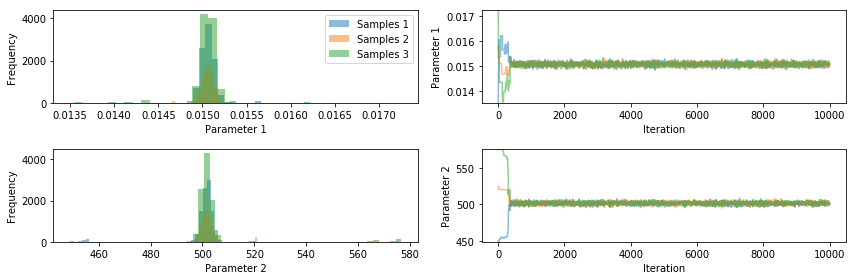

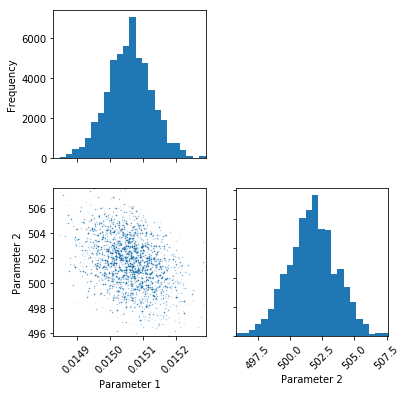

In [30]:
# Show traces and histograms
pints.plot.trace(chains)

# Discard warm up
chains_thin = chains[:, 2000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(chains_thin))

# Look at distribution in chain 0
pints.plot.pairwise(chains_thin[0])

# Show graphs
plt.show()

R-hat:
[1.0005782228924316, 1.0016762329238145]


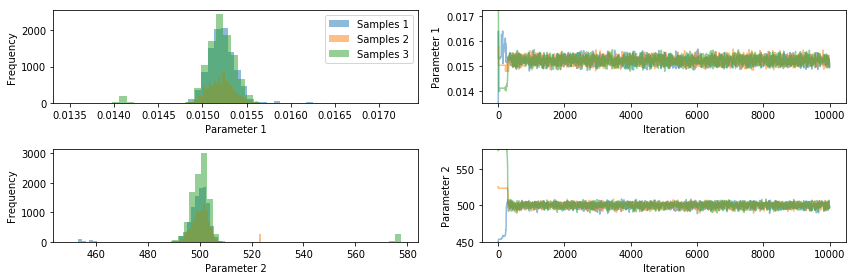

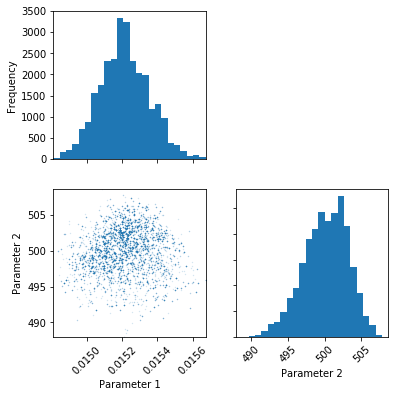

In [31]:
# Show traces and histograms
pints.plot.trace(chains_emu)

# Discard warm up
chains_emu_thin = chains_emu[:, 2000:, :]

# Check convergence using rhat criterion
print('R-hat:')
print(pints.rhat_all_params(chains_emu_thin))

# Look at distribution in chain 0
pints.plot.pairwise(chains_emu_thin[0])

# Show graphs
plt.show()

In [32]:
chain_emu = chains_emu[0]
chain_emu = chain_emu[2000:]
chain = chains[0]
chain = chain[2000:]

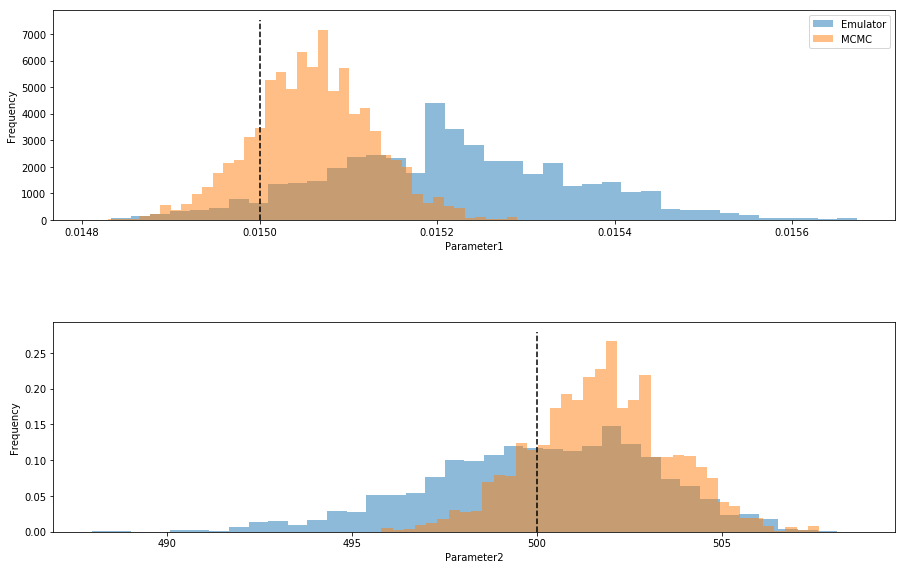

In [33]:
fig, axes = pints.plot.histogram([chain_emu, chain], ref_parameters=true_parameters, sample_names=["Emulator", "MCMC"])
fig.set_size_inches(14, 9)
plt.show()

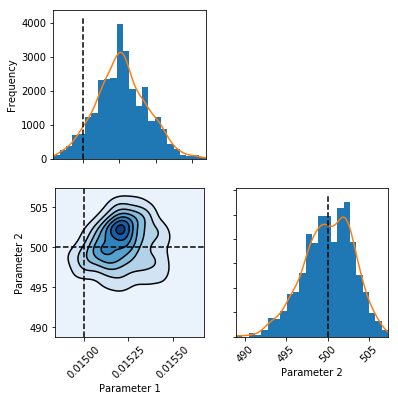

In [34]:
thinned_chain_emu = chain_emu[::10]
pints.plot.pairwise(thinned_chain_emu, kde=True, ref_parameters=true_parameters)
plt.show()

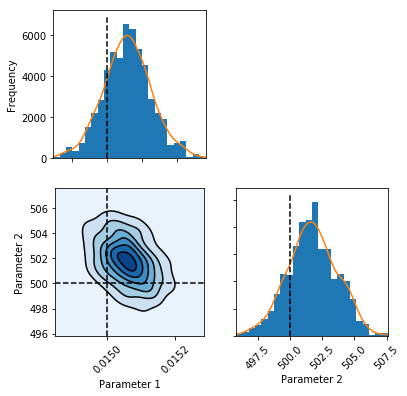

In [35]:
thinned_chain = chain[::10]
pints.plot.pairwise(thinned_chain, kde=True, ref_parameters=true_parameters)
plt.show()

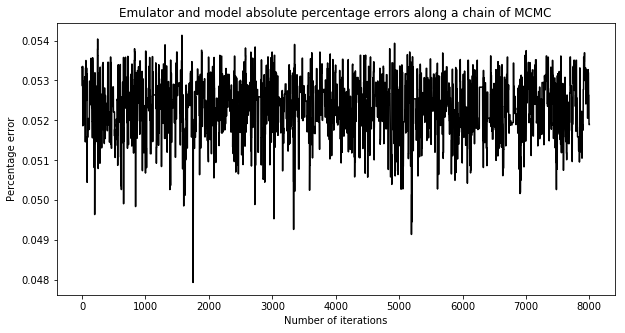

0.052359052006017336

In [36]:
emu_likelihood = np.apply_along_axis(emu, 1, chain).flatten()
model_likelihood = np.apply_along_axis(log_likelihood, 1, chain).flatten()
diffs = np.abs(model_likelihood - emu_likelihood)
percentage_error = np.abs((model_likelihood - emu_likelihood) / model_likelihood)
mean_pe = np.mean(percentage_error)

iters = np.linspace(0, 8000, len(chain))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute percentage errors along a chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Percentage error")
plt.plot(iters, percentage_error, color = "Black")
plt.show()

mean_pe

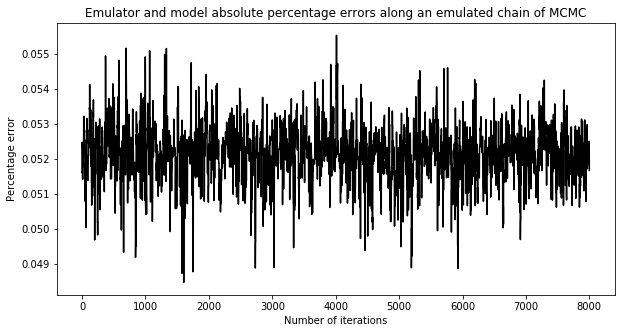

0.0521317590178231

In [37]:
emu_likelihood = np.apply_along_axis(emu, 1, chain_emu).flatten()
model_likelihood = np.apply_along_axis(log_likelihood, 1, chain).flatten()
diffs = np.abs(model_likelihood - emu_likelihood)
percentage_error = np.abs((model_likelihood - emu_likelihood) / model_likelihood)
mean_pe = np.mean(percentage_error)

iters = np.linspace(0, 8000, len(chain_emu))
plt.figure(figsize=(10, 5))
plt.title("Emulator and model absolute percentage errors along an emulated chain of MCMC")
plt.xlabel("Number of iterations")
plt.ylabel("Percentage error")
plt.plot(iters, percentage_error, color = "Black")
plt.show()

mean_pe

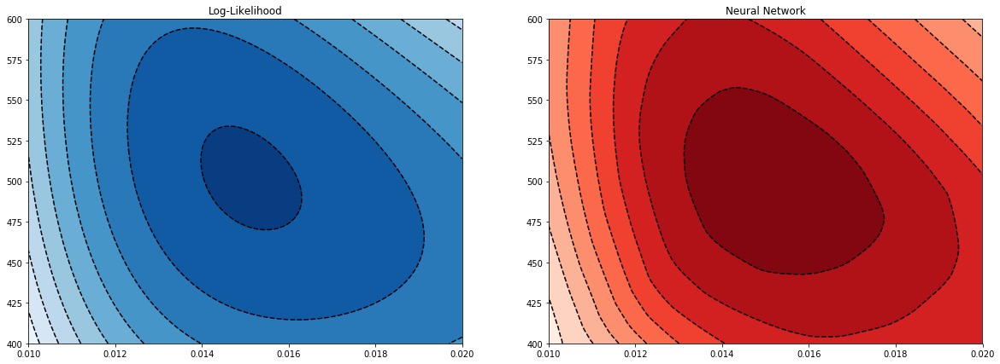

In [38]:
# Create grid of parameters
x = [p[0] for p in input_parameters]
y = [p[1] for p in input_parameters]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

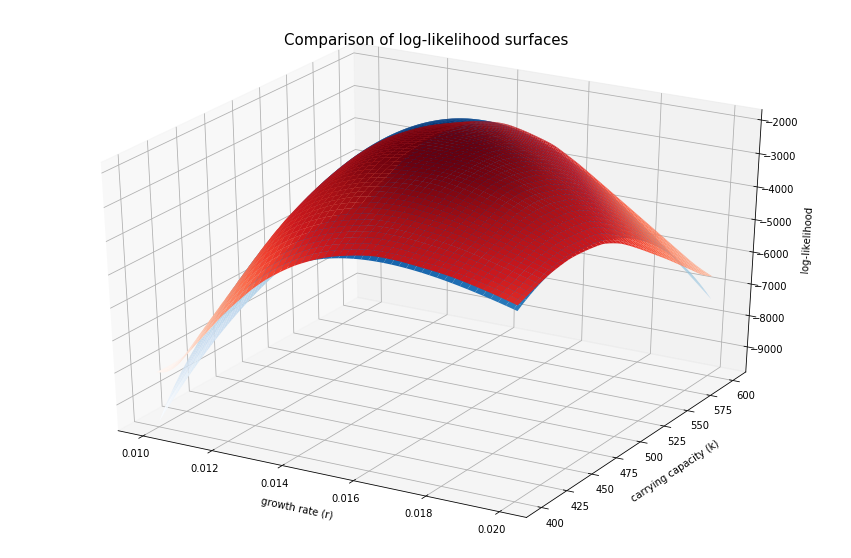

In [39]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

figsize=(20,10)
angle=(25, 300)
alpha=1.0
fontsize=10
labelpad=10

title = "Comparison of log-likelihood surfaces"
x_label = "growth rate (r)"
y_label = "carrying capacity (k)"
z_label = "log-likelihood"


fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection='3d')
ax.plot_surface(xx, yy, ll, cmap='Blues', edgecolor='none', alpha=alpha)
ax.plot_surface(xx, yy, np.array(ll_emu), cmap='Reds', edgecolor='none', alpha=alpha)
#ax.view_init(60, 35)
#ax.view_init(*angle)
#ax.set_title('surface')

plt.title(title, fontsize=fontsize*1.5)
ax.set_xlabel(x_label, fontsize=fontsize, labelpad=labelpad)
ax.set_ylabel(y_label, fontsize=fontsize, labelpad=labelpad)
ax.set_zlabel(z_label, fontsize=fontsize, labelpad=labelpad)
plt.show()

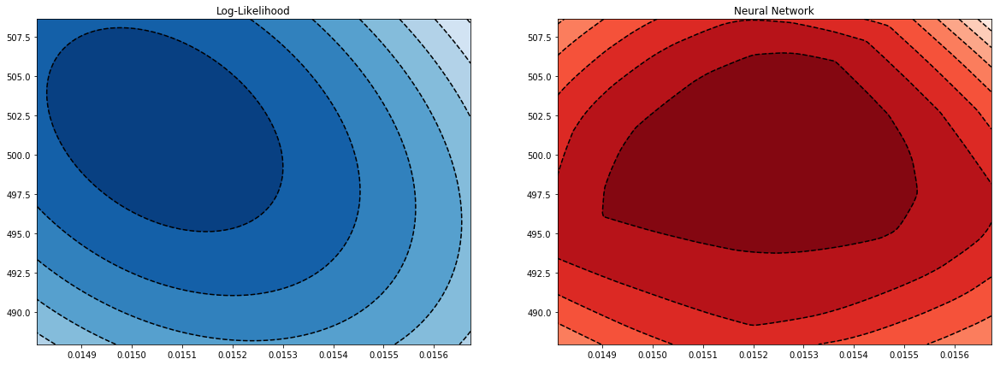

In [40]:
# Create grid of parameters
x = [p[0] for p in chain_emu]
y = [p[1] for p in chain_emu]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood')
ax2.title.set_text('Neural Network')
ax1.contourf(xx, yy, ll, cmap='Blues', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='k')
ax2.contourf(xx, yy, ll_emu, cmap='Reds', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='k')
plt.show()

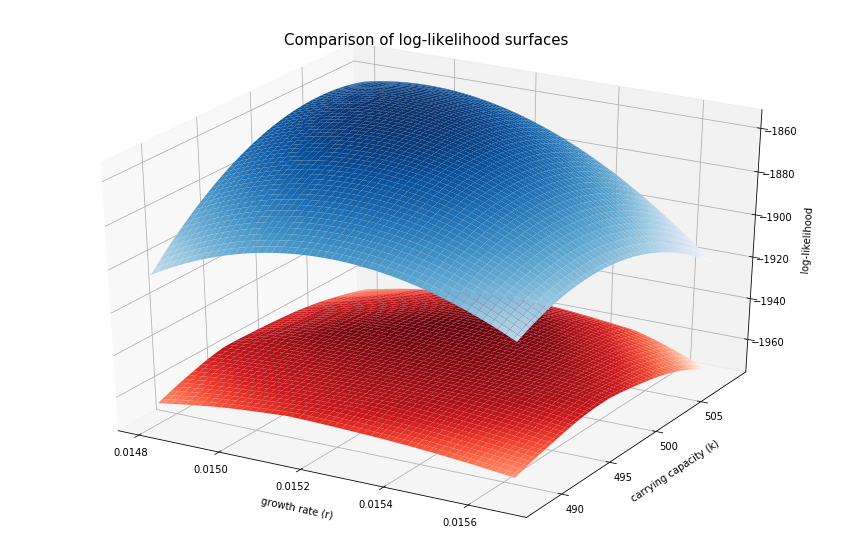

In [41]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 

figsize=(20,10)
angle=(25, 300)
alpha=1.0
fontsize=10
labelpad=10

title = "Comparison of log-likelihood surfaces"
x_label = "growth rate (r)"
y_label = "carrying capacity (k)"
z_label = "log-likelihood"


fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection='3d')
ax.plot_surface(xx, yy, ll, cmap='Blues', edgecolor='none', alpha=alpha)
ax.plot_surface(xx, yy, np.array(ll_emu), cmap='Reds', edgecolor='none', alpha=alpha)
#ax.view_init(60, 35)
#ax.view_init(*angle)
#ax.set_title('surface')

plt.title(title, fontsize=fontsize*1.5)
ax.set_xlabel(x_label, fontsize=fontsize, labelpad=labelpad)
ax.set_ylabel(y_label, fontsize=fontsize, labelpad=labelpad)
ax.set_zlabel(z_label, fontsize=fontsize, labelpad=labelpad)
plt.show()

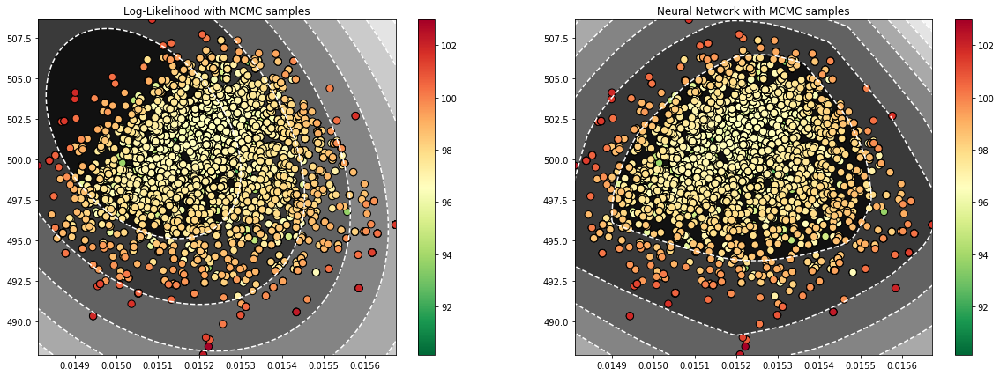

In [42]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,7))
ax1.title.set_text('Log-Likelihood with MCMC samples')
ax2.title.set_text('Neural Network with MCMC samples')                                                                  

# Create grid of parameters
x = [p[0] for p in chain_emu]
y = [p[1] for p in chain_emu]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)
ll_emu = np.apply_along_axis(emu, 1, params)
ll_emu = [list(e[0][0]) for e in ll_emu]

# Sort according to differences in log-likelihood
idx = diffs.argsort()
x_sorted = np.array(x)[idx]
y_sorted = np.array(y)[idx]
diffs_sorted = diffs[idx]

# Add contour lines of log-likelihood
ax1.contourf(xx, yy, ll, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax1.contour(xx, yy, ll, colors='w')

# Plot chain_emu    
ax1.set_xlim([xmin, xmax])                                                                           
ax1.set_ylim([ymin, ymax])
im1 = ax1.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

# Add contour lines of emulated likelihood
ax2.contourf(xx, yy, ll_emu, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
ax2.contour(xx, yy, ll_emu, colors='w')

# Plot chain_emu    
ax2.set_xlim([xmin, xmax])                                                                           
ax2.set_ylim([ymin, ymax])
im2 = ax2.scatter(x_sorted, y_sorted, c=diffs_sorted, s=70, edgecolor='k', cmap="RdYlGn_r")

fig.colorbar(im1, ax=ax1)
fig.colorbar(im2, ax=ax2)
plt.show()

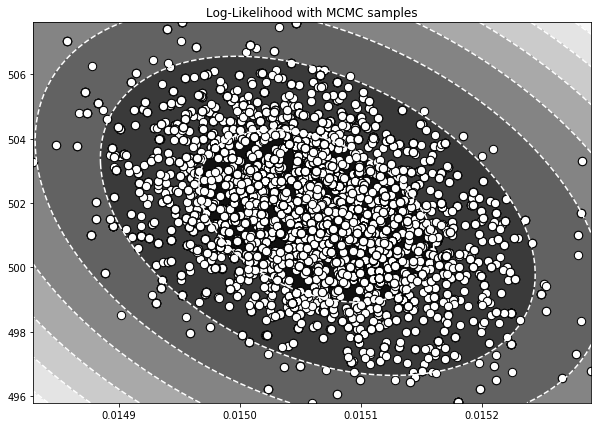

In [43]:
fig, ax = plt.subplots(figsize=(10,7))                   
ax.title.set_text('Log-Likelihood with MCMC samples')                                                                   

# Plot chain
x = [p[0] for p in chain]
y = [p[1] for p in chain]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
params = [list(n) for n in zip(xx, yy)]
ll = np.apply_along_axis(log_likelihood, 1, params)

# Add contour lines
ax.contourf(xx, yy, ll, cmap='Greys', extent=[xmin, xmax, ymin, ymax])
plt.contour(xx, yy, ll, colors='w')

# Plot chain_emu    
ax.set_xlim([xmin, xmax])                                                                           
ax.set_ylim([ymin, ymax])

ax.scatter(x, y, s=70, edgecolor='k', color='w')
plt.show()